# Table of contents
[Libraries Used](#lib)

Part I: [Read data and EDA](#DataLoading)

Part II: [Feature selection and correlation](#featureselection)

Part III: [Model selection and data training](#modelselection)

Part IV: [Exploration-Exploitation](#Exp-Exp)


In [1]:
import numpy as np
from rdkit import Chem as CH
from rdkit.Chem import Descriptors
from rdkit.Chem.rdMolDescriptors import CalcMolFormula
import pubchempy as pcp
from pymatgen.core.composition import Composition
from matminer.featurizers.composition import ElectronAffinity
from matminer.featurizers.composition import ElementFraction

import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

#Own functions

import IC_calculator

# SKlearn libraries for learning.
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold, RepeatedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import ShuffleSplit, cross_validate, train_test_split
from sklearn import linear_model 
from xgboost import XGBRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn import kernel_ridge
from sklearn.utils import resample
from sklearn.metrics import r2_score
import xgboost as xgb
import lightgbm as lgbm
from catboost import CatBoostRegressor as CBRegressor


# SKlearn libraries for evaluation.
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error
from sklearn.feature_selection import SelectFromModel

<a id="lib"></a>

# Part I: Read data and EDA

<a id="DataLoading"></a> 

## 1. Planar molecule dataset

In [2]:
planar_mol = pd.read_csv('DataSource/planar_mols_output_final.txt', index_col = None, delimiter = ' ')
smiles = planar_mol['SMILES']
cid = planar_mol['CID']
TPSA = []
aromatic_rings = []

#Getting gas-features from SMILES using rdkit
for i in range(len(smiles)):
    m = CH.MolFromSmiles(smiles[i])
    TPSA.append(Descriptors.TPSA(m))
    aromatic_rings.append(Descriptors.NumAromaticRings(m))
    

planar_mol['TPSA'] = TPSA
planar_mol['AromaticRings'] = aromatic_rings
planar_mol = planar_mol.astype({'CID' :'str'})
planar_mol    

,CID,SMILES,TPSA,AromaticRings
0,13,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1
1,65,C1=C(C(=CC(=C1Cl)O)Cl)O,40.46,1
2,66,C1=CC(=C(C=C1Cl)O)Cl,20.23,1
3,101,C1=CC(=CC(=C1)O)C=O,37.30,1
4,240,C1=CC=C(C=C1)C=O,17.07,1
...,...,...,...,...
14190,156592440,C=C1C=CC(=O)NC1=N,52.95,0
14191,156594352,C1=CC(=N)N=NC1=C(F)F,48.57,0
14192,156594966,C1=CC(=O)N=CC1=C(F)F,29.43,0
14193,156612816,C1=COC(=O)C(=C1F)F,30.21,1


## 2. 2D materials dataset

In [3]:
TwoD_mat = pd.read_csv('DataSource/Bilayer-Bulk_TotalEnergy.txt', delimiter = ',')
SepBL = pd.read_csv('DataSource/SeparatedBilayerEnergy.txt', delimiter=',')
LC = pd.read_csv('DataSource/LC.txt', delimiter = ',')
SepE = []
HalfSet = int(len(TwoD_mat)/2)

BilayerEnergy = TwoD_mat.iloc[:HalfSet,:]

name = []
for i in BilayerEnergy['Material']:
    strip_text = str(i).strip('struc_Bilayer_')
    name.append(strip_text)
    
BilayerEnergy['Name'] = pd.DataFrame(name)   
SepBL = SepBL.merge(BilayerEnergy, on=["Name"], how="left")
SepBL['SeperationE'] = SepBL['IC'] - SepBL['E']
MaterialFeatures = SepBL.merge(LC, on=["Material"], how="left")

MaterialFeatures.drop(['IC', 'E', 'Material'], axis=1, inplace=True)
MaterialFeatures['a'] = MaterialFeatures['a']/3
MaterialFeatures['b'] = MaterialFeatures['b']/3
MaterialFeatures

MatFormula = []

for i in MaterialFeatures['Name']:
    i = i.replace("Mo", "Mo18")
    i = i.replace("W", "W18")
    i = i.replace("Hf", "Hf18")
    i = i.replace("Ti", "Ti18")
    i = i.replace("Cr", "Cr18")
    i = i.replace("Zr", "Zr18")
    i = i.replace("S2", "S36")
    i = i.replace("Se2", "Se36")
    i = i.replace("Te2", "Te36")
    i = i.replace("O2", "O36")
    MatFormula.append(i)
 
MaterialFeatures['MatFormula'] = pd.DataFrame(MatFormula)
MaterialFeatures

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Name,SeperationE,a,b,c,SG,MatFormula
0,MoS2,1.766763,3.154333,3.154333,27.427,164.0,Mo18S36
1,MoSe2,2.056959,3.285000,3.285000,28.094,164.0,Mo18Se36
2,MoTe2,2.636494,3.493333,3.493333,28.999,164.0,Mo18Te36
3,MoO2,1.202318,2.828333,2.828333,25.010,164.0,Mo18O36
4,WS2,1.865270,3.162333,3.162333,27.460,164.0,W18S36
5,WSe2,2.142525,3.291667,3.291667,28.154,164.0,W18Se36
6,WTe2,2.694539,3.508333,3.508333,29.028,164.0,W18Te36
7,WO2,1.340843,2.832333,2.832333,25.022,164.0,W18O36
8,HfS2,1.844773,3.531667,3.531667,27.360,164.0,Hf18S36
9,HfSe2,2.075391,3.678000,3.678000,27.514,164.0,Hf18Se36


## 3. Intercalation data from DFT

In [4]:
IC_1 = pd.read_csv('DataSource/IC_energy1.txt', delimiter =',')
IC_2 = pd.read_csv('DataSource/IC_energy2.txt', delimiter =',')
Gas = pd.read_csv('DataSource/Energy_gas.txt' , delimiter=',')
Bilayer = pd.read_csv('DataSource/BilayerEnergy.txt', delimiter=',')

IC1 = IC_calculator.IC_calculator(IC_1, Gas, Bilayer)
IC2 = IC_calculator.IC_calculator(IC_2, Gas, Bilayer)
IC = pd.concat([IC1, IC2], axis=0).drop_duplicates()
IC

,System,Name,CID,IC_ENERGY
0,12606301_CrS2_0,CrS2,12606301,0.134932
1,12606301_CrSe2_0,CrSe2,12606301,0.466738
2,12606301_CrTe2_0,CrTe2,12606301,1.030505
3,12606301_HfS2_0,HfS2,12606301,-0.796573
4,12606301_HfSe2_0,HfSe2,12606301,-0.156093
...,...,...,...,...
115,91174071_HfO2_0,HfO2,91174071,-11.068334
116,91174071_MoO2_0,MoO2,91174071,-0.556464
117,91174071_TiO2_0,TiO2,91174071,-7.682355
118,91174071_WO2_0,WO2,91174071,-0.409851


## 4. Merging the three datasets above

In [5]:
Merge_2_3 = IC.merge(MaterialFeatures, on=["Name"], how="right")
FinalSet = Merge_2_3.merge(planar_mol, on=["CID"], how="left")
FinalSet = FinalSet[FinalSet.CID != '88957274']

## We want the fractional composition of constituent elements as features. 
## The following lines do that...

gas_formula = []
for i in FinalSet['SMILES']:
    m = CH.MolFromSmiles(i)
    gas_formula.append(CalcMolFormula(m))

FinalSet['Gas_Formula'] = gas_formula
FinalSet['CompoundFormula'] = FinalSet['MatFormula']+FinalSet['Gas_Formula']

Comp = []
for i in FinalSet['CompoundFormula']:
    Comp.append(Composition(i))
    
FinalSet['Composition'] = Comp
from matminer.featurizers.composition import ElementFraction
from matminer.featurizers.composition import Stoichiometry

FinalSet = ElementFraction().featurize_dataframe(FinalSet, 'Composition')

### Making a copy of Final Set with 'Name', 'SMILES', 'CID'. 
### This is for when we use Final Set and merge it with PredictionSet to make ExploitSet
MergeWithPredictionSet = FinalSet.drop(['b', 'SG', 'c', 'Composition','Gas_Formula', 'CompoundFormula', 'MatFormula'], axis = 1)

FinalSet = FinalSet.drop(['b', 'SMILES', 'SG', 'c', 'Composition', 'Name', 'CID','Gas_Formula', 'CompoundFormula', 'MatFormula'], axis = 1)

## For plotting feature correlation
PlotSet = FinalSet.loc[:, (FinalSet != 0).any(axis=0)] 

FinalSet =FinalSet[FinalSet['IC_ENERGY'] < 10]
FinalSet =FinalSet[FinalSet['IC_ENERGY'] > -4]

ElementFraction:   0%|          | 0/456 [00:00<?, ?it/s]

In [6]:
FinalSet

,System,IC_ENERGY,SeperationE,a,TPSA,AromaticRings,H,He,Li,Be,...,Pu,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr
0,12606301_MoS2_0,0.344366,1.766763,3.154333,0.00,2,0.098592,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,134600226_MoS2_0,-0.027874,1.766763,3.154333,12.03,1,0.084507,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,137161100_MoS2_0,0.435827,1.766763,3.154333,63.05,2,0.044118,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,137194105_MoS2_0,0.374955,1.766763,3.154333,36.21,0,0.085714,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,13837715_MoS2_0,0.366414,1.766763,3.154333,42.85,2,0.030303,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,69903064_ZrTe2_0,0.588294,2.625600,3.495000,87.96,0,0.015625,0,0,0,...,0,0,0,0,0,0,0,0,0,0
456,83382722_ZrTe2_0,0.699055,2.625600,3.495000,30.19,2,0.058824,0,0,0,...,0,0,0,0,0,0,0,0,0,0
457,87639233_ZrTe2_0,0.326998,2.625600,3.495000,18.46,1,0.072464,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,91174071_ZrTe2_0,0.481135,2.625600,3.495000,17.07,2,0.058824,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Part II: Feature Selection and Correlation

<a id="featureselection"></a>

Text(0.5, 1.0, 'Features Correlating with IC energy')

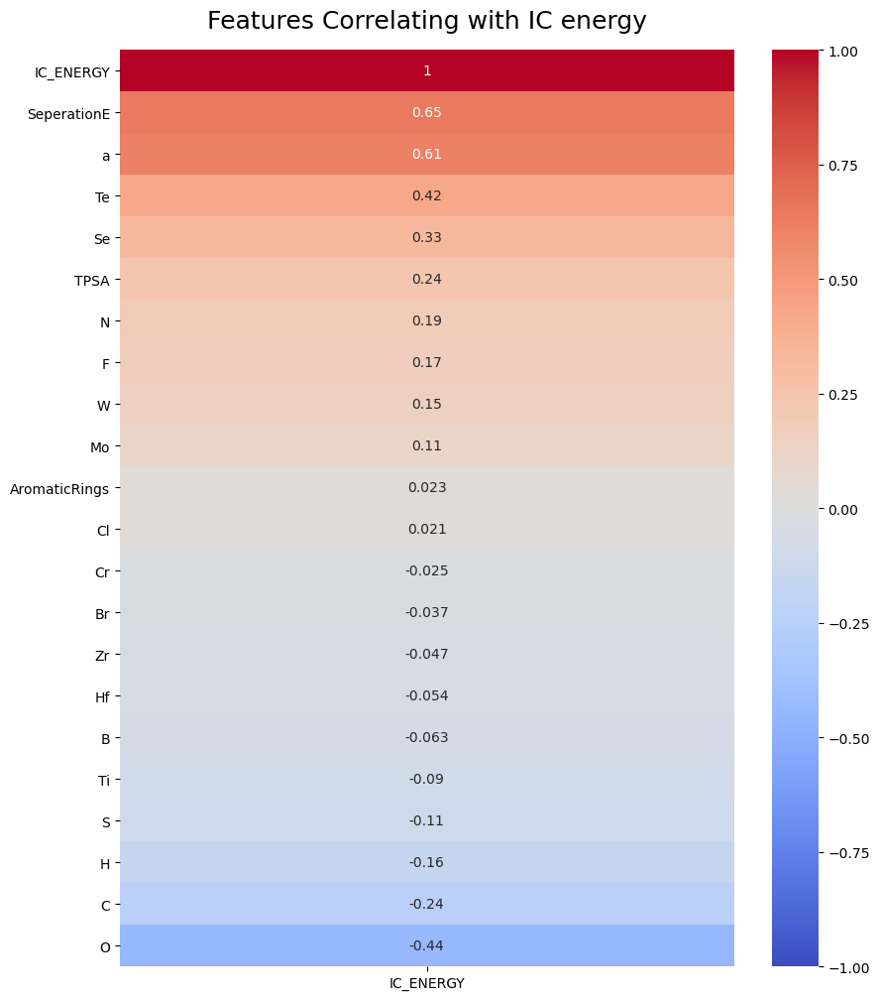

In [7]:
plt.figure(figsize=(10, 12))
matrix = (PlotSet.corr(method = 'spearman')).round(3)
matrix = matrix[~np.isnan(matrix)]


heatmap = sns.heatmap(matrix[['IC_ENERGY']].sort_values(by='IC_ENERGY', ascending=False), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Features Correlating with IC energy', fontdict={'fontsize':18}, pad=16)

# Part III: Model Selection and Data Training

<a id="modelselection"></a>

In [8]:
exclude = ['IC_ENERGY', 'System']
features = [c for c in FinalSet.columns if c not in exclude]
X = FinalSet[features]
y = FinalSet["IC_ENERGY"]

## Evaluating performance of various models

In [9]:
#Lets use train/split ratio of 70/30 - Use ShuffleSplit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)


# Use some linear reg model and some with boosting capabilities

hyper_params_lgbm = {
    "objective" : "multiclass",
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'n_estimators': 500,
    "verbosity" : -1 
}

hyper_params_xgb = { 
    'objective': 'reg:squarederror',  # error evaluation for multiclass tasks
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

hyper_params_cb = {   
    'n_estimators': 500,
    'eval_metric': mean_absolute_error
    }

#Use ShuffleSplit for cross validation of dataset. Kfold also gives similar result
cv_split = ShuffleSplit(n_splits = 5, test_size = 0.30, random_state = 42)

# Initializing the Algorithms # I have tried a couple of them. Just showing a handful here
algorithm_list = {'LinearReg': linear_model.LinearRegression(), 
                  'BayeRidge':linear_model.BayesianRidge(),
                  'LassoLars': linear_model.LassoLars(alpha=0.01),
                  'LeastAngLars':linear_model.Lars(),
                  'XgbostReg': xgb.XGBRegressor(**hyper_params_xgb),
                  'LGBMReg': lgbm.LGBMRegressor(**hyper_params_lgbm),
                  'CatBoost' : CBRegressor(),
                  'KernelRidge' : kernel_ridge.KernelRidge(alpha=1,kernel='poly',gamma=None,degree=3,coef0=1,kernel_params=None)
                 }

test_R2 = []
train_R2 = []
ad_R2 = []
CV_R2 = []
CV_R2_std = []
mse = []
mae = []
std = []
mape = []
mod = []
mod_call_name = []
ModelMetrics = pd.DataFrame()
# Fit the various model
for key,model in algorithm_list.items():
    try:
        if key == 'XgbostReg' or key == 'LGBMReg' or key == 'CatBoost':
            model.fit(X_train, y_train,early_stopping_rounds=100,eval_set=[(X_test, y_test)])
        else:
            model.fit(X_train, y_train)
        # Cross-validate the result to avoid over fitting
        cv_results = cross_validate(model, X_train, y_train, cv  = cv_split)
#        cv_results = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
        adj_R2 = 1 - (1-model.score(X_train, y_train))*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
        y_pred = model.predict(X_test) 
        # Print model and test metrics
        print(f'Model - {key: <5} || Model Score: %.3f, Adj_R^2: %.3f, Test Score: %.3f, Cross Val Score: %.3f' 
              %(model.score(X_train, y_train),adj_R2, model.score(X_test, y_test), cv_results.get('test_score').mean()))
        mod.append(key)
        test_R2.append(model.score(X_test, y_test))
        train_R2.append(model.score(X_train, y_train))
        ad_R2.append(adj_R2)
        CV_R2.append(cv_results.get('test_score').mean())
        CV_R2_std.append(cv_results.get('test_score').std())
        
        print(f'Model - {key: <5} || MSE: %.3f, MAE: %.3f, STD: %.3f, MAPE: %.3f%%' 
              %(metrics.mean_squared_error(y_test, y_pred), metrics.mean_absolute_error(y_test, y_pred), 
                cv_results.get('test_score').std(), metrics.mean_absolute_percentage_error(y_test, y_pred)*100))
        mse.append(metrics.mean_squared_error(y_test, y_pred))
        mae.append(metrics.mean_absolute_error(y_test, y_pred))
        std.append(cv_results.get('test_score').std())
        mape.append(metrics.mean_absolute_percentage_error(y_test, y_pred)*100)
        mod_call_name.append(model)
        
        print(f'Model - {key: <5}  || Cross Validation Progress: \n')
        print(pd.DataFrame(cv_results))
        print('----------------------------------------------------------------------------------------------------------')
    except Exception as e:
        print(f"Exception occurred in {str(e)}")
        pass 



ModelMetrics['Model'] = mod
ModelMetrics['Train_R2'] = train_R2
ModelMetrics['Adjusted_R2'] = ad_R2
ModelMetrics['Test_R2'] = test_R2
ModelMetrics['CV_R2'] = CV_R2
ModelMetrics['Std_in_CV'] = CV_R2_std
ModelMetrics['MSE'] = mse
ModelMetrics['MAE'] = mae
ModelMetrics['STD'] = std
ModelMetrics['MAPE'] = mape

Model - LinearReg || Model Score: 0.744, Adj_R^2: 0.586, Test Score: 0.822, Cross Val Score: 0.654
Model - LinearReg || MSE: 0.081, MAE: 0.190, STD: 0.065, MAPE: 100.410%
Model - LinearReg  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.012834    0.002708    0.700735
1  0.004749    0.002613    0.742295
2  0.011139    0.002502    0.599831
3  0.005707    0.002217    0.662954
4  0.009963    0.002283    0.562677
----------------------------------------------------------------------------------------------------------
Model - BayeRidge || Model Score: 0.668, Adj_R^2: 0.463, Test Score: 0.724, Cross Val Score: 0.603
Model - BayeRidge || MSE: 0.126, MAE: 0.256, STD: 0.071, MAPE: 156.959%
Model - BayeRidge  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.006270    0.002081    0.713347
1  0.005562    0.002011    0.658486
2  0.005468    0.002012    0.532825
3  0.005531    0.002032    0.558374
4  0.005659    0.002131    0.551220
-----------------

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  FutureWarning,
/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/sklearn/linear_model/_base.py:138: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the dat

[22]	validation_0-rmse:0.29889
[23]	validation_0-rmse:0.29831
[24]	validation_0-rmse:0.29824
[25]	validation_0-rmse:0.29826
[26]	validation_0-rmse:0.29818
[27]	validation_0-rmse:0.29740
[28]	validation_0-rmse:0.29633
[29]	validation_0-rmse:0.29548
[30]	validation_0-rmse:0.29479
[31]	validation_0-rmse:0.29477
[32]	validation_0-rmse:0.29407
[33]	validation_0-rmse:0.29384
[34]	validation_0-rmse:0.29371
[35]	validation_0-rmse:0.29335
[36]	validation_0-rmse:0.29313
[37]	validation_0-rmse:0.29290
[38]	validation_0-rmse:0.29260
[39]	validation_0-rmse:0.29229
[40]	validation_0-rmse:0.29237
[41]	validation_0-rmse:0.29221
[42]	validation_0-rmse:0.29212
[43]	validation_0-rmse:0.29213
[44]	validation_0-rmse:0.29217
[45]	validation_0-rmse:0.29186
[46]	validation_0-rmse:0.29178
[47]	validation_0-rmse:0.29171
[48]	validation_0-rmse:0.29160
[49]	validation_0-rmse:0.29128
[50]	validation_0-rmse:0.29126
[51]	validation_0-rmse:0.29104
[52]	validation_0-rmse:0.29087
[53]	validation_0-rmse:0.29072
[54]	val

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


Model - LGBMReg || Model Score: 0.981, Adj_R^2: 0.969, Test Score: 0.828, Cross Val Score: 0.732
Model - LGBMReg || MSE: 0.078, MAE: 0.163, STD: 0.049, MAPE: 86.898%
Model - LGBMReg  || Cross Validation Progress: 

   fit_time  score_time  test_score
0  0.049572    0.002351    0.806817
1  0.092063    0.002900    0.720591
2  0.055073    0.002521    0.741746
3  0.050118    0.002318    0.737192
4  0.053334    0.002314    0.653119
----------------------------------------------------------------------------------------------------------
Learning rate set to 0.041743
0:	learn: 0.6309494	test: 0.6668196	best: 0.6668196 (0)	total: 56.9ms	remaining: 56.8s
1:	learn: 0.6198536	test: 0.6555191	best: 0.6555191 (1)	total: 57.3ms	remaining: 28.6s
2:	learn: 0.6102896	test: 0.6465455	best: 0.6465455 (2)	total: 57.6ms	remaining: 19.2s
3:	learn: 0.5995677	test: 0.6350937	best: 0.6350937 (3)	total: 57.9ms	remaining: 14.4s
4:	learn: 0.5901664	test: 0.6255816	best: 0.6255816 (4)	total: 58.2ms	remaining: 11.

251:	learn: 0.1272677	test: 0.3027632	best: 0.3027632 (251)	total: 138ms	remaining: 410ms
252:	learn: 0.1266607	test: 0.3025547	best: 0.3025547 (252)	total: 139ms	remaining: 409ms
253:	learn: 0.1259383	test: 0.3018455	best: 0.3018455 (253)	total: 139ms	remaining: 408ms
254:	learn: 0.1254753	test: 0.3018045	best: 0.3018045 (254)	total: 139ms	remaining: 407ms
255:	learn: 0.1250206	test: 0.3015130	best: 0.3015130 (255)	total: 140ms	remaining: 406ms
256:	learn: 0.1243276	test: 0.3014347	best: 0.3014347 (256)	total: 140ms	remaining: 405ms
257:	learn: 0.1236980	test: 0.3008584	best: 0.3008584 (257)	total: 140ms	remaining: 404ms
258:	learn: 0.1233277	test: 0.3007580	best: 0.3007580 (258)	total: 141ms	remaining: 403ms
259:	learn: 0.1226920	test: 0.3007069	best: 0.3007069 (259)	total: 141ms	remaining: 402ms
260:	learn: 0.1223475	test: 0.3004820	best: 0.3004820 (260)	total: 142ms	remaining: 401ms
261:	learn: 0.1219699	test: 0.3004031	best: 0.3004031 (261)	total: 142ms	remaining: 400ms
262:	learn

719:	learn: 0.0325278	test: 0.2674273	best: 0.2674273 (719)	total: 305ms	remaining: 119ms
720:	learn: 0.0324890	test: 0.2674281	best: 0.2674273 (719)	total: 306ms	remaining: 118ms
721:	learn: 0.0324059	test: 0.2674525	best: 0.2674273 (719)	total: 306ms	remaining: 118ms
722:	learn: 0.0323536	test: 0.2674622	best: 0.2674273 (719)	total: 307ms	remaining: 118ms
723:	learn: 0.0322853	test: 0.2674255	best: 0.2674255 (723)	total: 307ms	remaining: 117ms
724:	learn: 0.0322438	test: 0.2674252	best: 0.2674252 (724)	total: 307ms	remaining: 117ms
725:	learn: 0.0322120	test: 0.2674214	best: 0.2674214 (725)	total: 308ms	remaining: 116ms
726:	learn: 0.0321819	test: 0.2673545	best: 0.2673545 (726)	total: 308ms	remaining: 116ms
727:	learn: 0.0321442	test: 0.2673580	best: 0.2673545 (726)	total: 308ms	remaining: 115ms
728:	learn: 0.0320775	test: 0.2673494	best: 0.2673494 (728)	total: 309ms	remaining: 115ms
729:	learn: 0.0320196	test: 0.2672901	best: 0.2672901 (729)	total: 309ms	remaining: 114ms
730:	learn

171:	learn: 0.2219752	total: 46.2ms	remaining: 222ms
172:	learn: 0.2215941	total: 46.9ms	remaining: 224ms
173:	learn: 0.2203900	total: 47.2ms	remaining: 224ms
174:	learn: 0.2197285	total: 47.4ms	remaining: 224ms
175:	learn: 0.2188780	total: 47.7ms	remaining: 223ms
176:	learn: 0.2179722	total: 48ms	remaining: 223ms
177:	learn: 0.2168726	total: 48.2ms	remaining: 223ms
178:	learn: 0.2160877	total: 48.5ms	remaining: 223ms
179:	learn: 0.2149345	total: 48.8ms	remaining: 222ms
180:	learn: 0.2144733	total: 49.1ms	remaining: 222ms
181:	learn: 0.2133791	total: 49.4ms	remaining: 222ms
182:	learn: 0.2121545	total: 49.7ms	remaining: 222ms
183:	learn: 0.2115394	total: 50ms	remaining: 222ms
184:	learn: 0.2105283	total: 50.2ms	remaining: 221ms
185:	learn: 0.2099963	total: 50.5ms	remaining: 221ms
186:	learn: 0.2090043	total: 50.8ms	remaining: 221ms
187:	learn: 0.2087012	total: 51.1ms	remaining: 221ms
188:	learn: 0.2074686	total: 51.4ms	remaining: 220ms
189:	learn: 0.2068015	total: 51.6ms	remaining: 220

621:	learn: 0.0546607	total: 180ms	remaining: 109ms
622:	learn: 0.0546044	total: 180ms	remaining: 109ms
623:	learn: 0.0545314	total: 181ms	remaining: 109ms
624:	learn: 0.0544325	total: 181ms	remaining: 108ms
625:	learn: 0.0544042	total: 181ms	remaining: 108ms
626:	learn: 0.0542686	total: 182ms	remaining: 108ms
627:	learn: 0.0541191	total: 182ms	remaining: 108ms
628:	learn: 0.0539588	total: 182ms	remaining: 107ms
629:	learn: 0.0539352	total: 182ms	remaining: 107ms
630:	learn: 0.0538266	total: 183ms	remaining: 107ms
631:	learn: 0.0536911	total: 183ms	remaining: 107ms
632:	learn: 0.0535254	total: 183ms	remaining: 106ms
633:	learn: 0.0533799	total: 183ms	remaining: 106ms
634:	learn: 0.0532782	total: 184ms	remaining: 106ms
635:	learn: 0.0532520	total: 184ms	remaining: 105ms
636:	learn: 0.0531348	total: 184ms	remaining: 105ms
637:	learn: 0.0530050	total: 185ms	remaining: 105ms
638:	learn: 0.0528955	total: 185ms	remaining: 104ms
639:	learn: 0.0527461	total: 185ms	remaining: 104ms
640:	learn: 

31:	learn: 0.4758854	total: 14.3ms	remaining: 433ms
32:	learn: 0.4727620	total: 15.2ms	remaining: 444ms
33:	learn: 0.4686000	total: 15.5ms	remaining: 442ms
34:	learn: 0.4653558	total: 16ms	remaining: 441ms
35:	learn: 0.4627902	total: 16.5ms	remaining: 441ms
36:	learn: 0.4591809	total: 16.9ms	remaining: 439ms
37:	learn: 0.4560378	total: 17.4ms	remaining: 440ms
38:	learn: 0.4529595	total: 17.9ms	remaining: 442ms
39:	learn: 0.4500468	total: 18.4ms	remaining: 442ms
40:	learn: 0.4464233	total: 18.8ms	remaining: 440ms
41:	learn: 0.4432225	total: 19.3ms	remaining: 440ms
42:	learn: 0.4403203	total: 19.7ms	remaining: 439ms
43:	learn: 0.4367511	total: 20.2ms	remaining: 439ms
44:	learn: 0.4330850	total: 20.8ms	remaining: 440ms
45:	learn: 0.4294698	total: 21.3ms	remaining: 443ms
46:	learn: 0.4261945	total: 21.8ms	remaining: 442ms
47:	learn: 0.4230635	total: 22.2ms	remaining: 440ms
48:	learn: 0.4209900	total: 22.5ms	remaining: 437ms
49:	learn: 0.4186518	total: 22.9ms	remaining: 434ms
50:	learn: 0.4

432:	learn: 0.0939308	total: 166ms	remaining: 217ms
433:	learn: 0.0935801	total: 166ms	remaining: 217ms
434:	learn: 0.0933356	total: 166ms	remaining: 216ms
435:	learn: 0.0929997	total: 167ms	remaining: 216ms
436:	learn: 0.0926261	total: 167ms	remaining: 215ms
437:	learn: 0.0922999	total: 167ms	remaining: 215ms
438:	learn: 0.0919403	total: 168ms	remaining: 214ms
439:	learn: 0.0916658	total: 168ms	remaining: 214ms
440:	learn: 0.0913891	total: 168ms	remaining: 213ms
441:	learn: 0.0911996	total: 168ms	remaining: 213ms
442:	learn: 0.0908972	total: 169ms	remaining: 212ms
443:	learn: 0.0906670	total: 169ms	remaining: 212ms
444:	learn: 0.0903635	total: 169ms	remaining: 211ms
445:	learn: 0.0901524	total: 170ms	remaining: 211ms
446:	learn: 0.0899005	total: 170ms	remaining: 210ms
447:	learn: 0.0896280	total: 170ms	remaining: 210ms
448:	learn: 0.0894217	total: 171ms	remaining: 209ms
449:	learn: 0.0890806	total: 171ms	remaining: 209ms
450:	learn: 0.0888072	total: 171ms	remaining: 208ms
451:	learn: 

Learning rate set to 0.031674
0:	learn: 0.5744973	total: 474us	remaining: 474ms
1:	learn: 0.5672043	total: 879us	remaining: 439ms
2:	learn: 0.5611819	total: 1.19ms	remaining: 395ms
3:	learn: 0.5538982	total: 1.53ms	remaining: 382ms
4:	learn: 0.5450461	total: 1.99ms	remaining: 396ms
5:	learn: 0.5383910	total: 2.34ms	remaining: 388ms
6:	learn: 0.5308182	total: 2.72ms	remaining: 386ms
7:	learn: 0.5249874	total: 3.1ms	remaining: 385ms
8:	learn: 0.5192022	total: 3.45ms	remaining: 380ms
9:	learn: 0.5127220	total: 3.8ms	remaining: 376ms
10:	learn: 0.5068475	total: 4.09ms	remaining: 368ms
11:	learn: 0.5019799	total: 4.42ms	remaining: 364ms
12:	learn: 0.4947994	total: 4.76ms	remaining: 362ms
13:	learn: 0.4891552	total: 5.09ms	remaining: 359ms
14:	learn: 0.4842043	total: 5.51ms	remaining: 362ms
15:	learn: 0.4785313	total: 5.81ms	remaining: 358ms
16:	learn: 0.4738343	total: 6.13ms	remaining: 355ms
17:	learn: 0.4691413	total: 6.44ms	remaining: 352ms
18:	learn: 0.4652047	total: 6.77ms	remaining: 35

566:	learn: 0.0498676	total: 168ms	remaining: 129ms
567:	learn: 0.0497523	total: 169ms	remaining: 128ms
568:	learn: 0.0496638	total: 169ms	remaining: 128ms
569:	learn: 0.0495286	total: 169ms	remaining: 128ms
570:	learn: 0.0493914	total: 170ms	remaining: 127ms
571:	learn: 0.0491839	total: 170ms	remaining: 127ms
572:	learn: 0.0490767	total: 170ms	remaining: 127ms
573:	learn: 0.0489164	total: 170ms	remaining: 127ms
574:	learn: 0.0487848	total: 171ms	remaining: 126ms
575:	learn: 0.0486092	total: 171ms	remaining: 126ms
576:	learn: 0.0484790	total: 172ms	remaining: 126ms
577:	learn: 0.0483934	total: 172ms	remaining: 125ms
578:	learn: 0.0482925	total: 172ms	remaining: 125ms
579:	learn: 0.0481752	total: 172ms	remaining: 125ms
580:	learn: 0.0480619	total: 173ms	remaining: 125ms
581:	learn: 0.0479733	total: 173ms	remaining: 124ms
582:	learn: 0.0478956	total: 173ms	remaining: 124ms
583:	learn: 0.0477157	total: 174ms	remaining: 124ms
584:	learn: 0.0476159	total: 174ms	remaining: 123ms
585:	learn: 

56:	learn: 0.3741620	total: 18.4ms	remaining: 305ms
57:	learn: 0.3713152	total: 19ms	remaining: 308ms
58:	learn: 0.3690755	total: 19.2ms	remaining: 307ms
59:	learn: 0.3660275	total: 19.6ms	remaining: 306ms
60:	learn: 0.3636070	total: 19.8ms	remaining: 305ms
61:	learn: 0.3609798	total: 20.2ms	remaining: 306ms
62:	learn: 0.3586492	total: 20.6ms	remaining: 306ms
63:	learn: 0.3561215	total: 20.9ms	remaining: 306ms
64:	learn: 0.3543107	total: 21.2ms	remaining: 305ms
65:	learn: 0.3515502	total: 21.5ms	remaining: 305ms
66:	learn: 0.3489739	total: 21.8ms	remaining: 304ms
67:	learn: 0.3472369	total: 22.2ms	remaining: 304ms
68:	learn: 0.3448566	total: 22.5ms	remaining: 304ms
69:	learn: 0.3434631	total: 22.9ms	remaining: 305ms
70:	learn: 0.3415742	total: 23.3ms	remaining: 305ms
71:	learn: 0.3399908	total: 23.6ms	remaining: 305ms
72:	learn: 0.3375877	total: 23.9ms	remaining: 304ms
73:	learn: 0.3356978	total: 24.2ms	remaining: 303ms
74:	learn: 0.3343341	total: 24.6ms	remaining: 303ms
75:	learn: 0.3

468:	learn: 0.0790713	total: 152ms	remaining: 172ms
469:	learn: 0.0788148	total: 153ms	remaining: 172ms
470:	learn: 0.0785790	total: 153ms	remaining: 172ms
471:	learn: 0.0783836	total: 154ms	remaining: 172ms
472:	learn: 0.0783003	total: 154ms	remaining: 172ms
473:	learn: 0.0782112	total: 155ms	remaining: 172ms
474:	learn: 0.0780333	total: 155ms	remaining: 171ms
475:	learn: 0.0778269	total: 155ms	remaining: 171ms
476:	learn: 0.0775542	total: 156ms	remaining: 171ms
477:	learn: 0.0773995	total: 156ms	remaining: 170ms
478:	learn: 0.0772413	total: 156ms	remaining: 170ms
479:	learn: 0.0769801	total: 157ms	remaining: 170ms
480:	learn: 0.0768072	total: 157ms	remaining: 170ms
481:	learn: 0.0765670	total: 158ms	remaining: 170ms
482:	learn: 0.0764382	total: 158ms	remaining: 169ms
483:	learn: 0.0761284	total: 159ms	remaining: 169ms
484:	learn: 0.0758850	total: 159ms	remaining: 169ms
485:	learn: 0.0756206	total: 160ms	remaining: 169ms
486:	learn: 0.0754691	total: 160ms	remaining: 168ms
487:	learn: 

Learning rate set to 0.031674
0:	learn: 0.6599192	total: 385us	remaining: 385ms
1:	learn: 0.6512583	total: 753us	remaining: 376ms
2:	learn: 0.6424530	total: 1.08ms	remaining: 359ms
3:	learn: 0.6328529	total: 1.44ms	remaining: 358ms
4:	learn: 0.6228353	total: 1.72ms	remaining: 343ms
5:	learn: 0.6150685	total: 2ms	remaining: 332ms
6:	learn: 0.6079753	total: 2.38ms	remaining: 338ms
7:	learn: 0.6011088	total: 2.73ms	remaining: 338ms
8:	learn: 0.5941041	total: 3.06ms	remaining: 337ms
9:	learn: 0.5877246	total: 3.31ms	remaining: 327ms
10:	learn: 0.5810903	total: 3.68ms	remaining: 331ms
11:	learn: 0.5746125	total: 4ms	remaining: 330ms
12:	learn: 0.5702496	total: 4.28ms	remaining: 325ms
13:	learn: 0.5638348	total: 4.58ms	remaining: 323ms
14:	learn: 0.5572192	total: 4.87ms	remaining: 320ms
15:	learn: 0.5502586	total: 5.11ms	remaining: 314ms
16:	learn: 0.5448943	total: 5.44ms	remaining: 314ms
17:	learn: 0.5397350	total: 5.73ms	remaining: 313ms
18:	learn: 0.5337690	total: 6.03ms	remaining: 312ms


465:	learn: 0.0764843	total: 151ms	remaining: 173ms
466:	learn: 0.0762605	total: 151ms	remaining: 173ms
467:	learn: 0.0759692	total: 152ms	remaining: 173ms
468:	learn: 0.0757392	total: 152ms	remaining: 172ms
469:	learn: 0.0755186	total: 153ms	remaining: 172ms
470:	learn: 0.0753024	total: 153ms	remaining: 172ms
471:	learn: 0.0750783	total: 153ms	remaining: 171ms
472:	learn: 0.0748776	total: 154ms	remaining: 171ms
473:	learn: 0.0746869	total: 154ms	remaining: 171ms
474:	learn: 0.0743829	total: 155ms	remaining: 171ms
475:	learn: 0.0742187	total: 155ms	remaining: 170ms
476:	learn: 0.0739845	total: 155ms	remaining: 170ms
477:	learn: 0.0737014	total: 156ms	remaining: 170ms
478:	learn: 0.0735387	total: 156ms	remaining: 170ms
479:	learn: 0.0732657	total: 156ms	remaining: 169ms
480:	learn: 0.0729480	total: 157ms	remaining: 169ms
481:	learn: 0.0726907	total: 157ms	remaining: 169ms
482:	learn: 0.0724920	total: 157ms	remaining: 168ms
483:	learn: 0.0722870	total: 158ms	remaining: 168ms
484:	learn: 

974:	learn: 0.0221191	total: 305ms	remaining: 7.82ms
975:	learn: 0.0220966	total: 306ms	remaining: 7.51ms
976:	learn: 0.0220665	total: 306ms	remaining: 7.2ms
977:	learn: 0.0220334	total: 306ms	remaining: 6.89ms
978:	learn: 0.0219942	total: 307ms	remaining: 6.58ms
979:	learn: 0.0219576	total: 307ms	remaining: 6.27ms
980:	learn: 0.0219143	total: 307ms	remaining: 5.96ms
981:	learn: 0.0218792	total: 308ms	remaining: 5.64ms
982:	learn: 0.0218327	total: 308ms	remaining: 5.33ms
983:	learn: 0.0217679	total: 308ms	remaining: 5.01ms
984:	learn: 0.0217254	total: 309ms	remaining: 4.7ms
985:	learn: 0.0216851	total: 309ms	remaining: 4.39ms
986:	learn: 0.0216516	total: 309ms	remaining: 4.08ms
987:	learn: 0.0215943	total: 310ms	remaining: 3.76ms
988:	learn: 0.0215320	total: 310ms	remaining: 3.45ms
989:	learn: 0.0215052	total: 311ms	remaining: 3.14ms
990:	learn: 0.0214585	total: 311ms	remaining: 2.82ms
991:	learn: 0.0214177	total: 311ms	remaining: 2.51ms
992:	learn: 0.0213755	total: 312ms	remaining: 2.

In [10]:
ModelMetrics

,Model,Train_R2,Adjusted_R2,Test_R2,CV_R2,Std_in_CV,MSE,MAE,STD,MAPE
0,LinearReg,0.743679,0.586056,0.821921,6.536980e-01,6.532078e-02,0.081252,0.190006,6.532078e-02,100.410393
1,BayeRidge,0.667560,0.463128,0.724277,6.028504e-01,7.050121e-02,0.125804,0.255909,7.050121e-02,156.959474
2,LassoLars,0.356898,-0.038573,0.367646,3.522053e-01,2.896365e-02,0.288525,0.384410,2.896365e-02,112.157110
3,LeastAngLars,-6112.701080,-9872.275882,-7459.705700,-1.769776e+08,3.503467e+08,3404.101933,48.393809,3.503467e+08,21649.963780
4,XgbostReg,0.999984,0.999974,0.815711,7.233512e-01,7.488671e-02,0.084086,0.169161,7.488671e-02,101.434344
5,LGBMReg,0.980851,0.969075,0.828254,7.318929e-01,4.913636e-02,0.078363,0.162997,4.913636e-02,86.898448
6,CatBoost,0.999170,0.998659,0.846030,7.526268e-01,3.750860e-02,0.070252,0.122051,3.750860e-02,67.184108
7,KernelRidge,0.622215,0.389899,0.593680,5.005054e-01,1.516192e-02,0.185392,0.308634,1.516192e-02,126.998699


# Parity Plot of the Best Model

Learning rate set to 0.032346
0:	learn: 0.6131478	total: 426us	remaining: 426ms
1:	learn: 0.6045867	total: 815us	remaining: 407ms
2:	learn: 0.5980087	total: 1.21ms	remaining: 401ms
3:	learn: 0.5909537	total: 1.51ms	remaining: 377ms
4:	learn: 0.5841613	total: 1.87ms	remaining: 372ms
5:	learn: 0.5775886	total: 2.14ms	remaining: 355ms
6:	learn: 0.5700445	total: 2.58ms	remaining: 365ms
7:	learn: 0.5641053	total: 2.98ms	remaining: 370ms
8:	learn: 0.5566523	total: 3.47ms	remaining: 382ms
9:	learn: 0.5507070	total: 3.9ms	remaining: 386ms
10:	learn: 0.5449381	total: 4.33ms	remaining: 389ms
11:	learn: 0.5402211	total: 4.74ms	remaining: 390ms
12:	learn: 0.5345143	total: 5.15ms	remaining: 391ms
13:	learn: 0.5287685	total: 5.57ms	remaining: 392ms
14:	learn: 0.5242233	total: 5.95ms	remaining: 390ms
15:	learn: 0.5192025	total: 6.37ms	remaining: 392ms
16:	learn: 0.5138358	total: 6.83ms	remaining: 395ms
17:	learn: 0.5099210	total: 7.19ms	remaining: 392ms
18:	learn: 0.5048205	total: 7.69ms	remaining: 3

401:	learn: 0.1011357	total: 151ms	remaining: 224ms
402:	learn: 0.1007611	total: 151ms	remaining: 224ms
403:	learn: 0.1006004	total: 151ms	remaining: 223ms
404:	learn: 0.1003477	total: 152ms	remaining: 223ms
405:	learn: 0.1001599	total: 152ms	remaining: 222ms
406:	learn: 0.0998272	total: 152ms	remaining: 222ms
407:	learn: 0.0994637	total: 153ms	remaining: 222ms
408:	learn: 0.0991612	total: 153ms	remaining: 221ms
409:	learn: 0.0988543	total: 153ms	remaining: 221ms
410:	learn: 0.0986367	total: 154ms	remaining: 220ms
411:	learn: 0.0984305	total: 154ms	remaining: 220ms
412:	learn: 0.0981377	total: 154ms	remaining: 219ms
413:	learn: 0.0977538	total: 155ms	remaining: 219ms
414:	learn: 0.0973122	total: 155ms	remaining: 218ms
415:	learn: 0.0970143	total: 155ms	remaining: 218ms
416:	learn: 0.0967353	total: 156ms	remaining: 217ms
417:	learn: 0.0964593	total: 156ms	remaining: 217ms
418:	learn: 0.0962863	total: 156ms	remaining: 217ms
419:	learn: 0.0960321	total: 157ms	remaining: 216ms
420:	learn: 

927:	learn: 0.0283183	total: 321ms	remaining: 24.9ms
928:	learn: 0.0282807	total: 322ms	remaining: 24.6ms
929:	learn: 0.0282130	total: 322ms	remaining: 24.2ms
930:	learn: 0.0281666	total: 322ms	remaining: 23.9ms
931:	learn: 0.0280941	total: 323ms	remaining: 23.5ms
932:	learn: 0.0280308	total: 323ms	remaining: 23.2ms
933:	learn: 0.0279559	total: 323ms	remaining: 22.8ms
934:	learn: 0.0278996	total: 324ms	remaining: 22.5ms
935:	learn: 0.0278540	total: 324ms	remaining: 22.1ms
936:	learn: 0.0278155	total: 324ms	remaining: 21.8ms
937:	learn: 0.0277509	total: 325ms	remaining: 21.5ms
938:	learn: 0.0276783	total: 325ms	remaining: 21.1ms
939:	learn: 0.0276426	total: 325ms	remaining: 20.8ms
940:	learn: 0.0275766	total: 325ms	remaining: 20.4ms
941:	learn: 0.0275398	total: 326ms	remaining: 20.1ms
942:	learn: 0.0274849	total: 326ms	remaining: 19.7ms
943:	learn: 0.0274263	total: 326ms	remaining: 19.4ms
944:	learn: 0.0273469	total: 327ms	remaining: 19ms
945:	learn: 0.0272873	total: 327ms	remaining: 18

277:	learn: 0.1602754	total: 97.4ms	remaining: 253ms
278:	learn: 0.1597478	total: 97.8ms	remaining: 253ms
279:	learn: 0.1592159	total: 98.1ms	remaining: 252ms
280:	learn: 0.1585572	total: 98.4ms	remaining: 252ms
281:	learn: 0.1578985	total: 98.7ms	remaining: 251ms
282:	learn: 0.1570336	total: 99ms	remaining: 251ms
283:	learn: 0.1561339	total: 99.3ms	remaining: 250ms
284:	learn: 0.1554395	total: 99.6ms	remaining: 250ms
285:	learn: 0.1548531	total: 99.9ms	remaining: 250ms
286:	learn: 0.1540828	total: 100ms	remaining: 249ms
287:	learn: 0.1532248	total: 101ms	remaining: 249ms
288:	learn: 0.1528841	total: 101ms	remaining: 248ms
289:	learn: 0.1521467	total: 101ms	remaining: 248ms
290:	learn: 0.1513951	total: 102ms	remaining: 247ms
291:	learn: 0.1511817	total: 102ms	remaining: 247ms
292:	learn: 0.1507224	total: 102ms	remaining: 246ms
293:	learn: 0.1502025	total: 102ms	remaining: 246ms
294:	learn: 0.1495418	total: 103ms	remaining: 246ms
295:	learn: 0.1489822	total: 103ms	remaining: 245ms
296:	

872:	learn: 0.0359317	total: 267ms	remaining: 38.9ms
873:	learn: 0.0358758	total: 268ms	remaining: 38.6ms
874:	learn: 0.0358058	total: 268ms	remaining: 38.3ms
875:	learn: 0.0356953	total: 268ms	remaining: 38ms
876:	learn: 0.0356338	total: 269ms	remaining: 37.7ms
877:	learn: 0.0355605	total: 269ms	remaining: 37.4ms
878:	learn: 0.0354977	total: 269ms	remaining: 37.1ms
879:	learn: 0.0354362	total: 270ms	remaining: 36.8ms
880:	learn: 0.0353366	total: 270ms	remaining: 36.4ms
881:	learn: 0.0352441	total: 270ms	remaining: 36.1ms
882:	learn: 0.0352109	total: 270ms	remaining: 35.8ms
883:	learn: 0.0351659	total: 271ms	remaining: 35.5ms
884:	learn: 0.0351095	total: 271ms	remaining: 35.2ms
885:	learn: 0.0350562	total: 271ms	remaining: 34.9ms
886:	learn: 0.0349850	total: 272ms	remaining: 34.6ms
887:	learn: 0.0349121	total: 272ms	remaining: 34.3ms
888:	learn: 0.0348747	total: 272ms	remaining: 34ms
889:	learn: 0.0348041	total: 272ms	remaining: 33.7ms
890:	learn: 0.0347258	total: 273ms	remaining: 33.4

324:	learn: 0.1009416	total: 100ms	remaining: 208ms
325:	learn: 0.1005318	total: 101ms	remaining: 208ms
326:	learn: 0.1002843	total: 101ms	remaining: 208ms
327:	learn: 0.1000639	total: 101ms	remaining: 207ms
328:	learn: 0.0996917	total: 101ms	remaining: 207ms
329:	learn: 0.0991922	total: 102ms	remaining: 207ms
330:	learn: 0.0988547	total: 102ms	remaining: 206ms
331:	learn: 0.0984392	total: 102ms	remaining: 206ms
332:	learn: 0.0981871	total: 103ms	remaining: 206ms
333:	learn: 0.0979146	total: 103ms	remaining: 205ms
334:	learn: 0.0975358	total: 103ms	remaining: 205ms
335:	learn: 0.0970468	total: 103ms	remaining: 204ms
336:	learn: 0.0967913	total: 104ms	remaining: 204ms
337:	learn: 0.0964984	total: 104ms	remaining: 204ms
338:	learn: 0.0961754	total: 104ms	remaining: 204ms
339:	learn: 0.0958820	total: 105ms	remaining: 203ms
340:	learn: 0.0954734	total: 105ms	remaining: 203ms
341:	learn: 0.0952040	total: 105ms	remaining: 203ms
342:	learn: 0.0948230	total: 106ms	remaining: 202ms
343:	learn: 

927:	learn: 0.0242185	total: 270ms	remaining: 21ms
928:	learn: 0.0241739	total: 271ms	remaining: 20.7ms
929:	learn: 0.0241228	total: 271ms	remaining: 20.4ms
930:	learn: 0.0240638	total: 271ms	remaining: 20.1ms
931:	learn: 0.0240274	total: 271ms	remaining: 19.8ms
932:	learn: 0.0239879	total: 272ms	remaining: 19.5ms
933:	learn: 0.0239498	total: 272ms	remaining: 19.2ms
934:	learn: 0.0239205	total: 272ms	remaining: 18.9ms
935:	learn: 0.0238488	total: 273ms	remaining: 18.6ms
936:	learn: 0.0238122	total: 273ms	remaining: 18.4ms
937:	learn: 0.0237737	total: 273ms	remaining: 18.1ms
938:	learn: 0.0237436	total: 274ms	remaining: 17.8ms
939:	learn: 0.0237077	total: 274ms	remaining: 17.5ms
940:	learn: 0.0236705	total: 274ms	remaining: 17.2ms
941:	learn: 0.0236185	total: 274ms	remaining: 16.9ms
942:	learn: 0.0235905	total: 275ms	remaining: 16.6ms
943:	learn: 0.0235655	total: 275ms	remaining: 16.3ms
944:	learn: 0.0235623	total: 275ms	remaining: 16ms
945:	learn: 0.0235008	total: 275ms	remaining: 15.7

365:	learn: 0.1237527	total: 106ms	remaining: 184ms
366:	learn: 0.1232068	total: 107ms	remaining: 185ms
367:	learn: 0.1229222	total: 108ms	remaining: 185ms
368:	learn: 0.1225434	total: 108ms	remaining: 185ms
369:	learn: 0.1222760	total: 109ms	remaining: 185ms
370:	learn: 0.1218101	total: 109ms	remaining: 185ms
371:	learn: 0.1214073	total: 110ms	remaining: 185ms
372:	learn: 0.1209891	total: 110ms	remaining: 185ms
373:	learn: 0.1205453	total: 111ms	remaining: 185ms
374:	learn: 0.1200978	total: 111ms	remaining: 185ms
375:	learn: 0.1196953	total: 112ms	remaining: 185ms
376:	learn: 0.1192790	total: 112ms	remaining: 185ms
377:	learn: 0.1189397	total: 113ms	remaining: 185ms
378:	learn: 0.1185608	total: 113ms	remaining: 185ms
379:	learn: 0.1182152	total: 113ms	remaining: 185ms
380:	learn: 0.1179544	total: 114ms	remaining: 185ms
381:	learn: 0.1175603	total: 114ms	remaining: 185ms
382:	learn: 0.1172327	total: 115ms	remaining: 185ms
383:	learn: 0.1168617	total: 115ms	remaining: 185ms
384:	learn: 

665:	learn: 0.0537932	total: 255ms	remaining: 128ms
666:	learn: 0.0536098	total: 256ms	remaining: 128ms
667:	learn: 0.0534497	total: 256ms	remaining: 127ms
668:	learn: 0.0533132	total: 257ms	remaining: 127ms
669:	learn: 0.0531424	total: 257ms	remaining: 127ms
670:	learn: 0.0530545	total: 258ms	remaining: 126ms
671:	learn: 0.0528711	total: 258ms	remaining: 126ms
672:	learn: 0.0526968	total: 259ms	remaining: 126ms
673:	learn: 0.0525707	total: 259ms	remaining: 125ms
674:	learn: 0.0524353	total: 260ms	remaining: 125ms
675:	learn: 0.0522375	total: 261ms	remaining: 125ms
676:	learn: 0.0520493	total: 261ms	remaining: 125ms
677:	learn: 0.0519248	total: 262ms	remaining: 124ms
678:	learn: 0.0518393	total: 262ms	remaining: 124ms
679:	learn: 0.0517129	total: 263ms	remaining: 124ms
680:	learn: 0.0515997	total: 263ms	remaining: 123ms
681:	learn: 0.0514539	total: 264ms	remaining: 123ms
682:	learn: 0.0513480	total: 264ms	remaining: 123ms
683:	learn: 0.0512056	total: 265ms	remaining: 122ms
684:	learn: 

62:	learn: 0.3727758	total: 20.7ms	remaining: 308ms
63:	learn: 0.3700102	total: 21.2ms	remaining: 310ms
64:	learn: 0.3667887	total: 21.5ms	remaining: 310ms
65:	learn: 0.3642114	total: 21.9ms	remaining: 309ms
66:	learn: 0.3612844	total: 22.3ms	remaining: 310ms
67:	learn: 0.3596610	total: 22.6ms	remaining: 310ms
68:	learn: 0.3584494	total: 22.9ms	remaining: 309ms
69:	learn: 0.3565409	total: 23.2ms	remaining: 308ms
70:	learn: 0.3546557	total: 23.6ms	remaining: 308ms
71:	learn: 0.3526449	total: 23.9ms	remaining: 308ms
72:	learn: 0.3507450	total: 24.2ms	remaining: 307ms
73:	learn: 0.3489024	total: 24.5ms	remaining: 306ms
74:	learn: 0.3469667	total: 24.8ms	remaining: 306ms
75:	learn: 0.3452416	total: 25.1ms	remaining: 306ms
76:	learn: 0.3430531	total: 25.4ms	remaining: 305ms
77:	learn: 0.3416731	total: 25.7ms	remaining: 304ms
78:	learn: 0.3401019	total: 26ms	remaining: 303ms
79:	learn: 0.3380863	total: 26.3ms	remaining: 302ms
80:	learn: 0.3367078	total: 26.5ms	remaining: 301ms
81:	learn: 0.3

643:	learn: 0.0517385	total: 189ms	remaining: 104ms
644:	learn: 0.0516715	total: 189ms	remaining: 104ms
645:	learn: 0.0515124	total: 189ms	remaining: 104ms
646:	learn: 0.0514621	total: 190ms	remaining: 104ms
647:	learn: 0.0513768	total: 190ms	remaining: 103ms
648:	learn: 0.0511861	total: 191ms	remaining: 103ms
649:	learn: 0.0510542	total: 191ms	remaining: 103ms
650:	learn: 0.0510090	total: 191ms	remaining: 102ms
651:	learn: 0.0508494	total: 191ms	remaining: 102ms
652:	learn: 0.0507636	total: 192ms	remaining: 102ms
653:	learn: 0.0506405	total: 192ms	remaining: 102ms
654:	learn: 0.0505150	total: 192ms	remaining: 101ms
655:	learn: 0.0504537	total: 192ms	remaining: 101ms
656:	learn: 0.0504188	total: 193ms	remaining: 101ms
657:	learn: 0.0502408	total: 193ms	remaining: 100ms
658:	learn: 0.0501470	total: 193ms	remaining: 99.9ms
659:	learn: 0.0499868	total: 193ms	remaining: 99.7ms
660:	learn: 0.0498065	total: 194ms	remaining: 99.4ms
661:	learn: 0.0496074	total: 194ms	remaining: 99.1ms
662:	lea

201:	learn: 0.2024365	total: 54.8ms	remaining: 217ms
202:	learn: 0.2017495	total: 55.6ms	remaining: 218ms
203:	learn: 0.2008262	total: 55.9ms	remaining: 218ms
204:	learn: 0.2001683	total: 56.2ms	remaining: 218ms
205:	learn: 0.1996337	total: 56.4ms	remaining: 218ms
206:	learn: 0.1988418	total: 56.7ms	remaining: 217ms
207:	learn: 0.1979967	total: 57ms	remaining: 217ms
208:	learn: 0.1977799	total: 57.3ms	remaining: 217ms
209:	learn: 0.1970985	total: 57.6ms	remaining: 217ms
210:	learn: 0.1961867	total: 57.9ms	remaining: 216ms
211:	learn: 0.1954720	total: 58.2ms	remaining: 216ms
212:	learn: 0.1945345	total: 58.5ms	remaining: 216ms
213:	learn: 0.1935058	total: 58.8ms	remaining: 216ms
214:	learn: 0.1928946	total: 59.1ms	remaining: 216ms
215:	learn: 0.1920652	total: 59.3ms	remaining: 215ms
216:	learn: 0.1912983	total: 59.6ms	remaining: 215ms
217:	learn: 0.1904994	total: 59.9ms	remaining: 215ms
218:	learn: 0.1897512	total: 60.2ms	remaining: 215ms
219:	learn: 0.1892280	total: 60.5ms	remaining: 2

639:	learn: 0.0555211	total: 226ms	remaining: 127ms
640:	learn: 0.0554015	total: 226ms	remaining: 127ms
641:	learn: 0.0552078	total: 227ms	remaining: 126ms
642:	learn: 0.0550689	total: 227ms	remaining: 126ms
643:	learn: 0.0549425	total: 227ms	remaining: 126ms
644:	learn: 0.0548228	total: 228ms	remaining: 125ms
645:	learn: 0.0547072	total: 228ms	remaining: 125ms
646:	learn: 0.0545777	total: 228ms	remaining: 125ms
647:	learn: 0.0544326	total: 229ms	remaining: 124ms
648:	learn: 0.0543032	total: 229ms	remaining: 124ms
649:	learn: 0.0541754	total: 229ms	remaining: 124ms
650:	learn: 0.0541009	total: 230ms	remaining: 123ms
651:	learn: 0.0539642	total: 230ms	remaining: 123ms
652:	learn: 0.0537992	total: 230ms	remaining: 122ms
653:	learn: 0.0536360	total: 231ms	remaining: 122ms
654:	learn: 0.0534935	total: 231ms	remaining: 122ms
655:	learn: 0.0533387	total: 231ms	remaining: 121ms
656:	learn: 0.0532346	total: 232ms	remaining: 121ms
657:	learn: 0.0532091	total: 232ms	remaining: 121ms
658:	learn: 

122:	learn: 0.2778922	total: 35.6ms	remaining: 254ms
123:	learn: 0.2766511	total: 36.1ms	remaining: 255ms
124:	learn: 0.2754713	total: 36.4ms	remaining: 255ms
125:	learn: 0.2744090	total: 36.7ms	remaining: 255ms
126:	learn: 0.2733106	total: 37ms	remaining: 254ms
127:	learn: 0.2725211	total: 37.3ms	remaining: 254ms
128:	learn: 0.2715099	total: 37.6ms	remaining: 254ms
129:	learn: 0.2703559	total: 37.9ms	remaining: 254ms
130:	learn: 0.2695816	total: 38.2ms	remaining: 253ms
131:	learn: 0.2678992	total: 38.5ms	remaining: 253ms
132:	learn: 0.2667921	total: 38.9ms	remaining: 254ms
133:	learn: 0.2659934	total: 39.2ms	remaining: 253ms
134:	learn: 0.2646925	total: 39.5ms	remaining: 253ms
135:	learn: 0.2631736	total: 39.8ms	remaining: 253ms
136:	learn: 0.2624569	total: 40.1ms	remaining: 253ms
137:	learn: 0.2615747	total: 40.4ms	remaining: 252ms
138:	learn: 0.2604332	total: 40.7ms	remaining: 252ms
139:	learn: 0.2594454	total: 41.2ms	remaining: 253ms
140:	learn: 0.2581631	total: 41.5ms	remaining: 2

623:	learn: 0.0516598	total: 202ms	remaining: 122ms
624:	learn: 0.0515349	total: 203ms	remaining: 122ms
625:	learn: 0.0514005	total: 203ms	remaining: 121ms
626:	learn: 0.0512483	total: 203ms	remaining: 121ms
627:	learn: 0.0511176	total: 203ms	remaining: 121ms
628:	learn: 0.0510592	total: 204ms	remaining: 120ms
629:	learn: 0.0509479	total: 204ms	remaining: 120ms
630:	learn: 0.0507875	total: 204ms	remaining: 120ms
631:	learn: 0.0506188	total: 205ms	remaining: 119ms
632:	learn: 0.0504070	total: 205ms	remaining: 119ms
633:	learn: 0.0503097	total: 205ms	remaining: 119ms
634:	learn: 0.0502050	total: 206ms	remaining: 118ms
635:	learn: 0.0501364	total: 206ms	remaining: 118ms
636:	learn: 0.0500005	total: 206ms	remaining: 118ms
637:	learn: 0.0499725	total: 207ms	remaining: 117ms
638:	learn: 0.0498465	total: 207ms	remaining: 117ms
639:	learn: 0.0497549	total: 207ms	remaining: 116ms
640:	learn: 0.0496754	total: 207ms	remaining: 116ms
641:	learn: 0.0495425	total: 208ms	remaining: 116ms
642:	learn: 

90:	learn: 0.3166341	total: 44.7ms	remaining: 447ms
91:	learn: 0.3150639	total: 45.4ms	remaining: 448ms
92:	learn: 0.3136173	total: 45.8ms	remaining: 446ms
93:	learn: 0.3127253	total: 46ms	remaining: 444ms
94:	learn: 0.3112890	total: 46.4ms	remaining: 442ms
95:	learn: 0.3104192	total: 46.8ms	remaining: 441ms
96:	learn: 0.3087651	total: 47.3ms	remaining: 440ms
97:	learn: 0.3072854	total: 47.6ms	remaining: 438ms
98:	learn: 0.3053686	total: 48ms	remaining: 437ms
99:	learn: 0.3039414	total: 48.3ms	remaining: 434ms
100:	learn: 0.3025322	total: 48.7ms	remaining: 433ms
101:	learn: 0.3009608	total: 49ms	remaining: 432ms
102:	learn: 0.2996483	total: 49.4ms	remaining: 430ms
103:	learn: 0.2986872	total: 49.8ms	remaining: 429ms
104:	learn: 0.2975364	total: 50.1ms	remaining: 427ms
105:	learn: 0.2963038	total: 50.3ms	remaining: 425ms
106:	learn: 0.2946370	total: 50.7ms	remaining: 423ms
107:	learn: 0.2933398	total: 51.2ms	remaining: 423ms
108:	learn: 0.2919151	total: 51.4ms	remaining: 420ms
109:	lear

549:	learn: 0.0641323	total: 216ms	remaining: 177ms
550:	learn: 0.0639862	total: 216ms	remaining: 176ms
551:	learn: 0.0638241	total: 217ms	remaining: 176ms
552:	learn: 0.0636024	total: 217ms	remaining: 176ms
553:	learn: 0.0634902	total: 218ms	remaining: 176ms
554:	learn: 0.0633079	total: 219ms	remaining: 175ms
555:	learn: 0.0631227	total: 219ms	remaining: 175ms
556:	learn: 0.0630123	total: 219ms	remaining: 175ms
557:	learn: 0.0628642	total: 220ms	remaining: 174ms
558:	learn: 0.0627397	total: 220ms	remaining: 174ms
559:	learn: 0.0626045	total: 221ms	remaining: 173ms
560:	learn: 0.0624384	total: 221ms	remaining: 173ms
561:	learn: 0.0623325	total: 221ms	remaining: 173ms
562:	learn: 0.0621281	total: 222ms	remaining: 172ms
563:	learn: 0.0619544	total: 222ms	remaining: 172ms
564:	learn: 0.0618104	total: 222ms	remaining: 171ms
565:	learn: 0.0617142	total: 223ms	remaining: 171ms
566:	learn: 0.0615672	total: 223ms	remaining: 170ms
567:	learn: 0.0613848	total: 223ms	remaining: 170ms
568:	learn: 

Learning rate set to 0.032369
0:	learn: 0.6314083	total: 355us	remaining: 355ms
1:	learn: 0.6226554	total: 653us	remaining: 326ms
2:	learn: 0.6144658	total: 982us	remaining: 327ms
3:	learn: 0.6067022	total: 1.26ms	remaining: 314ms
4:	learn: 0.5967566	total: 1.58ms	remaining: 314ms
5:	learn: 0.5901192	total: 1.9ms	remaining: 314ms
6:	learn: 0.5834280	total: 2.2ms	remaining: 312ms
7:	learn: 0.5766572	total: 2.48ms	remaining: 308ms
8:	learn: 0.5705437	total: 2.79ms	remaining: 308ms
9:	learn: 0.5634864	total: 3.09ms	remaining: 306ms
10:	learn: 0.5565483	total: 3.36ms	remaining: 302ms
11:	learn: 0.5508905	total: 3.64ms	remaining: 300ms
12:	learn: 0.5431021	total: 3.92ms	remaining: 298ms
13:	learn: 0.5375468	total: 4.21ms	remaining: 297ms
14:	learn: 0.5323965	total: 4.51ms	remaining: 296ms
15:	learn: 0.5270406	total: 4.8ms	remaining: 295ms
16:	learn: 0.5222658	total: 5.08ms	remaining: 294ms
17:	learn: 0.5167768	total: 5.37ms	remaining: 293ms
18:	learn: 0.5124101	total: 5.58ms	remaining: 288m

522:	learn: 0.0702590	total: 168ms	remaining: 153ms
523:	learn: 0.0699756	total: 169ms	remaining: 153ms
524:	learn: 0.0699081	total: 169ms	remaining: 153ms
525:	learn: 0.0698259	total: 169ms	remaining: 153ms
526:	learn: 0.0696781	total: 170ms	remaining: 152ms
527:	learn: 0.0694845	total: 170ms	remaining: 152ms
528:	learn: 0.0694080	total: 171ms	remaining: 152ms
529:	learn: 0.0691592	total: 171ms	remaining: 152ms
530:	learn: 0.0689669	total: 171ms	remaining: 151ms
531:	learn: 0.0688261	total: 172ms	remaining: 151ms
532:	learn: 0.0686848	total: 172ms	remaining: 151ms
533:	learn: 0.0684584	total: 172ms	remaining: 150ms
534:	learn: 0.0681899	total: 173ms	remaining: 150ms
535:	learn: 0.0679501	total: 173ms	remaining: 150ms
536:	learn: 0.0677473	total: 173ms	remaining: 149ms
537:	learn: 0.0674837	total: 173ms	remaining: 149ms
538:	learn: 0.0673574	total: 174ms	remaining: 149ms
539:	learn: 0.0670705	total: 174ms	remaining: 148ms
540:	learn: 0.0669514	total: 174ms	remaining: 148ms
541:	learn: 

63:	learn: 0.3505671	total: 18.6ms	remaining: 273ms
64:	learn: 0.3486807	total: 19.1ms	remaining: 274ms
65:	learn: 0.3462398	total: 19.4ms	remaining: 274ms
66:	learn: 0.3441530	total: 19.7ms	remaining: 274ms
67:	learn: 0.3429860	total: 20ms	remaining: 274ms
68:	learn: 0.3411530	total: 20.2ms	remaining: 273ms
69:	learn: 0.3396517	total: 20.5ms	remaining: 273ms
70:	learn: 0.3376506	total: 20.9ms	remaining: 273ms
71:	learn: 0.3353037	total: 21.1ms	remaining: 273ms
72:	learn: 0.3333985	total: 21.4ms	remaining: 272ms
73:	learn: 0.3310798	total: 21.8ms	remaining: 272ms
74:	learn: 0.3294192	total: 22.1ms	remaining: 272ms
75:	learn: 0.3279239	total: 22.4ms	remaining: 272ms
76:	learn: 0.3264715	total: 22.7ms	remaining: 272ms
77:	learn: 0.3243304	total: 23ms	remaining: 271ms
78:	learn: 0.3224106	total: 23.3ms	remaining: 271ms
79:	learn: 0.3204964	total: 23.5ms	remaining: 271ms
80:	learn: 0.3181837	total: 23.8ms	remaining: 270ms
81:	learn: 0.3166827	total: 24.1ms	remaining: 270ms
82:	learn: 0.315

638:	learn: 0.0485071	total: 187ms	remaining: 105ms
639:	learn: 0.0483766	total: 187ms	remaining: 105ms
640:	learn: 0.0482953	total: 187ms	remaining: 105ms
641:	learn: 0.0482594	total: 188ms	remaining: 105ms
642:	learn: 0.0481707	total: 188ms	remaining: 104ms
643:	learn: 0.0481189	total: 188ms	remaining: 104ms
644:	learn: 0.0479862	total: 189ms	remaining: 104ms
645:	learn: 0.0478720	total: 189ms	remaining: 104ms
646:	learn: 0.0477987	total: 189ms	remaining: 103ms
647:	learn: 0.0477003	total: 190ms	remaining: 103ms
648:	learn: 0.0475673	total: 190ms	remaining: 103ms
649:	learn: 0.0474096	total: 190ms	remaining: 102ms
650:	learn: 0.0473333	total: 190ms	remaining: 102ms
651:	learn: 0.0472538	total: 191ms	remaining: 102ms
652:	learn: 0.0471695	total: 191ms	remaining: 102ms
653:	learn: 0.0470927	total: 191ms	remaining: 101ms
654:	learn: 0.0470128	total: 192ms	remaining: 101ms
655:	learn: 0.0469148	total: 192ms	remaining: 101ms
656:	learn: 0.0467954	total: 192ms	remaining: 100ms
657:	learn: 

183:	learn: 0.1987967	total: 50.7ms	remaining: 225ms
184:	learn: 0.1979410	total: 51.5ms	remaining: 227ms
185:	learn: 0.1971958	total: 51.8ms	remaining: 227ms
186:	learn: 0.1962114	total: 52.1ms	remaining: 227ms
187:	learn: 0.1949706	total: 52.5ms	remaining: 227ms
188:	learn: 0.1938476	total: 52.7ms	remaining: 226ms
189:	learn: 0.1926657	total: 53ms	remaining: 226ms
190:	learn: 0.1922149	total: 53.3ms	remaining: 226ms
191:	learn: 0.1910616	total: 53.6ms	remaining: 226ms
192:	learn: 0.1901705	total: 54ms	remaining: 226ms
193:	learn: 0.1895506	total: 54.2ms	remaining: 225ms
194:	learn: 0.1887911	total: 54.5ms	remaining: 225ms
195:	learn: 0.1881782	total: 54.8ms	remaining: 225ms
196:	learn: 0.1872711	total: 55.1ms	remaining: 225ms
197:	learn: 0.1864080	total: 55.4ms	remaining: 224ms
198:	learn: 0.1855588	total: 55.6ms	remaining: 224ms
199:	learn: 0.1847722	total: 55.9ms	remaining: 224ms
200:	learn: 0.1840809	total: 56.2ms	remaining: 224ms
201:	learn: 0.1831918	total: 56.5ms	remaining: 223

542:	learn: 0.0594027	total: 219ms	remaining: 184ms
543:	learn: 0.0592666	total: 220ms	remaining: 184ms
544:	learn: 0.0591765	total: 220ms	remaining: 184ms
545:	learn: 0.0590310	total: 221ms	remaining: 183ms
546:	learn: 0.0588966	total: 221ms	remaining: 183ms
547:	learn: 0.0587460	total: 221ms	remaining: 182ms
548:	learn: 0.0586250	total: 222ms	remaining: 182ms
549:	learn: 0.0585048	total: 222ms	remaining: 182ms
550:	learn: 0.0583461	total: 222ms	remaining: 181ms
551:	learn: 0.0582048	total: 222ms	remaining: 181ms
552:	learn: 0.0580663	total: 223ms	remaining: 180ms
553:	learn: 0.0578933	total: 223ms	remaining: 180ms
554:	learn: 0.0577786	total: 224ms	remaining: 179ms
555:	learn: 0.0575773	total: 224ms	remaining: 179ms
556:	learn: 0.0574334	total: 224ms	remaining: 178ms
557:	learn: 0.0572674	total: 225ms	remaining: 178ms
558:	learn: 0.0571089	total: 225ms	remaining: 178ms
559:	learn: 0.0569821	total: 225ms	remaining: 177ms
560:	learn: 0.0568582	total: 226ms	remaining: 177ms
561:	learn: 

13:	learn: 0.5097671	total: 4.75ms	remaining: 334ms
14:	learn: 0.5038713	total: 5.18ms	remaining: 340ms
15:	learn: 0.4987260	total: 5.47ms	remaining: 337ms
16:	learn: 0.4940876	total: 5.75ms	remaining: 333ms
17:	learn: 0.4887017	total: 6.09ms	remaining: 332ms
18:	learn: 0.4832459	total: 6.41ms	remaining: 331ms
19:	learn: 0.4782379	total: 6.74ms	remaining: 330ms
20:	learn: 0.4742058	total: 7.02ms	remaining: 327ms
21:	learn: 0.4691245	total: 7.3ms	remaining: 325ms
22:	learn: 0.4644354	total: 7.58ms	remaining: 322ms
23:	learn: 0.4589684	total: 7.84ms	remaining: 319ms
24:	learn: 0.4548878	total: 8.24ms	remaining: 321ms
25:	learn: 0.4510651	total: 8.53ms	remaining: 320ms
26:	learn: 0.4463663	total: 8.93ms	remaining: 322ms
27:	learn: 0.4408808	total: 9.24ms	remaining: 321ms
28:	learn: 0.4373078	total: 9.54ms	remaining: 319ms
29:	learn: 0.4327702	total: 9.84ms	remaining: 318ms
30:	learn: 0.4288618	total: 10.1ms	remaining: 316ms
31:	learn: 0.4243787	total: 10.4ms	remaining: 314ms
32:	learn: 0.

596:	learn: 0.0546455	total: 173ms	remaining: 117ms
597:	learn: 0.0545782	total: 174ms	remaining: 117ms
598:	learn: 0.0544487	total: 174ms	remaining: 117ms
599:	learn: 0.0542762	total: 174ms	remaining: 116ms
600:	learn: 0.0541404	total: 175ms	remaining: 116ms
601:	learn: 0.0540844	total: 175ms	remaining: 116ms
602:	learn: 0.0539119	total: 175ms	remaining: 115ms
603:	learn: 0.0537263	total: 176ms	remaining: 115ms
604:	learn: 0.0535582	total: 176ms	remaining: 115ms
605:	learn: 0.0533856	total: 176ms	remaining: 114ms
606:	learn: 0.0532178	total: 176ms	remaining: 114ms
607:	learn: 0.0530692	total: 177ms	remaining: 114ms
608:	learn: 0.0529260	total: 177ms	remaining: 114ms
609:	learn: 0.0528523	total: 177ms	remaining: 113ms
610:	learn: 0.0526835	total: 178ms	remaining: 113ms
611:	learn: 0.0525894	total: 178ms	remaining: 113ms
612:	learn: 0.0525144	total: 178ms	remaining: 113ms
613:	learn: 0.0524378	total: 179ms	remaining: 112ms
614:	learn: 0.0522589	total: 179ms	remaining: 112ms
615:	learn: 

53:	learn: 0.4026020	total: 21.3ms	remaining: 373ms
54:	learn: 0.3999100	total: 22ms	remaining: 378ms
55:	learn: 0.3974467	total: 22.4ms	remaining: 378ms
56:	learn: 0.3946336	total: 22.8ms	remaining: 377ms
57:	learn: 0.3921705	total: 23.2ms	remaining: 376ms
58:	learn: 0.3900971	total: 23.6ms	remaining: 376ms
59:	learn: 0.3877225	total: 23.9ms	remaining: 375ms
60:	learn: 0.3849025	total: 24.3ms	remaining: 375ms
61:	learn: 0.3825325	total: 24.7ms	remaining: 373ms
62:	learn: 0.3799116	total: 25ms	remaining: 372ms
63:	learn: 0.3771446	total: 25.4ms	remaining: 371ms
64:	learn: 0.3744285	total: 25.7ms	remaining: 370ms
65:	learn: 0.3718955	total: 26.1ms	remaining: 369ms
66:	learn: 0.3697299	total: 26.4ms	remaining: 367ms
67:	learn: 0.3677716	total: 26.7ms	remaining: 367ms
68:	learn: 0.3659609	total: 27.2ms	remaining: 367ms
69:	learn: 0.3642455	total: 27.6ms	remaining: 366ms
70:	learn: 0.3621511	total: 28ms	remaining: 366ms
71:	learn: 0.3607130	total: 28.4ms	remaining: 366ms
72:	learn: 0.35919

580:	learn: 0.0593032	total: 188ms	remaining: 136ms
581:	learn: 0.0591587	total: 189ms	remaining: 135ms
582:	learn: 0.0590033	total: 189ms	remaining: 135ms
583:	learn: 0.0589131	total: 189ms	remaining: 135ms
584:	learn: 0.0587799	total: 190ms	remaining: 134ms
585:	learn: 0.0586110	total: 190ms	remaining: 134ms
586:	learn: 0.0584701	total: 190ms	remaining: 134ms
587:	learn: 0.0583213	total: 191ms	remaining: 134ms
588:	learn: 0.0581172	total: 191ms	remaining: 133ms
589:	learn: 0.0578836	total: 191ms	remaining: 133ms
590:	learn: 0.0577322	total: 192ms	remaining: 133ms
591:	learn: 0.0576608	total: 192ms	remaining: 132ms
592:	learn: 0.0575078	total: 192ms	remaining: 132ms
593:	learn: 0.0573345	total: 192ms	remaining: 132ms
594:	learn: 0.0572558	total: 193ms	remaining: 131ms
595:	learn: 0.0571175	total: 193ms	remaining: 131ms
596:	learn: 0.0570327	total: 193ms	remaining: 130ms
597:	learn: 0.0568574	total: 194ms	remaining: 130ms
598:	learn: 0.0567868	total: 194ms	remaining: 130ms
599:	learn: 

127:	learn: 0.2748098	total: 35.4ms	remaining: 241ms
128:	learn: 0.2743035	total: 35.9ms	remaining: 242ms
129:	learn: 0.2733382	total: 36.1ms	remaining: 242ms
130:	learn: 0.2724248	total: 36.4ms	remaining: 241ms
131:	learn: 0.2713785	total: 36.7ms	remaining: 241ms
132:	learn: 0.2707230	total: 37ms	remaining: 241ms
133:	learn: 0.2693250	total: 37.2ms	remaining: 241ms
134:	learn: 0.2681379	total: 37.5ms	remaining: 240ms
135:	learn: 0.2665923	total: 37.8ms	remaining: 240ms
136:	learn: 0.2653121	total: 38.1ms	remaining: 240ms
137:	learn: 0.2643520	total: 38.3ms	remaining: 240ms
138:	learn: 0.2633999	total: 38.7ms	remaining: 240ms
139:	learn: 0.2621524	total: 38.9ms	remaining: 239ms
140:	learn: 0.2610121	total: 39.2ms	remaining: 239ms
141:	learn: 0.2598901	total: 39.5ms	remaining: 239ms
142:	learn: 0.2591434	total: 39.8ms	remaining: 238ms
143:	learn: 0.2581163	total: 40ms	remaining: 238ms
144:	learn: 0.2571757	total: 40.3ms	remaining: 238ms
145:	learn: 0.2558988	total: 40.6ms	remaining: 237

640:	learn: 0.0572915	total: 204ms	remaining: 114ms
641:	learn: 0.0572421	total: 205ms	remaining: 114ms
642:	learn: 0.0571632	total: 206ms	remaining: 114ms
643:	learn: 0.0570539	total: 206ms	remaining: 114ms
644:	learn: 0.0569772	total: 206ms	remaining: 114ms
645:	learn: 0.0568920	total: 207ms	remaining: 113ms
646:	learn: 0.0567342	total: 207ms	remaining: 113ms
647:	learn: 0.0566663	total: 208ms	remaining: 113ms
648:	learn: 0.0566321	total: 208ms	remaining: 113ms
649:	learn: 0.0564299	total: 209ms	remaining: 112ms
650:	learn: 0.0562565	total: 209ms	remaining: 112ms
651:	learn: 0.0561767	total: 210ms	remaining: 112ms
652:	learn: 0.0560176	total: 210ms	remaining: 112ms
653:	learn: 0.0558609	total: 211ms	remaining: 111ms
654:	learn: 0.0557980	total: 211ms	remaining: 111ms
655:	learn: 0.0556363	total: 211ms	remaining: 111ms
656:	learn: 0.0554709	total: 212ms	remaining: 111ms
657:	learn: 0.0553739	total: 212ms	remaining: 110ms
658:	learn: 0.0552404	total: 212ms	remaining: 110ms
659:	learn: 

136:	learn: 0.2681484	total: 41.2ms	remaining: 259ms
137:	learn: 0.2672737	total: 41.7ms	remaining: 260ms
138:	learn: 0.2666001	total: 42ms	remaining: 260ms
139:	learn: 0.2649531	total: 42.3ms	remaining: 260ms
140:	learn: 0.2642621	total: 42.6ms	remaining: 259ms
141:	learn: 0.2632712	total: 42.9ms	remaining: 259ms
142:	learn: 0.2626681	total: 43.2ms	remaining: 259ms
143:	learn: 0.2622579	total: 43.5ms	remaining: 259ms
144:	learn: 0.2613851	total: 43.8ms	remaining: 258ms
145:	learn: 0.2607636	total: 44.1ms	remaining: 258ms
146:	learn: 0.2592876	total: 44.4ms	remaining: 258ms
147:	learn: 0.2580047	total: 44.7ms	remaining: 257ms
148:	learn: 0.2569304	total: 44.9ms	remaining: 257ms
149:	learn: 0.2558868	total: 45.2ms	remaining: 256ms
150:	learn: 0.2547231	total: 45.5ms	remaining: 256ms
151:	learn: 0.2541449	total: 45.8ms	remaining: 255ms
152:	learn: 0.2531843	total: 46ms	remaining: 255ms
153:	learn: 0.2525786	total: 46.3ms	remaining: 254ms
154:	learn: 0.2514543	total: 46.6ms	remaining: 254

718:	learn: 0.0459810	total: 209ms	remaining: 81.7ms
719:	learn: 0.0458425	total: 209ms	remaining: 81.4ms
720:	learn: 0.0457169	total: 210ms	remaining: 81.1ms
721:	learn: 0.0455653	total: 210ms	remaining: 80.8ms
722:	learn: 0.0454514	total: 210ms	remaining: 80.6ms
723:	learn: 0.0453605	total: 211ms	remaining: 80.3ms
724:	learn: 0.0452749	total: 211ms	remaining: 80ms
725:	learn: 0.0452334	total: 211ms	remaining: 79.7ms
726:	learn: 0.0451174	total: 212ms	remaining: 79.4ms
727:	learn: 0.0449695	total: 212ms	remaining: 79.1ms
728:	learn: 0.0448408	total: 212ms	remaining: 78.8ms
729:	learn: 0.0447493	total: 212ms	remaining: 78.6ms
730:	learn: 0.0446243	total: 213ms	remaining: 78.3ms
731:	learn: 0.0445323	total: 213ms	remaining: 78ms
732:	learn: 0.0444049	total: 213ms	remaining: 77.7ms
733:	learn: 0.0442536	total: 214ms	remaining: 77.4ms
734:	learn: 0.0441628	total: 214ms	remaining: 77.1ms
735:	learn: 0.0440211	total: 214ms	remaining: 76.8ms
736:	learn: 0.0438879	total: 214ms	remaining: 76.5

261:	learn: 0.1593553	total: 72.9ms	remaining: 205ms
262:	learn: 0.1586408	total: 73.3ms	remaining: 205ms
263:	learn: 0.1577685	total: 73.6ms	remaining: 205ms
264:	learn: 0.1573681	total: 73.9ms	remaining: 205ms
265:	learn: 0.1572166	total: 74.1ms	remaining: 205ms
266:	learn: 0.1566091	total: 74.5ms	remaining: 205ms
267:	learn: 0.1558901	total: 74.8ms	remaining: 204ms
268:	learn: 0.1554298	total: 75.1ms	remaining: 204ms
269:	learn: 0.1550773	total: 75.4ms	remaining: 204ms
270:	learn: 0.1543712	total: 75.7ms	remaining: 204ms
271:	learn: 0.1537295	total: 76ms	remaining: 203ms
272:	learn: 0.1531944	total: 76.3ms	remaining: 203ms
273:	learn: 0.1525196	total: 76.6ms	remaining: 203ms
274:	learn: 0.1518363	total: 77ms	remaining: 203ms
275:	learn: 0.1511985	total: 77.3ms	remaining: 203ms
276:	learn: 0.1507263	total: 77.6ms	remaining: 203ms
277:	learn: 0.1502624	total: 77.9ms	remaining: 202ms
278:	learn: 0.1497195	total: 78.3ms	remaining: 202ms
279:	learn: 0.1490221	total: 78.6ms	remaining: 202

752:	learn: 0.0407945	total: 243ms	remaining: 79.8ms
753:	learn: 0.0407000	total: 244ms	remaining: 79.5ms
754:	learn: 0.0406360	total: 244ms	remaining: 79.2ms
755:	learn: 0.0405563	total: 244ms	remaining: 78.8ms
756:	learn: 0.0404585	total: 244ms	remaining: 78.5ms
757:	learn: 0.0403931	total: 245ms	remaining: 78.2ms
758:	learn: 0.0402983	total: 245ms	remaining: 77.9ms
759:	learn: 0.0401735	total: 246ms	remaining: 77.6ms
760:	learn: 0.0401267	total: 246ms	remaining: 77.2ms
761:	learn: 0.0400396	total: 246ms	remaining: 76.9ms
762:	learn: 0.0399763	total: 247ms	remaining: 76.6ms
763:	learn: 0.0398653	total: 247ms	remaining: 76.2ms
764:	learn: 0.0397968	total: 247ms	remaining: 75.9ms
765:	learn: 0.0397216	total: 247ms	remaining: 75.6ms
766:	learn: 0.0395590	total: 248ms	remaining: 75.2ms
767:	learn: 0.0394687	total: 248ms	remaining: 74.9ms
768:	learn: 0.0393988	total: 248ms	remaining: 74.6ms
769:	learn: 0.0393059	total: 249ms	remaining: 74.2ms
770:	learn: 0.0392054	total: 249ms	remaining: 

265:	learn: 0.1675065	total: 78.3ms	remaining: 216ms
266:	learn: 0.1668370	total: 79ms	remaining: 217ms
267:	learn: 0.1663661	total: 79.3ms	remaining: 217ms
268:	learn: 0.1655705	total: 79.7ms	remaining: 216ms
269:	learn: 0.1648895	total: 80ms	remaining: 216ms
270:	learn: 0.1644339	total: 80.3ms	remaining: 216ms
271:	learn: 0.1637959	total: 80.6ms	remaining: 216ms
272:	learn: 0.1635493	total: 81ms	remaining: 216ms
273:	learn: 0.1627945	total: 81.3ms	remaining: 215ms
274:	learn: 0.1620694	total: 81.8ms	remaining: 216ms
275:	learn: 0.1613038	total: 82.1ms	remaining: 215ms
276:	learn: 0.1607857	total: 82.5ms	remaining: 215ms
277:	learn: 0.1602754	total: 82.8ms	remaining: 215ms
278:	learn: 0.1597478	total: 83.2ms	remaining: 215ms
279:	learn: 0.1592159	total: 83.5ms	remaining: 215ms
280:	learn: 0.1585572	total: 83.8ms	remaining: 214ms
281:	learn: 0.1578985	total: 84.3ms	remaining: 215ms
282:	learn: 0.1570336	total: 84.8ms	remaining: 215ms
283:	learn: 0.1561339	total: 85.3ms	remaining: 215ms

828:	learn: 0.0392155	total: 246ms	remaining: 50.8ms
829:	learn: 0.0391055	total: 247ms	remaining: 50.6ms
830:	learn: 0.0390014	total: 247ms	remaining: 50.3ms
831:	learn: 0.0389036	total: 248ms	remaining: 50ms
832:	learn: 0.0388018	total: 248ms	remaining: 49.7ms
833:	learn: 0.0387395	total: 248ms	remaining: 49.4ms
834:	learn: 0.0386186	total: 248ms	remaining: 49.1ms
835:	learn: 0.0385207	total: 249ms	remaining: 48.8ms
836:	learn: 0.0384420	total: 249ms	remaining: 48.5ms
837:	learn: 0.0383846	total: 249ms	remaining: 48.2ms
838:	learn: 0.0383709	total: 250ms	remaining: 47.9ms
839:	learn: 0.0383567	total: 250ms	remaining: 47.6ms
840:	learn: 0.0382710	total: 250ms	remaining: 47.3ms
841:	learn: 0.0381992	total: 251ms	remaining: 47ms
842:	learn: 0.0381323	total: 251ms	remaining: 46.7ms
843:	learn: 0.0381190	total: 251ms	remaining: 46.4ms
844:	learn: 0.0380258	total: 251ms	remaining: 46.1ms
845:	learn: 0.0379410	total: 252ms	remaining: 45.8ms
846:	learn: 0.0378731	total: 252ms	remaining: 45.5

341:	learn: 0.0952040	total: 102ms	remaining: 195ms
342:	learn: 0.0948230	total: 102ms	remaining: 196ms
343:	learn: 0.0944812	total: 103ms	remaining: 196ms
344:	learn: 0.0942785	total: 104ms	remaining: 197ms
345:	learn: 0.0940548	total: 104ms	remaining: 197ms
346:	learn: 0.0938674	total: 104ms	remaining: 196ms
347:	learn: 0.0934911	total: 105ms	remaining: 196ms
348:	learn: 0.0930345	total: 105ms	remaining: 196ms
349:	learn: 0.0925960	total: 105ms	remaining: 196ms
350:	learn: 0.0921960	total: 106ms	remaining: 196ms
351:	learn: 0.0917448	total: 106ms	remaining: 195ms
352:	learn: 0.0915536	total: 106ms	remaining: 195ms
353:	learn: 0.0912180	total: 107ms	remaining: 195ms
354:	learn: 0.0908631	total: 107ms	remaining: 194ms
355:	learn: 0.0906395	total: 107ms	remaining: 194ms
356:	learn: 0.0903120	total: 108ms	remaining: 194ms
357:	learn: 0.0899752	total: 108ms	remaining: 194ms
358:	learn: 0.0896079	total: 108ms	remaining: 194ms
359:	learn: 0.0893701	total: 109ms	remaining: 193ms
360:	learn: 

885:	learn: 0.0261063	total: 272ms	remaining: 35ms
886:	learn: 0.0260755	total: 272ms	remaining: 34.7ms
887:	learn: 0.0260625	total: 273ms	remaining: 34.4ms
888:	learn: 0.0260139	total: 273ms	remaining: 34.1ms
889:	learn: 0.0259830	total: 273ms	remaining: 33.8ms
890:	learn: 0.0259446	total: 274ms	remaining: 33.5ms
891:	learn: 0.0258950	total: 274ms	remaining: 33.2ms
892:	learn: 0.0258295	total: 274ms	remaining: 32.8ms
893:	learn: 0.0257747	total: 274ms	remaining: 32.5ms
894:	learn: 0.0257238	total: 275ms	remaining: 32.2ms
895:	learn: 0.0256894	total: 275ms	remaining: 31.9ms
896:	learn: 0.0256521	total: 275ms	remaining: 31.6ms
897:	learn: 0.0255823	total: 276ms	remaining: 31.3ms
898:	learn: 0.0255354	total: 276ms	remaining: 31ms
899:	learn: 0.0254786	total: 276ms	remaining: 30.7ms
900:	learn: 0.0253927	total: 277ms	remaining: 30.4ms
901:	learn: 0.0253238	total: 277ms	remaining: 30.1ms
902:	learn: 0.0252736	total: 277ms	remaining: 29.8ms
903:	learn: 0.0252258	total: 277ms	remaining: 29.5

131:	learn: 0.2758797	total: 54.2ms	remaining: 357ms
132:	learn: 0.2741073	total: 54.7ms	remaining: 357ms
133:	learn: 0.2728627	total: 55.1ms	remaining: 356ms
134:	learn: 0.2719820	total: 55.4ms	remaining: 355ms
135:	learn: 0.2701678	total: 55.7ms	remaining: 354ms
136:	learn: 0.2686110	total: 56.1ms	remaining: 353ms
137:	learn: 0.2675814	total: 56.4ms	remaining: 352ms
138:	learn: 0.2669790	total: 56.7ms	remaining: 351ms
139:	learn: 0.2661684	total: 57.2ms	remaining: 351ms
140:	learn: 0.2649148	total: 57.6ms	remaining: 351ms
141:	learn: 0.2638332	total: 57.9ms	remaining: 350ms
142:	learn: 0.2630432	total: 58.2ms	remaining: 349ms
143:	learn: 0.2620721	total: 58.5ms	remaining: 348ms
144:	learn: 0.2609659	total: 58.9ms	remaining: 347ms
145:	learn: 0.2598594	total: 59.2ms	remaining: 346ms
146:	learn: 0.2586559	total: 59.5ms	remaining: 345ms
147:	learn: 0.2571236	total: 59.8ms	remaining: 344ms
148:	learn: 0.2565359	total: 60.1ms	remaining: 343ms
149:	learn: 0.2557742	total: 60.4ms	remaining:

721:	learn: 0.0466591	total: 224ms	remaining: 86.1ms
722:	learn: 0.0465267	total: 224ms	remaining: 85.9ms
723:	learn: 0.0463867	total: 224ms	remaining: 85.6ms
724:	learn: 0.0462974	total: 225ms	remaining: 85.3ms
725:	learn: 0.0461574	total: 225ms	remaining: 84.9ms
726:	learn: 0.0460347	total: 225ms	remaining: 84.7ms
727:	learn: 0.0459291	total: 226ms	remaining: 84.3ms
728:	learn: 0.0458028	total: 226ms	remaining: 84ms
729:	learn: 0.0457612	total: 226ms	remaining: 83.7ms
730:	learn: 0.0456941	total: 227ms	remaining: 83.4ms
731:	learn: 0.0455753	total: 227ms	remaining: 83.1ms
732:	learn: 0.0454537	total: 227ms	remaining: 82.8ms
733:	learn: 0.0453525	total: 227ms	remaining: 82.4ms
734:	learn: 0.0452332	total: 228ms	remaining: 82.1ms
735:	learn: 0.0450825	total: 228ms	remaining: 81.8ms
736:	learn: 0.0449548	total: 228ms	remaining: 81.5ms
737:	learn: 0.0448471	total: 229ms	remaining: 81.1ms
738:	learn: 0.0446939	total: 229ms	remaining: 80.8ms
739:	learn: 0.0445818	total: 229ms	remaining: 80

234:	learn: 0.1744546	total: 70.5ms	remaining: 230ms
235:	learn: 0.1733845	total: 71ms	remaining: 230ms
236:	learn: 0.1728516	total: 71.2ms	remaining: 229ms
237:	learn: 0.1723014	total: 71.5ms	remaining: 229ms
238:	learn: 0.1714300	total: 71.8ms	remaining: 229ms
239:	learn: 0.1705943	total: 72.1ms	remaining: 228ms
240:	learn: 0.1702683	total: 72.3ms	remaining: 228ms
241:	learn: 0.1695717	total: 72.8ms	remaining: 228ms
242:	learn: 0.1686167	total: 73.1ms	remaining: 228ms
243:	learn: 0.1680557	total: 73.3ms	remaining: 227ms
244:	learn: 0.1672916	total: 73.6ms	remaining: 227ms
245:	learn: 0.1667578	total: 73.9ms	remaining: 226ms
246:	learn: 0.1659896	total: 74.2ms	remaining: 226ms
247:	learn: 0.1652423	total: 74.5ms	remaining: 226ms
248:	learn: 0.1648540	total: 74.7ms	remaining: 225ms
249:	learn: 0.1641312	total: 75ms	remaining: 225ms
250:	learn: 0.1634215	total: 75.3ms	remaining: 225ms
251:	learn: 0.1628689	total: 75.6ms	remaining: 224ms
252:	learn: 0.1622910	total: 75.9ms	remaining: 224

843:	learn: 0.0328237	total: 240ms	remaining: 44.4ms
844:	learn: 0.0327530	total: 241ms	remaining: 44.1ms
845:	learn: 0.0327166	total: 241ms	remaining: 43.9ms
846:	learn: 0.0326562	total: 241ms	remaining: 43.6ms
847:	learn: 0.0326176	total: 241ms	remaining: 43.3ms
848:	learn: 0.0325709	total: 242ms	remaining: 43ms
849:	learn: 0.0324905	total: 242ms	remaining: 42.7ms
850:	learn: 0.0324341	total: 242ms	remaining: 42.4ms
851:	learn: 0.0323742	total: 243ms	remaining: 42.1ms
852:	learn: 0.0323274	total: 243ms	remaining: 41.9ms
853:	learn: 0.0322675	total: 243ms	remaining: 41.6ms
854:	learn: 0.0322418	total: 244ms	remaining: 41.3ms
855:	learn: 0.0321610	total: 244ms	remaining: 41ms
856:	learn: 0.0321238	total: 244ms	remaining: 40.7ms
857:	learn: 0.0320217	total: 244ms	remaining: 40.5ms
858:	learn: 0.0319619	total: 245ms	remaining: 40.2ms
859:	learn: 0.0319163	total: 245ms	remaining: 39.9ms
860:	learn: 0.0318559	total: 245ms	remaining: 39.6ms
861:	learn: 0.0317961	total: 246ms	remaining: 39.3

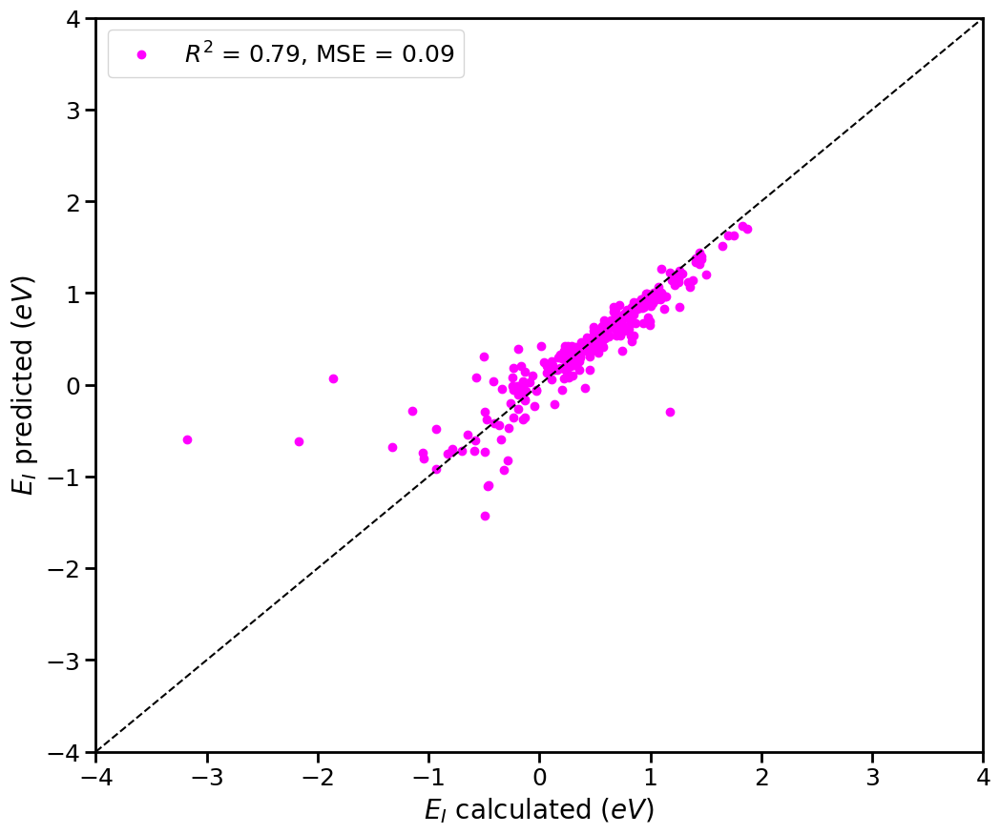

In [11]:
bestmodel = CBRegressor()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state=42)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 42 )
### Cross validation scores
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
scores = cross_val_score(bestmodel, X_train, y_train, cv = cv)
r2_mean = scores.mean()
print("%0.4f accuracy with a standard deviation of %0.4f" % (r2_mean, scores.std()))

### Cross validation predictions
yhat_bestmodel = cross_val_predict(bestmodel, X_train, y_train, cv = kfold)
Mean_sqr_error = metrics.mean_squared_error(y_train, yhat_bestmodel)
f, ax = plt.subplots(figsize=(12, 10))

# Increase axis font size
ax.tick_params(axis='both', labelsize=18)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

label_mlr = "$R^2$ = %.2f, MSE = %.2f" % (r2_mean, Mean_sqr_error)
plt.plot(y_train, yhat_bestmodel, 'o', label=label_mlr, color = "magenta")
plt.ylabel(r"$E_{I}$ predicted ($eV$)", fontsize=20)
plt.xlabel(r"$E_{I}$ calculated ($eV$)", fontsize=20)
plt.legend(fontsize=18)
plt.xlim([-4, 4])
plt.ylim([-4, 4])
plt.plot([-4, 4], [-4, 4], 'k--')
plt.show()

#f.savefig("Results_Code_1/ParityPlot", dpi = 300, transparent = False, facecolor = 'white')

## Sensitvity Analysis

Learning rate set to 0.033521
0:	learn: 0.6331063	total: 547us	remaining: 547ms
1:	learn: 0.6241152	total: 999us	remaining: 499ms
2:	learn: 0.6163003	total: 1.46ms	remaining: 485ms
3:	learn: 0.6074659	total: 1.79ms	remaining: 446ms
4:	learn: 0.5996339	total: 2.22ms	remaining: 442ms
5:	learn: 0.5914431	total: 2.7ms	remaining: 447ms
6:	learn: 0.5832660	total: 3.09ms	remaining: 439ms
7:	learn: 0.5752469	total: 3.46ms	remaining: 429ms
8:	learn: 0.5686999	total: 3.85ms	remaining: 424ms
9:	learn: 0.5619323	total: 4.24ms	remaining: 419ms
10:	learn: 0.5549210	total: 4.61ms	remaining: 415ms
11:	learn: 0.5496387	total: 5ms	remaining: 411ms
12:	learn: 0.5427834	total: 5.36ms	remaining: 407ms
13:	learn: 0.5378448	total: 5.78ms	remaining: 407ms
14:	learn: 0.5322834	total: 6.2ms	remaining: 407ms
15:	learn: 0.5256497	total: 6.61ms	remaining: 406ms
16:	learn: 0.5203999	total: 7.04ms	remaining: 407ms
17:	learn: 0.5157064	total: 7.41ms	remaining: 404ms
18:	learn: 0.5107191	total: 7.83ms	remaining: 404ms

447:	learn: 0.0836642	total: 169ms	remaining: 208ms
448:	learn: 0.0834326	total: 170ms	remaining: 208ms
449:	learn: 0.0831868	total: 170ms	remaining: 208ms
450:	learn: 0.0829859	total: 171ms	remaining: 208ms
451:	learn: 0.0827189	total: 171ms	remaining: 207ms
452:	learn: 0.0824781	total: 172ms	remaining: 207ms
453:	learn: 0.0823353	total: 172ms	remaining: 207ms
454:	learn: 0.0820753	total: 174ms	remaining: 208ms
455:	learn: 0.0819213	total: 174ms	remaining: 208ms
456:	learn: 0.0817105	total: 175ms	remaining: 208ms
457:	learn: 0.0816190	total: 175ms	remaining: 208ms
458:	learn: 0.0814820	total: 176ms	remaining: 207ms
459:	learn: 0.0813264	total: 176ms	remaining: 207ms
460:	learn: 0.0810396	total: 177ms	remaining: 207ms
461:	learn: 0.0808065	total: 177ms	remaining: 207ms
462:	learn: 0.0806324	total: 178ms	remaining: 207ms
463:	learn: 0.0805278	total: 179ms	remaining: 206ms
464:	learn: 0.0803722	total: 179ms	remaining: 206ms
465:	learn: 0.0802433	total: 179ms	remaining: 206ms
466:	learn: 

908:	learn: 0.0314825	total: 340ms	remaining: 34ms
909:	learn: 0.0314514	total: 340ms	remaining: 33.6ms
910:	learn: 0.0314200	total: 340ms	remaining: 33.3ms
911:	learn: 0.0313493	total: 341ms	remaining: 32.9ms
912:	learn: 0.0313148	total: 341ms	remaining: 32.5ms
913:	learn: 0.0312321	total: 341ms	remaining: 32.1ms
914:	learn: 0.0311857	total: 342ms	remaining: 31.7ms
915:	learn: 0.0311529	total: 342ms	remaining: 31.4ms
916:	learn: 0.0310806	total: 343ms	remaining: 31ms
917:	learn: 0.0310463	total: 343ms	remaining: 30.6ms
918:	learn: 0.0309797	total: 343ms	remaining: 30.3ms
919:	learn: 0.0309137	total: 344ms	remaining: 29.9ms
920:	learn: 0.0308968	total: 344ms	remaining: 29.5ms
921:	learn: 0.0308084	total: 344ms	remaining: 29.1ms
922:	learn: 0.0307747	total: 345ms	remaining: 28.8ms
923:	learn: 0.0307465	total: 345ms	remaining: 28.4ms
924:	learn: 0.0307137	total: 345ms	remaining: 28ms
925:	learn: 0.0306508	total: 346ms	remaining: 27.6ms
926:	learn: 0.0306160	total: 346ms	remaining: 27.3ms

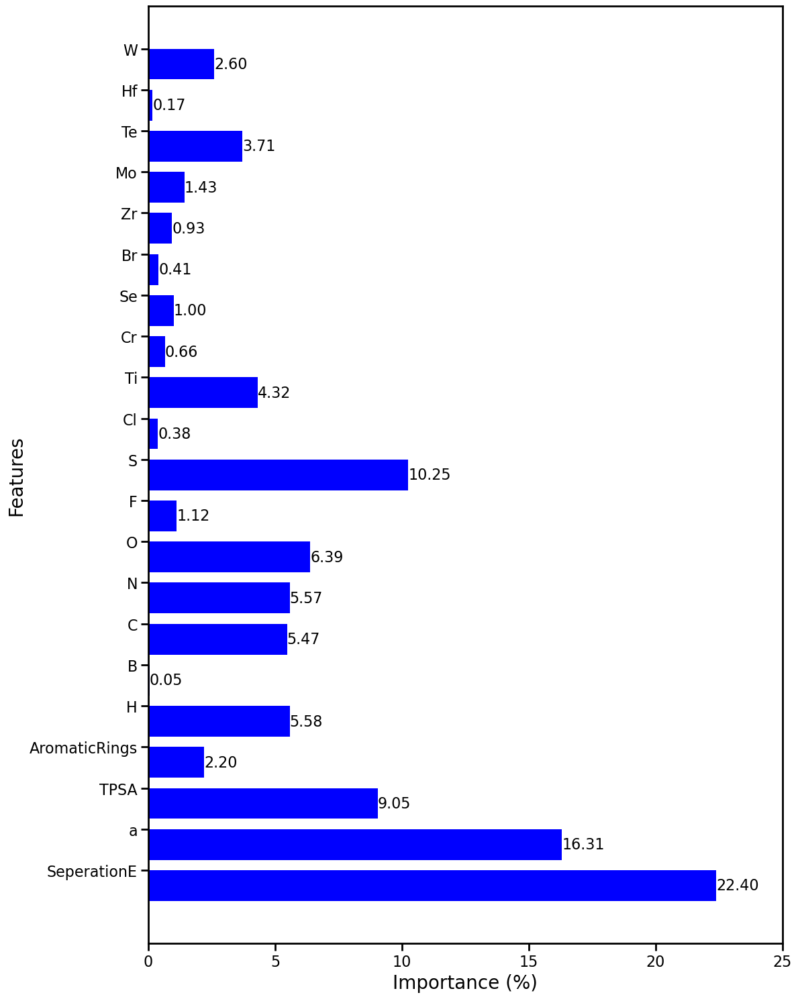

In [13]:
bestmodel.fit(X_train, y_train)
bestmodel_feature_importance = pd.DataFrame()
bestmodel_feature_importance['Feature'] = pd.DataFrame(X_test.columns)
bestmodel_feature_importance['Importance'] = pd.DataFrame(bestmodel.feature_importances_)
bestmodel_feature_importance = bestmodel_feature_importance[bestmodel_feature_importance.Importance > 0]

y = bestmodel_feature_importance.Importance
x = bestmodel_feature_importance.Feature

fig, ax = plt.subplots(figsize=(12,15))

# Increase axis font size
ax.tick_params(axis='both', labelsize=16)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

width = 0.75 # the width of the bars 
ind = np.arange(len(y))  # the x locations for the groups
ax.barh(ind, y, width, color="blue")
ax.set_yticks(ind+width/2)
ax.set_yticklabels(x, minor=False)
#plt.title('Distribution of Feature Importance')
plt.xlabel('Importance (%)', fontsize=20)
plt.ylabel('Features', fontsize=20)
plt.xlim([0, 25])

# Print the values on the barchart
ax.bar_label(ax.containers[0],label_type='edge',fmt='%.2f', fontsize = 16)

plt.tight_layout()  # Ensures that the figure fits within the specified dimensions

plt.show()
#fig.savefig("Results_Code_1/FeatImp.png", dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Part IV: Exploration-Exploitation

<a id="Exp-Exp"></a>

In [14]:
## We combined our 2D materials and gas molecules datasets 
## to make all possible hybrid material combinations. 
## And, calculated necessary features for these combinations in an auxiliary code. 

PredictionSet = pd.read_csv('PredictionSet_2')
PredictionSet

## Adding "System" column: 
PredictionSet = PredictionSet.astype({'CID' :'str'})
system = []
for i in PredictionSet.index:
    cid_name = PredictionSet.CID[i]+'_'+PredictionSet.Name[i]+'_0'
    system.append(cid_name)

PredictionSet['System'] = pd.DataFrame(system)

### Dont drop CID name and smiles
##PredictionSet = PredictionSet.copy().drop(['CID','Name','SMILES'], axis=1)
PredictionSet

/Users/sriharik/miniconda3/envs/nano281/lib/python3.7/site-packages/ipykernel_launcher.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  from ipykernel import kernelapp as app


,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,0,0,13593933_CrTe2_0
212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,0,0,13593933_CrO2_0
212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,0,0,13593933_ZrS2_0
212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0,0.092308,0,0,...,0,0,0,0,0,0,0,0,0,13593933_ZrSe2_0


In [15]:
FullSet = pd.concat([PredictionSet, MergeWithPredictionSet.drop(['IC_ENERGY'], axis = 1)], axis = 0).drop_duplicates(subset='System')
FullSet

,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,Li,...,Am,Cm,Bk,Cf,Es,Fm,Md,No,Lr,System
0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoS2_0
1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoSe2_0
2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoTe2_0
3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_MoO2_0
4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,0,...,0,0,0,0,0,0,0,0,0,13_WS2_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,68970753,ZrO2,1.869653,3.137667,C1=CNC2=C(C1=O)C=CO2,46.00,2,0.072464,0,0,...,0,0,0,0,0,0,0,0,0,68970753_ZrO2_0
475,69903064,ZrO2,1.869653,3.137667,C1(=O)C(=O)NN=NC1=O,87.96,0,0.015625,0,0,...,0,0,0,0,0,0,0,0,0,69903064_ZrO2_0
476,83382722,ZrO2,1.869653,3.137667,C1=CN2C(=CN=C2Br)C=N1,30.19,2,0.058824,0,0,...,0,0,0,0,0,0,0,0,0,83382722_ZrO2_0
477,87639233,ZrO2,1.869653,3.137667,B1=CC2=CC=CC=C2OO1,18.46,1,0.072464,0,0,...,0,0,0,0,0,0,0,0,0,87639233_ZrO2_0


### Bootstrap begins here

In [16]:
n_bs = 200
train_r2 = []
test_r2 = []
pred_r2 = []
remove_from_features = ['Name', 'SMILES', 'CID', 'System']
features = [c for c in FullSet.columns if c not in remove_from_features]
X_pred = FullSet[features]

fullset_bootstrapped_yhats = pd.DataFrame()

for i in range(n_bs):
    # Making n_bs bootstrapped samples
    train = resample(FinalSet, replace=True, n_samples=len(FinalSet), random_state=i)
    test = FinalSet[~FinalSet.index.isin(train.index)]
    
    # Split bootstrapped samples into train and test sets
    X_train = train[features]
    y_train = train["IC_ENERGY"]
    X_test = test[features]
    y_test = test["IC_ENERGY"]
    
    # Fit model on train sets
    bestmodel.fit(X_train, y_train)
    
    # Model scores
    r2_train = bestmodel.score(X_train, y_train)
    r2_test = bestmodel.score(X_test, y_test)
    train_r2.append(r2_train)
    test_r2.append(r2_test)
    
    # Predict on PredictionSet
    
    y_hat = bestmodel.predict(X_pred)
    
    #temp_df = pd.DataFrame(y_hat, columns=[])
    fullset_bootstrapped_yhats['y_pred_bs_{}'.format(i)] = y_hat
    fullset_bootstrapped_yhats = fullset_bootstrapped_yhats.copy()
    #bootstrapped_yhats[i] = pd.DataFrame(y_hat)



Learning rate set to 0.035466
0:	learn: 0.6167434	total: 508us	remaining: 508ms
1:	learn: 0.6056822	total: 898us	remaining: 449ms
2:	learn: 0.5955811	total: 1.29ms	remaining: 430ms
3:	learn: 0.5857563	total: 1.68ms	remaining: 419ms
4:	learn: 0.5760466	total: 2.08ms	remaining: 415ms
5:	learn: 0.5664463	total: 2.48ms	remaining: 411ms
6:	learn: 0.5578231	total: 2.87ms	remaining: 407ms
7:	learn: 0.5495805	total: 3.16ms	remaining: 391ms
8:	learn: 0.5419750	total: 3.52ms	remaining: 387ms
9:	learn: 0.5341251	total: 3.93ms	remaining: 389ms
10:	learn: 0.5263103	total: 4.33ms	remaining: 389ms
11:	learn: 0.5183047	total: 4.72ms	remaining: 388ms
12:	learn: 0.5115490	total: 5.07ms	remaining: 385ms
13:	learn: 0.5049226	total: 5.44ms	remaining: 383ms
14:	learn: 0.4989014	total: 5.81ms	remaining: 382ms
15:	learn: 0.4920119	total: 6.17ms	remaining: 379ms
16:	learn: 0.4854795	total: 6.59ms	remaining: 381ms
17:	learn: 0.4790570	total: 7.01ms	remaining: 382ms
18:	learn: 0.4734396	total: 7.38ms	remaining: 

551:	learn: 0.0467372	total: 169ms	remaining: 137ms
552:	learn: 0.0465471	total: 169ms	remaining: 137ms
553:	learn: 0.0463753	total: 170ms	remaining: 136ms
554:	learn: 0.0462379	total: 170ms	remaining: 136ms
555:	learn: 0.0461092	total: 170ms	remaining: 136ms
556:	learn: 0.0460084	total: 170ms	remaining: 136ms
557:	learn: 0.0459180	total: 171ms	remaining: 135ms
558:	learn: 0.0458423	total: 171ms	remaining: 135ms
559:	learn: 0.0457613	total: 171ms	remaining: 135ms
560:	learn: 0.0457059	total: 172ms	remaining: 134ms
561:	learn: 0.0455458	total: 172ms	remaining: 134ms
562:	learn: 0.0454689	total: 172ms	remaining: 134ms
563:	learn: 0.0453067	total: 173ms	remaining: 133ms
564:	learn: 0.0452233	total: 173ms	remaining: 133ms
565:	learn: 0.0451486	total: 173ms	remaining: 133ms
566:	learn: 0.0449913	total: 174ms	remaining: 133ms
567:	learn: 0.0449260	total: 174ms	remaining: 132ms
568:	learn: 0.0448610	total: 174ms	remaining: 132ms
569:	learn: 0.0447591	total: 174ms	remaining: 132ms
570:	learn: 

964:	learn: 0.0200208	total: 342ms	remaining: 12.4ms
965:	learn: 0.0200004	total: 343ms	remaining: 12.1ms
966:	learn: 0.0199704	total: 343ms	remaining: 11.7ms
967:	learn: 0.0199328	total: 343ms	remaining: 11.3ms
968:	learn: 0.0199197	total: 343ms	remaining: 11ms
969:	learn: 0.0198882	total: 344ms	remaining: 10.6ms
970:	learn: 0.0198465	total: 344ms	remaining: 10.3ms
971:	learn: 0.0198223	total: 344ms	remaining: 9.92ms
972:	learn: 0.0197866	total: 345ms	remaining: 9.56ms
973:	learn: 0.0197118	total: 345ms	remaining: 9.21ms
974:	learn: 0.0196615	total: 345ms	remaining: 8.85ms
975:	learn: 0.0196054	total: 346ms	remaining: 8.5ms
976:	learn: 0.0195898	total: 346ms	remaining: 8.14ms
977:	learn: 0.0195410	total: 346ms	remaining: 7.79ms
978:	learn: 0.0195167	total: 347ms	remaining: 7.43ms
979:	learn: 0.0194934	total: 347ms	remaining: 7.08ms
980:	learn: 0.0194417	total: 347ms	remaining: 6.72ms
981:	learn: 0.0194057	total: 347ms	remaining: 6.37ms
982:	learn: 0.0193801	total: 348ms	remaining: 6.0

207:	learn: 0.1365055	total: 80.4ms	remaining: 306ms
208:	learn: 0.1360287	total: 80.8ms	remaining: 306ms
209:	learn: 0.1353698	total: 81.1ms	remaining: 305ms
210:	learn: 0.1346416	total: 81.4ms	remaining: 305ms
211:	learn: 0.1340133	total: 81.8ms	remaining: 304ms
212:	learn: 0.1329127	total: 82.1ms	remaining: 304ms
213:	learn: 0.1321280	total: 82.6ms	remaining: 303ms
214:	learn: 0.1313815	total: 83ms	remaining: 303ms
215:	learn: 0.1306580	total: 83.4ms	remaining: 303ms
216:	learn: 0.1300284	total: 83.8ms	remaining: 302ms
217:	learn: 0.1291293	total: 84.2ms	remaining: 302ms
218:	learn: 0.1286702	total: 84.5ms	remaining: 301ms
219:	learn: 0.1280311	total: 84.8ms	remaining: 301ms
220:	learn: 0.1272533	total: 85.2ms	remaining: 300ms
221:	learn: 0.1265767	total: 85.5ms	remaining: 300ms
222:	learn: 0.1260763	total: 85.9ms	remaining: 299ms
223:	learn: 0.1255325	total: 86.3ms	remaining: 299ms
224:	learn: 0.1250048	total: 86.6ms	remaining: 298ms
225:	learn: 0.1242657	total: 86.9ms	remaining: 2

783:	learn: 0.0250130	total: 251ms	remaining: 69.2ms
784:	learn: 0.0249608	total: 252ms	remaining: 69ms
785:	learn: 0.0249252	total: 252ms	remaining: 68.7ms
786:	learn: 0.0248516	total: 253ms	remaining: 68.3ms
787:	learn: 0.0247935	total: 253ms	remaining: 68ms
788:	learn: 0.0247845	total: 253ms	remaining: 67.7ms
789:	learn: 0.0247510	total: 253ms	remaining: 67.4ms
790:	learn: 0.0247119	total: 254ms	remaining: 67ms
791:	learn: 0.0246347	total: 254ms	remaining: 66.7ms
792:	learn: 0.0245659	total: 254ms	remaining: 66.4ms
793:	learn: 0.0245224	total: 255ms	remaining: 66.1ms
794:	learn: 0.0244655	total: 255ms	remaining: 65.7ms
795:	learn: 0.0244273	total: 255ms	remaining: 65.4ms
796:	learn: 0.0243652	total: 256ms	remaining: 65.1ms
797:	learn: 0.0243567	total: 256ms	remaining: 64.8ms
798:	learn: 0.0243127	total: 256ms	remaining: 64.4ms
799:	learn: 0.0242615	total: 257ms	remaining: 64.1ms
800:	learn: 0.0242171	total: 257ms	remaining: 63.8ms
801:	learn: 0.0241600	total: 257ms	remaining: 63.5ms

131:	learn: 0.2102574	total: 41.8ms	remaining: 275ms
132:	learn: 0.2092226	total: 42.5ms	remaining: 277ms
133:	learn: 0.2080778	total: 42.8ms	remaining: 277ms
134:	learn: 0.2071905	total: 43.2ms	remaining: 277ms
135:	learn: 0.2056717	total: 43.6ms	remaining: 277ms
136:	learn: 0.2049617	total: 44ms	remaining: 277ms
137:	learn: 0.2038360	total: 44.5ms	remaining: 278ms
138:	learn: 0.2028270	total: 44.9ms	remaining: 278ms
139:	learn: 0.2020707	total: 45.2ms	remaining: 278ms
140:	learn: 0.2004152	total: 45.6ms	remaining: 278ms
141:	learn: 0.1991558	total: 46ms	remaining: 278ms
142:	learn: 0.1980845	total: 46.3ms	remaining: 277ms
143:	learn: 0.1971509	total: 46.6ms	remaining: 277ms
144:	learn: 0.1960687	total: 47ms	remaining: 277ms
145:	learn: 0.1948306	total: 47.3ms	remaining: 277ms
146:	learn: 0.1937489	total: 47.7ms	remaining: 277ms
147:	learn: 0.1927835	total: 48ms	remaining: 276ms
148:	learn: 0.1924013	total: 48.4ms	remaining: 276ms
149:	learn: 0.1915458	total: 48.8ms	remaining: 276ms
1

633:	learn: 0.0382166	total: 210ms	remaining: 122ms
634:	learn: 0.0381157	total: 211ms	remaining: 121ms
635:	learn: 0.0380159	total: 211ms	remaining: 121ms
636:	learn: 0.0379537	total: 212ms	remaining: 121ms
637:	learn: 0.0378077	total: 212ms	remaining: 120ms
638:	learn: 0.0377002	total: 212ms	remaining: 120ms
639:	learn: 0.0376019	total: 212ms	remaining: 120ms
640:	learn: 0.0374980	total: 213ms	remaining: 119ms
641:	learn: 0.0374329	total: 213ms	remaining: 119ms
642:	learn: 0.0373234	total: 213ms	remaining: 118ms
643:	learn: 0.0372593	total: 214ms	remaining: 118ms
644:	learn: 0.0371582	total: 214ms	remaining: 118ms
645:	learn: 0.0370728	total: 214ms	remaining: 117ms
646:	learn: 0.0369332	total: 215ms	remaining: 117ms
647:	learn: 0.0368307	total: 215ms	remaining: 117ms
648:	learn: 0.0367395	total: 215ms	remaining: 116ms
649:	learn: 0.0366818	total: 216ms	remaining: 116ms
650:	learn: 0.0366366	total: 216ms	remaining: 116ms
651:	learn: 0.0365790	total: 216ms	remaining: 115ms
652:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5956260	total: 430us	remaining: 430ms
1:	learn: 0.5867740	total: 770us	remaining: 384ms
2:	learn: 0.5780970	total: 1.12ms	remaining: 373ms
3:	learn: 0.5697797	total: 1.41ms	remaining: 350ms
4:	learn: 0.5605915	total: 1.73ms	remaining: 345ms
5:	learn: 0.5527902	total: 2.15ms	remaining: 357ms
6:	learn: 0.5448590	total: 2.58ms	remaining: 366ms
7:	learn: 0.5378609	total: 2.93ms	remaining: 364ms
8:	learn: 0.5301242	total: 3.24ms	remaining: 357ms
9:	learn: 0.5233350	total: 3.56ms	remaining: 352ms
10:	learn: 0.5174124	total: 3.91ms	remaining: 352ms
11:	learn: 0.5102068	total: 4.27ms	remaining: 351ms
12:	learn: 0.5032673	total: 4.61ms	remaining: 350ms
13:	learn: 0.4960722	total: 4.94ms	remaining: 348ms
14:	learn: 0.4900089	total: 5.26ms	remaining: 345ms
15:	learn: 0.4846658	total: 5.62ms	remaining: 345ms
16:	learn: 0.4784504	total: 5.92ms	remaining: 342ms
17:	learn: 0.4732887	total: 6.25ms	remaining: 341ms
18:	learn: 0.4676272	total: 6.59ms	remaining: 

518:	learn: 0.0479807	total: 169ms	remaining: 156ms
519:	learn: 0.0478454	total: 169ms	remaining: 156ms
520:	learn: 0.0476854	total: 170ms	remaining: 156ms
521:	learn: 0.0475756	total: 170ms	remaining: 156ms
522:	learn: 0.0474504	total: 170ms	remaining: 155ms
523:	learn: 0.0473397	total: 171ms	remaining: 155ms
524:	learn: 0.0472275	total: 171ms	remaining: 155ms
525:	learn: 0.0470865	total: 171ms	remaining: 154ms
526:	learn: 0.0469355	total: 172ms	remaining: 154ms
527:	learn: 0.0467970	total: 172ms	remaining: 154ms
528:	learn: 0.0466515	total: 173ms	remaining: 154ms
529:	learn: 0.0466018	total: 173ms	remaining: 153ms
530:	learn: 0.0465272	total: 173ms	remaining: 153ms
531:	learn: 0.0464119	total: 174ms	remaining: 153ms
532:	learn: 0.0463323	total: 174ms	remaining: 152ms
533:	learn: 0.0462071	total: 174ms	remaining: 152ms
534:	learn: 0.0461099	total: 175ms	remaining: 152ms
535:	learn: 0.0460651	total: 175ms	remaining: 152ms
536:	learn: 0.0459735	total: 175ms	remaining: 151ms
537:	learn: 

997:	learn: 0.0185107	total: 341ms	remaining: 682us
998:	learn: 0.0184791	total: 341ms	remaining: 341us
999:	learn: 0.0184541	total: 342ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6242137	total: 926us	remaining: 926ms
1:	learn: 0.6133263	total: 1.68ms	remaining: 840ms
2:	learn: 0.6042345	total: 2.54ms	remaining: 846ms
3:	learn: 0.5944975	total: 3.33ms	remaining: 828ms
4:	learn: 0.5843139	total: 4.05ms	remaining: 807ms
5:	learn: 0.5755018	total: 4.64ms	remaining: 769ms
6:	learn: 0.5659899	total: 5.29ms	remaining: 750ms
7:	learn: 0.5580949	total: 5.9ms	remaining: 732ms
8:	learn: 0.5501302	total: 6.52ms	remaining: 718ms
9:	learn: 0.5416737	total: 7.05ms	remaining: 698ms
10:	learn: 0.5337727	total: 7.67ms	remaining: 689ms
11:	learn: 0.5269420	total: 8.36ms	remaining: 688ms
12:	learn: 0.5195527	total: 9.07ms	remaining: 689ms
13:	learn: 0.5136888	total: 9.85ms	remaining: 694ms
14:	learn: 0.5062978	total: 10.6ms	remaining: 697ms
15:	learn: 0.4994646	total: 11.2ms	remaining: 68

208:	learn: 0.1318533	total: 96.6ms	remaining: 366ms
209:	learn: 0.1311099	total: 97ms	remaining: 365ms
210:	learn: 0.1301672	total: 97.4ms	remaining: 364ms
211:	learn: 0.1293796	total: 97.9ms	remaining: 364ms
212:	learn: 0.1287126	total: 98.8ms	remaining: 365ms
213:	learn: 0.1279113	total: 99.1ms	remaining: 364ms
214:	learn: 0.1272764	total: 99.4ms	remaining: 363ms
215:	learn: 0.1267413	total: 99.7ms	remaining: 362ms
216:	learn: 0.1259874	total: 100ms	remaining: 361ms
217:	learn: 0.1252229	total: 100ms	remaining: 360ms
218:	learn: 0.1245861	total: 101ms	remaining: 359ms
219:	learn: 0.1238442	total: 101ms	remaining: 358ms
220:	learn: 0.1233831	total: 101ms	remaining: 357ms
221:	learn: 0.1227305	total: 102ms	remaining: 356ms
222:	learn: 0.1219238	total: 102ms	remaining: 355ms
223:	learn: 0.1211542	total: 102ms	remaining: 354ms
224:	learn: 0.1204502	total: 102ms	remaining: 353ms
225:	learn: 0.1197115	total: 103ms	remaining: 352ms
226:	learn: 0.1191497	total: 103ms	remaining: 351ms
227:	l

766:	learn: 0.0218460	total: 268ms	remaining: 81.3ms
767:	learn: 0.0218001	total: 268ms	remaining: 81ms
768:	learn: 0.0217601	total: 268ms	remaining: 80.6ms
769:	learn: 0.0217265	total: 269ms	remaining: 80.2ms
770:	learn: 0.0216771	total: 269ms	remaining: 79.9ms
771:	learn: 0.0216148	total: 269ms	remaining: 79.5ms
772:	learn: 0.0215574	total: 270ms	remaining: 79.2ms
773:	learn: 0.0215135	total: 270ms	remaining: 78.8ms
774:	learn: 0.0214738	total: 270ms	remaining: 78.4ms
775:	learn: 0.0214371	total: 270ms	remaining: 78.1ms
776:	learn: 0.0213926	total: 271ms	remaining: 77.7ms
777:	learn: 0.0213371	total: 271ms	remaining: 77.3ms
778:	learn: 0.0212914	total: 271ms	remaining: 77ms
779:	learn: 0.0212556	total: 272ms	remaining: 76.6ms
780:	learn: 0.0212287	total: 272ms	remaining: 76.3ms
781:	learn: 0.0212034	total: 272ms	remaining: 75.9ms
782:	learn: 0.0211656	total: 273ms	remaining: 75.5ms
783:	learn: 0.0211137	total: 273ms	remaining: 75.2ms
784:	learn: 0.0210754	total: 273ms	remaining: 74.8

83:	learn: 0.3017846	total: 27.7ms	remaining: 303ms
84:	learn: 0.3005812	total: 28.4ms	remaining: 306ms
85:	learn: 0.2997262	total: 28.8ms	remaining: 306ms
86:	learn: 0.2986168	total: 29.1ms	remaining: 306ms
87:	learn: 0.2973678	total: 29.5ms	remaining: 306ms
88:	learn: 0.2962511	total: 29.9ms	remaining: 306ms
89:	learn: 0.2944455	total: 30.3ms	remaining: 307ms
90:	learn: 0.2932640	total: 30.9ms	remaining: 309ms
91:	learn: 0.2918781	total: 31.3ms	remaining: 309ms
92:	learn: 0.2906700	total: 31.7ms	remaining: 309ms
93:	learn: 0.2885111	total: 32.1ms	remaining: 309ms
94:	learn: 0.2866567	total: 32.5ms	remaining: 309ms
95:	learn: 0.2850739	total: 32.9ms	remaining: 310ms
96:	learn: 0.2827979	total: 33.3ms	remaining: 310ms
97:	learn: 0.2814450	total: 33.7ms	remaining: 310ms
98:	learn: 0.2792709	total: 34.1ms	remaining: 310ms
99:	learn: 0.2778891	total: 34.6ms	remaining: 312ms
100:	learn: 0.2762654	total: 35.1ms	remaining: 313ms
101:	learn: 0.2746654	total: 35.5ms	remaining: 313ms
102:	learn

610:	learn: 0.0482479	total: 197ms	remaining: 126ms
611:	learn: 0.0481359	total: 198ms	remaining: 125ms
612:	learn: 0.0479715	total: 198ms	remaining: 125ms
613:	learn: 0.0479508	total: 199ms	remaining: 125ms
614:	learn: 0.0477626	total: 199ms	remaining: 125ms
615:	learn: 0.0477066	total: 199ms	remaining: 124ms
616:	learn: 0.0476247	total: 200ms	remaining: 124ms
617:	learn: 0.0474769	total: 200ms	remaining: 124ms
618:	learn: 0.0473420	total: 200ms	remaining: 123ms
619:	learn: 0.0472294	total: 201ms	remaining: 123ms
620:	learn: 0.0470385	total: 201ms	remaining: 123ms
621:	learn: 0.0469611	total: 202ms	remaining: 122ms
622:	learn: 0.0469331	total: 202ms	remaining: 122ms
623:	learn: 0.0468693	total: 202ms	remaining: 122ms
624:	learn: 0.0467801	total: 203ms	remaining: 122ms
625:	learn: 0.0466216	total: 203ms	remaining: 121ms
626:	learn: 0.0465588	total: 203ms	remaining: 121ms
627:	learn: 0.0465055	total: 204ms	remaining: 121ms
628:	learn: 0.0463865	total: 204ms	remaining: 120ms
629:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6876731	total: 460us	remaining: 460ms
1:	learn: 0.6752708	total: 784us	remaining: 392ms
2:	learn: 0.6638667	total: 1.16ms	remaining: 384ms
3:	learn: 0.6524503	total: 1.41ms	remaining: 351ms
4:	learn: 0.6413401	total: 1.76ms	remaining: 350ms
5:	learn: 0.6301754	total: 2.02ms	remaining: 335ms
6:	learn: 0.6191438	total: 2.34ms	remaining: 332ms
7:	learn: 0.6092734	total: 2.66ms	remaining: 330ms
8:	learn: 0.5982751	total: 3ms	remaining: 330ms
9:	learn: 0.5897343	total: 3.35ms	remaining: 332ms
10:	learn: 0.5809817	total: 3.9ms	remaining: 351ms
11:	learn: 0.5735423	total: 4.25ms	remaining: 350ms
12:	learn: 0.5648553	total: 4.64ms	remaining: 352ms
13:	learn: 0.5562380	total: 5.06ms	remaining: 357ms
14:	learn: 0.5489777	total: 5.69ms	remaining: 373ms
15:	learn: 0.5415983	total: 6.16ms	remaining: 379ms
16:	learn: 0.5344665	total: 6.62ms	remaining: 383ms
17:	learn: 0.5275907	total: 6.99ms	remaining: 381ms
18:	learn: 0.5212059	total: 7.54ms	remaining: 390m

513:	learn: 0.0473478	total: 170ms	remaining: 161ms
514:	learn: 0.0472332	total: 171ms	remaining: 161ms
515:	learn: 0.0469951	total: 171ms	remaining: 160ms
516:	learn: 0.0468787	total: 171ms	remaining: 160ms
517:	learn: 0.0466678	total: 171ms	remaining: 160ms
518:	learn: 0.0466054	total: 172ms	remaining: 159ms
519:	learn: 0.0464686	total: 172ms	remaining: 159ms
520:	learn: 0.0463323	total: 172ms	remaining: 159ms
521:	learn: 0.0461901	total: 173ms	remaining: 158ms
522:	learn: 0.0460390	total: 173ms	remaining: 158ms
523:	learn: 0.0459289	total: 174ms	remaining: 158ms
524:	learn: 0.0457813	total: 174ms	remaining: 157ms
525:	learn: 0.0456360	total: 174ms	remaining: 157ms
526:	learn: 0.0454870	total: 175ms	remaining: 157ms
527:	learn: 0.0453211	total: 175ms	remaining: 156ms
528:	learn: 0.0451804	total: 175ms	remaining: 156ms
529:	learn: 0.0450747	total: 176ms	remaining: 156ms
530:	learn: 0.0449927	total: 176ms	remaining: 155ms
531:	learn: 0.0448773	total: 176ms	remaining: 155ms
532:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6707851	total: 511us	remaining: 511ms
1:	learn: 0.6582894	total: 955us	remaining: 477ms
2:	learn: 0.6477227	total: 1.38ms	remaining: 458ms
3:	learn: 0.6371987	total: 1.76ms	remaining: 439ms
4:	learn: 0.6256696	total: 2.14ms	remaining: 427ms
5:	learn: 0.6155945	total: 2.57ms	remaining: 427ms
6:	learn: 0.6057313	total: 3ms	remaining: 425ms
7:	learn: 0.5962312	total: 3.37ms	remaining: 418ms
8:	learn: 0.5880926	total: 3.75ms	remaining: 412ms
9:	learn: 0.5789422	total: 4.14ms	remaining: 410ms
10:	learn: 0.5696046	total: 4.53ms	remaining: 407ms
11:	learn: 0.5623172	total: 4.89ms	remaining: 403ms
12:	learn: 0.5532883	total: 5.26ms	remaining: 399ms
13:	learn: 0.5444068	total: 5.67ms	remaining: 399ms
14:	learn: 0.5384278	total: 6.03ms	remaining: 396ms
15:	learn: 0.5316127	total: 6.47ms	remaining: 398ms
16:	learn: 0.5248496	total: 6.88ms	remaining: 398ms
17:	learn: 0.5185338	total: 7.28ms	remaining: 397ms
18:	learn: 0.5131351	total: 7.75ms	remaining: 400

509:	learn: 0.0467777	total: 168ms	remaining: 161ms
510:	learn: 0.0466043	total: 168ms	remaining: 161ms
511:	learn: 0.0464230	total: 169ms	remaining: 161ms
512:	learn: 0.0462755	total: 169ms	remaining: 160ms
513:	learn: 0.0461139	total: 169ms	remaining: 160ms
514:	learn: 0.0459965	total: 170ms	remaining: 160ms
515:	learn: 0.0458393	total: 170ms	remaining: 159ms
516:	learn: 0.0456338	total: 170ms	remaining: 159ms
517:	learn: 0.0455145	total: 171ms	remaining: 159ms
518:	learn: 0.0453744	total: 171ms	remaining: 158ms
519:	learn: 0.0452384	total: 171ms	remaining: 158ms
520:	learn: 0.0451673	total: 172ms	remaining: 158ms
521:	learn: 0.0450106	total: 172ms	remaining: 158ms
522:	learn: 0.0449399	total: 172ms	remaining: 157ms
523:	learn: 0.0447704	total: 173ms	remaining: 157ms
524:	learn: 0.0446394	total: 173ms	remaining: 156ms
525:	learn: 0.0444879	total: 173ms	remaining: 156ms
526:	learn: 0.0443806	total: 174ms	remaining: 156ms
527:	learn: 0.0442392	total: 174ms	remaining: 155ms
528:	learn: 

Learning rate set to 0.035466
0:	learn: 0.7316279	total: 412us	remaining: 412ms
1:	learn: 0.7183544	total: 782us	remaining: 390ms
2:	learn: 0.7068270	total: 1.15ms	remaining: 383ms
3:	learn: 0.6960984	total: 1.52ms	remaining: 378ms
4:	learn: 0.6832036	total: 1.85ms	remaining: 369ms
5:	learn: 0.6729380	total: 2.18ms	remaining: 362ms
6:	learn: 0.6620039	total: 2.52ms	remaining: 358ms
7:	learn: 0.6509405	total: 2.88ms	remaining: 358ms
8:	learn: 0.6419756	total: 3.22ms	remaining: 354ms
9:	learn: 0.6320934	total: 3.58ms	remaining: 355ms
10:	learn: 0.6228148	total: 3.93ms	remaining: 353ms
11:	learn: 0.6155345	total: 4.24ms	remaining: 350ms
12:	learn: 0.6066123	total: 4.59ms	remaining: 349ms
13:	learn: 0.5987384	total: 4.96ms	remaining: 349ms
14:	learn: 0.5917995	total: 5.35ms	remaining: 351ms
15:	learn: 0.5831253	total: 5.72ms	remaining: 352ms
16:	learn: 0.5750243	total: 6.11ms	remaining: 353ms
17:	learn: 0.5675282	total: 6.55ms	remaining: 357ms
18:	learn: 0.5605340	total: 6.87ms	remaining: 

527:	learn: 0.0429624	total: 169ms	remaining: 151ms
528:	learn: 0.0428149	total: 170ms	remaining: 151ms
529:	learn: 0.0427232	total: 170ms	remaining: 151ms
530:	learn: 0.0426133	total: 171ms	remaining: 151ms
531:	learn: 0.0424013	total: 171ms	remaining: 150ms
532:	learn: 0.0423125	total: 171ms	remaining: 150ms
533:	learn: 0.0422109	total: 171ms	remaining: 150ms
534:	learn: 0.0421265	total: 172ms	remaining: 149ms
535:	learn: 0.0419431	total: 172ms	remaining: 149ms
536:	learn: 0.0419050	total: 172ms	remaining: 149ms
537:	learn: 0.0417583	total: 173ms	remaining: 148ms
538:	learn: 0.0416332	total: 173ms	remaining: 148ms
539:	learn: 0.0415002	total: 173ms	remaining: 148ms
540:	learn: 0.0414196	total: 174ms	remaining: 148ms
541:	learn: 0.0413331	total: 174ms	remaining: 147ms
542:	learn: 0.0412858	total: 175ms	remaining: 147ms
543:	learn: 0.0411540	total: 175ms	remaining: 147ms
544:	learn: 0.0410542	total: 175ms	remaining: 146ms
545:	learn: 0.0409880	total: 175ms	remaining: 146ms
546:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6130724	total: 376us	remaining: 376ms
1:	learn: 0.6036131	total: 710us	remaining: 355ms
2:	learn: 0.5942330	total: 1.38ms	remaining: 460ms
3:	learn: 0.5850927	total: 1.73ms	remaining: 431ms
4:	learn: 0.5762072	total: 2.2ms	remaining: 439ms
5:	learn: 0.5678967	total: 2.88ms	remaining: 478ms
6:	learn: 0.5598184	total: 3.42ms	remaining: 485ms
7:	learn: 0.5527773	total: 3.86ms	remaining: 478ms
8:	learn: 0.5453708	total: 4.23ms	remaining: 465ms
9:	learn: 0.5388286	total: 4.8ms	remaining: 476ms
10:	learn: 0.5317691	total: 5.16ms	remaining: 464ms
11:	learn: 0.5241620	total: 5.51ms	remaining: 454ms
12:	learn: 0.5171974	total: 5.84ms	remaining: 444ms
13:	learn: 0.5121774	total: 6.17ms	remaining: 435ms
14:	learn: 0.5058678	total: 6.56ms	remaining: 431ms
15:	learn: 0.4984925	total: 7ms	remaining: 430ms
16:	learn: 0.4923516	total: 7.47ms	remaining: 432ms
17:	learn: 0.4865929	total: 7.84ms	remaining: 428ms
18:	learn: 0.4810774	total: 8.19ms	remaining: 423ms

488:	learn: 0.0561313	total: 168ms	remaining: 176ms
489:	learn: 0.0559921	total: 169ms	remaining: 176ms
490:	learn: 0.0557618	total: 169ms	remaining: 175ms
491:	learn: 0.0556215	total: 169ms	remaining: 175ms
492:	learn: 0.0554185	total: 170ms	remaining: 175ms
493:	learn: 0.0552234	total: 170ms	remaining: 174ms
494:	learn: 0.0550512	total: 171ms	remaining: 174ms
495:	learn: 0.0549134	total: 171ms	remaining: 174ms
496:	learn: 0.0547305	total: 171ms	remaining: 173ms
497:	learn: 0.0545825	total: 171ms	remaining: 173ms
498:	learn: 0.0544337	total: 172ms	remaining: 172ms
499:	learn: 0.0542860	total: 172ms	remaining: 172ms
500:	learn: 0.0540971	total: 172ms	remaining: 172ms
501:	learn: 0.0539448	total: 173ms	remaining: 171ms
502:	learn: 0.0537717	total: 173ms	remaining: 171ms
503:	learn: 0.0535541	total: 173ms	remaining: 171ms
504:	learn: 0.0533377	total: 174ms	remaining: 170ms
505:	learn: 0.0531593	total: 174ms	remaining: 170ms
506:	learn: 0.0530602	total: 174ms	remaining: 170ms
507:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6503792	total: 423us	remaining: 423ms
1:	learn: 0.6390900	total: 830us	remaining: 414ms
2:	learn: 0.6285518	total: 1.22ms	remaining: 406ms
3:	learn: 0.6188155	total: 1.61ms	remaining: 400ms
4:	learn: 0.6075857	total: 1.97ms	remaining: 393ms
5:	learn: 0.5976932	total: 2.37ms	remaining: 393ms
6:	learn: 0.5885547	total: 2.78ms	remaining: 394ms
7:	learn: 0.5806398	total: 3.15ms	remaining: 391ms
8:	learn: 0.5732745	total: 3.51ms	remaining: 386ms
9:	learn: 0.5640658	total: 3.86ms	remaining: 383ms
10:	learn: 0.5556704	total: 4.21ms	remaining: 378ms
11:	learn: 0.5490329	total: 4.56ms	remaining: 376ms
12:	learn: 0.5406973	total: 4.92ms	remaining: 374ms
13:	learn: 0.5335354	total: 5.3ms	remaining: 373ms
14:	learn: 0.5258310	total: 5.67ms	remaining: 372ms
15:	learn: 0.5196690	total: 6.06ms	remaining: 373ms
16:	learn: 0.5139088	total: 6.42ms	remaining: 371ms
17:	learn: 0.5076290	total: 6.78ms	remaining: 370ms
18:	learn: 0.5026018	total: 7.12ms	remaining: 3

496:	learn: 0.0591939	total: 152ms	remaining: 154ms
497:	learn: 0.0590650	total: 153ms	remaining: 155ms
498:	learn: 0.0588889	total: 154ms	remaining: 155ms
499:	learn: 0.0587397	total: 155ms	remaining: 155ms
500:	learn: 0.0586295	total: 155ms	remaining: 154ms
501:	learn: 0.0585434	total: 156ms	remaining: 154ms
502:	learn: 0.0584005	total: 156ms	remaining: 154ms
503:	learn: 0.0582808	total: 157ms	remaining: 154ms
504:	learn: 0.0580451	total: 157ms	remaining: 154ms
505:	learn: 0.0578160	total: 158ms	remaining: 154ms
506:	learn: 0.0576435	total: 158ms	remaining: 154ms
507:	learn: 0.0575551	total: 158ms	remaining: 153ms
508:	learn: 0.0573893	total: 159ms	remaining: 153ms
509:	learn: 0.0571990	total: 159ms	remaining: 153ms
510:	learn: 0.0569988	total: 160ms	remaining: 153ms
511:	learn: 0.0568771	total: 160ms	remaining: 153ms
512:	learn: 0.0567494	total: 160ms	remaining: 152ms
513:	learn: 0.0564387	total: 161ms	remaining: 152ms
514:	learn: 0.0562893	total: 161ms	remaining: 152ms
515:	learn: 

992:	learn: 0.0178940	total: 326ms	remaining: 2.3ms
993:	learn: 0.0178694	total: 327ms	remaining: 1.97ms
994:	learn: 0.0178265	total: 327ms	remaining: 1.64ms
995:	learn: 0.0178051	total: 328ms	remaining: 1.32ms
996:	learn: 0.0177790	total: 328ms	remaining: 988us
997:	learn: 0.0177166	total: 329ms	remaining: 659us
998:	learn: 0.0176930	total: 330ms	remaining: 330us
999:	learn: 0.0176549	total: 330ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6228128	total: 470us	remaining: 470ms
1:	learn: 0.6115021	total: 863us	remaining: 431ms
2:	learn: 0.6012676	total: 1.26ms	remaining: 420ms
3:	learn: 0.5913527	total: 1.68ms	remaining: 419ms
4:	learn: 0.5796358	total: 2.04ms	remaining: 407ms
5:	learn: 0.5693084	total: 2.46ms	remaining: 408ms
6:	learn: 0.5591432	total: 2.84ms	remaining: 403ms
7:	learn: 0.5503351	total: 3.2ms	remaining: 397ms
8:	learn: 0.5418351	total: 3.64ms	remaining: 401ms
9:	learn: 0.5336023	total: 4.04ms	remaining: 400ms
10:	learn: 0.5270586	total: 4.4ms	remaining: 3

628:	learn: 0.0305013	total: 215ms	remaining: 127ms
629:	learn: 0.0304473	total: 216ms	remaining: 127ms
630:	learn: 0.0303526	total: 216ms	remaining: 126ms
631:	learn: 0.0302773	total: 216ms	remaining: 126ms
632:	learn: 0.0301873	total: 217ms	remaining: 126ms
633:	learn: 0.0301002	total: 217ms	remaining: 125ms
634:	learn: 0.0300057	total: 217ms	remaining: 125ms
635:	learn: 0.0299732	total: 218ms	remaining: 125ms
636:	learn: 0.0298858	total: 218ms	remaining: 124ms
637:	learn: 0.0297861	total: 218ms	remaining: 124ms
638:	learn: 0.0297061	total: 219ms	remaining: 123ms
639:	learn: 0.0296760	total: 219ms	remaining: 123ms
640:	learn: 0.0295919	total: 219ms	remaining: 123ms
641:	learn: 0.0295043	total: 219ms	remaining: 122ms
642:	learn: 0.0294104	total: 220ms	remaining: 122ms
643:	learn: 0.0293644	total: 220ms	remaining: 122ms
644:	learn: 0.0293015	total: 220ms	remaining: 121ms
645:	learn: 0.0292087	total: 221ms	remaining: 121ms
646:	learn: 0.0291478	total: 221ms	remaining: 121ms
647:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6276710	total: 1.32ms	remaining: 1.31s
1:	learn: 0.6165089	total: 1.97ms	remaining: 984ms
2:	learn: 0.6068702	total: 2.54ms	remaining: 844ms
3:	learn: 0.5981782	total: 3.16ms	remaining: 786ms
4:	learn: 0.5884978	total: 3.72ms	remaining: 741ms
5:	learn: 0.5786228	total: 4.16ms	remaining: 690ms
6:	learn: 0.5709213	total: 4.56ms	remaining: 647ms
7:	learn: 0.5632741	total: 4.94ms	remaining: 613ms
8:	learn: 0.5552070	total: 5.35ms	remaining: 589ms
9:	learn: 0.5481011	total: 5.86ms	remaining: 580ms
10:	learn: 0.5404560	total: 6.29ms	remaining: 565ms
11:	learn: 0.5327836	total: 6.74ms	remaining: 555ms
12:	learn: 0.5248043	total: 7.16ms	remaining: 544ms
13:	learn: 0.5173117	total: 7.56ms	remaining: 532ms
14:	learn: 0.5116927	total: 7.95ms	remaining: 522ms
15:	learn: 0.5053243	total: 8.39ms	remaining: 516ms
16:	learn: 0.4991146	total: 8.83ms	remaining: 511ms
17:	learn: 0.4931421	total: 9.36ms	remaining: 510ms
18:	learn: 0.4875402	total: 9.68ms	remaining

454:	learn: 0.0583825	total: 152ms	remaining: 182ms
455:	learn: 0.0582121	total: 152ms	remaining: 182ms
456:	learn: 0.0579692	total: 153ms	remaining: 181ms
457:	learn: 0.0578332	total: 153ms	remaining: 181ms
458:	learn: 0.0576240	total: 153ms	remaining: 181ms
459:	learn: 0.0574662	total: 154ms	remaining: 180ms
460:	learn: 0.0573026	total: 154ms	remaining: 180ms
461:	learn: 0.0570739	total: 154ms	remaining: 180ms
462:	learn: 0.0568496	total: 155ms	remaining: 179ms
463:	learn: 0.0566745	total: 155ms	remaining: 179ms
464:	learn: 0.0565483	total: 155ms	remaining: 179ms
465:	learn: 0.0563617	total: 156ms	remaining: 179ms
466:	learn: 0.0562398	total: 156ms	remaining: 178ms
467:	learn: 0.0560991	total: 156ms	remaining: 178ms
468:	learn: 0.0559543	total: 157ms	remaining: 178ms
469:	learn: 0.0557520	total: 157ms	remaining: 177ms
470:	learn: 0.0556313	total: 157ms	remaining: 177ms
471:	learn: 0.0555116	total: 158ms	remaining: 177ms
472:	learn: 0.0553806	total: 158ms	remaining: 176ms
473:	learn: 

907:	learn: 0.0200534	total: 315ms	remaining: 31.9ms
908:	learn: 0.0200268	total: 315ms	remaining: 31.6ms
909:	learn: 0.0199715	total: 316ms	remaining: 31.3ms
910:	learn: 0.0199313	total: 317ms	remaining: 30.9ms
911:	learn: 0.0198930	total: 317ms	remaining: 30.6ms
912:	learn: 0.0198453	total: 317ms	remaining: 30.2ms
913:	learn: 0.0198055	total: 318ms	remaining: 29.9ms
914:	learn: 0.0197727	total: 318ms	remaining: 29.6ms
915:	learn: 0.0197345	total: 319ms	remaining: 29.2ms
916:	learn: 0.0197034	total: 319ms	remaining: 28.9ms
917:	learn: 0.0196686	total: 319ms	remaining: 28.5ms
918:	learn: 0.0196388	total: 320ms	remaining: 28.2ms
919:	learn: 0.0196020	total: 320ms	remaining: 27.8ms
920:	learn: 0.0195652	total: 321ms	remaining: 27.5ms
921:	learn: 0.0195045	total: 321ms	remaining: 27.1ms
922:	learn: 0.0194817	total: 321ms	remaining: 26.8ms
923:	learn: 0.0194411	total: 322ms	remaining: 26.5ms
924:	learn: 0.0193925	total: 322ms	remaining: 26.1ms
925:	learn: 0.0193653	total: 322ms	remaining: 

130:	learn: 0.2187161	total: 46.2ms	remaining: 306ms
131:	learn: 0.2173275	total: 46.7ms	remaining: 307ms
132:	learn: 0.2160656	total: 47ms	remaining: 306ms
133:	learn: 0.2148603	total: 47.3ms	remaining: 306ms
134:	learn: 0.2138604	total: 47.7ms	remaining: 305ms
135:	learn: 0.2127743	total: 48ms	remaining: 305ms
136:	learn: 0.2123250	total: 48.3ms	remaining: 304ms
137:	learn: 0.2111777	total: 48.6ms	remaining: 304ms
138:	learn: 0.2101541	total: 48.9ms	remaining: 303ms
139:	learn: 0.2097889	total: 49.2ms	remaining: 302ms
140:	learn: 0.2088813	total: 49.5ms	remaining: 302ms
141:	learn: 0.2076669	total: 49.8ms	remaining: 301ms
142:	learn: 0.2062436	total: 50.2ms	remaining: 301ms
143:	learn: 0.2047605	total: 50.5ms	remaining: 300ms
144:	learn: 0.2037606	total: 50.8ms	remaining: 299ms
145:	learn: 0.2028098	total: 51.1ms	remaining: 299ms
146:	learn: 0.2020839	total: 51.5ms	remaining: 299ms
147:	learn: 0.2008942	total: 51.8ms	remaining: 298ms
148:	learn: 0.2002401	total: 52.1ms	remaining: 297

616:	learn: 0.0418991	total: 216ms	remaining: 134ms
617:	learn: 0.0417477	total: 217ms	remaining: 134ms
618:	learn: 0.0416557	total: 217ms	remaining: 134ms
619:	learn: 0.0415124	total: 218ms	remaining: 133ms
620:	learn: 0.0414351	total: 218ms	remaining: 133ms
621:	learn: 0.0413190	total: 218ms	remaining: 133ms
622:	learn: 0.0412120	total: 219ms	remaining: 132ms
623:	learn: 0.0410943	total: 219ms	remaining: 132ms
624:	learn: 0.0410460	total: 220ms	remaining: 132ms
625:	learn: 0.0409413	total: 220ms	remaining: 132ms
626:	learn: 0.0408299	total: 221ms	remaining: 131ms
627:	learn: 0.0407256	total: 221ms	remaining: 131ms
628:	learn: 0.0406110	total: 221ms	remaining: 130ms
629:	learn: 0.0404942	total: 222ms	remaining: 130ms
630:	learn: 0.0404069	total: 222ms	remaining: 130ms
631:	learn: 0.0402806	total: 222ms	remaining: 129ms
632:	learn: 0.0401702	total: 222ms	remaining: 129ms
633:	learn: 0.0400281	total: 223ms	remaining: 129ms
634:	learn: 0.0399264	total: 223ms	remaining: 128ms
635:	learn: 

Learning rate set to 0.035466
0:	learn: 0.7128862	total: 1.16ms	remaining: 1.16s
1:	learn: 0.7000796	total: 1.61ms	remaining: 803ms
2:	learn: 0.6888812	total: 2.42ms	remaining: 806ms
3:	learn: 0.6785899	total: 2.9ms	remaining: 723ms
4:	learn: 0.6674068	total: 3.61ms	remaining: 718ms
5:	learn: 0.6558232	total: 4.06ms	remaining: 673ms
6:	learn: 0.6441572	total: 5.42ms	remaining: 768ms
7:	learn: 0.6330677	total: 5.78ms	remaining: 717ms
8:	learn: 0.6226586	total: 6.39ms	remaining: 704ms
9:	learn: 0.6124598	total: 7.03ms	remaining: 696ms
10:	learn: 0.6027241	total: 7.61ms	remaining: 684ms
11:	learn: 0.5932423	total: 8.14ms	remaining: 671ms
12:	learn: 0.5844696	total: 8.54ms	remaining: 648ms
13:	learn: 0.5761395	total: 9.21ms	remaining: 649ms
14:	learn: 0.5690310	total: 9.82ms	remaining: 645ms
15:	learn: 0.5608719	total: 10.5ms	remaining: 646ms
16:	learn: 0.5531336	total: 11.1ms	remaining: 639ms
17:	learn: 0.5453936	total: 11.7ms	remaining: 640ms
18:	learn: 0.5386921	total: 12.1ms	remaining:

506:	learn: 0.0572644	total: 167ms	remaining: 162ms
507:	learn: 0.0570958	total: 167ms	remaining: 162ms
508:	learn: 0.0569132	total: 168ms	remaining: 162ms
509:	learn: 0.0567362	total: 168ms	remaining: 161ms
510:	learn: 0.0566367	total: 168ms	remaining: 161ms
511:	learn: 0.0565093	total: 169ms	remaining: 161ms
512:	learn: 0.0562786	total: 169ms	remaining: 161ms
513:	learn: 0.0561671	total: 170ms	remaining: 160ms
514:	learn: 0.0560204	total: 170ms	remaining: 160ms
515:	learn: 0.0558600	total: 170ms	remaining: 160ms
516:	learn: 0.0556390	total: 171ms	remaining: 159ms
517:	learn: 0.0554988	total: 171ms	remaining: 159ms
518:	learn: 0.0554097	total: 171ms	remaining: 159ms
519:	learn: 0.0552802	total: 172ms	remaining: 158ms
520:	learn: 0.0551416	total: 172ms	remaining: 158ms
521:	learn: 0.0550561	total: 172ms	remaining: 158ms
522:	learn: 0.0548140	total: 173ms	remaining: 158ms
523:	learn: 0.0547111	total: 173ms	remaining: 157ms
524:	learn: 0.0545541	total: 173ms	remaining: 157ms
525:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6479713	total: 1.55ms	remaining: 1.55s
1:	learn: 0.6363622	total: 2.38ms	remaining: 1.19s
2:	learn: 0.6277340	total: 2.96ms	remaining: 982ms
3:	learn: 0.6171525	total: 3.7ms	remaining: 921ms
4:	learn: 0.6075968	total: 4.47ms	remaining: 889ms
5:	learn: 0.5977017	total: 5.06ms	remaining: 838ms
6:	learn: 0.5874872	total: 5.82ms	remaining: 826ms
7:	learn: 0.5787816	total: 6.48ms	remaining: 803ms
8:	learn: 0.5700470	total: 7.08ms	remaining: 780ms
9:	learn: 0.5603411	total: 7.79ms	remaining: 771ms
10:	learn: 0.5511385	total: 8.31ms	remaining: 748ms
11:	learn: 0.5439513	total: 9.16ms	remaining: 754ms
12:	learn: 0.5372715	total: 9.98ms	remaining: 758ms
13:	learn: 0.5302516	total: 10.7ms	remaining: 754ms
14:	learn: 0.5233674	total: 11.5ms	remaining: 753ms
15:	learn: 0.5165348	total: 12.1ms	remaining: 746ms
16:	learn: 0.5094763	total: 12.9ms	remaining: 745ms
17:	learn: 0.5024434	total: 13.7ms	remaining: 748ms
18:	learn: 0.4957222	total: 14.3ms	remaining:

499:	learn: 0.0492705	total: 168ms	remaining: 168ms
500:	learn: 0.0491469	total: 169ms	remaining: 168ms
501:	learn: 0.0489946	total: 169ms	remaining: 168ms
502:	learn: 0.0488420	total: 169ms	remaining: 167ms
503:	learn: 0.0487155	total: 170ms	remaining: 167ms
504:	learn: 0.0486056	total: 170ms	remaining: 167ms
505:	learn: 0.0484920	total: 170ms	remaining: 166ms
506:	learn: 0.0483792	total: 171ms	remaining: 166ms
507:	learn: 0.0482349	total: 171ms	remaining: 166ms
508:	learn: 0.0481085	total: 171ms	remaining: 165ms
509:	learn: 0.0479738	total: 172ms	remaining: 165ms
510:	learn: 0.0478593	total: 172ms	remaining: 165ms
511:	learn: 0.0477513	total: 172ms	remaining: 164ms
512:	learn: 0.0476371	total: 173ms	remaining: 164ms
513:	learn: 0.0475044	total: 173ms	remaining: 164ms
514:	learn: 0.0473975	total: 173ms	remaining: 163ms
515:	learn: 0.0472423	total: 174ms	remaining: 163ms
516:	learn: 0.0471244	total: 174ms	remaining: 163ms
517:	learn: 0.0469620	total: 174ms	remaining: 162ms
518:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6083132	total: 581us	remaining: 580ms
1:	learn: 0.5983829	total: 954us	remaining: 476ms
2:	learn: 0.5891531	total: 1.34ms	remaining: 446ms
3:	learn: 0.5807091	total: 1.65ms	remaining: 411ms
4:	learn: 0.5714254	total: 2ms	remaining: 399ms
5:	learn: 0.5630633	total: 2.29ms	remaining: 379ms
6:	learn: 0.5552444	total: 2.63ms	remaining: 372ms
7:	learn: 0.5475852	total: 3.01ms	remaining: 373ms
8:	learn: 0.5393254	total: 3.35ms	remaining: 370ms
9:	learn: 0.5328226	total: 3.72ms	remaining: 368ms
10:	learn: 0.5253279	total: 4.09ms	remaining: 368ms
11:	learn: 0.5185432	total: 4.5ms	remaining: 371ms
12:	learn: 0.5127127	total: 4.92ms	remaining: 374ms
13:	learn: 0.5062127	total: 5.28ms	remaining: 372ms
14:	learn: 0.4994578	total: 5.61ms	remaining: 369ms
15:	learn: 0.4911573	total: 5.99ms	remaining: 368ms
16:	learn: 0.4847839	total: 6.34ms	remaining: 366ms
17:	learn: 0.4793473	total: 6.75ms	remaining: 368ms
18:	learn: 0.4736733	total: 7.13ms	remaining: 368m

529:	learn: 0.0415070	total: 166ms	remaining: 148ms
530:	learn: 0.0414064	total: 167ms	remaining: 148ms
531:	learn: 0.0412911	total: 168ms	remaining: 147ms
532:	learn: 0.0412227	total: 168ms	remaining: 147ms
533:	learn: 0.0411719	total: 168ms	remaining: 147ms
534:	learn: 0.0410106	total: 168ms	remaining: 146ms
535:	learn: 0.0409133	total: 169ms	remaining: 146ms
536:	learn: 0.0407775	total: 169ms	remaining: 146ms
537:	learn: 0.0406771	total: 169ms	remaining: 145ms
538:	learn: 0.0405384	total: 170ms	remaining: 145ms
539:	learn: 0.0403972	total: 170ms	remaining: 145ms
540:	learn: 0.0402768	total: 170ms	remaining: 145ms
541:	learn: 0.0401694	total: 171ms	remaining: 144ms
542:	learn: 0.0400766	total: 171ms	remaining: 144ms
543:	learn: 0.0399752	total: 171ms	remaining: 144ms
544:	learn: 0.0398679	total: 172ms	remaining: 143ms
545:	learn: 0.0397487	total: 172ms	remaining: 143ms
546:	learn: 0.0396213	total: 172ms	remaining: 143ms
547:	learn: 0.0394527	total: 172ms	remaining: 142ms
548:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6753340	total: 912us	remaining: 912ms
1:	learn: 0.6641582	total: 1.34ms	remaining: 669ms
2:	learn: 0.6538908	total: 1.69ms	remaining: 562ms
3:	learn: 0.6435035	total: 2.09ms	remaining: 520ms
4:	learn: 0.6332637	total: 2.47ms	remaining: 492ms
5:	learn: 0.6234305	total: 2.84ms	remaining: 471ms
6:	learn: 0.6130376	total: 3.21ms	remaining: 456ms
7:	learn: 0.6050710	total: 3.58ms	remaining: 445ms
8:	learn: 0.5955202	total: 3.94ms	remaining: 434ms
9:	learn: 0.5867023	total: 4.31ms	remaining: 427ms
10:	learn: 0.5783037	total: 4.67ms	remaining: 420ms
11:	learn: 0.5711471	total: 5.05ms	remaining: 416ms
12:	learn: 0.5625828	total: 5.47ms	remaining: 415ms
13:	learn: 0.5563076	total: 5.87ms	remaining: 414ms
14:	learn: 0.5497972	total: 6.28ms	remaining: 412ms
15:	learn: 0.5415962	total: 6.68ms	remaining: 411ms
16:	learn: 0.5350522	total: 7.11ms	remaining: 411ms
17:	learn: 0.5284301	total: 7.71ms	remaining: 421ms
18:	learn: 0.5217743	total: 8.07ms	remaining:

540:	learn: 0.0468946	total: 167ms	remaining: 142ms
541:	learn: 0.0467651	total: 168ms	remaining: 142ms
542:	learn: 0.0466069	total: 168ms	remaining: 142ms
543:	learn: 0.0464608	total: 169ms	remaining: 141ms
544:	learn: 0.0463700	total: 169ms	remaining: 141ms
545:	learn: 0.0462337	total: 169ms	remaining: 141ms
546:	learn: 0.0460913	total: 170ms	remaining: 140ms
547:	learn: 0.0459987	total: 170ms	remaining: 140ms
548:	learn: 0.0459202	total: 170ms	remaining: 140ms
549:	learn: 0.0457686	total: 171ms	remaining: 140ms
550:	learn: 0.0457221	total: 171ms	remaining: 139ms
551:	learn: 0.0455981	total: 171ms	remaining: 139ms
552:	learn: 0.0454737	total: 172ms	remaining: 139ms
553:	learn: 0.0453605	total: 172ms	remaining: 138ms
554:	learn: 0.0452363	total: 172ms	remaining: 138ms
555:	learn: 0.0451167	total: 173ms	remaining: 138ms
556:	learn: 0.0449998	total: 173ms	remaining: 138ms
557:	learn: 0.0448647	total: 173ms	remaining: 137ms
558:	learn: 0.0447270	total: 174ms	remaining: 137ms
559:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6085880	total: 787us	remaining: 786ms
1:	learn: 0.5974441	total: 1.19ms	remaining: 595ms
2:	learn: 0.5870995	total: 1.6ms	remaining: 531ms
3:	learn: 0.5776560	total: 1.94ms	remaining: 484ms
4:	learn: 0.5665858	total: 2.3ms	remaining: 457ms
5:	learn: 0.5565129	total: 2.68ms	remaining: 443ms
6:	learn: 0.5469438	total: 3.07ms	remaining: 436ms
7:	learn: 0.5381133	total: 3.38ms	remaining: 419ms
8:	learn: 0.5295703	total: 3.84ms	remaining: 423ms
9:	learn: 0.5218907	total: 4.25ms	remaining: 420ms
10:	learn: 0.5143703	total: 4.66ms	remaining: 419ms
11:	learn: 0.5070086	total: 5.1ms	remaining: 420ms
12:	learn: 0.4998289	total: 5.65ms	remaining: 429ms
13:	learn: 0.4937155	total: 6.09ms	remaining: 429ms
14:	learn: 0.4870311	total: 6.5ms	remaining: 427ms
15:	learn: 0.4788960	total: 6.99ms	remaining: 430ms
16:	learn: 0.4735573	total: 7.5ms	remaining: 434ms
17:	learn: 0.4672631	total: 7.94ms	remaining: 433ms
18:	learn: 0.4616113	total: 8.37ms	remaining: 432m

505:	learn: 0.0496713	total: 167ms	remaining: 163ms
506:	learn: 0.0495206	total: 167ms	remaining: 163ms
507:	learn: 0.0493523	total: 168ms	remaining: 163ms
508:	learn: 0.0492471	total: 168ms	remaining: 162ms
509:	learn: 0.0491397	total: 169ms	remaining: 162ms
510:	learn: 0.0490503	total: 169ms	remaining: 162ms
511:	learn: 0.0488911	total: 169ms	remaining: 161ms
512:	learn: 0.0487278	total: 170ms	remaining: 161ms
513:	learn: 0.0485499	total: 170ms	remaining: 161ms
514:	learn: 0.0484278	total: 170ms	remaining: 161ms
515:	learn: 0.0483517	total: 171ms	remaining: 160ms
516:	learn: 0.0482579	total: 171ms	remaining: 160ms
517:	learn: 0.0480562	total: 172ms	remaining: 160ms
518:	learn: 0.0478867	total: 172ms	remaining: 160ms
519:	learn: 0.0477480	total: 173ms	remaining: 159ms
520:	learn: 0.0475973	total: 173ms	remaining: 159ms
521:	learn: 0.0474581	total: 173ms	remaining: 159ms
522:	learn: 0.0473432	total: 173ms	remaining: 158ms
523:	learn: 0.0471807	total: 174ms	remaining: 158ms
524:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6619548	total: 877us	remaining: 876ms
1:	learn: 0.6502208	total: 1.31ms	remaining: 656ms
2:	learn: 0.6382691	total: 1.73ms	remaining: 575ms
3:	learn: 0.6279008	total: 2.11ms	remaining: 526ms
4:	learn: 0.6171951	total: 2.53ms	remaining: 504ms
5:	learn: 0.6071439	total: 3.04ms	remaining: 503ms
6:	learn: 0.5969756	total: 3.51ms	remaining: 497ms
7:	learn: 0.5894920	total: 3.95ms	remaining: 490ms
8:	learn: 0.5814454	total: 4.36ms	remaining: 480ms
9:	learn: 0.5742105	total: 4.78ms	remaining: 473ms
10:	learn: 0.5657508	total: 5.2ms	remaining: 468ms
11:	learn: 0.5580459	total: 5.58ms	remaining: 459ms
12:	learn: 0.5510294	total: 5.96ms	remaining: 453ms
13:	learn: 0.5445296	total: 6.38ms	remaining: 450ms
14:	learn: 0.5379078	total: 6.74ms	remaining: 443ms
15:	learn: 0.5292895	total: 7.12ms	remaining: 438ms
16:	learn: 0.5223861	total: 7.56ms	remaining: 437ms
17:	learn: 0.5165047	total: 7.95ms	remaining: 434ms
18:	learn: 0.5102014	total: 8.33ms	remaining: 

534:	learn: 0.0525127	total: 167ms	remaining: 145ms
535:	learn: 0.0524275	total: 167ms	remaining: 145ms
536:	learn: 0.0523439	total: 167ms	remaining: 144ms
537:	learn: 0.0522705	total: 168ms	remaining: 144ms
538:	learn: 0.0520771	total: 168ms	remaining: 144ms
539:	learn: 0.0519305	total: 168ms	remaining: 143ms
540:	learn: 0.0517628	total: 168ms	remaining: 143ms
541:	learn: 0.0516289	total: 169ms	remaining: 143ms
542:	learn: 0.0514500	total: 169ms	remaining: 142ms
543:	learn: 0.0512593	total: 169ms	remaining: 142ms
544:	learn: 0.0511042	total: 170ms	remaining: 142ms
545:	learn: 0.0509722	total: 170ms	remaining: 141ms
546:	learn: 0.0508563	total: 170ms	remaining: 141ms
547:	learn: 0.0507037	total: 171ms	remaining: 141ms
548:	learn: 0.0505912	total: 171ms	remaining: 140ms
549:	learn: 0.0504389	total: 171ms	remaining: 140ms
550:	learn: 0.0502655	total: 172ms	remaining: 140ms
551:	learn: 0.0501585	total: 172ms	remaining: 139ms
552:	learn: 0.0500143	total: 172ms	remaining: 139ms
553:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6747716	total: 1.12ms	remaining: 1.12s
1:	learn: 0.6621829	total: 1.94ms	remaining: 968ms
2:	learn: 0.6510308	total: 2.73ms	remaining: 908ms
3:	learn: 0.6404311	total: 3.4ms	remaining: 846ms
4:	learn: 0.6293650	total: 4.37ms	remaining: 869ms
5:	learn: 0.6198428	total: 5.29ms	remaining: 876ms
6:	learn: 0.6101148	total: 6.03ms	remaining: 855ms
7:	learn: 0.6023275	total: 6.78ms	remaining: 841ms
8:	learn: 0.5940150	total: 7.67ms	remaining: 845ms
9:	learn: 0.5858702	total: 8.57ms	remaining: 848ms
10:	learn: 0.5771460	total: 9.2ms	remaining: 827ms
11:	learn: 0.5708358	total: 10ms	remaining: 827ms
12:	learn: 0.5619731	total: 10.9ms	remaining: 828ms
13:	learn: 0.5548939	total: 11.7ms	remaining: 821ms
14:	learn: 0.5483642	total: 12.5ms	remaining: 818ms
15:	learn: 0.5417463	total: 13.2ms	remaining: 814ms
16:	learn: 0.5346719	total: 14ms	remaining: 807ms
17:	learn: 0.5279963	total: 14.5ms	remaining: 792ms
18:	learn: 0.5230694	total: 15.1ms	remaining: 780m

432:	learn: 0.0545321	total: 151ms	remaining: 198ms
433:	learn: 0.0543824	total: 151ms	remaining: 197ms
434:	learn: 0.0541771	total: 152ms	remaining: 197ms
435:	learn: 0.0540317	total: 152ms	remaining: 197ms
436:	learn: 0.0538937	total: 152ms	remaining: 196ms
437:	learn: 0.0537759	total: 153ms	remaining: 196ms
438:	learn: 0.0536088	total: 153ms	remaining: 195ms
439:	learn: 0.0534622	total: 153ms	remaining: 195ms
440:	learn: 0.0532844	total: 154ms	remaining: 195ms
441:	learn: 0.0531379	total: 154ms	remaining: 194ms
442:	learn: 0.0529790	total: 154ms	remaining: 194ms
443:	learn: 0.0527113	total: 155ms	remaining: 193ms
444:	learn: 0.0525013	total: 155ms	remaining: 193ms
445:	learn: 0.0523715	total: 155ms	remaining: 193ms
446:	learn: 0.0521925	total: 155ms	remaining: 192ms
447:	learn: 0.0520726	total: 156ms	remaining: 192ms
448:	learn: 0.0519313	total: 156ms	remaining: 191ms
449:	learn: 0.0517895	total: 156ms	remaining: 191ms
450:	learn: 0.0515811	total: 157ms	remaining: 191ms
451:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6576066	total: 1.8ms	remaining: 1.8s
1:	learn: 0.6468873	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6371006	total: 3.73ms	remaining: 1.24s
3:	learn: 0.6267316	total: 4.47ms	remaining: 1.11s
4:	learn: 0.6166542	total: 5.01ms	remaining: 998ms
5:	learn: 0.6073274	total: 5.78ms	remaining: 958ms
6:	learn: 0.5972889	total: 6.67ms	remaining: 946ms
7:	learn: 0.5886027	total: 7.25ms	remaining: 899ms
8:	learn: 0.5790775	total: 8.9ms	remaining: 980ms
9:	learn: 0.5712175	total: 9.5ms	remaining: 940ms
10:	learn: 0.5628248	total: 10.3ms	remaining: 926ms
11:	learn: 0.5559190	total: 10.9ms	remaining: 901ms
12:	learn: 0.5496701	total: 11.5ms	remaining: 871ms
13:	learn: 0.5417298	total: 11.9ms	remaining: 836ms
14:	learn: 0.5367259	total: 12.2ms	remaining: 802ms
15:	learn: 0.5291615	total: 12.8ms	remaining: 785ms
16:	learn: 0.5231284	total: 13.5ms	remaining: 782ms
17:	learn: 0.5159729	total: 14ms	remaining: 765ms
18:	learn: 0.5101667	total: 14.5ms	remaining: 749ms


424:	learn: 0.0694559	total: 166ms	remaining: 224ms
425:	learn: 0.0692750	total: 166ms	remaining: 224ms
426:	learn: 0.0689992	total: 167ms	remaining: 223ms
427:	learn: 0.0688503	total: 167ms	remaining: 223ms
428:	learn: 0.0685405	total: 167ms	remaining: 223ms
429:	learn: 0.0683702	total: 167ms	remaining: 222ms
430:	learn: 0.0682130	total: 168ms	remaining: 222ms
431:	learn: 0.0679397	total: 168ms	remaining: 221ms
432:	learn: 0.0678039	total: 169ms	remaining: 221ms
433:	learn: 0.0675560	total: 169ms	remaining: 220ms
434:	learn: 0.0674455	total: 169ms	remaining: 220ms
435:	learn: 0.0671916	total: 170ms	remaining: 219ms
436:	learn: 0.0668815	total: 170ms	remaining: 219ms
437:	learn: 0.0666656	total: 170ms	remaining: 218ms
438:	learn: 0.0663255	total: 171ms	remaining: 218ms
439:	learn: 0.0661278	total: 171ms	remaining: 217ms
440:	learn: 0.0658949	total: 171ms	remaining: 217ms
441:	learn: 0.0656899	total: 172ms	remaining: 217ms
442:	learn: 0.0655392	total: 172ms	remaining: 216ms
443:	learn: 

994:	learn: 0.0177224	total: 338ms	remaining: 1.7ms
995:	learn: 0.0176686	total: 339ms	remaining: 1.36ms
996:	learn: 0.0176334	total: 339ms	remaining: 1.02ms
997:	learn: 0.0176075	total: 340ms	remaining: 680us
998:	learn: 0.0175746	total: 340ms	remaining: 340us
999:	learn: 0.0175361	total: 340ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.5767704	total: 1.05ms	remaining: 1.05s
1:	learn: 0.5665511	total: 1.61ms	remaining: 803ms
2:	learn: 0.5559438	total: 2.19ms	remaining: 729ms
3:	learn: 0.5457649	total: 2.7ms	remaining: 672ms
4:	learn: 0.5359892	total: 3.29ms	remaining: 656ms
5:	learn: 0.5264162	total: 3.77ms	remaining: 624ms
6:	learn: 0.5188503	total: 4.15ms	remaining: 588ms
7:	learn: 0.5117843	total: 4.51ms	remaining: 559ms
8:	learn: 0.5037469	total: 4.94ms	remaining: 544ms
9:	learn: 0.4971960	total: 5.47ms	remaining: 542ms
10:	learn: 0.4906547	total: 5.94ms	remaining: 534ms
11:	learn: 0.4841056	total: 6.33ms	remaining: 521ms
12:	learn: 0.4776761	total: 6.71ms	remaining:

687:	learn: 0.0276106	total: 215ms	remaining: 97.5ms
688:	learn: 0.0275298	total: 215ms	remaining: 97.2ms
689:	learn: 0.0274624	total: 216ms	remaining: 96.9ms
690:	learn: 0.0274162	total: 216ms	remaining: 96.6ms
691:	learn: 0.0273310	total: 216ms	remaining: 96.3ms
692:	learn: 0.0272816	total: 217ms	remaining: 96ms
693:	learn: 0.0272034	total: 217ms	remaining: 95.7ms
694:	learn: 0.0271445	total: 217ms	remaining: 95.3ms
695:	learn: 0.0270690	total: 218ms	remaining: 95ms
696:	learn: 0.0270077	total: 218ms	remaining: 94.7ms
697:	learn: 0.0269422	total: 218ms	remaining: 94.4ms
698:	learn: 0.0268874	total: 219ms	remaining: 94.1ms
699:	learn: 0.0268143	total: 219ms	remaining: 93.8ms
700:	learn: 0.0267543	total: 219ms	remaining: 93.5ms
701:	learn: 0.0266984	total: 219ms	remaining: 93.2ms
702:	learn: 0.0266470	total: 220ms	remaining: 92.8ms
703:	learn: 0.0266049	total: 220ms	remaining: 92.5ms
704:	learn: 0.0265934	total: 220ms	remaining: 92.2ms
705:	learn: 0.0265202	total: 221ms	remaining: 91.9

Learning rate set to 0.035466
0:	learn: 0.5893575	total: 868us	remaining: 868ms
1:	learn: 0.5794216	total: 1.35ms	remaining: 673ms
2:	learn: 0.5687001	total: 1.8ms	remaining: 598ms
3:	learn: 0.5591881	total: 2.25ms	remaining: 559ms
4:	learn: 0.5505239	total: 2.67ms	remaining: 532ms
5:	learn: 0.5416266	total: 3.08ms	remaining: 510ms
6:	learn: 0.5328501	total: 3.52ms	remaining: 499ms
7:	learn: 0.5237057	total: 3.95ms	remaining: 490ms
8:	learn: 0.5161876	total: 4.37ms	remaining: 481ms
9:	learn: 0.5085312	total: 4.87ms	remaining: 483ms
10:	learn: 0.5013736	total: 5.29ms	remaining: 476ms
11:	learn: 0.4930793	total: 5.74ms	remaining: 473ms
12:	learn: 0.4870133	total: 6.16ms	remaining: 467ms
13:	learn: 0.4805064	total: 6.58ms	remaining: 463ms
14:	learn: 0.4740616	total: 6.97ms	remaining: 458ms
15:	learn: 0.4663769	total: 7.37ms	remaining: 453ms
16:	learn: 0.4607433	total: 7.81ms	remaining: 452ms
17:	learn: 0.4549548	total: 8.3ms	remaining: 453ms
18:	learn: 0.4498995	total: 8.66ms	remaining: 4

434:	learn: 0.0576535	total: 153ms	remaining: 199ms
435:	learn: 0.0574882	total: 154ms	remaining: 199ms
436:	learn: 0.0572962	total: 154ms	remaining: 199ms
437:	learn: 0.0571487	total: 155ms	remaining: 198ms
438:	learn: 0.0570008	total: 155ms	remaining: 198ms
439:	learn: 0.0567765	total: 155ms	remaining: 198ms
440:	learn: 0.0565674	total: 156ms	remaining: 197ms
441:	learn: 0.0564248	total: 156ms	remaining: 197ms
442:	learn: 0.0562518	total: 156ms	remaining: 197ms
443:	learn: 0.0560756	total: 157ms	remaining: 196ms
444:	learn: 0.0558711	total: 157ms	remaining: 196ms
445:	learn: 0.0557760	total: 157ms	remaining: 195ms
446:	learn: 0.0554570	total: 158ms	remaining: 195ms
447:	learn: 0.0553578	total: 158ms	remaining: 195ms
448:	learn: 0.0552276	total: 158ms	remaining: 194ms
449:	learn: 0.0550939	total: 159ms	remaining: 194ms
450:	learn: 0.0548672	total: 159ms	remaining: 194ms
451:	learn: 0.0547008	total: 159ms	remaining: 193ms
452:	learn: 0.0544810	total: 160ms	remaining: 193ms
453:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5842124	total: 1.21ms	remaining: 1.21s
1:	learn: 0.5736644	total: 1.81ms	remaining: 904ms
2:	learn: 0.5632994	total: 2.54ms	remaining: 845ms
3:	learn: 0.5532269	total: 3.09ms	remaining: 769ms
4:	learn: 0.5424621	total: 3.63ms	remaining: 723ms
5:	learn: 0.5333894	total: 4.04ms	remaining: 670ms
6:	learn: 0.5241997	total: 4.52ms	remaining: 641ms
7:	learn: 0.5170995	total: 4.95ms	remaining: 614ms
8:	learn: 0.5101641	total: 5.38ms	remaining: 593ms
9:	learn: 0.5017022	total: 5.8ms	remaining: 575ms
10:	learn: 0.4940200	total: 6.26ms	remaining: 563ms
11:	learn: 0.4878638	total: 6.68ms	remaining: 550ms
12:	learn: 0.4806429	total: 7.14ms	remaining: 542ms
13:	learn: 0.4741892	total: 7.54ms	remaining: 531ms
14:	learn: 0.4678347	total: 7.94ms	remaining: 521ms
15:	learn: 0.4600501	total: 8.28ms	remaining: 509ms
16:	learn: 0.4546565	total: 8.7ms	remaining: 503ms
17:	learn: 0.4489811	total: 9.08ms	remaining: 495ms
18:	learn: 0.4437646	total: 9.49ms	remaining: 

533:	learn: 0.0355369	total: 167ms	remaining: 146ms
534:	learn: 0.0354526	total: 168ms	remaining: 146ms
535:	learn: 0.0354003	total: 168ms	remaining: 145ms
536:	learn: 0.0353153	total: 168ms	remaining: 145ms
537:	learn: 0.0351789	total: 169ms	remaining: 145ms
538:	learn: 0.0350830	total: 169ms	remaining: 144ms
539:	learn: 0.0350065	total: 169ms	remaining: 144ms
540:	learn: 0.0349390	total: 169ms	remaining: 144ms
541:	learn: 0.0348631	total: 170ms	remaining: 143ms
542:	learn: 0.0347341	total: 170ms	remaining: 143ms
543:	learn: 0.0346371	total: 170ms	remaining: 143ms
544:	learn: 0.0344641	total: 171ms	remaining: 143ms
545:	learn: 0.0343792	total: 171ms	remaining: 142ms
546:	learn: 0.0342865	total: 171ms	remaining: 142ms
547:	learn: 0.0341949	total: 172ms	remaining: 142ms
548:	learn: 0.0341408	total: 172ms	remaining: 141ms
549:	learn: 0.0340377	total: 172ms	remaining: 141ms
550:	learn: 0.0339393	total: 173ms	remaining: 141ms
551:	learn: 0.0338068	total: 173ms	remaining: 140ms
552:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6784356	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6676710	total: 1.62ms	remaining: 810ms
2:	learn: 0.6567830	total: 2.14ms	remaining: 711ms
3:	learn: 0.6463093	total: 2.49ms	remaining: 619ms
4:	learn: 0.6364637	total: 2.94ms	remaining: 585ms
5:	learn: 0.6263654	total: 3.36ms	remaining: 557ms
6:	learn: 0.6169406	total: 3.78ms	remaining: 537ms
7:	learn: 0.6081752	total: 4.29ms	remaining: 532ms
8:	learn: 0.6009527	total: 4.69ms	remaining: 517ms
9:	learn: 0.5916609	total: 5.17ms	remaining: 512ms
10:	learn: 0.5836265	total: 5.69ms	remaining: 512ms
11:	learn: 0.5770940	total: 6.11ms	remaining: 503ms
12:	learn: 0.5691270	total: 6.51ms	remaining: 494ms
13:	learn: 0.5629132	total: 6.94ms	remaining: 489ms
14:	learn: 0.5563998	total: 7.35ms	remaining: 483ms
15:	learn: 0.5489476	total: 7.74ms	remaining: 476ms
16:	learn: 0.5414386	total: 8.17ms	remaining: 473ms
17:	learn: 0.5339891	total: 8.54ms	remaining: 466ms
18:	learn: 0.5282566	total: 8.95ms	remaining

544:	learn: 0.0501733	total: 168ms	remaining: 140ms
545:	learn: 0.0500196	total: 168ms	remaining: 140ms
546:	learn: 0.0499183	total: 169ms	remaining: 140ms
547:	learn: 0.0497985	total: 169ms	remaining: 139ms
548:	learn: 0.0496875	total: 169ms	remaining: 139ms
549:	learn: 0.0495402	total: 169ms	remaining: 139ms
550:	learn: 0.0493653	total: 170ms	remaining: 138ms
551:	learn: 0.0492350	total: 170ms	remaining: 138ms
552:	learn: 0.0491071	total: 170ms	remaining: 138ms
553:	learn: 0.0489620	total: 171ms	remaining: 137ms
554:	learn: 0.0488314	total: 171ms	remaining: 137ms
555:	learn: 0.0487105	total: 171ms	remaining: 137ms
556:	learn: 0.0486347	total: 172ms	remaining: 137ms
557:	learn: 0.0485174	total: 172ms	remaining: 136ms
558:	learn: 0.0484231	total: 172ms	remaining: 136ms
559:	learn: 0.0482723	total: 173ms	remaining: 136ms
560:	learn: 0.0481634	total: 173ms	remaining: 135ms
561:	learn: 0.0480226	total: 173ms	remaining: 135ms
562:	learn: 0.0479979	total: 173ms	remaining: 135ms
563:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6343565	total: 1.22ms	remaining: 1.22s
1:	learn: 0.6234187	total: 1.76ms	remaining: 881ms
2:	learn: 0.6138599	total: 2.26ms	remaining: 752ms
3:	learn: 0.6035629	total: 2.64ms	remaining: 658ms
4:	learn: 0.5932990	total: 3.19ms	remaining: 635ms
5:	learn: 0.5847872	total: 3.62ms	remaining: 599ms
6:	learn: 0.5753241	total: 4.05ms	remaining: 575ms
7:	learn: 0.5672420	total: 4.53ms	remaining: 562ms
8:	learn: 0.5579678	total: 4.97ms	remaining: 547ms
9:	learn: 0.5502423	total: 5.37ms	remaining: 531ms
10:	learn: 0.5434199	total: 5.75ms	remaining: 517ms
11:	learn: 0.5365705	total: 6.17ms	remaining: 508ms
12:	learn: 0.5287288	total: 6.64ms	remaining: 505ms
13:	learn: 0.5213994	total: 7.07ms	remaining: 498ms
14:	learn: 0.5147180	total: 7.46ms	remaining: 490ms
15:	learn: 0.5085679	total: 7.87ms	remaining: 484ms
16:	learn: 0.5025215	total: 8.24ms	remaining: 477ms
17:	learn: 0.4962666	total: 8.6ms	remaining: 469ms
18:	learn: 0.4902060	total: 8.96ms	remaining:

541:	learn: 0.0485759	total: 167ms	remaining: 141ms
542:	learn: 0.0484569	total: 168ms	remaining: 141ms
543:	learn: 0.0483991	total: 168ms	remaining: 141ms
544:	learn: 0.0482725	total: 169ms	remaining: 141ms
545:	learn: 0.0480330	total: 169ms	remaining: 140ms
546:	learn: 0.0478433	total: 169ms	remaining: 140ms
547:	learn: 0.0476949	total: 169ms	remaining: 140ms
548:	learn: 0.0475776	total: 170ms	remaining: 140ms
549:	learn: 0.0474707	total: 170ms	remaining: 139ms
550:	learn: 0.0473088	total: 171ms	remaining: 139ms
551:	learn: 0.0471846	total: 171ms	remaining: 139ms
552:	learn: 0.0470664	total: 171ms	remaining: 139ms
553:	learn: 0.0469372	total: 172ms	remaining: 138ms
554:	learn: 0.0468204	total: 172ms	remaining: 138ms
555:	learn: 0.0466480	total: 172ms	remaining: 138ms
556:	learn: 0.0465096	total: 173ms	remaining: 137ms
557:	learn: 0.0463874	total: 173ms	remaining: 137ms
558:	learn: 0.0462671	total: 173ms	remaining: 137ms
559:	learn: 0.0461449	total: 174ms	remaining: 137ms
560:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6604119	total: 877us	remaining: 876ms
1:	learn: 0.6479341	total: 1.37ms	remaining: 685ms
2:	learn: 0.6369983	total: 1.92ms	remaining: 638ms
3:	learn: 0.6263375	total: 2.45ms	remaining: 611ms
4:	learn: 0.6134846	total: 2.99ms	remaining: 595ms
5:	learn: 0.6037355	total: 3.55ms	remaining: 588ms
6:	learn: 0.5931579	total: 3.94ms	remaining: 559ms
7:	learn: 0.5833815	total: 4.29ms	remaining: 533ms
8:	learn: 0.5745205	total: 4.81ms	remaining: 529ms
9:	learn: 0.5656162	total: 5.43ms	remaining: 537ms
10:	learn: 0.5571862	total: 5.98ms	remaining: 538ms
11:	learn: 0.5494391	total: 6.36ms	remaining: 524ms
12:	learn: 0.5414962	total: 6.83ms	remaining: 519ms
13:	learn: 0.5351479	total: 7.26ms	remaining: 511ms
14:	learn: 0.5282651	total: 7.67ms	remaining: 504ms
15:	learn: 0.5201719	total: 8.08ms	remaining: 497ms
16:	learn: 0.5134367	total: 8.45ms	remaining: 489ms
17:	learn: 0.5064937	total: 8.83ms	remaining: 482ms
18:	learn: 0.5004400	total: 9.37ms	remaining:

534:	learn: 0.0491702	total: 168ms	remaining: 146ms
535:	learn: 0.0491149	total: 168ms	remaining: 146ms
536:	learn: 0.0489979	total: 169ms	remaining: 145ms
537:	learn: 0.0489074	total: 169ms	remaining: 145ms
538:	learn: 0.0487333	total: 169ms	remaining: 145ms
539:	learn: 0.0486173	total: 170ms	remaining: 144ms
540:	learn: 0.0485275	total: 170ms	remaining: 144ms
541:	learn: 0.0483749	total: 170ms	remaining: 144ms
542:	learn: 0.0482227	total: 170ms	remaining: 143ms
543:	learn: 0.0481269	total: 171ms	remaining: 143ms
544:	learn: 0.0479974	total: 171ms	remaining: 143ms
545:	learn: 0.0479050	total: 171ms	remaining: 143ms
546:	learn: 0.0478267	total: 172ms	remaining: 142ms
547:	learn: 0.0477123	total: 172ms	remaining: 142ms
548:	learn: 0.0475670	total: 172ms	remaining: 142ms
549:	learn: 0.0474528	total: 173ms	remaining: 141ms
550:	learn: 0.0472870	total: 173ms	remaining: 141ms
551:	learn: 0.0471511	total: 173ms	remaining: 141ms
552:	learn: 0.0470331	total: 174ms	remaining: 140ms
553:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6866802	total: 1.18ms	remaining: 1.18s
1:	learn: 0.6755914	total: 1.75ms	remaining: 871ms
2:	learn: 0.6635812	total: 2.37ms	remaining: 789ms
3:	learn: 0.6541523	total: 2.96ms	remaining: 736ms
4:	learn: 0.6420304	total: 3.47ms	remaining: 691ms
5:	learn: 0.6321482	total: 3.92ms	remaining: 650ms
6:	learn: 0.6220236	total: 4.35ms	remaining: 617ms
7:	learn: 0.6140366	total: 4.78ms	remaining: 593ms
8:	learn: 0.6055895	total: 5.2ms	remaining: 573ms
9:	learn: 0.5970203	total: 5.62ms	remaining: 556ms
10:	learn: 0.5887291	total: 6.04ms	remaining: 544ms
11:	learn: 0.5813457	total: 6.47ms	remaining: 533ms
12:	learn: 0.5728314	total: 6.86ms	remaining: 521ms
13:	learn: 0.5654096	total: 7.26ms	remaining: 512ms
14:	learn: 0.5591513	total: 7.62ms	remaining: 501ms
15:	learn: 0.5517572	total: 7.98ms	remaining: 491ms
16:	learn: 0.5443411	total: 8.33ms	remaining: 481ms
17:	learn: 0.5377190	total: 8.73ms	remaining: 476ms
18:	learn: 0.5325488	total: 9.04ms	remaining:

539:	learn: 0.0507439	total: 167ms	remaining: 142ms
540:	learn: 0.0506403	total: 167ms	remaining: 142ms
541:	learn: 0.0505267	total: 167ms	remaining: 141ms
542:	learn: 0.0503921	total: 168ms	remaining: 141ms
543:	learn: 0.0502833	total: 168ms	remaining: 141ms
544:	learn: 0.0501334	total: 168ms	remaining: 141ms
545:	learn: 0.0499276	total: 169ms	remaining: 140ms
546:	learn: 0.0498671	total: 169ms	remaining: 140ms
547:	learn: 0.0497240	total: 169ms	remaining: 140ms
548:	learn: 0.0496096	total: 170ms	remaining: 139ms
549:	learn: 0.0494894	total: 170ms	remaining: 139ms
550:	learn: 0.0493343	total: 170ms	remaining: 139ms
551:	learn: 0.0491870	total: 171ms	remaining: 138ms
552:	learn: 0.0490674	total: 171ms	remaining: 138ms
553:	learn: 0.0489430	total: 171ms	remaining: 138ms
554:	learn: 0.0487678	total: 171ms	remaining: 137ms
555:	learn: 0.0486503	total: 172ms	remaining: 137ms
556:	learn: 0.0485208	total: 172ms	remaining: 137ms
557:	learn: 0.0484074	total: 172ms	remaining: 136ms
558:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6411251	total: 794us	remaining: 793ms
1:	learn: 0.6296683	total: 1.19ms	remaining: 595ms
2:	learn: 0.6208804	total: 1.62ms	remaining: 539ms
3:	learn: 0.6105290	total: 1.92ms	remaining: 478ms
4:	learn: 0.6000488	total: 2.33ms	remaining: 465ms
5:	learn: 0.5901550	total: 2.72ms	remaining: 451ms
6:	learn: 0.5801676	total: 3.13ms	remaining: 444ms
7:	learn: 0.5718742	total: 3.56ms	remaining: 441ms
8:	learn: 0.5634732	total: 4.03ms	remaining: 444ms
9:	learn: 0.5559515	total: 4.42ms	remaining: 437ms
10:	learn: 0.5484229	total: 4.79ms	remaining: 431ms
11:	learn: 0.5414665	total: 5.21ms	remaining: 429ms
12:	learn: 0.5335949	total: 5.6ms	remaining: 425ms
13:	learn: 0.5260045	total: 5.95ms	remaining: 419ms
14:	learn: 0.5193698	total: 6.33ms	remaining: 416ms
15:	learn: 0.5125875	total: 6.78ms	remaining: 417ms
16:	learn: 0.5048852	total: 7.15ms	remaining: 413ms
17:	learn: 0.4977658	total: 7.54ms	remaining: 411ms
18:	learn: 0.4930092	total: 7.91ms	remaining: 

534:	learn: 0.0476439	total: 165ms	remaining: 144ms
535:	learn: 0.0475310	total: 166ms	remaining: 144ms
536:	learn: 0.0474001	total: 166ms	remaining: 143ms
537:	learn: 0.0472269	total: 167ms	remaining: 143ms
538:	learn: 0.0471086	total: 167ms	remaining: 143ms
539:	learn: 0.0470354	total: 167ms	remaining: 142ms
540:	learn: 0.0469161	total: 168ms	remaining: 142ms
541:	learn: 0.0467482	total: 168ms	remaining: 142ms
542:	learn: 0.0466047	total: 168ms	remaining: 142ms
543:	learn: 0.0464715	total: 168ms	remaining: 141ms
544:	learn: 0.0463900	total: 169ms	remaining: 141ms
545:	learn: 0.0463093	total: 169ms	remaining: 141ms
546:	learn: 0.0461951	total: 169ms	remaining: 140ms
547:	learn: 0.0461077	total: 170ms	remaining: 140ms
548:	learn: 0.0460521	total: 170ms	remaining: 140ms
549:	learn: 0.0459066	total: 170ms	remaining: 139ms
550:	learn: 0.0457910	total: 171ms	remaining: 139ms
551:	learn: 0.0457056	total: 171ms	remaining: 139ms
552:	learn: 0.0456364	total: 171ms	remaining: 138ms
553:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6614672	total: 779us	remaining: 779ms
1:	learn: 0.6512572	total: 1.19ms	remaining: 591ms
2:	learn: 0.6402549	total: 1.56ms	remaining: 520ms
3:	learn: 0.6297043	total: 2.02ms	remaining: 503ms
4:	learn: 0.6182504	total: 2.41ms	remaining: 480ms
5:	learn: 0.6081868	total: 2.8ms	remaining: 464ms
6:	learn: 0.5990288	total: 3.18ms	remaining: 451ms
7:	learn: 0.5910529	total: 3.5ms	remaining: 434ms
8:	learn: 0.5822679	total: 3.96ms	remaining: 436ms
9:	learn: 0.5738554	total: 4.37ms	remaining: 433ms
10:	learn: 0.5655001	total: 4.82ms	remaining: 433ms
11:	learn: 0.5576262	total: 5.17ms	remaining: 426ms
12:	learn: 0.5503377	total: 5.58ms	remaining: 424ms
13:	learn: 0.5417148	total: 5.96ms	remaining: 420ms
14:	learn: 0.5348011	total: 6.29ms	remaining: 413ms
15:	learn: 0.5278102	total: 6.64ms	remaining: 408ms
16:	learn: 0.5198532	total: 7.04ms	remaining: 407ms
17:	learn: 0.5126618	total: 7.48ms	remaining: 408ms
18:	learn: 0.5073674	total: 7.86ms	remaining: 4

553:	learn: 0.0434330	total: 166ms	remaining: 134ms
554:	learn: 0.0433339	total: 167ms	remaining: 134ms
555:	learn: 0.0431887	total: 168ms	remaining: 134ms
556:	learn: 0.0431070	total: 168ms	remaining: 133ms
557:	learn: 0.0430064	total: 168ms	remaining: 133ms
558:	learn: 0.0429128	total: 168ms	remaining: 133ms
559:	learn: 0.0428196	total: 169ms	remaining: 133ms
560:	learn: 0.0426901	total: 169ms	remaining: 132ms
561:	learn: 0.0425779	total: 169ms	remaining: 132ms
562:	learn: 0.0424642	total: 170ms	remaining: 132ms
563:	learn: 0.0423660	total: 170ms	remaining: 131ms
564:	learn: 0.0422636	total: 170ms	remaining: 131ms
565:	learn: 0.0421530	total: 170ms	remaining: 131ms
566:	learn: 0.0420243	total: 171ms	remaining: 130ms
567:	learn: 0.0419249	total: 171ms	remaining: 130ms
568:	learn: 0.0418374	total: 171ms	remaining: 130ms
569:	learn: 0.0417007	total: 172ms	remaining: 129ms
570:	learn: 0.0416061	total: 172ms	remaining: 129ms
571:	learn: 0.0414722	total: 172ms	remaining: 129ms
572:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6240071	total: 772us	remaining: 771ms
1:	learn: 0.6138994	total: 1.22ms	remaining: 609ms
2:	learn: 0.6047088	total: 1.62ms	remaining: 538ms
3:	learn: 0.5965972	total: 2.02ms	remaining: 503ms
4:	learn: 0.5855992	total: 2.4ms	remaining: 477ms
5:	learn: 0.5760472	total: 2.8ms	remaining: 464ms
6:	learn: 0.5673387	total: 3.2ms	remaining: 454ms
7:	learn: 0.5596716	total: 3.65ms	remaining: 453ms
8:	learn: 0.5510525	total: 4.04ms	remaining: 445ms
9:	learn: 0.5438367	total: 4.57ms	remaining: 452ms
10:	learn: 0.5358177	total: 4.93ms	remaining: 444ms
11:	learn: 0.5300845	total: 5.34ms	remaining: 440ms
12:	learn: 0.5228475	total: 5.75ms	remaining: 437ms
13:	learn: 0.5170812	total: 6.14ms	remaining: 433ms
14:	learn: 0.5120426	total: 6.52ms	remaining: 428ms
15:	learn: 0.5060289	total: 6.93ms	remaining: 427ms
16:	learn: 0.5003357	total: 7.34ms	remaining: 425ms
17:	learn: 0.4936755	total: 7.68ms	remaining: 419ms
18:	learn: 0.4897829	total: 7.97ms	remaining: 41

540:	learn: 0.0493151	total: 168ms	remaining: 143ms
541:	learn: 0.0492649	total: 169ms	remaining: 142ms
542:	learn: 0.0491498	total: 169ms	remaining: 142ms
543:	learn: 0.0490182	total: 169ms	remaining: 142ms
544:	learn: 0.0488477	total: 169ms	remaining: 141ms
545:	learn: 0.0487658	total: 170ms	remaining: 141ms
546:	learn: 0.0486379	total: 170ms	remaining: 141ms
547:	learn: 0.0484808	total: 170ms	remaining: 141ms
548:	learn: 0.0483656	total: 171ms	remaining: 140ms
549:	learn: 0.0482798	total: 171ms	remaining: 140ms
550:	learn: 0.0481812	total: 171ms	remaining: 140ms
551:	learn: 0.0480970	total: 172ms	remaining: 139ms
552:	learn: 0.0479911	total: 172ms	remaining: 139ms
553:	learn: 0.0479169	total: 172ms	remaining: 139ms
554:	learn: 0.0478440	total: 173ms	remaining: 138ms
555:	learn: 0.0476963	total: 173ms	remaining: 138ms
556:	learn: 0.0475834	total: 173ms	remaining: 138ms
557:	learn: 0.0473843	total: 174ms	remaining: 137ms
558:	learn: 0.0473156	total: 174ms	remaining: 137ms
559:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6199527	total: 799us	remaining: 799ms
1:	learn: 0.6092545	total: 1.22ms	remaining: 611ms
2:	learn: 0.6006816	total: 1.65ms	remaining: 548ms
3:	learn: 0.5909291	total: 2.06ms	remaining: 514ms
4:	learn: 0.5809507	total: 2.48ms	remaining: 495ms
5:	learn: 0.5711806	total: 2.88ms	remaining: 476ms
6:	learn: 0.5613517	total: 3.24ms	remaining: 460ms
7:	learn: 0.5534212	total: 3.62ms	remaining: 449ms
8:	learn: 0.5456782	total: 4.01ms	remaining: 442ms
9:	learn: 0.5381409	total: 4.42ms	remaining: 437ms
10:	learn: 0.5300557	total: 4.85ms	remaining: 436ms
11:	learn: 0.5237227	total: 5.27ms	remaining: 434ms
12:	learn: 0.5164127	total: 5.72ms	remaining: 434ms
13:	learn: 0.5099565	total: 6.12ms	remaining: 431ms
14:	learn: 0.5037285	total: 6.49ms	remaining: 426ms
15:	learn: 0.4969616	total: 6.89ms	remaining: 424ms
16:	learn: 0.4909360	total: 7.3ms	remaining: 422ms
17:	learn: 0.4848361	total: 7.71ms	remaining: 421ms
18:	learn: 0.4797966	total: 8.09ms	remaining: 

548:	learn: 0.0491898	total: 168ms	remaining: 138ms
549:	learn: 0.0490930	total: 169ms	remaining: 138ms
550:	learn: 0.0489593	total: 169ms	remaining: 138ms
551:	learn: 0.0487846	total: 169ms	remaining: 138ms
552:	learn: 0.0487081	total: 170ms	remaining: 137ms
553:	learn: 0.0485766	total: 170ms	remaining: 137ms
554:	learn: 0.0484544	total: 171ms	remaining: 137ms
555:	learn: 0.0482895	total: 171ms	remaining: 136ms
556:	learn: 0.0481846	total: 171ms	remaining: 136ms
557:	learn: 0.0480576	total: 171ms	remaining: 136ms
558:	learn: 0.0479861	total: 172ms	remaining: 135ms
559:	learn: 0.0479085	total: 172ms	remaining: 135ms
560:	learn: 0.0478278	total: 172ms	remaining: 135ms
561:	learn: 0.0476701	total: 173ms	remaining: 135ms
562:	learn: 0.0475565	total: 173ms	remaining: 134ms
563:	learn: 0.0474818	total: 173ms	remaining: 134ms
564:	learn: 0.0473777	total: 174ms	remaining: 134ms
565:	learn: 0.0472636	total: 174ms	remaining: 133ms
566:	learn: 0.0471868	total: 174ms	remaining: 133ms
567:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6133497	total: 1.12ms	remaining: 1.12s
1:	learn: 0.6023619	total: 1.63ms	remaining: 812ms
2:	learn: 0.5914049	total: 2.16ms	remaining: 718ms
3:	learn: 0.5807300	total: 2.63ms	remaining: 656ms
4:	learn: 0.5694555	total: 3.16ms	remaining: 630ms
5:	learn: 0.5587323	total: 3.69ms	remaining: 611ms
6:	learn: 0.5487682	total: 4.13ms	remaining: 585ms
7:	learn: 0.5390438	total: 4.5ms	remaining: 558ms
8:	learn: 0.5306357	total: 4.96ms	remaining: 546ms
9:	learn: 0.5220641	total: 5.36ms	remaining: 530ms
10:	learn: 0.5132298	total: 5.73ms	remaining: 515ms
11:	learn: 0.5059709	total: 6.19ms	remaining: 510ms
12:	learn: 0.4966344	total: 6.6ms	remaining: 501ms
13:	learn: 0.4890101	total: 6.99ms	remaining: 492ms
14:	learn: 0.4832356	total: 7.35ms	remaining: 483ms
15:	learn: 0.4762201	total: 7.82ms	remaining: 481ms
16:	learn: 0.4686735	total: 8.27ms	remaining: 478ms
17:	learn: 0.4618004	total: 8.69ms	remaining: 474ms
18:	learn: 0.4559943	total: 9.09ms	remaining: 

432:	learn: 0.0478903	total: 150ms	remaining: 196ms
433:	learn: 0.0477279	total: 150ms	remaining: 196ms
434:	learn: 0.0475523	total: 151ms	remaining: 196ms
435:	learn: 0.0473823	total: 151ms	remaining: 195ms
436:	learn: 0.0472271	total: 151ms	remaining: 195ms
437:	learn: 0.0471644	total: 151ms	remaining: 194ms
438:	learn: 0.0470231	total: 152ms	remaining: 194ms
439:	learn: 0.0468137	total: 152ms	remaining: 193ms
440:	learn: 0.0466409	total: 152ms	remaining: 193ms
441:	learn: 0.0464770	total: 153ms	remaining: 193ms
442:	learn: 0.0463198	total: 153ms	remaining: 192ms
443:	learn: 0.0461536	total: 153ms	remaining: 192ms
444:	learn: 0.0459868	total: 154ms	remaining: 192ms
445:	learn: 0.0458388	total: 154ms	remaining: 191ms
446:	learn: 0.0457037	total: 154ms	remaining: 191ms
447:	learn: 0.0455723	total: 154ms	remaining: 190ms
448:	learn: 0.0454221	total: 155ms	remaining: 190ms
449:	learn: 0.0452831	total: 155ms	remaining: 190ms
450:	learn: 0.0451618	total: 155ms	remaining: 189ms
451:	learn: 

845:	learn: 0.0179312	total: 282ms	remaining: 51.3ms
846:	learn: 0.0178925	total: 282ms	remaining: 51ms
847:	learn: 0.0178644	total: 283ms	remaining: 50.7ms
848:	learn: 0.0178316	total: 283ms	remaining: 50.4ms
849:	learn: 0.0177931	total: 284ms	remaining: 50ms
850:	learn: 0.0177575	total: 284ms	remaining: 49.7ms
851:	learn: 0.0177288	total: 284ms	remaining: 49.4ms
852:	learn: 0.0176781	total: 285ms	remaining: 49.1ms
853:	learn: 0.0176346	total: 285ms	remaining: 48.7ms
854:	learn: 0.0175931	total: 285ms	remaining: 48.4ms
855:	learn: 0.0175733	total: 286ms	remaining: 48.1ms
856:	learn: 0.0175285	total: 286ms	remaining: 47.8ms
857:	learn: 0.0174981	total: 287ms	remaining: 47.4ms
858:	learn: 0.0174739	total: 287ms	remaining: 47.1ms
859:	learn: 0.0174407	total: 287ms	remaining: 46.8ms
860:	learn: 0.0174033	total: 288ms	remaining: 46.5ms
861:	learn: 0.0173531	total: 288ms	remaining: 46.1ms
862:	learn: 0.0173250	total: 289ms	remaining: 45.8ms
863:	learn: 0.0172754	total: 289ms	remaining: 45.5

Learning rate set to 0.035466
0:	learn: 0.6241695	total: 738us	remaining: 738ms
1:	learn: 0.6140867	total: 1.12ms	remaining: 561ms
2:	learn: 0.6037903	total: 1.48ms	remaining: 491ms
3:	learn: 0.5937226	total: 1.78ms	remaining: 443ms
4:	learn: 0.5827336	total: 2.13ms	remaining: 423ms
5:	learn: 0.5731593	total: 2.51ms	remaining: 415ms
6:	learn: 0.5625875	total: 2.83ms	remaining: 401ms
7:	learn: 0.5534931	total: 3.24ms	remaining: 402ms
8:	learn: 0.5455067	total: 3.58ms	remaining: 394ms
9:	learn: 0.5379407	total: 3.93ms	remaining: 389ms
10:	learn: 0.5301633	total: 4.3ms	remaining: 387ms
11:	learn: 0.5223674	total: 4.64ms	remaining: 382ms
12:	learn: 0.5151716	total: 5.03ms	remaining: 382ms
13:	learn: 0.5089145	total: 5.38ms	remaining: 379ms
14:	learn: 0.5018490	total: 5.74ms	remaining: 377ms
15:	learn: 0.4956088	total: 6.13ms	remaining: 377ms
16:	learn: 0.4893464	total: 6.5ms	remaining: 376ms
17:	learn: 0.4822432	total: 6.85ms	remaining: 374ms
18:	learn: 0.4759793	total: 7.21ms	remaining: 3

410:	learn: 0.0578464	total: 135ms	remaining: 193ms
411:	learn: 0.0576362	total: 135ms	remaining: 193ms
412:	learn: 0.0574289	total: 136ms	remaining: 193ms
413:	learn: 0.0573213	total: 136ms	remaining: 192ms
414:	learn: 0.0571265	total: 136ms	remaining: 192ms
415:	learn: 0.0569836	total: 136ms	remaining: 192ms
416:	learn: 0.0568308	total: 137ms	remaining: 191ms
417:	learn: 0.0566663	total: 137ms	remaining: 191ms
418:	learn: 0.0564884	total: 137ms	remaining: 190ms
419:	learn: 0.0563039	total: 138ms	remaining: 190ms
420:	learn: 0.0560916	total: 138ms	remaining: 190ms
421:	learn: 0.0559128	total: 138ms	remaining: 189ms
422:	learn: 0.0557395	total: 139ms	remaining: 189ms
423:	learn: 0.0555471	total: 139ms	remaining: 189ms
424:	learn: 0.0553901	total: 139ms	remaining: 188ms
425:	learn: 0.0551974	total: 139ms	remaining: 188ms
426:	learn: 0.0549931	total: 140ms	remaining: 188ms
427:	learn: 0.0548412	total: 140ms	remaining: 187ms
428:	learn: 0.0546482	total: 140ms	remaining: 187ms
429:	learn: 

881:	learn: 0.0197588	total: 291ms	remaining: 38.9ms
882:	learn: 0.0196956	total: 291ms	remaining: 38.6ms
883:	learn: 0.0196377	total: 291ms	remaining: 38.2ms
884:	learn: 0.0196262	total: 292ms	remaining: 37.9ms
885:	learn: 0.0195686	total: 292ms	remaining: 37.6ms
886:	learn: 0.0195230	total: 292ms	remaining: 37.2ms
887:	learn: 0.0194947	total: 293ms	remaining: 36.9ms
888:	learn: 0.0194482	total: 293ms	remaining: 36.6ms
889:	learn: 0.0194230	total: 293ms	remaining: 36.2ms
890:	learn: 0.0193903	total: 294ms	remaining: 35.9ms
891:	learn: 0.0193773	total: 294ms	remaining: 35.6ms
892:	learn: 0.0193153	total: 294ms	remaining: 35.3ms
893:	learn: 0.0192592	total: 295ms	remaining: 34.9ms
894:	learn: 0.0192450	total: 295ms	remaining: 34.6ms
895:	learn: 0.0192124	total: 295ms	remaining: 34.3ms
896:	learn: 0.0191687	total: 296ms	remaining: 33.9ms
897:	learn: 0.0191301	total: 296ms	remaining: 33.6ms
898:	learn: 0.0191045	total: 296ms	remaining: 33.3ms
899:	learn: 0.0190937	total: 297ms	remaining: 

362:	learn: 0.0648637	total: 128ms	remaining: 225ms
363:	learn: 0.0647141	total: 129ms	remaining: 225ms
364:	learn: 0.0645006	total: 129ms	remaining: 225ms
365:	learn: 0.0642412	total: 130ms	remaining: 225ms
366:	learn: 0.0639663	total: 130ms	remaining: 225ms
367:	learn: 0.0637061	total: 131ms	remaining: 224ms
368:	learn: 0.0635173	total: 131ms	remaining: 224ms
369:	learn: 0.0632697	total: 131ms	remaining: 224ms
370:	learn: 0.0631708	total: 132ms	remaining: 223ms
371:	learn: 0.0629843	total: 132ms	remaining: 223ms
372:	learn: 0.0628151	total: 132ms	remaining: 222ms
373:	learn: 0.0626667	total: 133ms	remaining: 222ms
374:	learn: 0.0626008	total: 133ms	remaining: 222ms
375:	learn: 0.0625538	total: 133ms	remaining: 221ms
376:	learn: 0.0623445	total: 134ms	remaining: 221ms
377:	learn: 0.0622722	total: 134ms	remaining: 221ms
378:	learn: 0.0620888	total: 134ms	remaining: 220ms
379:	learn: 0.0619258	total: 135ms	remaining: 220ms
380:	learn: 0.0616513	total: 135ms	remaining: 219ms
381:	learn: 

927:	learn: 0.0188715	total: 301ms	remaining: 23.4ms
928:	learn: 0.0188444	total: 301ms	remaining: 23ms
929:	learn: 0.0188042	total: 302ms	remaining: 22.7ms
930:	learn: 0.0187651	total: 302ms	remaining: 22.4ms
931:	learn: 0.0187125	total: 303ms	remaining: 22.1ms
932:	learn: 0.0186658	total: 303ms	remaining: 21.7ms
933:	learn: 0.0186177	total: 303ms	remaining: 21.4ms
934:	learn: 0.0185935	total: 303ms	remaining: 21.1ms
935:	learn: 0.0185572	total: 304ms	remaining: 20.8ms
936:	learn: 0.0185233	total: 304ms	remaining: 20.5ms
937:	learn: 0.0184980	total: 305ms	remaining: 20.1ms
938:	learn: 0.0184865	total: 305ms	remaining: 19.8ms
939:	learn: 0.0184447	total: 305ms	remaining: 19.5ms
940:	learn: 0.0183902	total: 306ms	remaining: 19.2ms
941:	learn: 0.0183479	total: 306ms	remaining: 18.8ms
942:	learn: 0.0183248	total: 306ms	remaining: 18.5ms
943:	learn: 0.0183042	total: 307ms	remaining: 18.2ms
944:	learn: 0.0182571	total: 307ms	remaining: 17.9ms
945:	learn: 0.0182278	total: 307ms	remaining: 17

505:	learn: 0.0497826	total: 167ms	remaining: 163ms
506:	learn: 0.0496700	total: 168ms	remaining: 163ms
507:	learn: 0.0495703	total: 168ms	remaining: 163ms
508:	learn: 0.0494405	total: 168ms	remaining: 162ms
509:	learn: 0.0492568	total: 169ms	remaining: 162ms
510:	learn: 0.0490868	total: 169ms	remaining: 162ms
511:	learn: 0.0490030	total: 169ms	remaining: 161ms
512:	learn: 0.0488251	total: 170ms	remaining: 161ms
513:	learn: 0.0487330	total: 170ms	remaining: 161ms
514:	learn: 0.0485535	total: 170ms	remaining: 160ms
515:	learn: 0.0484329	total: 171ms	remaining: 160ms
516:	learn: 0.0483146	total: 171ms	remaining: 160ms
517:	learn: 0.0481743	total: 171ms	remaining: 160ms
518:	learn: 0.0480534	total: 172ms	remaining: 159ms
519:	learn: 0.0479025	total: 172ms	remaining: 159ms
520:	learn: 0.0478124	total: 172ms	remaining: 158ms
521:	learn: 0.0477307	total: 173ms	remaining: 158ms
522:	learn: 0.0476106	total: 173ms	remaining: 158ms
523:	learn: 0.0474407	total: 173ms	remaining: 157ms
524:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6089673	total: 846us	remaining: 846ms
1:	learn: 0.5984153	total: 1.32ms	remaining: 659ms
2:	learn: 0.5882482	total: 1.83ms	remaining: 610ms
3:	learn: 0.5786054	total: 2.24ms	remaining: 559ms
4:	learn: 0.5692022	total: 2.67ms	remaining: 532ms
5:	learn: 0.5586397	total: 3.16ms	remaining: 524ms
6:	learn: 0.5497859	total: 3.7ms	remaining: 525ms
7:	learn: 0.5409625	total: 4.14ms	remaining: 514ms
8:	learn: 0.5322261	total: 4.64ms	remaining: 512ms
9:	learn: 0.5241963	total: 5.05ms	remaining: 500ms
10:	learn: 0.5169909	total: 5.44ms	remaining: 489ms
11:	learn: 0.5090893	total: 5.79ms	remaining: 476ms
12:	learn: 0.5007817	total: 6.26ms	remaining: 475ms
13:	learn: 0.4945335	total: 6.66ms	remaining: 469ms
14:	learn: 0.4880662	total: 7.06ms	remaining: 464ms
15:	learn: 0.4817125	total: 7.41ms	remaining: 456ms
16:	learn: 0.4751277	total: 7.76ms	remaining: 449ms
17:	learn: 0.4694705	total: 8.2ms	remaining: 447ms
18:	learn: 0.4639952	total: 8.6ms	remaining: 44

327:	learn: 0.0863068	total: 138ms	remaining: 282ms
328:	learn: 0.0859081	total: 139ms	remaining: 283ms
329:	learn: 0.0856832	total: 139ms	remaining: 282ms
330:	learn: 0.0853131	total: 139ms	remaining: 282ms
331:	learn: 0.0850350	total: 140ms	remaining: 281ms
332:	learn: 0.0847554	total: 140ms	remaining: 280ms
333:	learn: 0.0843826	total: 140ms	remaining: 280ms
334:	learn: 0.0840282	total: 141ms	remaining: 279ms
335:	learn: 0.0837293	total: 141ms	remaining: 279ms
336:	learn: 0.0834275	total: 141ms	remaining: 278ms
337:	learn: 0.0831755	total: 142ms	remaining: 278ms
338:	learn: 0.0829301	total: 142ms	remaining: 277ms
339:	learn: 0.0825738	total: 142ms	remaining: 277ms
340:	learn: 0.0824220	total: 143ms	remaining: 276ms
341:	learn: 0.0821176	total: 143ms	remaining: 276ms
342:	learn: 0.0818955	total: 144ms	remaining: 275ms
343:	learn: 0.0814539	total: 144ms	remaining: 275ms
344:	learn: 0.0811109	total: 144ms	remaining: 274ms
345:	learn: 0.0808391	total: 145ms	remaining: 274ms
346:	learn: 

864:	learn: 0.0234761	total: 299ms	remaining: 46.6ms
865:	learn: 0.0234467	total: 300ms	remaining: 46.4ms
866:	learn: 0.0234105	total: 300ms	remaining: 46ms
867:	learn: 0.0233852	total: 301ms	remaining: 45.7ms
868:	learn: 0.0233322	total: 301ms	remaining: 45.4ms
869:	learn: 0.0233015	total: 301ms	remaining: 45ms
870:	learn: 0.0232493	total: 302ms	remaining: 44.7ms
871:	learn: 0.0231893	total: 302ms	remaining: 44.4ms
872:	learn: 0.0231287	total: 303ms	remaining: 44ms
873:	learn: 0.0230685	total: 303ms	remaining: 43.7ms
874:	learn: 0.0230114	total: 303ms	remaining: 43.3ms
875:	learn: 0.0229441	total: 304ms	remaining: 43ms
876:	learn: 0.0229117	total: 304ms	remaining: 42.6ms
877:	learn: 0.0228813	total: 304ms	remaining: 42.3ms
878:	learn: 0.0228255	total: 305ms	remaining: 41.9ms
879:	learn: 0.0228044	total: 305ms	remaining: 41.6ms
880:	learn: 0.0227573	total: 305ms	remaining: 41.2ms
881:	learn: 0.0226845	total: 306ms	remaining: 40.9ms
882:	learn: 0.0226383	total: 306ms	remaining: 40.6ms
8

541:	learn: 0.0514721	total: 168ms	remaining: 142ms
542:	learn: 0.0512709	total: 169ms	remaining: 142ms
543:	learn: 0.0511323	total: 169ms	remaining: 142ms
544:	learn: 0.0509506	total: 170ms	remaining: 142ms
545:	learn: 0.0508050	total: 170ms	remaining: 141ms
546:	learn: 0.0506853	total: 170ms	remaining: 141ms
547:	learn: 0.0505486	total: 171ms	remaining: 141ms
548:	learn: 0.0503639	total: 171ms	remaining: 140ms
549:	learn: 0.0501721	total: 171ms	remaining: 140ms
550:	learn: 0.0500450	total: 172ms	remaining: 140ms
551:	learn: 0.0498709	total: 172ms	remaining: 140ms
552:	learn: 0.0497257	total: 172ms	remaining: 139ms
553:	learn: 0.0496172	total: 173ms	remaining: 139ms
554:	learn: 0.0494478	total: 173ms	remaining: 139ms
555:	learn: 0.0493690	total: 173ms	remaining: 138ms
556:	learn: 0.0491852	total: 174ms	remaining: 138ms
557:	learn: 0.0490760	total: 174ms	remaining: 138ms
558:	learn: 0.0489561	total: 174ms	remaining: 137ms
559:	learn: 0.0488327	total: 175ms	remaining: 137ms
560:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6759910	total: 772us	remaining: 771ms
1:	learn: 0.6640713	total: 1.21ms	remaining: 604ms
2:	learn: 0.6534518	total: 1.58ms	remaining: 527ms
3:	learn: 0.6423121	total: 2.03ms	remaining: 506ms
4:	learn: 0.6303917	total: 2.43ms	remaining: 484ms
5:	learn: 0.6194325	total: 2.83ms	remaining: 468ms
6:	learn: 0.6092272	total: 3.26ms	remaining: 463ms
7:	learn: 0.6020095	total: 3.74ms	remaining: 463ms
8:	learn: 0.5936816	total: 4.11ms	remaining: 452ms
9:	learn: 0.5843858	total: 4.46ms	remaining: 441ms
10:	learn: 0.5756012	total: 4.84ms	remaining: 435ms
11:	learn: 0.5683682	total: 5.25ms	remaining: 432ms
12:	learn: 0.5598763	total: 5.65ms	remaining: 429ms
13:	learn: 0.5522654	total: 6.04ms	remaining: 425ms
14:	learn: 0.5447129	total: 6.4ms	remaining: 420ms
15:	learn: 0.5370767	total: 6.76ms	remaining: 416ms
16:	learn: 0.5311746	total: 7.11ms	remaining: 411ms
17:	learn: 0.5242075	total: 7.46ms	remaining: 407ms
18:	learn: 0.5179246	total: 7.81ms	remaining: 

475:	learn: 0.0580066	total: 152ms	remaining: 167ms
476:	learn: 0.0576353	total: 153ms	remaining: 167ms
477:	learn: 0.0574993	total: 153ms	remaining: 167ms
478:	learn: 0.0573137	total: 153ms	remaining: 167ms
479:	learn: 0.0571423	total: 154ms	remaining: 166ms
480:	learn: 0.0569852	total: 154ms	remaining: 166ms
481:	learn: 0.0567879	total: 154ms	remaining: 166ms
482:	learn: 0.0565079	total: 155ms	remaining: 165ms
483:	learn: 0.0563731	total: 155ms	remaining: 165ms
484:	learn: 0.0562690	total: 155ms	remaining: 165ms
485:	learn: 0.0560880	total: 156ms	remaining: 165ms
486:	learn: 0.0559621	total: 156ms	remaining: 164ms
487:	learn: 0.0558408	total: 156ms	remaining: 164ms
488:	learn: 0.0557331	total: 156ms	remaining: 163ms
489:	learn: 0.0555898	total: 157ms	remaining: 163ms
490:	learn: 0.0554090	total: 157ms	remaining: 163ms
491:	learn: 0.0550689	total: 157ms	remaining: 162ms
492:	learn: 0.0549459	total: 158ms	remaining: 162ms
493:	learn: 0.0547608	total: 158ms	remaining: 162ms
494:	learn: 

953:	learn: 0.0206260	total: 308ms	remaining: 14.8ms
954:	learn: 0.0205832	total: 308ms	remaining: 14.5ms
955:	learn: 0.0205675	total: 309ms	remaining: 14.2ms
956:	learn: 0.0205561	total: 309ms	remaining: 13.9ms
957:	learn: 0.0205136	total: 309ms	remaining: 13.6ms
958:	learn: 0.0204805	total: 310ms	remaining: 13.2ms
959:	learn: 0.0204653	total: 310ms	remaining: 12.9ms
960:	learn: 0.0204552	total: 311ms	remaining: 12.6ms
961:	learn: 0.0204038	total: 311ms	remaining: 12.3ms
962:	learn: 0.0203856	total: 311ms	remaining: 12ms
963:	learn: 0.0203369	total: 312ms	remaining: 11.6ms
964:	learn: 0.0202956	total: 312ms	remaining: 11.3ms
965:	learn: 0.0202517	total: 313ms	remaining: 11ms
966:	learn: 0.0202120	total: 313ms	remaining: 10.7ms
967:	learn: 0.0201681	total: 313ms	remaining: 10.4ms
968:	learn: 0.0201263	total: 314ms	remaining: 10ms
969:	learn: 0.0200804	total: 314ms	remaining: 9.71ms
970:	learn: 0.0200324	total: 314ms	remaining: 9.39ms
971:	learn: 0.0200062	total: 315ms	remaining: 9.07ms

540:	learn: 0.0514210	total: 173ms	remaining: 147ms
541:	learn: 0.0513603	total: 174ms	remaining: 147ms
542:	learn: 0.0513149	total: 174ms	remaining: 147ms
543:	learn: 0.0511229	total: 174ms	remaining: 146ms
544:	learn: 0.0510729	total: 175ms	remaining: 146ms
545:	learn: 0.0510156	total: 175ms	remaining: 146ms
546:	learn: 0.0509309	total: 175ms	remaining: 145ms
547:	learn: 0.0507567	total: 176ms	remaining: 145ms
548:	learn: 0.0506314	total: 176ms	remaining: 145ms
549:	learn: 0.0504893	total: 176ms	remaining: 144ms
550:	learn: 0.0503771	total: 177ms	remaining: 144ms
551:	learn: 0.0502326	total: 177ms	remaining: 144ms
552:	learn: 0.0501845	total: 177ms	remaining: 143ms
553:	learn: 0.0500460	total: 178ms	remaining: 143ms
554:	learn: 0.0499193	total: 178ms	remaining: 143ms
555:	learn: 0.0498650	total: 178ms	remaining: 142ms
556:	learn: 0.0498236	total: 179ms	remaining: 142ms
557:	learn: 0.0497645	total: 179ms	remaining: 142ms
558:	learn: 0.0495569	total: 179ms	remaining: 141ms
559:	learn: 

983:	learn: 0.0202981	total: 313ms	remaining: 5.1ms
984:	learn: 0.0202700	total: 314ms	remaining: 4.78ms
985:	learn: 0.0202376	total: 314ms	remaining: 4.46ms
986:	learn: 0.0201993	total: 315ms	remaining: 4.15ms
987:	learn: 0.0201701	total: 315ms	remaining: 3.83ms
988:	learn: 0.0201335	total: 316ms	remaining: 3.51ms
989:	learn: 0.0200854	total: 316ms	remaining: 3.19ms
990:	learn: 0.0200369	total: 317ms	remaining: 2.88ms
991:	learn: 0.0199829	total: 317ms	remaining: 2.56ms
992:	learn: 0.0199735	total: 317ms	remaining: 2.24ms
993:	learn: 0.0199511	total: 318ms	remaining: 1.92ms
994:	learn: 0.0199058	total: 318ms	remaining: 1.6ms
995:	learn: 0.0198556	total: 319ms	remaining: 1.28ms
996:	learn: 0.0198341	total: 319ms	remaining: 959us
997:	learn: 0.0198176	total: 319ms	remaining: 639us
998:	learn: 0.0198031	total: 320ms	remaining: 320us
999:	learn: 0.0197485	total: 320ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6422027	total: 769us	remaining: 769ms
1:	learn: 0.6312379	total: 

378:	learn: 0.0645049	total: 157ms	remaining: 257ms
379:	learn: 0.0642813	total: 157ms	remaining: 257ms
380:	learn: 0.0640962	total: 158ms	remaining: 256ms
381:	learn: 0.0637741	total: 158ms	remaining: 256ms
382:	learn: 0.0637003	total: 158ms	remaining: 255ms
383:	learn: 0.0635488	total: 159ms	remaining: 255ms
384:	learn: 0.0633352	total: 159ms	remaining: 254ms
385:	learn: 0.0631405	total: 159ms	remaining: 253ms
386:	learn: 0.0629084	total: 160ms	remaining: 253ms
387:	learn: 0.0626721	total: 160ms	remaining: 252ms
388:	learn: 0.0624499	total: 160ms	remaining: 252ms
389:	learn: 0.0622018	total: 160ms	remaining: 251ms
390:	learn: 0.0620226	total: 161ms	remaining: 250ms
391:	learn: 0.0617443	total: 161ms	remaining: 250ms
392:	learn: 0.0614547	total: 161ms	remaining: 249ms
393:	learn: 0.0611596	total: 162ms	remaining: 249ms
394:	learn: 0.0608893	total: 162ms	remaining: 248ms
395:	learn: 0.0608044	total: 162ms	remaining: 248ms
396:	learn: 0.0605542	total: 163ms	remaining: 247ms
397:	learn: 

887:	learn: 0.0174722	total: 313ms	remaining: 39.4ms
888:	learn: 0.0174345	total: 313ms	remaining: 39.1ms
889:	learn: 0.0173968	total: 314ms	remaining: 38.8ms
890:	learn: 0.0173434	total: 314ms	remaining: 38.4ms
891:	learn: 0.0173117	total: 314ms	remaining: 38.1ms
892:	learn: 0.0172806	total: 315ms	remaining: 37.7ms
893:	learn: 0.0172695	total: 315ms	remaining: 37.4ms
894:	learn: 0.0172336	total: 315ms	remaining: 37ms
895:	learn: 0.0171967	total: 316ms	remaining: 36.7ms
896:	learn: 0.0171613	total: 316ms	remaining: 36.3ms
897:	learn: 0.0171222	total: 316ms	remaining: 35.9ms
898:	learn: 0.0170907	total: 317ms	remaining: 35.6ms
899:	learn: 0.0170675	total: 317ms	remaining: 35.2ms
900:	learn: 0.0170479	total: 317ms	remaining: 34.9ms
901:	learn: 0.0170186	total: 318ms	remaining: 34.5ms
902:	learn: 0.0170013	total: 318ms	remaining: 34.2ms
903:	learn: 0.0169594	total: 318ms	remaining: 33.8ms
904:	learn: 0.0169347	total: 319ms	remaining: 33.5ms
905:	learn: 0.0168943	total: 319ms	remaining: 33

366:	learn: 0.0780845	total: 136ms	remaining: 235ms
367:	learn: 0.0777666	total: 137ms	remaining: 234ms
368:	learn: 0.0774568	total: 137ms	remaining: 234ms
369:	learn: 0.0772279	total: 137ms	remaining: 234ms
370:	learn: 0.0770104	total: 138ms	remaining: 233ms
371:	learn: 0.0767221	total: 138ms	remaining: 233ms
372:	learn: 0.0763711	total: 138ms	remaining: 233ms
373:	learn: 0.0761634	total: 139ms	remaining: 232ms
374:	learn: 0.0758231	total: 139ms	remaining: 232ms
375:	learn: 0.0756120	total: 140ms	remaining: 232ms
376:	learn: 0.0754422	total: 140ms	remaining: 231ms
377:	learn: 0.0750995	total: 140ms	remaining: 231ms
378:	learn: 0.0748017	total: 141ms	remaining: 230ms
379:	learn: 0.0744822	total: 141ms	remaining: 230ms
380:	learn: 0.0742171	total: 141ms	remaining: 230ms
381:	learn: 0.0740316	total: 142ms	remaining: 229ms
382:	learn: 0.0738098	total: 142ms	remaining: 229ms
383:	learn: 0.0736127	total: 142ms	remaining: 228ms
384:	learn: 0.0733327	total: 143ms	remaining: 228ms
385:	learn: 

946:	learn: 0.0179712	total: 308ms	remaining: 17.2ms
947:	learn: 0.0179418	total: 308ms	remaining: 16.9ms
948:	learn: 0.0179045	total: 309ms	remaining: 16.6ms
949:	learn: 0.0178735	total: 309ms	remaining: 16.3ms
950:	learn: 0.0178374	total: 309ms	remaining: 15.9ms
951:	learn: 0.0178011	total: 310ms	remaining: 15.6ms
952:	learn: 0.0177596	total: 310ms	remaining: 15.3ms
953:	learn: 0.0177265	total: 310ms	remaining: 15ms
954:	learn: 0.0176949	total: 311ms	remaining: 14.6ms
955:	learn: 0.0176615	total: 311ms	remaining: 14.3ms
956:	learn: 0.0176393	total: 311ms	remaining: 14ms
957:	learn: 0.0176092	total: 312ms	remaining: 13.7ms
958:	learn: 0.0175619	total: 312ms	remaining: 13.3ms
959:	learn: 0.0175255	total: 312ms	remaining: 13ms
960:	learn: 0.0174842	total: 313ms	remaining: 12.7ms
961:	learn: 0.0174516	total: 313ms	remaining: 12.4ms
962:	learn: 0.0174132	total: 313ms	remaining: 12ms
963:	learn: 0.0173963	total: 313ms	remaining: 11.7ms
964:	learn: 0.0173536	total: 314ms	remaining: 11.4ms
9

497:	learn: 0.0612059	total: 154ms	remaining: 155ms
498:	learn: 0.0611332	total: 155ms	remaining: 156ms
499:	learn: 0.0609513	total: 156ms	remaining: 156ms
500:	learn: 0.0607725	total: 156ms	remaining: 156ms
501:	learn: 0.0606681	total: 157ms	remaining: 156ms
502:	learn: 0.0605718	total: 157ms	remaining: 155ms
503:	learn: 0.0604563	total: 158ms	remaining: 155ms
504:	learn: 0.0603374	total: 158ms	remaining: 155ms
505:	learn: 0.0601758	total: 159ms	remaining: 155ms
506:	learn: 0.0598058	total: 159ms	remaining: 155ms
507:	learn: 0.0597087	total: 160ms	remaining: 155ms
508:	learn: 0.0594738	total: 160ms	remaining: 154ms
509:	learn: 0.0593860	total: 160ms	remaining: 154ms
510:	learn: 0.0592158	total: 161ms	remaining: 154ms
511:	learn: 0.0591164	total: 161ms	remaining: 154ms
512:	learn: 0.0589554	total: 162ms	remaining: 153ms
513:	learn: 0.0587837	total: 162ms	remaining: 153ms
514:	learn: 0.0586945	total: 162ms	remaining: 153ms
515:	learn: 0.0586197	total: 163ms	remaining: 153ms
516:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6425849	total: 845us	remaining: 845ms
1:	learn: 0.6316402	total: 1.31ms	remaining: 652ms
2:	learn: 0.6211749	total: 1.73ms	remaining: 575ms
3:	learn: 0.6114905	total: 2.08ms	remaining: 519ms
4:	learn: 0.6019422	total: 2.54ms	remaining: 506ms
5:	learn: 0.5925230	total: 3.04ms	remaining: 503ms
6:	learn: 0.5831402	total: 3.54ms	remaining: 502ms
7:	learn: 0.5743494	total: 3.94ms	remaining: 488ms
8:	learn: 0.5666397	total: 4.38ms	remaining: 482ms
9:	learn: 0.5589529	total: 4.83ms	remaining: 478ms
10:	learn: 0.5511382	total: 5.21ms	remaining: 468ms
11:	learn: 0.5437367	total: 5.66ms	remaining: 466ms
12:	learn: 0.5360758	total: 6.1ms	remaining: 463ms
13:	learn: 0.5296159	total: 6.54ms	remaining: 461ms
14:	learn: 0.5230469	total: 6.95ms	remaining: 457ms
15:	learn: 0.5147230	total: 7.4ms	remaining: 455ms
16:	learn: 0.5080783	total: 7.93ms	remaining: 459ms
17:	learn: 0.5012860	total: 8.4ms	remaining: 458ms
18:	learn: 0.4943022	total: 8.85ms	remaining: 45

543:	learn: 0.0489419	total: 168ms	remaining: 141ms
544:	learn: 0.0488583	total: 169ms	remaining: 141ms
545:	learn: 0.0487023	total: 169ms	remaining: 141ms
546:	learn: 0.0486049	total: 170ms	remaining: 140ms
547:	learn: 0.0484913	total: 170ms	remaining: 140ms
548:	learn: 0.0483676	total: 170ms	remaining: 140ms
549:	learn: 0.0481743	total: 171ms	remaining: 140ms
550:	learn: 0.0480823	total: 171ms	remaining: 139ms
551:	learn: 0.0479505	total: 171ms	remaining: 139ms
552:	learn: 0.0478613	total: 172ms	remaining: 139ms
553:	learn: 0.0477367	total: 172ms	remaining: 138ms
554:	learn: 0.0475621	total: 172ms	remaining: 138ms
555:	learn: 0.0474145	total: 172ms	remaining: 138ms
556:	learn: 0.0472885	total: 173ms	remaining: 137ms
557:	learn: 0.0471142	total: 173ms	remaining: 137ms
558:	learn: 0.0469933	total: 173ms	remaining: 137ms
559:	learn: 0.0468252	total: 174ms	remaining: 136ms
560:	learn: 0.0466343	total: 174ms	remaining: 136ms
561:	learn: 0.0465005	total: 174ms	remaining: 136ms
562:	learn: 

964:	learn: 0.0187336	total: 306ms	remaining: 11.1ms
965:	learn: 0.0186929	total: 307ms	remaining: 10.8ms
966:	learn: 0.0186674	total: 307ms	remaining: 10.5ms
967:	learn: 0.0186177	total: 307ms	remaining: 10.2ms
968:	learn: 0.0185858	total: 308ms	remaining: 9.84ms
969:	learn: 0.0185766	total: 308ms	remaining: 9.52ms
970:	learn: 0.0185541	total: 308ms	remaining: 9.2ms
971:	learn: 0.0185425	total: 309ms	remaining: 8.89ms
972:	learn: 0.0185285	total: 309ms	remaining: 8.57ms
973:	learn: 0.0185021	total: 309ms	remaining: 8.25ms
974:	learn: 0.0184683	total: 309ms	remaining: 7.93ms
975:	learn: 0.0184434	total: 310ms	remaining: 7.62ms
976:	learn: 0.0184009	total: 310ms	remaining: 7.3ms
977:	learn: 0.0183690	total: 310ms	remaining: 6.98ms
978:	learn: 0.0183280	total: 311ms	remaining: 6.66ms
979:	learn: 0.0182858	total: 311ms	remaining: 6.35ms
980:	learn: 0.0182599	total: 311ms	remaining: 6.03ms
981:	learn: 0.0182248	total: 312ms	remaining: 5.71ms
982:	learn: 0.0181994	total: 312ms	remaining: 5.

468:	learn: 0.0479897	total: 172ms	remaining: 195ms
469:	learn: 0.0478922	total: 173ms	remaining: 195ms
470:	learn: 0.0477865	total: 173ms	remaining: 194ms
471:	learn: 0.0475785	total: 173ms	remaining: 194ms
472:	learn: 0.0474605	total: 174ms	remaining: 194ms
473:	learn: 0.0473260	total: 174ms	remaining: 193ms
474:	learn: 0.0472252	total: 174ms	remaining: 193ms
475:	learn: 0.0470787	total: 175ms	remaining: 192ms
476:	learn: 0.0469658	total: 175ms	remaining: 192ms
477:	learn: 0.0468205	total: 175ms	remaining: 191ms
478:	learn: 0.0466511	total: 176ms	remaining: 191ms
479:	learn: 0.0465075	total: 176ms	remaining: 191ms
480:	learn: 0.0463988	total: 176ms	remaining: 190ms
481:	learn: 0.0462524	total: 176ms	remaining: 190ms
482:	learn: 0.0461060	total: 177ms	remaining: 189ms
483:	learn: 0.0459978	total: 177ms	remaining: 189ms
484:	learn: 0.0457924	total: 178ms	remaining: 188ms
485:	learn: 0.0456732	total: 178ms	remaining: 188ms
486:	learn: 0.0455131	total: 178ms	remaining: 188ms
487:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6103484	total: 799us	remaining: 799ms
1:	learn: 0.5984768	total: 1.21ms	remaining: 602ms
2:	learn: 0.5880869	total: 1.6ms	remaining: 532ms
3:	learn: 0.5772741	total: 2.05ms	remaining: 511ms
4:	learn: 0.5661642	total: 2.43ms	remaining: 484ms
5:	learn: 0.5577324	total: 2.83ms	remaining: 468ms
6:	learn: 0.5478731	total: 3.26ms	remaining: 462ms
7:	learn: 0.5389147	total: 3.62ms	remaining: 448ms
8:	learn: 0.5313039	total: 3.97ms	remaining: 438ms
9:	learn: 0.5234075	total: 4.32ms	remaining: 428ms
10:	learn: 0.5150781	total: 4.79ms	remaining: 431ms
11:	learn: 0.5083582	total: 5.16ms	remaining: 425ms
12:	learn: 0.5009221	total: 5.56ms	remaining: 422ms
13:	learn: 0.4930807	total: 5.93ms	remaining: 418ms
14:	learn: 0.4868549	total: 6.27ms	remaining: 412ms
15:	learn: 0.4800961	total: 6.67ms	remaining: 411ms
16:	learn: 0.4738857	total: 7.08ms	remaining: 409ms
17:	learn: 0.4672551	total: 7.49ms	remaining: 409ms
18:	learn: 0.4617225	total: 7.9ms	remaining: 4

548:	learn: 0.0498617	total: 168ms	remaining: 138ms
549:	learn: 0.0497114	total: 169ms	remaining: 138ms
550:	learn: 0.0496616	total: 169ms	remaining: 138ms
551:	learn: 0.0495908	total: 170ms	remaining: 138ms
552:	learn: 0.0494440	total: 170ms	remaining: 137ms
553:	learn: 0.0493457	total: 170ms	remaining: 137ms
554:	learn: 0.0491294	total: 171ms	remaining: 137ms
555:	learn: 0.0490381	total: 171ms	remaining: 136ms
556:	learn: 0.0489954	total: 171ms	remaining: 136ms
557:	learn: 0.0489115	total: 171ms	remaining: 136ms
558:	learn: 0.0487948	total: 172ms	remaining: 136ms
559:	learn: 0.0486199	total: 172ms	remaining: 135ms
560:	learn: 0.0484747	total: 172ms	remaining: 135ms
561:	learn: 0.0483013	total: 173ms	remaining: 135ms
562:	learn: 0.0481527	total: 173ms	remaining: 134ms
563:	learn: 0.0480113	total: 173ms	remaining: 134ms
564:	learn: 0.0479297	total: 174ms	remaining: 134ms
565:	learn: 0.0478246	total: 174ms	remaining: 133ms
566:	learn: 0.0477036	total: 174ms	remaining: 133ms
567:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6546256	total: 717us	remaining: 717ms
1:	learn: 0.6416728	total: 1.1ms	remaining: 551ms
2:	learn: 0.6293569	total: 1.51ms	remaining: 501ms
3:	learn: 0.6173364	total: 1.81ms	remaining: 452ms
4:	learn: 0.6062249	total: 2.23ms	remaining: 445ms
5:	learn: 0.5959799	total: 2.58ms	remaining: 427ms
6:	learn: 0.5857768	total: 2.94ms	remaining: 417ms
7:	learn: 0.5762701	total: 3.32ms	remaining: 412ms
8:	learn: 0.5664959	total: 3.7ms	remaining: 407ms
9:	learn: 0.5578700	total: 4.07ms	remaining: 403ms
10:	learn: 0.5498386	total: 4.45ms	remaining: 400ms
11:	learn: 0.5408427	total: 4.84ms	remaining: 399ms
12:	learn: 0.5325556	total: 5.19ms	remaining: 394ms
13:	learn: 0.5237130	total: 5.53ms	remaining: 389ms
14:	learn: 0.5161689	total: 5.92ms	remaining: 389ms
15:	learn: 0.5081209	total: 6.27ms	remaining: 386ms
16:	learn: 0.5001243	total: 6.62ms	remaining: 383ms
17:	learn: 0.4933108	total: 6.96ms	remaining: 380ms
18:	learn: 0.4861164	total: 7.32ms	remaining: 3

554:	learn: 0.0404704	total: 169ms	remaining: 135ms
555:	learn: 0.0403692	total: 169ms	remaining: 135ms
556:	learn: 0.0402761	total: 170ms	remaining: 135ms
557:	learn: 0.0401678	total: 170ms	remaining: 135ms
558:	learn: 0.0400650	total: 170ms	remaining: 134ms
559:	learn: 0.0399781	total: 171ms	remaining: 134ms
560:	learn: 0.0398876	total: 171ms	remaining: 134ms
561:	learn: 0.0397460	total: 171ms	remaining: 134ms
562:	learn: 0.0396589	total: 172ms	remaining: 133ms
563:	learn: 0.0395954	total: 172ms	remaining: 133ms
564:	learn: 0.0395561	total: 172ms	remaining: 133ms
565:	learn: 0.0394736	total: 173ms	remaining: 132ms
566:	learn: 0.0393966	total: 173ms	remaining: 132ms
567:	learn: 0.0393585	total: 173ms	remaining: 132ms
568:	learn: 0.0392526	total: 174ms	remaining: 132ms
569:	learn: 0.0391998	total: 174ms	remaining: 131ms
570:	learn: 0.0390464	total: 174ms	remaining: 131ms
571:	learn: 0.0389878	total: 175ms	remaining: 131ms
572:	learn: 0.0389351	total: 175ms	remaining: 130ms
573:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5935055	total: 712us	remaining: 712ms
1:	learn: 0.5835581	total: 1.1ms	remaining: 550ms
2:	learn: 0.5736749	total: 1.47ms	remaining: 488ms
3:	learn: 0.5643466	total: 1.85ms	remaining: 460ms
4:	learn: 0.5545597	total: 2.17ms	remaining: 432ms
5:	learn: 0.5454329	total: 2.51ms	remaining: 416ms
6:	learn: 0.5370667	total: 2.88ms	remaining: 409ms
7:	learn: 0.5290640	total: 3.17ms	remaining: 393ms
8:	learn: 0.5214127	total: 3.5ms	remaining: 386ms
9:	learn: 0.5149724	total: 3.82ms	remaining: 378ms
10:	learn: 0.5096447	total: 4.21ms	remaining: 378ms
11:	learn: 0.5027368	total: 4.55ms	remaining: 375ms
12:	learn: 0.4956526	total: 4.93ms	remaining: 374ms
13:	learn: 0.4906406	total: 5.29ms	remaining: 373ms
14:	learn: 0.4842938	total: 5.63ms	remaining: 370ms
15:	learn: 0.4769773	total: 5.98ms	remaining: 368ms
16:	learn: 0.4712925	total: 6.31ms	remaining: 365ms
17:	learn: 0.4653311	total: 6.66ms	remaining: 363ms
18:	learn: 0.4592643	total: 7.04ms	remaining: 3

444:	learn: 0.0640156	total: 152ms	remaining: 190ms
445:	learn: 0.0638142	total: 154ms	remaining: 191ms
446:	learn: 0.0636767	total: 154ms	remaining: 191ms
447:	learn: 0.0635357	total: 155ms	remaining: 191ms
448:	learn: 0.0631989	total: 155ms	remaining: 191ms
449:	learn: 0.0630879	total: 156ms	remaining: 191ms
450:	learn: 0.0629434	total: 156ms	remaining: 190ms
451:	learn: 0.0627095	total: 157ms	remaining: 190ms
452:	learn: 0.0625097	total: 157ms	remaining: 190ms
453:	learn: 0.0622533	total: 158ms	remaining: 190ms
454:	learn: 0.0620865	total: 158ms	remaining: 189ms
455:	learn: 0.0618410	total: 159ms	remaining: 189ms
456:	learn: 0.0617862	total: 159ms	remaining: 189ms
457:	learn: 0.0617372	total: 159ms	remaining: 189ms
458:	learn: 0.0615968	total: 160ms	remaining: 189ms
459:	learn: 0.0613484	total: 160ms	remaining: 188ms
460:	learn: 0.0610328	total: 161ms	remaining: 188ms
461:	learn: 0.0608599	total: 161ms	remaining: 188ms
462:	learn: 0.0607571	total: 162ms	remaining: 187ms
463:	learn: 

892:	learn: 0.0241105	total: 328ms	remaining: 39.3ms
893:	learn: 0.0241038	total: 328ms	remaining: 38.9ms
894:	learn: 0.0240528	total: 329ms	remaining: 38.6ms
895:	learn: 0.0240223	total: 329ms	remaining: 38.2ms
896:	learn: 0.0239863	total: 329ms	remaining: 37.8ms
897:	learn: 0.0239557	total: 330ms	remaining: 37.5ms
898:	learn: 0.0239059	total: 330ms	remaining: 37.1ms
899:	learn: 0.0238389	total: 331ms	remaining: 36.8ms
900:	learn: 0.0237816	total: 331ms	remaining: 36.4ms
901:	learn: 0.0237474	total: 332ms	remaining: 36ms
902:	learn: 0.0237132	total: 332ms	remaining: 35.7ms
903:	learn: 0.0236604	total: 332ms	remaining: 35.3ms
904:	learn: 0.0236130	total: 333ms	remaining: 34.9ms
905:	learn: 0.0235683	total: 333ms	remaining: 34.6ms
906:	learn: 0.0235280	total: 333ms	remaining: 34.2ms
907:	learn: 0.0234954	total: 334ms	remaining: 33.8ms
908:	learn: 0.0234594	total: 334ms	remaining: 33.4ms
909:	learn: 0.0233977	total: 334ms	remaining: 33.1ms
910:	learn: 0.0233586	total: 335ms	remaining: 32

537:	learn: 0.0533342	total: 166ms	remaining: 143ms
538:	learn: 0.0531958	total: 167ms	remaining: 143ms
539:	learn: 0.0530626	total: 167ms	remaining: 142ms
540:	learn: 0.0529836	total: 168ms	remaining: 142ms
541:	learn: 0.0528637	total: 168ms	remaining: 142ms
542:	learn: 0.0527585	total: 168ms	remaining: 142ms
543:	learn: 0.0525741	total: 169ms	remaining: 141ms
544:	learn: 0.0524414	total: 169ms	remaining: 141ms
545:	learn: 0.0523251	total: 169ms	remaining: 141ms
546:	learn: 0.0521975	total: 170ms	remaining: 141ms
547:	learn: 0.0520815	total: 170ms	remaining: 140ms
548:	learn: 0.0518931	total: 170ms	remaining: 140ms
549:	learn: 0.0518476	total: 171ms	remaining: 140ms
550:	learn: 0.0516910	total: 171ms	remaining: 139ms
551:	learn: 0.0515771	total: 171ms	remaining: 139ms
552:	learn: 0.0514340	total: 172ms	remaining: 139ms
553:	learn: 0.0513127	total: 172ms	remaining: 138ms
554:	learn: 0.0511859	total: 172ms	remaining: 138ms
555:	learn: 0.0511184	total: 173ms	remaining: 138ms
556:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6713654	total: 819us	remaining: 819ms
1:	learn: 0.6595096	total: 1.23ms	remaining: 613ms
2:	learn: 0.6482992	total: 1.65ms	remaining: 549ms
3:	learn: 0.6367835	total: 2.07ms	remaining: 515ms
4:	learn: 0.6246228	total: 2.46ms	remaining: 490ms
5:	learn: 0.6138222	total: 2.87ms	remaining: 475ms
6:	learn: 0.6030812	total: 3.29ms	remaining: 466ms
7:	learn: 0.5947676	total: 3.68ms	remaining: 457ms
8:	learn: 0.5849099	total: 4.05ms	remaining: 446ms
9:	learn: 0.5751146	total: 4.41ms	remaining: 437ms
10:	learn: 0.5674055	total: 4.79ms	remaining: 431ms
11:	learn: 0.5594648	total: 5.17ms	remaining: 426ms
12:	learn: 0.5503342	total: 5.55ms	remaining: 421ms
13:	learn: 0.5413596	total: 5.9ms	remaining: 416ms
14:	learn: 0.5330304	total: 6.27ms	remaining: 412ms
15:	learn: 0.5268911	total: 6.62ms	remaining: 407ms
16:	learn: 0.5195031	total: 6.99ms	remaining: 404ms
17:	learn: 0.5129237	total: 7.35ms	remaining: 401ms
18:	learn: 0.5061895	total: 7.71ms	remaining: 

527:	learn: 0.0486837	total: 164ms	remaining: 146ms
528:	learn: 0.0485433	total: 164ms	remaining: 146ms
529:	learn: 0.0483252	total: 165ms	remaining: 146ms
530:	learn: 0.0481348	total: 165ms	remaining: 146ms
531:	learn: 0.0479968	total: 166ms	remaining: 146ms
532:	learn: 0.0478905	total: 166ms	remaining: 145ms
533:	learn: 0.0477598	total: 166ms	remaining: 145ms
534:	learn: 0.0477080	total: 167ms	remaining: 145ms
535:	learn: 0.0475089	total: 167ms	remaining: 145ms
536:	learn: 0.0473387	total: 167ms	remaining: 144ms
537:	learn: 0.0471707	total: 168ms	remaining: 144ms
538:	learn: 0.0470159	total: 168ms	remaining: 144ms
539:	learn: 0.0469061	total: 168ms	remaining: 143ms
540:	learn: 0.0468275	total: 169ms	remaining: 143ms
541:	learn: 0.0467534	total: 169ms	remaining: 143ms
542:	learn: 0.0465827	total: 169ms	remaining: 142ms
543:	learn: 0.0464375	total: 170ms	remaining: 142ms
544:	learn: 0.0463038	total: 170ms	remaining: 142ms
545:	learn: 0.0461079	total: 170ms	remaining: 141ms
546:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6758026	total: 751us	remaining: 751ms
1:	learn: 0.6631279	total: 1.17ms	remaining: 585ms
2:	learn: 0.6507440	total: 1.62ms	remaining: 539ms
3:	learn: 0.6392930	total: 2.07ms	remaining: 515ms
4:	learn: 0.6262212	total: 2.46ms	remaining: 490ms
5:	learn: 0.6157807	total: 2.88ms	remaining: 477ms
6:	learn: 0.6053983	total: 3.33ms	remaining: 473ms
7:	learn: 0.5943662	total: 3.63ms	remaining: 451ms
8:	learn: 0.5851921	total: 4.01ms	remaining: 442ms
9:	learn: 0.5753318	total: 4.39ms	remaining: 435ms
10:	learn: 0.5665501	total: 4.79ms	remaining: 431ms
11:	learn: 0.5578002	total: 5.16ms	remaining: 425ms
12:	learn: 0.5490905	total: 5.52ms	remaining: 419ms
13:	learn: 0.5414759	total: 5.94ms	remaining: 419ms
14:	learn: 0.5339880	total: 6.33ms	remaining: 416ms
15:	learn: 0.5253198	total: 6.75ms	remaining: 415ms
16:	learn: 0.5175302	total: 7.12ms	remaining: 411ms
17:	learn: 0.5098592	total: 7.49ms	remaining: 409ms
18:	learn: 0.5042438	total: 7.75ms	remaining:

464:	learn: 0.0659541	total: 170ms	remaining: 195ms
465:	learn: 0.0657497	total: 170ms	remaining: 195ms
466:	learn: 0.0655989	total: 171ms	remaining: 195ms
467:	learn: 0.0653328	total: 171ms	remaining: 195ms
468:	learn: 0.0652237	total: 172ms	remaining: 194ms
469:	learn: 0.0651410	total: 172ms	remaining: 194ms
470:	learn: 0.0648691	total: 173ms	remaining: 194ms
471:	learn: 0.0647209	total: 173ms	remaining: 194ms
472:	learn: 0.0645403	total: 174ms	remaining: 193ms
473:	learn: 0.0644688	total: 174ms	remaining: 193ms
474:	learn: 0.0643244	total: 174ms	remaining: 192ms
475:	learn: 0.0641730	total: 175ms	remaining: 192ms
476:	learn: 0.0639904	total: 175ms	remaining: 192ms
477:	learn: 0.0638540	total: 175ms	remaining: 192ms
478:	learn: 0.0636301	total: 176ms	remaining: 191ms
479:	learn: 0.0634043	total: 176ms	remaining: 191ms
480:	learn: 0.0631878	total: 177ms	remaining: 191ms
481:	learn: 0.0630385	total: 177ms	remaining: 191ms
482:	learn: 0.0629267	total: 178ms	remaining: 190ms
483:	learn: 

869:	learn: 0.0252558	total: 309ms	remaining: 46.1ms
870:	learn: 0.0252066	total: 309ms	remaining: 45.8ms
871:	learn: 0.0251564	total: 309ms	remaining: 45.4ms
872:	learn: 0.0251059	total: 310ms	remaining: 45ms
873:	learn: 0.0250663	total: 310ms	remaining: 44.7ms
874:	learn: 0.0250420	total: 310ms	remaining: 44.3ms
875:	learn: 0.0250223	total: 310ms	remaining: 43.9ms
876:	learn: 0.0249924	total: 311ms	remaining: 43.6ms
877:	learn: 0.0249425	total: 311ms	remaining: 43.2ms
878:	learn: 0.0249068	total: 312ms	remaining: 42.9ms
879:	learn: 0.0248646	total: 312ms	remaining: 42.5ms
880:	learn: 0.0248036	total: 312ms	remaining: 42.2ms
881:	learn: 0.0247730	total: 312ms	remaining: 41.8ms
882:	learn: 0.0247335	total: 313ms	remaining: 41.4ms
883:	learn: 0.0246940	total: 313ms	remaining: 41.1ms
884:	learn: 0.0246353	total: 313ms	remaining: 40.7ms
885:	learn: 0.0245812	total: 314ms	remaining: 40.3ms
886:	learn: 0.0245261	total: 314ms	remaining: 40ms
887:	learn: 0.0244736	total: 314ms	remaining: 39.6

483:	learn: 0.0537146	total: 152ms	remaining: 162ms
484:	learn: 0.0536120	total: 152ms	remaining: 162ms
485:	learn: 0.0534812	total: 153ms	remaining: 161ms
486:	learn: 0.0533358	total: 153ms	remaining: 161ms
487:	learn: 0.0531395	total: 153ms	remaining: 161ms
488:	learn: 0.0529869	total: 153ms	remaining: 160ms
489:	learn: 0.0528778	total: 154ms	remaining: 160ms
490:	learn: 0.0528129	total: 154ms	remaining: 160ms
491:	learn: 0.0526971	total: 154ms	remaining: 159ms
492:	learn: 0.0525762	total: 155ms	remaining: 159ms
493:	learn: 0.0524398	total: 155ms	remaining: 159ms
494:	learn: 0.0523017	total: 155ms	remaining: 158ms
495:	learn: 0.0521043	total: 156ms	remaining: 158ms
496:	learn: 0.0519601	total: 156ms	remaining: 158ms
497:	learn: 0.0518243	total: 156ms	remaining: 157ms
498:	learn: 0.0517547	total: 157ms	remaining: 157ms
499:	learn: 0.0516867	total: 157ms	remaining: 157ms
500:	learn: 0.0515768	total: 157ms	remaining: 156ms
501:	learn: 0.0513618	total: 157ms	remaining: 156ms
502:	learn: 

990:	learn: 0.0185725	total: 307ms	remaining: 2.79ms
991:	learn: 0.0185379	total: 307ms	remaining: 2.48ms
992:	learn: 0.0184985	total: 307ms	remaining: 2.17ms
993:	learn: 0.0184532	total: 308ms	remaining: 1.86ms
994:	learn: 0.0184184	total: 308ms	remaining: 1.55ms
995:	learn: 0.0183971	total: 308ms	remaining: 1.24ms
996:	learn: 0.0183625	total: 309ms	remaining: 928us
997:	learn: 0.0183431	total: 309ms	remaining: 619us
998:	learn: 0.0183149	total: 309ms	remaining: 309us
999:	learn: 0.0182816	total: 310ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6232035	total: 784us	remaining: 784ms
1:	learn: 0.6129751	total: 1.19ms	remaining: 595ms
2:	learn: 0.6029637	total: 1.58ms	remaining: 525ms
3:	learn: 0.5939673	total: 1.89ms	remaining: 470ms
4:	learn: 0.5849030	total: 2.32ms	remaining: 462ms
5:	learn: 0.5760798	total: 2.66ms	remaining: 441ms
6:	learn: 0.5676807	total: 3.06ms	remaining: 434ms
7:	learn: 0.5592667	total: 3.48ms	remaining: 431ms
8:	learn: 0.5501049	total: 3.9ms	remain

427:	learn: 0.0594644	total: 153ms	remaining: 204ms
428:	learn: 0.0592298	total: 154ms	remaining: 205ms
429:	learn: 0.0590090	total: 155ms	remaining: 205ms
430:	learn: 0.0588099	total: 155ms	remaining: 205ms
431:	learn: 0.0585939	total: 156ms	remaining: 205ms
432:	learn: 0.0583705	total: 156ms	remaining: 205ms
433:	learn: 0.0581718	total: 157ms	remaining: 204ms
434:	learn: 0.0579732	total: 157ms	remaining: 204ms
435:	learn: 0.0577249	total: 157ms	remaining: 204ms
436:	learn: 0.0575411	total: 158ms	remaining: 203ms
437:	learn: 0.0573647	total: 158ms	remaining: 203ms
438:	learn: 0.0571235	total: 158ms	remaining: 202ms
439:	learn: 0.0568677	total: 159ms	remaining: 202ms
440:	learn: 0.0566842	total: 159ms	remaining: 202ms
441:	learn: 0.0564858	total: 159ms	remaining: 201ms
442:	learn: 0.0562277	total: 160ms	remaining: 201ms
443:	learn: 0.0560231	total: 160ms	remaining: 201ms
444:	learn: 0.0558013	total: 161ms	remaining: 200ms
445:	learn: 0.0556406	total: 161ms	remaining: 200ms
446:	learn: 

902:	learn: 0.0174068	total: 308ms	remaining: 33ms
903:	learn: 0.0173715	total: 308ms	remaining: 32.7ms
904:	learn: 0.0173255	total: 309ms	remaining: 32.4ms
905:	learn: 0.0172759	total: 309ms	remaining: 32.1ms
906:	learn: 0.0172541	total: 309ms	remaining: 31.7ms
907:	learn: 0.0172257	total: 310ms	remaining: 31.4ms
908:	learn: 0.0171951	total: 310ms	remaining: 31.1ms
909:	learn: 0.0171745	total: 311ms	remaining: 30.7ms
910:	learn: 0.0171417	total: 311ms	remaining: 30.4ms
911:	learn: 0.0171131	total: 311ms	remaining: 30ms
912:	learn: 0.0170976	total: 312ms	remaining: 29.7ms
913:	learn: 0.0170648	total: 312ms	remaining: 29.3ms
914:	learn: 0.0170327	total: 312ms	remaining: 29ms
915:	learn: 0.0170066	total: 312ms	remaining: 28.6ms
916:	learn: 0.0169788	total: 313ms	remaining: 28.3ms
917:	learn: 0.0169479	total: 313ms	remaining: 28ms
918:	learn: 0.0169187	total: 313ms	remaining: 27.6ms
919:	learn: 0.0168951	total: 314ms	remaining: 27.3ms
920:	learn: 0.0168721	total: 314ms	remaining: 26.9ms
9

476:	learn: 0.0570605	total: 155ms	remaining: 170ms
477:	learn: 0.0567860	total: 156ms	remaining: 170ms
478:	learn: 0.0566855	total: 156ms	remaining: 170ms
479:	learn: 0.0565184	total: 157ms	remaining: 170ms
480:	learn: 0.0563477	total: 157ms	remaining: 170ms
481:	learn: 0.0562050	total: 157ms	remaining: 169ms
482:	learn: 0.0560558	total: 158ms	remaining: 169ms
483:	learn: 0.0558744	total: 158ms	remaining: 169ms
484:	learn: 0.0556984	total: 159ms	remaining: 168ms
485:	learn: 0.0555039	total: 159ms	remaining: 168ms
486:	learn: 0.0553236	total: 159ms	remaining: 168ms
487:	learn: 0.0551215	total: 160ms	remaining: 168ms
488:	learn: 0.0550215	total: 160ms	remaining: 168ms
489:	learn: 0.0548581	total: 161ms	remaining: 167ms
490:	learn: 0.0547515	total: 161ms	remaining: 167ms
491:	learn: 0.0546100	total: 162ms	remaining: 167ms
492:	learn: 0.0544698	total: 162ms	remaining: 167ms
493:	learn: 0.0543586	total: 162ms	remaining: 166ms
494:	learn: 0.0542156	total: 163ms	remaining: 166ms
495:	learn: 

905:	learn: 0.0229567	total: 294ms	remaining: 30.5ms
906:	learn: 0.0229437	total: 295ms	remaining: 30.2ms
907:	learn: 0.0229269	total: 295ms	remaining: 29.9ms
908:	learn: 0.0229015	total: 296ms	remaining: 29.6ms
909:	learn: 0.0228625	total: 296ms	remaining: 29.3ms
910:	learn: 0.0228442	total: 296ms	remaining: 28.9ms
911:	learn: 0.0228230	total: 297ms	remaining: 28.6ms
912:	learn: 0.0228041	total: 297ms	remaining: 28.3ms
913:	learn: 0.0227866	total: 297ms	remaining: 28ms
914:	learn: 0.0227479	total: 297ms	remaining: 27.6ms
915:	learn: 0.0227247	total: 298ms	remaining: 27.3ms
916:	learn: 0.0226639	total: 298ms	remaining: 27ms
917:	learn: 0.0226397	total: 298ms	remaining: 26.7ms
918:	learn: 0.0225865	total: 299ms	remaining: 26.3ms
919:	learn: 0.0225299	total: 299ms	remaining: 26ms
920:	learn: 0.0224964	total: 299ms	remaining: 25.7ms
921:	learn: 0.0224791	total: 300ms	remaining: 25.3ms
922:	learn: 0.0224098	total: 300ms	remaining: 25ms
923:	learn: 0.0223570	total: 300ms	remaining: 24.7ms
9

535:	learn: 0.0395169	total: 169ms	remaining: 146ms
536:	learn: 0.0394336	total: 170ms	remaining: 146ms
537:	learn: 0.0393009	total: 170ms	remaining: 146ms
538:	learn: 0.0391690	total: 170ms	remaining: 146ms
539:	learn: 0.0391055	total: 171ms	remaining: 145ms
540:	learn: 0.0390331	total: 171ms	remaining: 145ms
541:	learn: 0.0389208	total: 172ms	remaining: 145ms
542:	learn: 0.0387482	total: 172ms	remaining: 145ms
543:	learn: 0.0386468	total: 172ms	remaining: 144ms
544:	learn: 0.0385592	total: 173ms	remaining: 144ms
545:	learn: 0.0384868	total: 173ms	remaining: 144ms
546:	learn: 0.0384040	total: 173ms	remaining: 143ms
547:	learn: 0.0383238	total: 173ms	remaining: 143ms
548:	learn: 0.0382172	total: 174ms	remaining: 143ms
549:	learn: 0.0381352	total: 174ms	remaining: 142ms
550:	learn: 0.0380735	total: 174ms	remaining: 142ms
551:	learn: 0.0379724	total: 175ms	remaining: 142ms
552:	learn: 0.0378848	total: 175ms	remaining: 141ms
553:	learn: 0.0378116	total: 175ms	remaining: 141ms
554:	learn: 

957:	learn: 0.0169657	total: 308ms	remaining: 13.5ms
958:	learn: 0.0169259	total: 309ms	remaining: 13.2ms
959:	learn: 0.0169198	total: 309ms	remaining: 12.9ms
960:	learn: 0.0169170	total: 309ms	remaining: 12.6ms
961:	learn: 0.0168949	total: 310ms	remaining: 12.2ms
962:	learn: 0.0168735	total: 310ms	remaining: 11.9ms
963:	learn: 0.0168709	total: 310ms	remaining: 11.6ms
964:	learn: 0.0168371	total: 311ms	remaining: 11.3ms
965:	learn: 0.0168131	total: 311ms	remaining: 10.9ms
966:	learn: 0.0167728	total: 311ms	remaining: 10.6ms
967:	learn: 0.0167564	total: 311ms	remaining: 10.3ms
968:	learn: 0.0167264	total: 312ms	remaining: 9.97ms
969:	learn: 0.0166961	total: 312ms	remaining: 9.65ms
970:	learn: 0.0166546	total: 312ms	remaining: 9.33ms
971:	learn: 0.0166173	total: 313ms	remaining: 9.01ms
972:	learn: 0.0165836	total: 313ms	remaining: 8.68ms
973:	learn: 0.0165646	total: 313ms	remaining: 8.36ms
974:	learn: 0.0165452	total: 313ms	remaining: 8.04ms
975:	learn: 0.0165388	total: 314ms	remaining: 

467:	learn: 0.0612726	total: 151ms	remaining: 172ms
468:	learn: 0.0611047	total: 153ms	remaining: 173ms
469:	learn: 0.0608075	total: 153ms	remaining: 173ms
470:	learn: 0.0606158	total: 154ms	remaining: 173ms
471:	learn: 0.0604379	total: 154ms	remaining: 173ms
472:	learn: 0.0602010	total: 155ms	remaining: 173ms
473:	learn: 0.0600654	total: 156ms	remaining: 173ms
474:	learn: 0.0599048	total: 156ms	remaining: 173ms
475:	learn: 0.0597382	total: 157ms	remaining: 172ms
476:	learn: 0.0595688	total: 157ms	remaining: 172ms
477:	learn: 0.0594291	total: 157ms	remaining: 172ms
478:	learn: 0.0592909	total: 158ms	remaining: 172ms
479:	learn: 0.0591376	total: 158ms	remaining: 171ms
480:	learn: 0.0589828	total: 159ms	remaining: 171ms
481:	learn: 0.0588515	total: 159ms	remaining: 171ms
482:	learn: 0.0585728	total: 160ms	remaining: 171ms
483:	learn: 0.0583866	total: 160ms	remaining: 171ms
484:	learn: 0.0582949	total: 160ms	remaining: 170ms
485:	learn: 0.0581443	total: 161ms	remaining: 170ms
486:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6718832	total: 739us	remaining: 738ms
1:	learn: 0.6616058	total: 1.16ms	remaining: 578ms
2:	learn: 0.6504437	total: 1.54ms	remaining: 511ms
3:	learn: 0.6411109	total: 1.94ms	remaining: 483ms
4:	learn: 0.6317043	total: 2.33ms	remaining: 464ms
5:	learn: 0.6214945	total: 2.69ms	remaining: 446ms
6:	learn: 0.6123300	total: 3.1ms	remaining: 439ms
7:	learn: 0.6042483	total: 3.47ms	remaining: 430ms
8:	learn: 0.5964952	total: 3.83ms	remaining: 422ms
9:	learn: 0.5880557	total: 4.24ms	remaining: 420ms
10:	learn: 0.5795657	total: 4.63ms	remaining: 416ms
11:	learn: 0.5723701	total: 5.01ms	remaining: 412ms
12:	learn: 0.5645685	total: 5.39ms	remaining: 409ms
13:	learn: 0.5572240	total: 5.77ms	remaining: 406ms
14:	learn: 0.5500541	total: 6.2ms	remaining: 407ms
15:	learn: 0.5431543	total: 6.6ms	remaining: 406ms
16:	learn: 0.5368327	total: 7.07ms	remaining: 409ms
17:	learn: 0.5300094	total: 7.46ms	remaining: 407ms
18:	learn: 0.5233199	total: 7.83ms	remaining: 40

543:	learn: 0.0503419	total: 169ms	remaining: 142ms
544:	learn: 0.0502326	total: 169ms	remaining: 141ms
545:	learn: 0.0501187	total: 170ms	remaining: 141ms
546:	learn: 0.0500253	total: 170ms	remaining: 141ms
547:	learn: 0.0499427	total: 170ms	remaining: 140ms
548:	learn: 0.0498312	total: 170ms	remaining: 140ms
549:	learn: 0.0497804	total: 171ms	remaining: 140ms
550:	learn: 0.0496892	total: 171ms	remaining: 139ms
551:	learn: 0.0495497	total: 171ms	remaining: 139ms
552:	learn: 0.0494383	total: 172ms	remaining: 139ms
553:	learn: 0.0493234	total: 172ms	remaining: 139ms
554:	learn: 0.0490695	total: 172ms	remaining: 138ms
555:	learn: 0.0489685	total: 173ms	remaining: 138ms
556:	learn: 0.0488535	total: 173ms	remaining: 138ms
557:	learn: 0.0487938	total: 173ms	remaining: 137ms
558:	learn: 0.0486957	total: 174ms	remaining: 137ms
559:	learn: 0.0486594	total: 174ms	remaining: 137ms
560:	learn: 0.0485668	total: 174ms	remaining: 136ms
561:	learn: 0.0484335	total: 175ms	remaining: 136ms
562:	learn: 

953:	learn: 0.0207760	total: 307ms	remaining: 14.8ms
954:	learn: 0.0207467	total: 307ms	remaining: 14.5ms
955:	learn: 0.0207249	total: 308ms	remaining: 14.2ms
956:	learn: 0.0206906	total: 308ms	remaining: 13.8ms
957:	learn: 0.0206768	total: 308ms	remaining: 13.5ms
958:	learn: 0.0206363	total: 309ms	remaining: 13.2ms
959:	learn: 0.0206037	total: 309ms	remaining: 12.9ms
960:	learn: 0.0205701	total: 309ms	remaining: 12.5ms
961:	learn: 0.0205501	total: 310ms	remaining: 12.2ms
962:	learn: 0.0205017	total: 310ms	remaining: 11.9ms
963:	learn: 0.0204450	total: 310ms	remaining: 11.6ms
964:	learn: 0.0204163	total: 311ms	remaining: 11.3ms
965:	learn: 0.0203799	total: 311ms	remaining: 10.9ms
966:	learn: 0.0203335	total: 311ms	remaining: 10.6ms
967:	learn: 0.0203018	total: 312ms	remaining: 10.3ms
968:	learn: 0.0202740	total: 312ms	remaining: 9.98ms
969:	learn: 0.0202291	total: 312ms	remaining: 9.65ms
970:	learn: 0.0201944	total: 313ms	remaining: 9.34ms
971:	learn: 0.0201614	total: 313ms	remaining: 

467:	learn: 0.0498207	total: 159ms	remaining: 181ms
468:	learn: 0.0496673	total: 160ms	remaining: 181ms
469:	learn: 0.0494918	total: 161ms	remaining: 181ms
470:	learn: 0.0493545	total: 162ms	remaining: 181ms
471:	learn: 0.0492443	total: 162ms	remaining: 181ms
472:	learn: 0.0491619	total: 163ms	remaining: 182ms
473:	learn: 0.0490312	total: 164ms	remaining: 182ms
474:	learn: 0.0489005	total: 164ms	remaining: 181ms
475:	learn: 0.0488143	total: 165ms	remaining: 181ms
476:	learn: 0.0486947	total: 165ms	remaining: 181ms
477:	learn: 0.0485293	total: 166ms	remaining: 181ms
478:	learn: 0.0484128	total: 166ms	remaining: 181ms
479:	learn: 0.0482799	total: 167ms	remaining: 181ms
480:	learn: 0.0481501	total: 168ms	remaining: 181ms
481:	learn: 0.0480867	total: 169ms	remaining: 181ms
482:	learn: 0.0479358	total: 169ms	remaining: 181ms
483:	learn: 0.0478259	total: 170ms	remaining: 181ms
484:	learn: 0.0477505	total: 171ms	remaining: 181ms
485:	learn: 0.0476243	total: 171ms	remaining: 181ms
486:	learn: 

980:	learn: 0.0170673	total: 332ms	remaining: 6.44ms
981:	learn: 0.0170255	total: 333ms	remaining: 6.11ms
982:	learn: 0.0169950	total: 334ms	remaining: 5.77ms
983:	learn: 0.0169629	total: 334ms	remaining: 5.43ms
984:	learn: 0.0169329	total: 334ms	remaining: 5.09ms
985:	learn: 0.0169031	total: 334ms	remaining: 4.75ms
986:	learn: 0.0168781	total: 335ms	remaining: 4.41ms
987:	learn: 0.0168299	total: 335ms	remaining: 4.07ms
988:	learn: 0.0168095	total: 335ms	remaining: 3.73ms
989:	learn: 0.0167914	total: 336ms	remaining: 3.39ms
990:	learn: 0.0167655	total: 336ms	remaining: 3.05ms
991:	learn: 0.0167075	total: 336ms	remaining: 2.71ms
992:	learn: 0.0166691	total: 337ms	remaining: 2.37ms
993:	learn: 0.0166315	total: 337ms	remaining: 2.03ms
994:	learn: 0.0165973	total: 337ms	remaining: 1.7ms
995:	learn: 0.0165697	total: 338ms	remaining: 1.36ms
996:	learn: 0.0165425	total: 338ms	remaining: 1.02ms
997:	learn: 0.0165055	total: 338ms	remaining: 678us
998:	learn: 0.0164601	total: 339ms	remaining: 33

535:	learn: 0.0501409	total: 169ms	remaining: 146ms
536:	learn: 0.0500570	total: 169ms	remaining: 146ms
537:	learn: 0.0498975	total: 170ms	remaining: 146ms
538:	learn: 0.0497652	total: 170ms	remaining: 145ms
539:	learn: 0.0495554	total: 170ms	remaining: 145ms
540:	learn: 0.0494694	total: 171ms	remaining: 145ms
541:	learn: 0.0493835	total: 171ms	remaining: 144ms
542:	learn: 0.0492438	total: 171ms	remaining: 144ms
543:	learn: 0.0491596	total: 172ms	remaining: 144ms
544:	learn: 0.0490811	total: 172ms	remaining: 143ms
545:	learn: 0.0490057	total: 172ms	remaining: 143ms
546:	learn: 0.0489108	total: 172ms	remaining: 143ms
547:	learn: 0.0487310	total: 173ms	remaining: 143ms
548:	learn: 0.0486234	total: 173ms	remaining: 142ms
549:	learn: 0.0485444	total: 173ms	remaining: 142ms
550:	learn: 0.0483870	total: 174ms	remaining: 142ms
551:	learn: 0.0482334	total: 174ms	remaining: 141ms
552:	learn: 0.0481555	total: 174ms	remaining: 141ms
553:	learn: 0.0479475	total: 175ms	remaining: 141ms
554:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6246505	total: 764us	remaining: 764ms
1:	learn: 0.6138290	total: 1.2ms	remaining: 596ms
2:	learn: 0.6028368	total: 1.65ms	remaining: 549ms
3:	learn: 0.5928683	total: 2.06ms	remaining: 512ms
4:	learn: 0.5820481	total: 2.45ms	remaining: 488ms
5:	learn: 0.5728223	total: 2.86ms	remaining: 474ms
6:	learn: 0.5626456	total: 3.28ms	remaining: 465ms
7:	learn: 0.5557858	total: 3.67ms	remaining: 455ms
8:	learn: 0.5473888	total: 4.04ms	remaining: 445ms
9:	learn: 0.5391890	total: 4.43ms	remaining: 439ms
10:	learn: 0.5313456	total: 4.83ms	remaining: 435ms
11:	learn: 0.5246880	total: 5.21ms	remaining: 429ms
12:	learn: 0.5161462	total: 5.6ms	remaining: 425ms
13:	learn: 0.5080967	total: 6ms	remaining: 423ms
14:	learn: 0.5020619	total: 6.37ms	remaining: 418ms
15:	learn: 0.4957302	total: 6.76ms	remaining: 416ms
16:	learn: 0.4886958	total: 7.12ms	remaining: 412ms
17:	learn: 0.4824233	total: 7.5ms	remaining: 409ms
18:	learn: 0.4775189	total: 7.98ms	remaining: 412ms

406:	learn: 0.0744206	total: 136ms	remaining: 198ms
407:	learn: 0.0743418	total: 137ms	remaining: 198ms
408:	learn: 0.0742702	total: 137ms	remaining: 198ms
409:	learn: 0.0739079	total: 137ms	remaining: 198ms
410:	learn: 0.0735900	total: 138ms	remaining: 197ms
411:	learn: 0.0735227	total: 138ms	remaining: 197ms
412:	learn: 0.0733907	total: 139ms	remaining: 197ms
413:	learn: 0.0733279	total: 139ms	remaining: 197ms
414:	learn: 0.0731113	total: 139ms	remaining: 196ms
415:	learn: 0.0729866	total: 140ms	remaining: 196ms
416:	learn: 0.0726629	total: 140ms	remaining: 196ms
417:	learn: 0.0723641	total: 140ms	remaining: 196ms
418:	learn: 0.0720117	total: 141ms	remaining: 195ms
419:	learn: 0.0718058	total: 141ms	remaining: 195ms
420:	learn: 0.0715562	total: 142ms	remaining: 195ms
421:	learn: 0.0713070	total: 142ms	remaining: 194ms
422:	learn: 0.0710398	total: 142ms	remaining: 194ms
423:	learn: 0.0707974	total: 143ms	remaining: 194ms
424:	learn: 0.0704609	total: 143ms	remaining: 194ms
425:	learn: 

941:	learn: 0.0191455	total: 308ms	remaining: 19ms
942:	learn: 0.0191117	total: 309ms	remaining: 18.7ms
943:	learn: 0.0190552	total: 309ms	remaining: 18.3ms
944:	learn: 0.0190161	total: 309ms	remaining: 18ms
945:	learn: 0.0189890	total: 310ms	remaining: 17.7ms
946:	learn: 0.0189403	total: 310ms	remaining: 17.4ms
947:	learn: 0.0188892	total: 310ms	remaining: 17ms
948:	learn: 0.0188510	total: 311ms	remaining: 16.7ms
949:	learn: 0.0188476	total: 311ms	remaining: 16.4ms
950:	learn: 0.0188018	total: 311ms	remaining: 16ms
951:	learn: 0.0187731	total: 312ms	remaining: 15.7ms
952:	learn: 0.0187186	total: 312ms	remaining: 15.4ms
953:	learn: 0.0186945	total: 312ms	remaining: 15.1ms
954:	learn: 0.0186643	total: 313ms	remaining: 14.7ms
955:	learn: 0.0186458	total: 313ms	remaining: 14.4ms
956:	learn: 0.0186154	total: 313ms	remaining: 14.1ms
957:	learn: 0.0185853	total: 313ms	remaining: 13.7ms
958:	learn: 0.0185346	total: 314ms	remaining: 13.4ms
959:	learn: 0.0185085	total: 314ms	remaining: 13.1ms
9

464:	learn: 0.0610757	total: 153ms	remaining: 176ms
465:	learn: 0.0608501	total: 153ms	remaining: 175ms
466:	learn: 0.0607160	total: 153ms	remaining: 175ms
467:	learn: 0.0606109	total: 154ms	remaining: 175ms
468:	learn: 0.0604541	total: 154ms	remaining: 174ms
469:	learn: 0.0603256	total: 154ms	remaining: 174ms
470:	learn: 0.0601209	total: 155ms	remaining: 174ms
471:	learn: 0.0599947	total: 155ms	remaining: 173ms
472:	learn: 0.0598166	total: 155ms	remaining: 173ms
473:	learn: 0.0596252	total: 156ms	remaining: 173ms
474:	learn: 0.0594521	total: 156ms	remaining: 172ms
475:	learn: 0.0592502	total: 156ms	remaining: 172ms
476:	learn: 0.0590914	total: 157ms	remaining: 172ms
477:	learn: 0.0589336	total: 157ms	remaining: 171ms
478:	learn: 0.0586416	total: 157ms	remaining: 171ms
479:	learn: 0.0583937	total: 158ms	remaining: 171ms
480:	learn: 0.0582342	total: 158ms	remaining: 170ms
481:	learn: 0.0580579	total: 158ms	remaining: 170ms
482:	learn: 0.0577798	total: 159ms	remaining: 170ms
483:	learn: 

957:	learn: 0.0188747	total: 310ms	remaining: 13.6ms
958:	learn: 0.0188424	total: 310ms	remaining: 13.3ms
959:	learn: 0.0187683	total: 311ms	remaining: 12.9ms
960:	learn: 0.0187145	total: 311ms	remaining: 12.6ms
961:	learn: 0.0186880	total: 311ms	remaining: 12.3ms
962:	learn: 0.0186686	total: 312ms	remaining: 12ms
963:	learn: 0.0186389	total: 312ms	remaining: 11.6ms
964:	learn: 0.0186139	total: 312ms	remaining: 11.3ms
965:	learn: 0.0185835	total: 313ms	remaining: 11ms
966:	learn: 0.0185416	total: 313ms	remaining: 10.7ms
967:	learn: 0.0185102	total: 313ms	remaining: 10.4ms
968:	learn: 0.0184689	total: 313ms	remaining: 10ms
969:	learn: 0.0184363	total: 314ms	remaining: 9.7ms
970:	learn: 0.0183928	total: 314ms	remaining: 9.38ms
971:	learn: 0.0183575	total: 314ms	remaining: 9.05ms
972:	learn: 0.0182972	total: 315ms	remaining: 8.73ms
973:	learn: 0.0182440	total: 315ms	remaining: 8.41ms
974:	learn: 0.0182221	total: 315ms	remaining: 8.08ms
975:	learn: 0.0181637	total: 316ms	remaining: 7.76ms


401:	learn: 0.0646276	total: 137ms	remaining: 204ms
402:	learn: 0.0644503	total: 138ms	remaining: 204ms
403:	learn: 0.0641501	total: 138ms	remaining: 204ms
404:	learn: 0.0640022	total: 138ms	remaining: 203ms
405:	learn: 0.0638559	total: 139ms	remaining: 203ms
406:	learn: 0.0636362	total: 139ms	remaining: 202ms
407:	learn: 0.0634692	total: 139ms	remaining: 202ms
408:	learn: 0.0632835	total: 140ms	remaining: 202ms
409:	learn: 0.0631649	total: 140ms	remaining: 201ms
410:	learn: 0.0629662	total: 140ms	remaining: 201ms
411:	learn: 0.0627487	total: 141ms	remaining: 201ms
412:	learn: 0.0625007	total: 141ms	remaining: 200ms
413:	learn: 0.0621877	total: 141ms	remaining: 200ms
414:	learn: 0.0620155	total: 141ms	remaining: 199ms
415:	learn: 0.0618144	total: 142ms	remaining: 199ms
416:	learn: 0.0616268	total: 142ms	remaining: 199ms
417:	learn: 0.0614976	total: 142ms	remaining: 198ms
418:	learn: 0.0613305	total: 143ms	remaining: 198ms
419:	learn: 0.0612156	total: 143ms	remaining: 197ms
420:	learn: 

974:	learn: 0.0190031	total: 309ms	remaining: 7.91ms
975:	learn: 0.0189738	total: 310ms	remaining: 7.61ms
976:	learn: 0.0189348	total: 310ms	remaining: 7.29ms
977:	learn: 0.0189060	total: 310ms	remaining: 6.98ms
978:	learn: 0.0188568	total: 311ms	remaining: 6.66ms
979:	learn: 0.0188332	total: 311ms	remaining: 6.34ms
980:	learn: 0.0188204	total: 311ms	remaining: 6.03ms
981:	learn: 0.0188135	total: 311ms	remaining: 5.71ms
982:	learn: 0.0187655	total: 312ms	remaining: 5.39ms
983:	learn: 0.0187258	total: 312ms	remaining: 5.07ms
984:	learn: 0.0186598	total: 312ms	remaining: 4.76ms
985:	learn: 0.0186329	total: 313ms	remaining: 4.44ms
986:	learn: 0.0186086	total: 313ms	remaining: 4.12ms
987:	learn: 0.0185716	total: 313ms	remaining: 3.81ms
988:	learn: 0.0185350	total: 314ms	remaining: 3.49ms
989:	learn: 0.0185100	total: 314ms	remaining: 3.17ms
990:	learn: 0.0184913	total: 314ms	remaining: 2.85ms
991:	learn: 0.0184444	total: 315ms	remaining: 2.54ms
992:	learn: 0.0184006	total: 315ms	remaining: 

431:	learn: 0.0558796	total: 155ms	remaining: 204ms
432:	learn: 0.0556334	total: 156ms	remaining: 204ms
433:	learn: 0.0554602	total: 157ms	remaining: 205ms
434:	learn: 0.0553809	total: 158ms	remaining: 205ms
435:	learn: 0.0552004	total: 158ms	remaining: 205ms
436:	learn: 0.0550039	total: 159ms	remaining: 205ms
437:	learn: 0.0548565	total: 159ms	remaining: 204ms
438:	learn: 0.0546007	total: 160ms	remaining: 204ms
439:	learn: 0.0543534	total: 160ms	remaining: 204ms
440:	learn: 0.0542449	total: 161ms	remaining: 204ms
441:	learn: 0.0540776	total: 161ms	remaining: 204ms
442:	learn: 0.0538831	total: 162ms	remaining: 203ms
443:	learn: 0.0536564	total: 162ms	remaining: 203ms
444:	learn: 0.0534686	total: 163ms	remaining: 203ms
445:	learn: 0.0533511	total: 163ms	remaining: 203ms
446:	learn: 0.0532370	total: 164ms	remaining: 202ms
447:	learn: 0.0530802	total: 164ms	remaining: 202ms
448:	learn: 0.0529203	total: 165ms	remaining: 202ms
449:	learn: 0.0527483	total: 165ms	remaining: 202ms
450:	learn: 

805:	learn: 0.0240326	total: 293ms	remaining: 70.5ms
806:	learn: 0.0240071	total: 294ms	remaining: 70.2ms
807:	learn: 0.0239151	total: 294ms	remaining: 69.8ms
808:	learn: 0.0238844	total: 294ms	remaining: 69.4ms
809:	learn: 0.0238462	total: 294ms	remaining: 69.1ms
810:	learn: 0.0238126	total: 295ms	remaining: 68.7ms
811:	learn: 0.0237762	total: 295ms	remaining: 68.3ms
812:	learn: 0.0237340	total: 295ms	remaining: 68ms
813:	learn: 0.0237082	total: 296ms	remaining: 67.6ms
814:	learn: 0.0236637	total: 296ms	remaining: 67.2ms
815:	learn: 0.0236323	total: 296ms	remaining: 66.8ms
816:	learn: 0.0235576	total: 297ms	remaining: 66.5ms
817:	learn: 0.0235227	total: 297ms	remaining: 66.1ms
818:	learn: 0.0234996	total: 297ms	remaining: 65.7ms
819:	learn: 0.0234545	total: 298ms	remaining: 65.3ms
820:	learn: 0.0233920	total: 298ms	remaining: 65ms
821:	learn: 0.0233701	total: 298ms	remaining: 64.6ms
822:	learn: 0.0233294	total: 299ms	remaining: 64.2ms
823:	learn: 0.0232879	total: 299ms	remaining: 63.8

Learning rate set to 0.035466
0:	learn: 0.5840887	total: 748us	remaining: 747ms
1:	learn: 0.5733305	total: 1.14ms	remaining: 569ms
2:	learn: 0.5632367	total: 1.54ms	remaining: 513ms
3:	learn: 0.5532210	total: 1.89ms	remaining: 470ms
4:	learn: 0.5425150	total: 2.28ms	remaining: 454ms
5:	learn: 0.5329108	total: 2.71ms	remaining: 449ms
6:	learn: 0.5233403	total: 3.07ms	remaining: 435ms
7:	learn: 0.5150301	total: 3.46ms	remaining: 429ms
8:	learn: 0.5066192	total: 3.82ms	remaining: 421ms
9:	learn: 0.4985862	total: 4.25ms	remaining: 420ms
10:	learn: 0.4904889	total: 4.64ms	remaining: 417ms
11:	learn: 0.4837485	total: 5.02ms	remaining: 414ms
12:	learn: 0.4762360	total: 5.37ms	remaining: 408ms
13:	learn: 0.4688623	total: 5.75ms	remaining: 405ms
14:	learn: 0.4623454	total: 6.16ms	remaining: 404ms
15:	learn: 0.4560305	total: 6.61ms	remaining: 407ms
16:	learn: 0.4502206	total: 7.22ms	remaining: 418ms
17:	learn: 0.4439661	total: 8ms	remaining: 436ms
18:	learn: 0.4381408	total: 8.6ms	remaining: 444

358:	learn: 0.0647165	total: 136ms	remaining: 243ms
359:	learn: 0.0644749	total: 137ms	remaining: 244ms
360:	learn: 0.0642545	total: 137ms	remaining: 243ms
361:	learn: 0.0639547	total: 138ms	remaining: 243ms
362:	learn: 0.0635839	total: 138ms	remaining: 242ms
363:	learn: 0.0633641	total: 138ms	remaining: 242ms
364:	learn: 0.0631252	total: 139ms	remaining: 241ms
365:	learn: 0.0629430	total: 139ms	remaining: 241ms
366:	learn: 0.0625646	total: 139ms	remaining: 240ms
367:	learn: 0.0622985	total: 140ms	remaining: 240ms
368:	learn: 0.0621233	total: 140ms	remaining: 239ms
369:	learn: 0.0618718	total: 140ms	remaining: 239ms
370:	learn: 0.0617132	total: 141ms	remaining: 239ms
371:	learn: 0.0614499	total: 141ms	remaining: 238ms
372:	learn: 0.0612431	total: 141ms	remaining: 238ms
373:	learn: 0.0610758	total: 142ms	remaining: 237ms
374:	learn: 0.0607714	total: 142ms	remaining: 237ms
375:	learn: 0.0605374	total: 142ms	remaining: 236ms
376:	learn: 0.0603572	total: 143ms	remaining: 236ms
377:	learn: 

912:	learn: 0.0168422	total: 308ms	remaining: 29.4ms
913:	learn: 0.0168124	total: 309ms	remaining: 29ms
914:	learn: 0.0167983	total: 309ms	remaining: 28.7ms
915:	learn: 0.0167517	total: 309ms	remaining: 28.4ms
916:	learn: 0.0167143	total: 310ms	remaining: 28ms
917:	learn: 0.0166958	total: 310ms	remaining: 27.7ms
918:	learn: 0.0166796	total: 310ms	remaining: 27.4ms
919:	learn: 0.0166525	total: 311ms	remaining: 27ms
920:	learn: 0.0166370	total: 311ms	remaining: 26.7ms
921:	learn: 0.0166119	total: 311ms	remaining: 26.3ms
922:	learn: 0.0165845	total: 312ms	remaining: 26ms
923:	learn: 0.0165719	total: 312ms	remaining: 25.6ms
924:	learn: 0.0165324	total: 312ms	remaining: 25.3ms
925:	learn: 0.0164942	total: 312ms	remaining: 25ms
926:	learn: 0.0164532	total: 313ms	remaining: 24.6ms
927:	learn: 0.0164291	total: 313ms	remaining: 24.3ms
928:	learn: 0.0163930	total: 313ms	remaining: 23.9ms
929:	learn: 0.0163760	total: 314ms	remaining: 23.6ms
930:	learn: 0.0163511	total: 314ms	remaining: 23.3ms
931

439:	learn: 0.0652723	total: 153ms	remaining: 195ms
440:	learn: 0.0651067	total: 154ms	remaining: 195ms
441:	learn: 0.0649602	total: 154ms	remaining: 195ms
442:	learn: 0.0647740	total: 154ms	remaining: 194ms
443:	learn: 0.0644989	total: 155ms	remaining: 194ms
444:	learn: 0.0641979	total: 155ms	remaining: 193ms
445:	learn: 0.0641623	total: 155ms	remaining: 193ms
446:	learn: 0.0641318	total: 156ms	remaining: 193ms
447:	learn: 0.0639092	total: 156ms	remaining: 192ms
448:	learn: 0.0637139	total: 157ms	remaining: 192ms
449:	learn: 0.0635333	total: 157ms	remaining: 192ms
450:	learn: 0.0633183	total: 157ms	remaining: 191ms
451:	learn: 0.0632411	total: 157ms	remaining: 191ms
452:	learn: 0.0632089	total: 158ms	remaining: 191ms
453:	learn: 0.0630037	total: 158ms	remaining: 190ms
454:	learn: 0.0628336	total: 158ms	remaining: 190ms
455:	learn: 0.0626455	total: 159ms	remaining: 189ms
456:	learn: 0.0624563	total: 159ms	remaining: 189ms
457:	learn: 0.0622882	total: 159ms	remaining: 189ms
458:	learn: 

934:	learn: 0.0200026	total: 310ms	remaining: 21.5ms
935:	learn: 0.0199738	total: 310ms	remaining: 21.2ms
936:	learn: 0.0199484	total: 310ms	remaining: 20.9ms
937:	learn: 0.0198889	total: 311ms	remaining: 20.5ms
938:	learn: 0.0198682	total: 311ms	remaining: 20.2ms
939:	learn: 0.0198198	total: 311ms	remaining: 19.9ms
940:	learn: 0.0197749	total: 312ms	remaining: 19.5ms
941:	learn: 0.0197474	total: 312ms	remaining: 19.2ms
942:	learn: 0.0196889	total: 312ms	remaining: 18.9ms
943:	learn: 0.0196430	total: 312ms	remaining: 18.5ms
944:	learn: 0.0196250	total: 313ms	remaining: 18.2ms
945:	learn: 0.0195916	total: 313ms	remaining: 17.9ms
946:	learn: 0.0195430	total: 313ms	remaining: 17.5ms
947:	learn: 0.0195150	total: 314ms	remaining: 17.2ms
948:	learn: 0.0194494	total: 314ms	remaining: 16.9ms
949:	learn: 0.0194099	total: 314ms	remaining: 16.5ms
950:	learn: 0.0193864	total: 315ms	remaining: 16.2ms
951:	learn: 0.0193332	total: 315ms	remaining: 15.9ms
952:	learn: 0.0192765	total: 315ms	remaining: 

397:	learn: 0.0826690	total: 136ms	remaining: 205ms
398:	learn: 0.0825219	total: 136ms	remaining: 206ms
399:	learn: 0.0823057	total: 137ms	remaining: 205ms
400:	learn: 0.0820844	total: 137ms	remaining: 205ms
401:	learn: 0.0817352	total: 137ms	remaining: 204ms
402:	learn: 0.0815305	total: 138ms	remaining: 204ms
403:	learn: 0.0814180	total: 138ms	remaining: 204ms
404:	learn: 0.0811857	total: 138ms	remaining: 203ms
405:	learn: 0.0809153	total: 139ms	remaining: 203ms
406:	learn: 0.0807003	total: 139ms	remaining: 203ms
407:	learn: 0.0805786	total: 139ms	remaining: 202ms
408:	learn: 0.0802457	total: 140ms	remaining: 202ms
409:	learn: 0.0800371	total: 140ms	remaining: 202ms
410:	learn: 0.0797486	total: 140ms	remaining: 201ms
411:	learn: 0.0794617	total: 141ms	remaining: 201ms
412:	learn: 0.0793141	total: 141ms	remaining: 200ms
413:	learn: 0.0791528	total: 141ms	remaining: 200ms
414:	learn: 0.0789606	total: 142ms	remaining: 200ms
415:	learn: 0.0787889	total: 142ms	remaining: 199ms
416:	learn: 

955:	learn: 0.0258367	total: 308ms	remaining: 14.2ms
956:	learn: 0.0257648	total: 308ms	remaining: 13.9ms
957:	learn: 0.0257200	total: 309ms	remaining: 13.5ms
958:	learn: 0.0256539	total: 309ms	remaining: 13.2ms
959:	learn: 0.0256372	total: 309ms	remaining: 12.9ms
960:	learn: 0.0255434	total: 310ms	remaining: 12.6ms
961:	learn: 0.0254777	total: 310ms	remaining: 12.2ms
962:	learn: 0.0254514	total: 310ms	remaining: 11.9ms
963:	learn: 0.0253876	total: 311ms	remaining: 11.6ms
964:	learn: 0.0253525	total: 311ms	remaining: 11.3ms
965:	learn: 0.0253086	total: 311ms	remaining: 11ms
966:	learn: 0.0252858	total: 312ms	remaining: 10.6ms
967:	learn: 0.0252345	total: 312ms	remaining: 10.3ms
968:	learn: 0.0251692	total: 312ms	remaining: 9.99ms
969:	learn: 0.0251183	total: 313ms	remaining: 9.67ms
970:	learn: 0.0251011	total: 313ms	remaining: 9.35ms
971:	learn: 0.0250746	total: 313ms	remaining: 9.02ms
972:	learn: 0.0249978	total: 314ms	remaining: 8.7ms
973:	learn: 0.0249387	total: 314ms	remaining: 8.3

400:	learn: 0.0622823	total: 153ms	remaining: 229ms
401:	learn: 0.0621482	total: 154ms	remaining: 229ms
402:	learn: 0.0618586	total: 154ms	remaining: 229ms
403:	learn: 0.0616150	total: 155ms	remaining: 228ms
404:	learn: 0.0613428	total: 155ms	remaining: 228ms
405:	learn: 0.0611088	total: 155ms	remaining: 227ms
406:	learn: 0.0609374	total: 156ms	remaining: 227ms
407:	learn: 0.0606843	total: 156ms	remaining: 226ms
408:	learn: 0.0605408	total: 156ms	remaining: 226ms
409:	learn: 0.0602769	total: 157ms	remaining: 225ms
410:	learn: 0.0601215	total: 157ms	remaining: 225ms
411:	learn: 0.0598644	total: 157ms	remaining: 225ms
412:	learn: 0.0596124	total: 158ms	remaining: 224ms
413:	learn: 0.0593595	total: 158ms	remaining: 224ms
414:	learn: 0.0590660	total: 158ms	remaining: 223ms
415:	learn: 0.0589013	total: 159ms	remaining: 223ms
416:	learn: 0.0586788	total: 159ms	remaining: 222ms
417:	learn: 0.0586000	total: 159ms	remaining: 222ms
418:	learn: 0.0583728	total: 160ms	remaining: 222ms
419:	learn: 

887:	learn: 0.0174124	total: 310ms	remaining: 39.1ms
888:	learn: 0.0173798	total: 310ms	remaining: 38.7ms
889:	learn: 0.0173264	total: 311ms	remaining: 38.4ms
890:	learn: 0.0172946	total: 311ms	remaining: 38ms
891:	learn: 0.0172728	total: 311ms	remaining: 37.7ms
892:	learn: 0.0172366	total: 312ms	remaining: 37.3ms
893:	learn: 0.0172118	total: 312ms	remaining: 37ms
894:	learn: 0.0171908	total: 312ms	remaining: 36.6ms
895:	learn: 0.0171489	total: 313ms	remaining: 36.3ms
896:	learn: 0.0171204	total: 313ms	remaining: 35.9ms
897:	learn: 0.0170878	total: 313ms	remaining: 35.6ms
898:	learn: 0.0170359	total: 314ms	remaining: 35.2ms
899:	learn: 0.0169939	total: 314ms	remaining: 34.9ms
900:	learn: 0.0169567	total: 314ms	remaining: 34.5ms
901:	learn: 0.0169155	total: 315ms	remaining: 34.2ms
902:	learn: 0.0168873	total: 315ms	remaining: 33.8ms
903:	learn: 0.0168561	total: 315ms	remaining: 33.5ms
904:	learn: 0.0168252	total: 316ms	remaining: 33.1ms
905:	learn: 0.0167703	total: 316ms	remaining: 32.8

528:	learn: 0.0502807	total: 169ms	remaining: 151ms
529:	learn: 0.0501946	total: 170ms	remaining: 150ms
530:	learn: 0.0500703	total: 170ms	remaining: 150ms
531:	learn: 0.0499038	total: 170ms	remaining: 150ms
532:	learn: 0.0497261	total: 171ms	remaining: 149ms
533:	learn: 0.0495876	total: 171ms	remaining: 149ms
534:	learn: 0.0493989	total: 171ms	remaining: 149ms
535:	learn: 0.0492474	total: 171ms	remaining: 148ms
536:	learn: 0.0491122	total: 172ms	remaining: 148ms
537:	learn: 0.0489646	total: 172ms	remaining: 148ms
538:	learn: 0.0488115	total: 173ms	remaining: 148ms
539:	learn: 0.0486459	total: 173ms	remaining: 147ms
540:	learn: 0.0485554	total: 173ms	remaining: 147ms
541:	learn: 0.0484671	total: 174ms	remaining: 147ms
542:	learn: 0.0483363	total: 174ms	remaining: 146ms
543:	learn: 0.0482586	total: 174ms	remaining: 146ms
544:	learn: 0.0481508	total: 175ms	remaining: 146ms
545:	learn: 0.0480731	total: 175ms	remaining: 145ms
546:	learn: 0.0480135	total: 175ms	remaining: 145ms
547:	learn: 

897:	learn: 0.0228711	total: 311ms	remaining: 35.4ms
898:	learn: 0.0228226	total: 312ms	remaining: 35ms
899:	learn: 0.0227781	total: 312ms	remaining: 34.7ms
900:	learn: 0.0227096	total: 312ms	remaining: 34.3ms
901:	learn: 0.0226500	total: 313ms	remaining: 34ms
902:	learn: 0.0226090	total: 313ms	remaining: 33.6ms
903:	learn: 0.0225536	total: 313ms	remaining: 33.3ms
904:	learn: 0.0225001	total: 314ms	remaining: 32.9ms
905:	learn: 0.0224552	total: 314ms	remaining: 32.6ms
906:	learn: 0.0224103	total: 314ms	remaining: 32.2ms
907:	learn: 0.0223821	total: 315ms	remaining: 31.9ms
908:	learn: 0.0222866	total: 315ms	remaining: 31.6ms
909:	learn: 0.0222627	total: 316ms	remaining: 31.2ms
910:	learn: 0.0222494	total: 316ms	remaining: 30.9ms
911:	learn: 0.0221869	total: 316ms	remaining: 30.5ms
912:	learn: 0.0221474	total: 317ms	remaining: 30.2ms
913:	learn: 0.0220972	total: 317ms	remaining: 29.8ms
914:	learn: 0.0220739	total: 317ms	remaining: 29.5ms
915:	learn: 0.0220244	total: 318ms	remaining: 29.1

448:	learn: 0.0615575	total: 152ms	remaining: 187ms
449:	learn: 0.0613630	total: 153ms	remaining: 187ms
450:	learn: 0.0611913	total: 153ms	remaining: 186ms
451:	learn: 0.0610314	total: 153ms	remaining: 186ms
452:	learn: 0.0607373	total: 154ms	remaining: 186ms
453:	learn: 0.0605925	total: 154ms	remaining: 185ms
454:	learn: 0.0604374	total: 154ms	remaining: 185ms
455:	learn: 0.0601839	total: 155ms	remaining: 185ms
456:	learn: 0.0600824	total: 155ms	remaining: 184ms
457:	learn: 0.0598690	total: 155ms	remaining: 184ms
458:	learn: 0.0595244	total: 156ms	remaining: 183ms
459:	learn: 0.0593656	total: 156ms	remaining: 183ms
460:	learn: 0.0591467	total: 156ms	remaining: 183ms
461:	learn: 0.0589878	total: 157ms	remaining: 182ms
462:	learn: 0.0587583	total: 157ms	remaining: 182ms
463:	learn: 0.0586166	total: 157ms	remaining: 182ms
464:	learn: 0.0584363	total: 158ms	remaining: 181ms
465:	learn: 0.0582760	total: 158ms	remaining: 181ms
466:	learn: 0.0581892	total: 158ms	remaining: 181ms
467:	learn: 

935:	learn: 0.0209506	total: 308ms	remaining: 21.1ms
936:	learn: 0.0209346	total: 309ms	remaining: 20.7ms
937:	learn: 0.0209005	total: 309ms	remaining: 20.4ms
938:	learn: 0.0208630	total: 309ms	remaining: 20.1ms
939:	learn: 0.0207923	total: 310ms	remaining: 19.8ms
940:	learn: 0.0207753	total: 310ms	remaining: 19.4ms
941:	learn: 0.0207182	total: 310ms	remaining: 19.1ms
942:	learn: 0.0206609	total: 311ms	remaining: 18.8ms
943:	learn: 0.0206391	total: 311ms	remaining: 18.5ms
944:	learn: 0.0205912	total: 312ms	remaining: 18.1ms
945:	learn: 0.0205408	total: 312ms	remaining: 17.8ms
946:	learn: 0.0204800	total: 312ms	remaining: 17.5ms
947:	learn: 0.0204575	total: 313ms	remaining: 17.1ms
948:	learn: 0.0204488	total: 313ms	remaining: 16.8ms
949:	learn: 0.0204301	total: 313ms	remaining: 16.5ms
950:	learn: 0.0203912	total: 314ms	remaining: 16.2ms
951:	learn: 0.0203728	total: 314ms	remaining: 15.8ms
952:	learn: 0.0203011	total: 315ms	remaining: 15.5ms
953:	learn: 0.0202763	total: 315ms	remaining: 

540:	learn: 0.0481204	total: 169ms	remaining: 143ms
541:	learn: 0.0479954	total: 169ms	remaining: 143ms
542:	learn: 0.0477604	total: 170ms	remaining: 143ms
543:	learn: 0.0476790	total: 170ms	remaining: 142ms
544:	learn: 0.0476107	total: 170ms	remaining: 142ms
545:	learn: 0.0474896	total: 171ms	remaining: 142ms
546:	learn: 0.0474281	total: 171ms	remaining: 141ms
547:	learn: 0.0473158	total: 171ms	remaining: 141ms
548:	learn: 0.0472083	total: 172ms	remaining: 141ms
549:	learn: 0.0470338	total: 172ms	remaining: 141ms
550:	learn: 0.0469196	total: 172ms	remaining: 140ms
551:	learn: 0.0468175	total: 173ms	remaining: 140ms
552:	learn: 0.0467020	total: 173ms	remaining: 140ms
553:	learn: 0.0465698	total: 173ms	remaining: 139ms
554:	learn: 0.0463496	total: 173ms	remaining: 139ms
555:	learn: 0.0462218	total: 174ms	remaining: 139ms
556:	learn: 0.0461219	total: 174ms	remaining: 138ms
557:	learn: 0.0460222	total: 174ms	remaining: 138ms
558:	learn: 0.0459287	total: 175ms	remaining: 138ms
559:	learn: 

956:	learn: 0.0202393	total: 306ms	remaining: 13.7ms
957:	learn: 0.0202118	total: 306ms	remaining: 13.4ms
958:	learn: 0.0201765	total: 307ms	remaining: 13.1ms
959:	learn: 0.0201581	total: 307ms	remaining: 12.8ms
960:	learn: 0.0201378	total: 307ms	remaining: 12.5ms
961:	learn: 0.0200826	total: 308ms	remaining: 12.2ms
962:	learn: 0.0200653	total: 308ms	remaining: 11.8ms
963:	learn: 0.0200080	total: 308ms	remaining: 11.5ms
964:	learn: 0.0199860	total: 309ms	remaining: 11.2ms
965:	learn: 0.0199631	total: 309ms	remaining: 10.9ms
966:	learn: 0.0199344	total: 309ms	remaining: 10.6ms
967:	learn: 0.0199240	total: 310ms	remaining: 10.2ms
968:	learn: 0.0199026	total: 310ms	remaining: 9.91ms
969:	learn: 0.0198846	total: 310ms	remaining: 9.59ms
970:	learn: 0.0198733	total: 310ms	remaining: 9.27ms
971:	learn: 0.0198359	total: 311ms	remaining: 8.95ms
972:	learn: 0.0198169	total: 311ms	remaining: 8.63ms
973:	learn: 0.0197694	total: 311ms	remaining: 8.31ms
974:	learn: 0.0197353	total: 312ms	remaining: 

456:	learn: 0.0626412	total: 152ms	remaining: 181ms
457:	learn: 0.0624864	total: 153ms	remaining: 181ms
458:	learn: 0.0623232	total: 154ms	remaining: 181ms
459:	learn: 0.0621680	total: 154ms	remaining: 181ms
460:	learn: 0.0620915	total: 154ms	remaining: 180ms
461:	learn: 0.0619389	total: 154ms	remaining: 180ms
462:	learn: 0.0617416	total: 155ms	remaining: 180ms
463:	learn: 0.0615843	total: 155ms	remaining: 179ms
464:	learn: 0.0613964	total: 155ms	remaining: 179ms
465:	learn: 0.0611543	total: 156ms	remaining: 179ms
466:	learn: 0.0609783	total: 156ms	remaining: 178ms
467:	learn: 0.0608413	total: 156ms	remaining: 178ms
468:	learn: 0.0606285	total: 157ms	remaining: 177ms
469:	learn: 0.0604545	total: 157ms	remaining: 177ms
470:	learn: 0.0603007	total: 157ms	remaining: 177ms
471:	learn: 0.0601571	total: 158ms	remaining: 177ms
472:	learn: 0.0599765	total: 158ms	remaining: 176ms
473:	learn: 0.0598594	total: 158ms	remaining: 176ms
474:	learn: 0.0596602	total: 159ms	remaining: 175ms
475:	learn: 

951:	learn: 0.0193446	total: 308ms	remaining: 15.5ms
952:	learn: 0.0193161	total: 308ms	remaining: 15.2ms
953:	learn: 0.0192512	total: 309ms	remaining: 14.9ms
954:	learn: 0.0192207	total: 309ms	remaining: 14.6ms
955:	learn: 0.0191864	total: 309ms	remaining: 14.2ms
956:	learn: 0.0191432	total: 310ms	remaining: 13.9ms
957:	learn: 0.0191067	total: 310ms	remaining: 13.6ms
958:	learn: 0.0190573	total: 310ms	remaining: 13.3ms
959:	learn: 0.0190063	total: 311ms	remaining: 12.9ms
960:	learn: 0.0189818	total: 311ms	remaining: 12.6ms
961:	learn: 0.0189493	total: 312ms	remaining: 12.3ms
962:	learn: 0.0189132	total: 312ms	remaining: 12ms
963:	learn: 0.0188906	total: 313ms	remaining: 11.7ms
964:	learn: 0.0188662	total: 313ms	remaining: 11.4ms
965:	learn: 0.0188340	total: 314ms	remaining: 11.1ms
966:	learn: 0.0187971	total: 314ms	remaining: 10.7ms
967:	learn: 0.0187597	total: 315ms	remaining: 10.4ms
968:	learn: 0.0187249	total: 315ms	remaining: 10.1ms
969:	learn: 0.0186963	total: 316ms	remaining: 9.

399:	learn: 0.0703783	total: 136ms	remaining: 203ms
400:	learn: 0.0699635	total: 137ms	remaining: 204ms
401:	learn: 0.0698532	total: 137ms	remaining: 204ms
402:	learn: 0.0696302	total: 137ms	remaining: 203ms
403:	learn: 0.0693196	total: 138ms	remaining: 203ms
404:	learn: 0.0689787	total: 138ms	remaining: 203ms
405:	learn: 0.0688678	total: 138ms	remaining: 203ms
406:	learn: 0.0686137	total: 139ms	remaining: 202ms
407:	learn: 0.0684743	total: 139ms	remaining: 202ms
408:	learn: 0.0682461	total: 140ms	remaining: 202ms
409:	learn: 0.0679015	total: 140ms	remaining: 201ms
410:	learn: 0.0677044	total: 140ms	remaining: 201ms
411:	learn: 0.0674869	total: 141ms	remaining: 201ms
412:	learn: 0.0672118	total: 141ms	remaining: 200ms
413:	learn: 0.0670822	total: 141ms	remaining: 200ms
414:	learn: 0.0667465	total: 142ms	remaining: 200ms
415:	learn: 0.0665003	total: 142ms	remaining: 199ms
416:	learn: 0.0662232	total: 142ms	remaining: 199ms
417:	learn: 0.0660980	total: 143ms	remaining: 199ms
418:	learn: 

855:	learn: 0.0225661	total: 308ms	remaining: 51.8ms
856:	learn: 0.0225055	total: 309ms	remaining: 51.5ms
857:	learn: 0.0224362	total: 309ms	remaining: 51.1ms
858:	learn: 0.0223762	total: 309ms	remaining: 50.8ms
859:	learn: 0.0223093	total: 310ms	remaining: 50.4ms
860:	learn: 0.0222578	total: 310ms	remaining: 50ms
861:	learn: 0.0222365	total: 310ms	remaining: 49.7ms
862:	learn: 0.0221946	total: 311ms	remaining: 49.3ms
863:	learn: 0.0221705	total: 311ms	remaining: 49ms
864:	learn: 0.0221523	total: 311ms	remaining: 48.6ms
865:	learn: 0.0221236	total: 312ms	remaining: 48.2ms
866:	learn: 0.0220772	total: 312ms	remaining: 47.9ms
867:	learn: 0.0220323	total: 312ms	remaining: 47.5ms
868:	learn: 0.0219791	total: 313ms	remaining: 47.1ms
869:	learn: 0.0219551	total: 313ms	remaining: 46.8ms
870:	learn: 0.0219166	total: 313ms	remaining: 46.4ms
871:	learn: 0.0218846	total: 314ms	remaining: 46ms
872:	learn: 0.0218524	total: 314ms	remaining: 45.7ms
873:	learn: 0.0218259	total: 314ms	remaining: 45.3ms

428:	learn: 0.0556317	total: 152ms	remaining: 202ms
429:	learn: 0.0553784	total: 152ms	remaining: 202ms
430:	learn: 0.0551902	total: 153ms	remaining: 201ms
431:	learn: 0.0550330	total: 153ms	remaining: 201ms
432:	learn: 0.0548758	total: 153ms	remaining: 201ms
433:	learn: 0.0546368	total: 154ms	remaining: 201ms
434:	learn: 0.0544274	total: 154ms	remaining: 201ms
435:	learn: 0.0542368	total: 155ms	remaining: 200ms
436:	learn: 0.0540420	total: 155ms	remaining: 200ms
437:	learn: 0.0539065	total: 156ms	remaining: 200ms
438:	learn: 0.0537297	total: 156ms	remaining: 199ms
439:	learn: 0.0535892	total: 156ms	remaining: 199ms
440:	learn: 0.0535265	total: 157ms	remaining: 199ms
441:	learn: 0.0533839	total: 158ms	remaining: 199ms
442:	learn: 0.0532924	total: 158ms	remaining: 199ms
443:	learn: 0.0532140	total: 159ms	remaining: 199ms
444:	learn: 0.0530075	total: 159ms	remaining: 198ms
445:	learn: 0.0528869	total: 159ms	remaining: 198ms
446:	learn: 0.0527283	total: 160ms	remaining: 197ms
447:	learn: 

864:	learn: 0.0208228	total: 309ms	remaining: 48.2ms
865:	learn: 0.0207713	total: 310ms	remaining: 47.9ms
866:	learn: 0.0207124	total: 310ms	remaining: 47.6ms
867:	learn: 0.0206476	total: 310ms	remaining: 47.2ms
868:	learn: 0.0205844	total: 311ms	remaining: 46.8ms
869:	learn: 0.0205171	total: 311ms	remaining: 46.5ms
870:	learn: 0.0204900	total: 311ms	remaining: 46.1ms
871:	learn: 0.0204785	total: 312ms	remaining: 45.7ms
872:	learn: 0.0204707	total: 312ms	remaining: 45.4ms
873:	learn: 0.0204075	total: 312ms	remaining: 45ms
874:	learn: 0.0203685	total: 312ms	remaining: 44.6ms
875:	learn: 0.0203070	total: 313ms	remaining: 44.3ms
876:	learn: 0.0202733	total: 313ms	remaining: 43.9ms
877:	learn: 0.0202102	total: 313ms	remaining: 43.5ms
878:	learn: 0.0201807	total: 314ms	remaining: 43.2ms
879:	learn: 0.0201291	total: 314ms	remaining: 42.8ms
880:	learn: 0.0200999	total: 314ms	remaining: 42.5ms
881:	learn: 0.0200781	total: 315ms	remaining: 42.1ms
882:	learn: 0.0200267	total: 315ms	remaining: 41

339:	learn: 0.0964805	total: 139ms	remaining: 270ms
340:	learn: 0.0960575	total: 139ms	remaining: 269ms
341:	learn: 0.0956313	total: 140ms	remaining: 269ms
342:	learn: 0.0952264	total: 140ms	remaining: 268ms
343:	learn: 0.0949885	total: 140ms	remaining: 268ms
344:	learn: 0.0947500	total: 141ms	remaining: 267ms
345:	learn: 0.0945273	total: 141ms	remaining: 266ms
346:	learn: 0.0941285	total: 141ms	remaining: 266ms
347:	learn: 0.0938863	total: 142ms	remaining: 265ms
348:	learn: 0.0935317	total: 142ms	remaining: 265ms
349:	learn: 0.0931462	total: 142ms	remaining: 264ms
350:	learn: 0.0929107	total: 142ms	remaining: 263ms
351:	learn: 0.0926450	total: 143ms	remaining: 263ms
352:	learn: 0.0923311	total: 143ms	remaining: 262ms
353:	learn: 0.0920988	total: 143ms	remaining: 262ms
354:	learn: 0.0919113	total: 144ms	remaining: 261ms
355:	learn: 0.0916867	total: 144ms	remaining: 260ms
356:	learn: 0.0914349	total: 144ms	remaining: 260ms
357:	learn: 0.0912540	total: 145ms	remaining: 259ms
358:	learn: 

924:	learn: 0.0241868	total: 311ms	remaining: 25.2ms
925:	learn: 0.0241701	total: 312ms	remaining: 24.9ms
926:	learn: 0.0241176	total: 312ms	remaining: 24.6ms
927:	learn: 0.0240500	total: 312ms	remaining: 24.2ms
928:	learn: 0.0239808	total: 313ms	remaining: 23.9ms
929:	learn: 0.0239400	total: 313ms	remaining: 23.6ms
930:	learn: 0.0238854	total: 314ms	remaining: 23.2ms
931:	learn: 0.0238632	total: 314ms	remaining: 22.9ms
932:	learn: 0.0238189	total: 314ms	remaining: 22.6ms
933:	learn: 0.0237787	total: 315ms	remaining: 22.2ms
934:	learn: 0.0237256	total: 315ms	remaining: 21.9ms
935:	learn: 0.0236863	total: 315ms	remaining: 21.6ms
936:	learn: 0.0236644	total: 316ms	remaining: 21.2ms
937:	learn: 0.0236023	total: 316ms	remaining: 20.9ms
938:	learn: 0.0235516	total: 316ms	remaining: 20.5ms
939:	learn: 0.0235034	total: 317ms	remaining: 20.2ms
940:	learn: 0.0234659	total: 317ms	remaining: 19.9ms
941:	learn: 0.0234325	total: 317ms	remaining: 19.5ms
942:	learn: 0.0234146	total: 317ms	remaining: 

455:	learn: 0.0616504	total: 153ms	remaining: 183ms
456:	learn: 0.0614395	total: 154ms	remaining: 182ms
457:	learn: 0.0612579	total: 154ms	remaining: 182ms
458:	learn: 0.0610802	total: 154ms	remaining: 182ms
459:	learn: 0.0608337	total: 154ms	remaining: 181ms
460:	learn: 0.0606759	total: 155ms	remaining: 181ms
461:	learn: 0.0603841	total: 155ms	remaining: 181ms
462:	learn: 0.0602071	total: 155ms	remaining: 180ms
463:	learn: 0.0600319	total: 156ms	remaining: 180ms
464:	learn: 0.0598653	total: 156ms	remaining: 180ms
465:	learn: 0.0596770	total: 157ms	remaining: 179ms
466:	learn: 0.0595120	total: 157ms	remaining: 179ms
467:	learn: 0.0593170	total: 157ms	remaining: 179ms
468:	learn: 0.0591347	total: 158ms	remaining: 178ms
469:	learn: 0.0590038	total: 158ms	remaining: 178ms
470:	learn: 0.0588543	total: 158ms	remaining: 178ms
471:	learn: 0.0587047	total: 159ms	remaining: 177ms
472:	learn: 0.0584952	total: 159ms	remaining: 177ms
473:	learn: 0.0582775	total: 159ms	remaining: 177ms
474:	learn: 

947:	learn: 0.0206679	total: 309ms	remaining: 16.9ms
948:	learn: 0.0206337	total: 309ms	remaining: 16.6ms
949:	learn: 0.0206150	total: 309ms	remaining: 16.3ms
950:	learn: 0.0205695	total: 310ms	remaining: 16ms
951:	learn: 0.0205562	total: 310ms	remaining: 15.6ms
952:	learn: 0.0205170	total: 310ms	remaining: 15.3ms
953:	learn: 0.0204922	total: 311ms	remaining: 15ms
954:	learn: 0.0204699	total: 311ms	remaining: 14.7ms
955:	learn: 0.0204284	total: 311ms	remaining: 14.3ms
956:	learn: 0.0203700	total: 312ms	remaining: 14ms
957:	learn: 0.0203183	total: 312ms	remaining: 13.7ms
958:	learn: 0.0202933	total: 312ms	remaining: 13.4ms
959:	learn: 0.0202638	total: 313ms	remaining: 13ms
960:	learn: 0.0202093	total: 313ms	remaining: 12.7ms
961:	learn: 0.0201868	total: 313ms	remaining: 12.4ms
962:	learn: 0.0201597	total: 313ms	remaining: 12ms
963:	learn: 0.0201310	total: 314ms	remaining: 11.7ms
964:	learn: 0.0200792	total: 314ms	remaining: 11.4ms
965:	learn: 0.0200519	total: 314ms	remaining: 11.1ms
966

479:	learn: 0.0555009	total: 152ms	remaining: 165ms
480:	learn: 0.0554038	total: 153ms	remaining: 165ms
481:	learn: 0.0552152	total: 153ms	remaining: 164ms
482:	learn: 0.0550529	total: 153ms	remaining: 164ms
483:	learn: 0.0548710	total: 154ms	remaining: 164ms
484:	learn: 0.0547042	total: 154ms	remaining: 164ms
485:	learn: 0.0546216	total: 154ms	remaining: 163ms
486:	learn: 0.0544750	total: 155ms	remaining: 163ms
487:	learn: 0.0543594	total: 155ms	remaining: 163ms
488:	learn: 0.0541929	total: 155ms	remaining: 162ms
489:	learn: 0.0540181	total: 156ms	remaining: 162ms
490:	learn: 0.0538573	total: 156ms	remaining: 162ms
491:	learn: 0.0536281	total: 157ms	remaining: 162ms
492:	learn: 0.0534362	total: 157ms	remaining: 161ms
493:	learn: 0.0532781	total: 157ms	remaining: 161ms
494:	learn: 0.0531775	total: 158ms	remaining: 161ms
495:	learn: 0.0531105	total: 158ms	remaining: 160ms
496:	learn: 0.0528715	total: 158ms	remaining: 160ms
497:	learn: 0.0527079	total: 159ms	remaining: 160ms
498:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6692759	total: 738us	remaining: 738ms
1:	learn: 0.6572405	total: 1.11ms	remaining: 554ms
2:	learn: 0.6454340	total: 1.52ms	remaining: 505ms
3:	learn: 0.6342519	total: 1.9ms	remaining: 473ms
4:	learn: 0.6218857	total: 2.3ms	remaining: 458ms
5:	learn: 0.6121140	total: 2.69ms	remaining: 445ms
6:	learn: 0.6004685	total: 3.09ms	remaining: 438ms
7:	learn: 0.5907813	total: 3.37ms	remaining: 417ms
8:	learn: 0.5809131	total: 3.79ms	remaining: 418ms
9:	learn: 0.5728334	total: 4.16ms	remaining: 412ms
10:	learn: 0.5639085	total: 4.51ms	remaining: 405ms
11:	learn: 0.5567561	total: 4.88ms	remaining: 402ms
12:	learn: 0.5481911	total: 5.3ms	remaining: 403ms
13:	learn: 0.5414962	total: 5.58ms	remaining: 393ms
14:	learn: 0.5334430	total: 5.96ms	remaining: 392ms
15:	learn: 0.5249349	total: 6.38ms	remaining: 392ms
16:	learn: 0.5167819	total: 6.76ms	remaining: 391ms
17:	learn: 0.5110276	total: 7.18ms	remaining: 392ms
18:	learn: 0.5040128	total: 7.62ms	remaining: 39

477:	learn: 0.0490308	total: 152ms	remaining: 166ms
478:	learn: 0.0488186	total: 153ms	remaining: 166ms
479:	learn: 0.0487916	total: 153ms	remaining: 166ms
480:	learn: 0.0487309	total: 154ms	remaining: 166ms
481:	learn: 0.0486462	total: 154ms	remaining: 165ms
482:	learn: 0.0484879	total: 154ms	remaining: 165ms
483:	learn: 0.0484014	total: 154ms	remaining: 165ms
484:	learn: 0.0482821	total: 155ms	remaining: 164ms
485:	learn: 0.0481721	total: 155ms	remaining: 164ms
486:	learn: 0.0480466	total: 155ms	remaining: 164ms
487:	learn: 0.0480374	total: 156ms	remaining: 163ms
488:	learn: 0.0478157	total: 156ms	remaining: 163ms
489:	learn: 0.0477062	total: 156ms	remaining: 163ms
490:	learn: 0.0475732	total: 157ms	remaining: 162ms
491:	learn: 0.0474464	total: 157ms	remaining: 162ms
492:	learn: 0.0473080	total: 157ms	remaining: 162ms
493:	learn: 0.0471332	total: 158ms	remaining: 161ms
494:	learn: 0.0471270	total: 158ms	remaining: 161ms
495:	learn: 0.0470967	total: 158ms	remaining: 161ms
496:	learn: 

981:	learn: 0.0173518	total: 308ms	remaining: 5.64ms
982:	learn: 0.0173091	total: 308ms	remaining: 5.33ms
983:	learn: 0.0172782	total: 309ms	remaining: 5.02ms
984:	learn: 0.0172299	total: 309ms	remaining: 4.71ms
985:	learn: 0.0172181	total: 309ms	remaining: 4.39ms
986:	learn: 0.0171904	total: 310ms	remaining: 4.08ms
987:	learn: 0.0171567	total: 310ms	remaining: 3.76ms
988:	learn: 0.0171164	total: 310ms	remaining: 3.45ms
989:	learn: 0.0171001	total: 311ms	remaining: 3.14ms
990:	learn: 0.0170829	total: 311ms	remaining: 2.82ms
991:	learn: 0.0170567	total: 311ms	remaining: 2.51ms
992:	learn: 0.0170253	total: 311ms	remaining: 2.19ms
993:	learn: 0.0170172	total: 312ms	remaining: 1.88ms
994:	learn: 0.0170016	total: 312ms	remaining: 1.57ms
995:	learn: 0.0169680	total: 312ms	remaining: 1.25ms
996:	learn: 0.0169356	total: 313ms	remaining: 940us
997:	learn: 0.0168994	total: 313ms	remaining: 627us
998:	learn: 0.0168740	total: 313ms	remaining: 313us
999:	learn: 0.0168539	total: 314ms	remaining: 0us

393:	learn: 0.0586819	total: 137ms	remaining: 211ms
394:	learn: 0.0584903	total: 138ms	remaining: 211ms
395:	learn: 0.0582324	total: 138ms	remaining: 211ms
396:	learn: 0.0580743	total: 139ms	remaining: 211ms
397:	learn: 0.0579047	total: 139ms	remaining: 211ms
398:	learn: 0.0577144	total: 140ms	remaining: 210ms
399:	learn: 0.0575027	total: 140ms	remaining: 210ms
400:	learn: 0.0573139	total: 141ms	remaining: 210ms
401:	learn: 0.0571823	total: 141ms	remaining: 210ms
402:	learn: 0.0569248	total: 141ms	remaining: 209ms
403:	learn: 0.0567415	total: 142ms	remaining: 209ms
404:	learn: 0.0565185	total: 142ms	remaining: 209ms
405:	learn: 0.0563897	total: 143ms	remaining: 209ms
406:	learn: 0.0562332	total: 143ms	remaining: 208ms
407:	learn: 0.0560706	total: 143ms	remaining: 208ms
408:	learn: 0.0559622	total: 144ms	remaining: 208ms
409:	learn: 0.0558268	total: 144ms	remaining: 207ms
410:	learn: 0.0556302	total: 144ms	remaining: 207ms
411:	learn: 0.0555110	total: 145ms	remaining: 207ms
412:	learn: 

947:	learn: 0.0155362	total: 308ms	remaining: 16.9ms
948:	learn: 0.0155150	total: 309ms	remaining: 16.6ms
949:	learn: 0.0154893	total: 309ms	remaining: 16.3ms
950:	learn: 0.0154678	total: 310ms	remaining: 16ms
951:	learn: 0.0154403	total: 310ms	remaining: 15.6ms
952:	learn: 0.0153922	total: 310ms	remaining: 15.3ms
953:	learn: 0.0153621	total: 311ms	remaining: 15ms
954:	learn: 0.0153411	total: 311ms	remaining: 14.7ms
955:	learn: 0.0153133	total: 311ms	remaining: 14.3ms
956:	learn: 0.0152761	total: 312ms	remaining: 14ms
957:	learn: 0.0152489	total: 312ms	remaining: 13.7ms
958:	learn: 0.0152085	total: 312ms	remaining: 13.4ms
959:	learn: 0.0152037	total: 313ms	remaining: 13ms
960:	learn: 0.0151773	total: 313ms	remaining: 12.7ms
961:	learn: 0.0151567	total: 313ms	remaining: 12.4ms
962:	learn: 0.0151345	total: 314ms	remaining: 12.1ms
963:	learn: 0.0150935	total: 315ms	remaining: 11.8ms
964:	learn: 0.0150806	total: 315ms	remaining: 11.4ms
965:	learn: 0.0150573	total: 316ms	remaining: 11.1ms
9

464:	learn: 0.0580262	total: 154ms	remaining: 177ms
465:	learn: 0.0578171	total: 154ms	remaining: 177ms
466:	learn: 0.0575968	total: 154ms	remaining: 176ms
467:	learn: 0.0573856	total: 155ms	remaining: 176ms
468:	learn: 0.0572180	total: 155ms	remaining: 176ms
469:	learn: 0.0570575	total: 155ms	remaining: 175ms
470:	learn: 0.0568984	total: 156ms	remaining: 175ms
471:	learn: 0.0567962	total: 156ms	remaining: 174ms
472:	learn: 0.0566656	total: 156ms	remaining: 174ms
473:	learn: 0.0565293	total: 157ms	remaining: 174ms
474:	learn: 0.0563929	total: 157ms	remaining: 173ms
475:	learn: 0.0561939	total: 157ms	remaining: 173ms
476:	learn: 0.0559993	total: 157ms	remaining: 173ms
477:	learn: 0.0558697	total: 158ms	remaining: 172ms
478:	learn: 0.0558256	total: 158ms	remaining: 172ms
479:	learn: 0.0555946	total: 158ms	remaining: 172ms
480:	learn: 0.0554462	total: 159ms	remaining: 171ms
481:	learn: 0.0552980	total: 159ms	remaining: 171ms
482:	learn: 0.0551304	total: 159ms	remaining: 170ms
483:	learn: 

896:	learn: 0.0233729	total: 310ms	remaining: 35.6ms
897:	learn: 0.0233306	total: 310ms	remaining: 35.3ms
898:	learn: 0.0232898	total: 311ms	remaining: 34.9ms
899:	learn: 0.0232271	total: 312ms	remaining: 34.6ms
900:	learn: 0.0231702	total: 312ms	remaining: 34.3ms
901:	learn: 0.0231248	total: 313ms	remaining: 34ms
902:	learn: 0.0230786	total: 313ms	remaining: 33.6ms
903:	learn: 0.0230308	total: 314ms	remaining: 33.3ms
904:	learn: 0.0230115	total: 314ms	remaining: 33ms
905:	learn: 0.0229622	total: 315ms	remaining: 32.7ms
906:	learn: 0.0229260	total: 315ms	remaining: 32.3ms
907:	learn: 0.0228976	total: 316ms	remaining: 32ms
908:	learn: 0.0228316	total: 316ms	remaining: 31.7ms
909:	learn: 0.0227693	total: 317ms	remaining: 31.3ms
910:	learn: 0.0227279	total: 317ms	remaining: 31ms
911:	learn: 0.0226804	total: 318ms	remaining: 30.7ms
912:	learn: 0.0226606	total: 318ms	remaining: 30.3ms
913:	learn: 0.0226229	total: 319ms	remaining: 30ms
914:	learn: 0.0226072	total: 319ms	remaining: 29.7ms
915

394:	learn: 0.0572885	total: 137ms	remaining: 209ms
395:	learn: 0.0570737	total: 137ms	remaining: 209ms
396:	learn: 0.0567458	total: 137ms	remaining: 209ms
397:	learn: 0.0565833	total: 138ms	remaining: 208ms
398:	learn: 0.0563670	total: 138ms	remaining: 208ms
399:	learn: 0.0562404	total: 138ms	remaining: 208ms
400:	learn: 0.0560125	total: 139ms	remaining: 207ms
401:	learn: 0.0559243	total: 139ms	remaining: 207ms
402:	learn: 0.0557777	total: 139ms	remaining: 207ms
403:	learn: 0.0556026	total: 140ms	remaining: 206ms
404:	learn: 0.0554142	total: 140ms	remaining: 206ms
405:	learn: 0.0551855	total: 140ms	remaining: 206ms
406:	learn: 0.0549780	total: 141ms	remaining: 205ms
407:	learn: 0.0548750	total: 141ms	remaining: 205ms
408:	learn: 0.0547428	total: 141ms	remaining: 204ms
409:	learn: 0.0545327	total: 142ms	remaining: 204ms
410:	learn: 0.0543920	total: 142ms	remaining: 204ms
411:	learn: 0.0541394	total: 142ms	remaining: 203ms
412:	learn: 0.0540631	total: 143ms	remaining: 203ms
413:	learn: 

929:	learn: 0.0170046	total: 308ms	remaining: 23.2ms
930:	learn: 0.0169750	total: 308ms	remaining: 22.9ms
931:	learn: 0.0169480	total: 309ms	remaining: 22.5ms
932:	learn: 0.0169139	total: 309ms	remaining: 22.2ms
933:	learn: 0.0169042	total: 310ms	remaining: 21.9ms
934:	learn: 0.0168784	total: 310ms	remaining: 21.6ms
935:	learn: 0.0168559	total: 311ms	remaining: 21.2ms
936:	learn: 0.0168287	total: 311ms	remaining: 20.9ms
937:	learn: 0.0168006	total: 311ms	remaining: 20.6ms
938:	learn: 0.0167776	total: 312ms	remaining: 20.3ms
939:	learn: 0.0167594	total: 312ms	remaining: 19.9ms
940:	learn: 0.0167285	total: 313ms	remaining: 19.6ms
941:	learn: 0.0166923	total: 313ms	remaining: 19.3ms
942:	learn: 0.0166512	total: 314ms	remaining: 19ms
943:	learn: 0.0166278	total: 314ms	remaining: 18.6ms
944:	learn: 0.0165732	total: 314ms	remaining: 18.3ms
945:	learn: 0.0165592	total: 315ms	remaining: 18ms
946:	learn: 0.0165484	total: 315ms	remaining: 17.6ms
947:	learn: 0.0165085	total: 316ms	remaining: 17.3

454:	learn: 0.0594092	total: 149ms	remaining: 179ms
455:	learn: 0.0593569	total: 150ms	remaining: 179ms
456:	learn: 0.0592630	total: 150ms	remaining: 179ms
457:	learn: 0.0591732	total: 151ms	remaining: 178ms
458:	learn: 0.0589593	total: 151ms	remaining: 178ms
459:	learn: 0.0587489	total: 151ms	remaining: 178ms
460:	learn: 0.0586927	total: 152ms	remaining: 177ms
461:	learn: 0.0585259	total: 152ms	remaining: 177ms
462:	learn: 0.0584837	total: 152ms	remaining: 177ms
463:	learn: 0.0583976	total: 153ms	remaining: 176ms
464:	learn: 0.0581921	total: 153ms	remaining: 176ms
465:	learn: 0.0580237	total: 153ms	remaining: 176ms
466:	learn: 0.0578333	total: 154ms	remaining: 176ms
467:	learn: 0.0576013	total: 154ms	remaining: 175ms
468:	learn: 0.0575627	total: 155ms	remaining: 175ms
469:	learn: 0.0575508	total: 155ms	remaining: 175ms
470:	learn: 0.0573459	total: 155ms	remaining: 174ms
471:	learn: 0.0573177	total: 156ms	remaining: 174ms
472:	learn: 0.0572143	total: 156ms	remaining: 174ms
473:	learn: 

949:	learn: 0.0206821	total: 305ms	remaining: 16.1ms
950:	learn: 0.0206421	total: 306ms	remaining: 15.7ms
951:	learn: 0.0205956	total: 306ms	remaining: 15.4ms
952:	learn: 0.0205418	total: 306ms	remaining: 15.1ms
953:	learn: 0.0205019	total: 306ms	remaining: 14.8ms
954:	learn: 0.0204576	total: 307ms	remaining: 14.5ms
955:	learn: 0.0204111	total: 307ms	remaining: 14.1ms
956:	learn: 0.0203682	total: 307ms	remaining: 13.8ms
957:	learn: 0.0203290	total: 308ms	remaining: 13.5ms
958:	learn: 0.0203132	total: 308ms	remaining: 13.2ms
959:	learn: 0.0202769	total: 308ms	remaining: 12.8ms
960:	learn: 0.0202340	total: 309ms	remaining: 12.5ms
961:	learn: 0.0202001	total: 309ms	remaining: 12.2ms
962:	learn: 0.0201609	total: 309ms	remaining: 11.9ms
963:	learn: 0.0201244	total: 310ms	remaining: 11.6ms
964:	learn: 0.0200704	total: 310ms	remaining: 11.2ms
965:	learn: 0.0200303	total: 310ms	remaining: 10.9ms
966:	learn: 0.0199862	total: 311ms	remaining: 10.6ms
967:	learn: 0.0199555	total: 311ms	remaining: 

394:	learn: 0.0694305	total: 138ms	remaining: 211ms
395:	learn: 0.0691300	total: 138ms	remaining: 211ms
396:	learn: 0.0688773	total: 139ms	remaining: 211ms
397:	learn: 0.0686049	total: 139ms	remaining: 210ms
398:	learn: 0.0682705	total: 139ms	remaining: 210ms
399:	learn: 0.0680276	total: 140ms	remaining: 209ms
400:	learn: 0.0677983	total: 140ms	remaining: 209ms
401:	learn: 0.0675572	total: 140ms	remaining: 209ms
402:	learn: 0.0672886	total: 141ms	remaining: 208ms
403:	learn: 0.0671984	total: 141ms	remaining: 208ms
404:	learn: 0.0669933	total: 141ms	remaining: 207ms
405:	learn: 0.0667182	total: 141ms	remaining: 207ms
406:	learn: 0.0663762	total: 142ms	remaining: 207ms
407:	learn: 0.0662041	total: 142ms	remaining: 206ms
408:	learn: 0.0659897	total: 142ms	remaining: 206ms
409:	learn: 0.0656452	total: 143ms	remaining: 205ms
410:	learn: 0.0654920	total: 143ms	remaining: 205ms
411:	learn: 0.0653581	total: 143ms	remaining: 204ms
412:	learn: 0.0651000	total: 144ms	remaining: 204ms
413:	learn: 

967:	learn: 0.0176626	total: 310ms	remaining: 10.2ms
968:	learn: 0.0176205	total: 310ms	remaining: 9.93ms
969:	learn: 0.0176044	total: 311ms	remaining: 9.61ms
970:	learn: 0.0175532	total: 311ms	remaining: 9.29ms
971:	learn: 0.0175251	total: 311ms	remaining: 8.96ms
972:	learn: 0.0174878	total: 312ms	remaining: 8.64ms
973:	learn: 0.0174419	total: 312ms	remaining: 8.32ms
974:	learn: 0.0174280	total: 312ms	remaining: 8ms
975:	learn: 0.0173940	total: 312ms	remaining: 7.68ms
976:	learn: 0.0173445	total: 313ms	remaining: 7.36ms
977:	learn: 0.0173085	total: 313ms	remaining: 7.04ms
978:	learn: 0.0172796	total: 313ms	remaining: 6.72ms
979:	learn: 0.0172439	total: 314ms	remaining: 6.4ms
980:	learn: 0.0172256	total: 314ms	remaining: 6.08ms
981:	learn: 0.0172123	total: 314ms	remaining: 5.76ms
982:	learn: 0.0172006	total: 315ms	remaining: 5.44ms
983:	learn: 0.0171830	total: 315ms	remaining: 5.12ms
984:	learn: 0.0171316	total: 315ms	remaining: 4.8ms
985:	learn: 0.0171064	total: 316ms	remaining: 4.48m

469:	learn: 0.0703650	total: 153ms	remaining: 172ms
470:	learn: 0.0701307	total: 153ms	remaining: 172ms
471:	learn: 0.0698998	total: 154ms	remaining: 172ms
472:	learn: 0.0697688	total: 154ms	remaining: 171ms
473:	learn: 0.0696478	total: 154ms	remaining: 171ms
474:	learn: 0.0694626	total: 154ms	remaining: 171ms
475:	learn: 0.0692413	total: 155ms	remaining: 170ms
476:	learn: 0.0690991	total: 155ms	remaining: 170ms
477:	learn: 0.0688346	total: 156ms	remaining: 170ms
478:	learn: 0.0685972	total: 156ms	remaining: 170ms
479:	learn: 0.0684811	total: 156ms	remaining: 169ms
480:	learn: 0.0683220	total: 156ms	remaining: 169ms
481:	learn: 0.0682289	total: 157ms	remaining: 168ms
482:	learn: 0.0679784	total: 157ms	remaining: 168ms
483:	learn: 0.0677672	total: 157ms	remaining: 168ms
484:	learn: 0.0676763	total: 158ms	remaining: 167ms
485:	learn: 0.0674493	total: 158ms	remaining: 167ms
486:	learn: 0.0671708	total: 158ms	remaining: 167ms
487:	learn: 0.0669693	total: 159ms	remaining: 166ms
488:	learn: 

949:	learn: 0.0227426	total: 309ms	remaining: 16.3ms
950:	learn: 0.0226854	total: 310ms	remaining: 16ms
951:	learn: 0.0226446	total: 310ms	remaining: 15.6ms
952:	learn: 0.0226239	total: 311ms	remaining: 15.3ms
953:	learn: 0.0225846	total: 311ms	remaining: 15ms
954:	learn: 0.0225276	total: 311ms	remaining: 14.7ms
955:	learn: 0.0224839	total: 312ms	remaining: 14.3ms
956:	learn: 0.0224397	total: 312ms	remaining: 14ms
957:	learn: 0.0223821	total: 312ms	remaining: 13.7ms
958:	learn: 0.0223385	total: 312ms	remaining: 13.4ms
959:	learn: 0.0222851	total: 313ms	remaining: 13ms
960:	learn: 0.0222663	total: 313ms	remaining: 12.7ms
961:	learn: 0.0222223	total: 313ms	remaining: 12.4ms
962:	learn: 0.0221835	total: 314ms	remaining: 12.1ms
963:	learn: 0.0221373	total: 314ms	remaining: 11.7ms
964:	learn: 0.0220803	total: 314ms	remaining: 11.4ms
965:	learn: 0.0220322	total: 315ms	remaining: 11.1ms
966:	learn: 0.0219897	total: 315ms	remaining: 10.8ms
967:	learn: 0.0219467	total: 315ms	remaining: 10.4ms
9

534:	learn: 0.0374202	total: 169ms	remaining: 147ms
535:	learn: 0.0373491	total: 169ms	remaining: 146ms
536:	learn: 0.0372013	total: 170ms	remaining: 146ms
537:	learn: 0.0370579	total: 170ms	remaining: 146ms
538:	learn: 0.0369532	total: 170ms	remaining: 146ms
539:	learn: 0.0368596	total: 171ms	remaining: 145ms
540:	learn: 0.0367085	total: 171ms	remaining: 145ms
541:	learn: 0.0366475	total: 171ms	remaining: 145ms
542:	learn: 0.0365503	total: 172ms	remaining: 144ms
543:	learn: 0.0364579	total: 172ms	remaining: 144ms
544:	learn: 0.0363728	total: 172ms	remaining: 144ms
545:	learn: 0.0362682	total: 173ms	remaining: 143ms
546:	learn: 0.0361855	total: 173ms	remaining: 143ms
547:	learn: 0.0360592	total: 173ms	remaining: 143ms
548:	learn: 0.0359922	total: 174ms	remaining: 143ms
549:	learn: 0.0359103	total: 174ms	remaining: 142ms
550:	learn: 0.0358548	total: 174ms	remaining: 142ms
551:	learn: 0.0357408	total: 175ms	remaining: 142ms
552:	learn: 0.0356607	total: 175ms	remaining: 141ms
553:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6470218	total: 812us	remaining: 812ms
1:	learn: 0.6347044	total: 1.22ms	remaining: 609ms
2:	learn: 0.6236957	total: 1.62ms	remaining: 537ms
3:	learn: 0.6129195	total: 1.93ms	remaining: 480ms
4:	learn: 0.6023259	total: 2.32ms	remaining: 462ms
5:	learn: 0.5929820	total: 2.74ms	remaining: 454ms
6:	learn: 0.5825569	total: 3.14ms	remaining: 445ms
7:	learn: 0.5735079	total: 3.51ms	remaining: 435ms
8:	learn: 0.5644944	total: 3.93ms	remaining: 433ms
9:	learn: 0.5557508	total: 4.34ms	remaining: 430ms
10:	learn: 0.5473844	total: 4.74ms	remaining: 426ms
11:	learn: 0.5396256	total: 5.17ms	remaining: 426ms
12:	learn: 0.5318326	total: 5.61ms	remaining: 426ms
13:	learn: 0.5257381	total: 6.07ms	remaining: 428ms
14:	learn: 0.5181636	total: 6.49ms	remaining: 426ms
15:	learn: 0.5105736	total: 6.88ms	remaining: 423ms
16:	learn: 0.5039722	total: 7.27ms	remaining: 420ms
17:	learn: 0.4972059	total: 7.7ms	remaining: 420ms
18:	learn: 0.4906315	total: 8.13ms	remaining: 

447:	learn: 0.0550430	total: 144ms	remaining: 178ms
448:	learn: 0.0548197	total: 145ms	remaining: 178ms
449:	learn: 0.0546947	total: 146ms	remaining: 178ms
450:	learn: 0.0545950	total: 146ms	remaining: 178ms
451:	learn: 0.0544112	total: 147ms	remaining: 178ms
452:	learn: 0.0542427	total: 147ms	remaining: 178ms
453:	learn: 0.0540799	total: 148ms	remaining: 177ms
454:	learn: 0.0539154	total: 148ms	remaining: 177ms
455:	learn: 0.0536261	total: 148ms	remaining: 177ms
456:	learn: 0.0533487	total: 149ms	remaining: 177ms
457:	learn: 0.0531171	total: 149ms	remaining: 177ms
458:	learn: 0.0529183	total: 150ms	remaining: 176ms
459:	learn: 0.0527677	total: 150ms	remaining: 176ms
460:	learn: 0.0527254	total: 151ms	remaining: 176ms
461:	learn: 0.0525077	total: 151ms	remaining: 176ms
462:	learn: 0.0524866	total: 151ms	remaining: 176ms
463:	learn: 0.0522424	total: 152ms	remaining: 175ms
464:	learn: 0.0521426	total: 152ms	remaining: 175ms
465:	learn: 0.0519528	total: 153ms	remaining: 175ms
466:	learn: 

967:	learn: 0.0167418	total: 315ms	remaining: 10.4ms
968:	learn: 0.0167210	total: 316ms	remaining: 10.1ms
969:	learn: 0.0166975	total: 316ms	remaining: 9.78ms
970:	learn: 0.0166658	total: 317ms	remaining: 9.46ms
971:	learn: 0.0166324	total: 317ms	remaining: 9.14ms
972:	learn: 0.0165871	total: 318ms	remaining: 8.82ms
973:	learn: 0.0165667	total: 318ms	remaining: 8.49ms
974:	learn: 0.0165295	total: 319ms	remaining: 8.17ms
975:	learn: 0.0165102	total: 319ms	remaining: 7.85ms
976:	learn: 0.0164677	total: 320ms	remaining: 7.53ms
977:	learn: 0.0164574	total: 320ms	remaining: 7.21ms
978:	learn: 0.0164161	total: 321ms	remaining: 6.88ms
979:	learn: 0.0163791	total: 322ms	remaining: 6.56ms
980:	learn: 0.0163586	total: 322ms	remaining: 6.24ms
981:	learn: 0.0163063	total: 323ms	remaining: 5.91ms
982:	learn: 0.0162816	total: 323ms	remaining: 5.59ms
983:	learn: 0.0162466	total: 324ms	remaining: 5.26ms
984:	learn: 0.0162067	total: 324ms	remaining: 4.93ms
985:	learn: 0.0161817	total: 325ms	remaining: 

443:	learn: 0.0603680	total: 152ms	remaining: 191ms
444:	learn: 0.0601730	total: 153ms	remaining: 191ms
445:	learn: 0.0600244	total: 154ms	remaining: 191ms
446:	learn: 0.0598660	total: 154ms	remaining: 190ms
447:	learn: 0.0596629	total: 154ms	remaining: 190ms
448:	learn: 0.0594751	total: 154ms	remaining: 190ms
449:	learn: 0.0593310	total: 155ms	remaining: 189ms
450:	learn: 0.0591375	total: 155ms	remaining: 189ms
451:	learn: 0.0589261	total: 155ms	remaining: 188ms
452:	learn: 0.0587764	total: 156ms	remaining: 188ms
453:	learn: 0.0585810	total: 156ms	remaining: 188ms
454:	learn: 0.0583960	total: 156ms	remaining: 187ms
455:	learn: 0.0581676	total: 157ms	remaining: 187ms
456:	learn: 0.0579888	total: 157ms	remaining: 186ms
457:	learn: 0.0578194	total: 157ms	remaining: 186ms
458:	learn: 0.0576403	total: 157ms	remaining: 186ms
459:	learn: 0.0574720	total: 158ms	remaining: 185ms
460:	learn: 0.0573481	total: 158ms	remaining: 185ms
461:	learn: 0.0572122	total: 158ms	remaining: 184ms
462:	learn: 

852:	learn: 0.0235854	total: 311ms	remaining: 53.6ms
853:	learn: 0.0235602	total: 312ms	remaining: 53.3ms
854:	learn: 0.0235100	total: 312ms	remaining: 52.9ms
855:	learn: 0.0234612	total: 312ms	remaining: 52.5ms
856:	learn: 0.0234223	total: 313ms	remaining: 52.1ms
857:	learn: 0.0233629	total: 313ms	remaining: 51.8ms
858:	learn: 0.0233188	total: 313ms	remaining: 51.4ms
859:	learn: 0.0232782	total: 313ms	remaining: 51ms
860:	learn: 0.0232308	total: 314ms	remaining: 50.6ms
861:	learn: 0.0231912	total: 314ms	remaining: 50.3ms
862:	learn: 0.0231511	total: 314ms	remaining: 49.9ms
863:	learn: 0.0231091	total: 315ms	remaining: 49.5ms
864:	learn: 0.0230699	total: 315ms	remaining: 49.2ms
865:	learn: 0.0230225	total: 315ms	remaining: 48.8ms
866:	learn: 0.0229833	total: 316ms	remaining: 48.4ms
867:	learn: 0.0229273	total: 316ms	remaining: 48ms
868:	learn: 0.0228980	total: 316ms	remaining: 47.7ms
869:	learn: 0.0228623	total: 316ms	remaining: 47.3ms
870:	learn: 0.0228278	total: 317ms	remaining: 46.9

500:	learn: 0.0565081	total: 154ms	remaining: 153ms
501:	learn: 0.0563916	total: 155ms	remaining: 154ms
502:	learn: 0.0562490	total: 156ms	remaining: 154ms
503:	learn: 0.0561042	total: 156ms	remaining: 154ms
504:	learn: 0.0559667	total: 157ms	remaining: 154ms
505:	learn: 0.0558372	total: 157ms	remaining: 154ms
506:	learn: 0.0557930	total: 158ms	remaining: 154ms
507:	learn: 0.0556627	total: 159ms	remaining: 154ms
508:	learn: 0.0554760	total: 159ms	remaining: 153ms
509:	learn: 0.0553060	total: 159ms	remaining: 153ms
510:	learn: 0.0551460	total: 160ms	remaining: 153ms
511:	learn: 0.0550405	total: 160ms	remaining: 153ms
512:	learn: 0.0548078	total: 161ms	remaining: 153ms
513:	learn: 0.0547113	total: 161ms	remaining: 152ms
514:	learn: 0.0545443	total: 162ms	remaining: 152ms
515:	learn: 0.0544342	total: 162ms	remaining: 152ms
516:	learn: 0.0543181	total: 162ms	remaining: 152ms
517:	learn: 0.0541981	total: 163ms	remaining: 151ms
518:	learn: 0.0541028	total: 163ms	remaining: 151ms
519:	learn: 

996:	learn: 0.0187477	total: 326ms	remaining: 981us
997:	learn: 0.0187080	total: 327ms	remaining: 655us
998:	learn: 0.0186827	total: 327ms	remaining: 327us
999:	learn: 0.0186585	total: 328ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6334657	total: 792us	remaining: 791ms
1:	learn: 0.6221539	total: 1.22ms	remaining: 609ms
2:	learn: 0.6113309	total: 1.63ms	remaining: 541ms
3:	learn: 0.6021111	total: 2.03ms	remaining: 506ms
4:	learn: 0.5919656	total: 2.42ms	remaining: 482ms
5:	learn: 0.5823590	total: 2.82ms	remaining: 467ms
6:	learn: 0.5733601	total: 3.2ms	remaining: 454ms
7:	learn: 0.5637870	total: 3.57ms	remaining: 443ms
8:	learn: 0.5551804	total: 3.92ms	remaining: 432ms
9:	learn: 0.5474439	total: 4.32ms	remaining: 428ms
10:	learn: 0.5392785	total: 4.73ms	remaining: 426ms
11:	learn: 0.5327616	total: 5.1ms	remaining: 420ms
12:	learn: 0.5238131	total: 5.49ms	remaining: 417ms
13:	learn: 0.5170101	total: 5.87ms	remaining: 413ms
14:	learn: 0.5101932	total: 6.26ms	remaining: 411

366:	learn: 0.0659795	total: 137ms	remaining: 236ms
367:	learn: 0.0657198	total: 138ms	remaining: 236ms
368:	learn: 0.0655223	total: 138ms	remaining: 236ms
369:	learn: 0.0653158	total: 138ms	remaining: 235ms
370:	learn: 0.0650240	total: 139ms	remaining: 235ms
371:	learn: 0.0647708	total: 139ms	remaining: 235ms
372:	learn: 0.0644483	total: 139ms	remaining: 234ms
373:	learn: 0.0641908	total: 140ms	remaining: 234ms
374:	learn: 0.0639619	total: 140ms	remaining: 234ms
375:	learn: 0.0637603	total: 141ms	remaining: 233ms
376:	learn: 0.0635316	total: 141ms	remaining: 233ms
377:	learn: 0.0633311	total: 141ms	remaining: 233ms
378:	learn: 0.0631175	total: 142ms	remaining: 232ms
379:	learn: 0.0629120	total: 142ms	remaining: 232ms
380:	learn: 0.0626311	total: 143ms	remaining: 232ms
381:	learn: 0.0622985	total: 143ms	remaining: 231ms
382:	learn: 0.0621834	total: 144ms	remaining: 231ms
383:	learn: 0.0619490	total: 144ms	remaining: 231ms
384:	learn: 0.0617275	total: 145ms	remaining: 232ms
385:	learn: 

867:	learn: 0.0182420	total: 311ms	remaining: 47.3ms
868:	learn: 0.0182311	total: 312ms	remaining: 47ms
869:	learn: 0.0181929	total: 312ms	remaining: 46.6ms
870:	learn: 0.0181635	total: 312ms	remaining: 46.3ms
871:	learn: 0.0181097	total: 313ms	remaining: 45.9ms
872:	learn: 0.0180608	total: 313ms	remaining: 45.5ms
873:	learn: 0.0180326	total: 313ms	remaining: 45.2ms
874:	learn: 0.0180263	total: 314ms	remaining: 44.8ms
875:	learn: 0.0180077	total: 314ms	remaining: 44.4ms
876:	learn: 0.0179684	total: 314ms	remaining: 44.1ms
877:	learn: 0.0179119	total: 315ms	remaining: 43.7ms
878:	learn: 0.0178836	total: 315ms	remaining: 43.3ms
879:	learn: 0.0178394	total: 315ms	remaining: 43ms
880:	learn: 0.0178031	total: 315ms	remaining: 42.6ms
881:	learn: 0.0177742	total: 316ms	remaining: 42.2ms
882:	learn: 0.0177285	total: 316ms	remaining: 41.9ms
883:	learn: 0.0176750	total: 316ms	remaining: 41.5ms
884:	learn: 0.0176478	total: 317ms	remaining: 41.1ms
885:	learn: 0.0176213	total: 317ms	remaining: 40.8

472:	learn: 0.0522994	total: 154ms	remaining: 172ms
473:	learn: 0.0521342	total: 154ms	remaining: 171ms
474:	learn: 0.0519157	total: 155ms	remaining: 171ms
475:	learn: 0.0517407	total: 155ms	remaining: 171ms
476:	learn: 0.0515938	total: 155ms	remaining: 170ms
477:	learn: 0.0514194	total: 156ms	remaining: 170ms
478:	learn: 0.0512822	total: 156ms	remaining: 170ms
479:	learn: 0.0511391	total: 156ms	remaining: 169ms
480:	learn: 0.0509849	total: 157ms	remaining: 169ms
481:	learn: 0.0508800	total: 157ms	remaining: 169ms
482:	learn: 0.0507768	total: 157ms	remaining: 168ms
483:	learn: 0.0506125	total: 158ms	remaining: 168ms
484:	learn: 0.0504593	total: 158ms	remaining: 168ms
485:	learn: 0.0503326	total: 158ms	remaining: 167ms
486:	learn: 0.0502211	total: 159ms	remaining: 167ms
487:	learn: 0.0500776	total: 159ms	remaining: 167ms
488:	learn: 0.0499582	total: 159ms	remaining: 166ms
489:	learn: 0.0497391	total: 160ms	remaining: 166ms
490:	learn: 0.0496719	total: 160ms	remaining: 166ms
491:	learn: 

960:	learn: 0.0203034	total: 311ms	remaining: 12.6ms
961:	learn: 0.0202628	total: 312ms	remaining: 12.3ms
962:	learn: 0.0202411	total: 312ms	remaining: 12ms
963:	learn: 0.0202108	total: 312ms	remaining: 11.7ms
964:	learn: 0.0201558	total: 313ms	remaining: 11.3ms
965:	learn: 0.0201299	total: 313ms	remaining: 11ms
966:	learn: 0.0201004	total: 313ms	remaining: 10.7ms
967:	learn: 0.0200692	total: 314ms	remaining: 10.4ms
968:	learn: 0.0200437	total: 314ms	remaining: 10ms
969:	learn: 0.0200181	total: 314ms	remaining: 9.72ms
970:	learn: 0.0199533	total: 315ms	remaining: 9.4ms
971:	learn: 0.0199254	total: 315ms	remaining: 9.07ms
972:	learn: 0.0198901	total: 315ms	remaining: 8.75ms
973:	learn: 0.0198737	total: 316ms	remaining: 8.43ms
974:	learn: 0.0198487	total: 316ms	remaining: 8.1ms
975:	learn: 0.0198184	total: 316ms	remaining: 7.78ms
976:	learn: 0.0197936	total: 317ms	remaining: 7.45ms
977:	learn: 0.0197596	total: 317ms	remaining: 7.13ms
978:	learn: 0.0197032	total: 317ms	remaining: 6.8ms
97

401:	learn: 0.0682455	total: 136ms	remaining: 202ms
402:	learn: 0.0679857	total: 137ms	remaining: 203ms
403:	learn: 0.0677036	total: 137ms	remaining: 202ms
404:	learn: 0.0673863	total: 138ms	remaining: 202ms
405:	learn: 0.0673061	total: 138ms	remaining: 202ms
406:	learn: 0.0671027	total: 139ms	remaining: 202ms
407:	learn: 0.0670019	total: 139ms	remaining: 202ms
408:	learn: 0.0668901	total: 139ms	remaining: 201ms
409:	learn: 0.0667854	total: 140ms	remaining: 201ms
410:	learn: 0.0665053	total: 140ms	remaining: 201ms
411:	learn: 0.0662765	total: 141ms	remaining: 201ms
412:	learn: 0.0660801	total: 141ms	remaining: 200ms
413:	learn: 0.0657682	total: 141ms	remaining: 200ms
414:	learn: 0.0655793	total: 142ms	remaining: 200ms
415:	learn: 0.0653115	total: 142ms	remaining: 199ms
416:	learn: 0.0650367	total: 142ms	remaining: 199ms
417:	learn: 0.0648785	total: 143ms	remaining: 199ms
418:	learn: 0.0646297	total: 143ms	remaining: 199ms
419:	learn: 0.0643894	total: 144ms	remaining: 198ms
420:	learn: 

946:	learn: 0.0185135	total: 307ms	remaining: 17.2ms
947:	learn: 0.0184932	total: 308ms	remaining: 16.9ms
948:	learn: 0.0184533	total: 308ms	remaining: 16.6ms
949:	learn: 0.0184367	total: 308ms	remaining: 16.2ms
950:	learn: 0.0183974	total: 309ms	remaining: 15.9ms
951:	learn: 0.0183931	total: 309ms	remaining: 15.6ms
952:	learn: 0.0183315	total: 309ms	remaining: 15.3ms
953:	learn: 0.0182907	total: 310ms	remaining: 14.9ms
954:	learn: 0.0182689	total: 310ms	remaining: 14.6ms
955:	learn: 0.0182285	total: 310ms	remaining: 14.3ms
956:	learn: 0.0182052	total: 311ms	remaining: 14ms
957:	learn: 0.0181810	total: 311ms	remaining: 13.6ms
958:	learn: 0.0181503	total: 311ms	remaining: 13.3ms
959:	learn: 0.0181147	total: 311ms	remaining: 13ms
960:	learn: 0.0180839	total: 312ms	remaining: 12.7ms
961:	learn: 0.0180318	total: 312ms	remaining: 12.3ms
962:	learn: 0.0179946	total: 312ms	remaining: 12ms
963:	learn: 0.0179535	total: 313ms	remaining: 11.7ms
964:	learn: 0.0179223	total: 313ms	remaining: 11.3ms

434:	learn: 0.0553449	total: 152ms	remaining: 197ms
435:	learn: 0.0552091	total: 153ms	remaining: 197ms
436:	learn: 0.0550795	total: 153ms	remaining: 197ms
437:	learn: 0.0549490	total: 154ms	remaining: 197ms
438:	learn: 0.0547795	total: 154ms	remaining: 197ms
439:	learn: 0.0546901	total: 155ms	remaining: 197ms
440:	learn: 0.0545262	total: 156ms	remaining: 198ms
441:	learn: 0.0543203	total: 157ms	remaining: 198ms
442:	learn: 0.0541885	total: 157ms	remaining: 198ms
443:	learn: 0.0539890	total: 158ms	remaining: 198ms
444:	learn: 0.0538876	total: 158ms	remaining: 197ms
445:	learn: 0.0538267	total: 159ms	remaining: 198ms
446:	learn: 0.0536664	total: 160ms	remaining: 197ms
447:	learn: 0.0535195	total: 160ms	remaining: 197ms
448:	learn: 0.0533666	total: 161ms	remaining: 197ms
449:	learn: 0.0532267	total: 161ms	remaining: 197ms
450:	learn: 0.0530496	total: 162ms	remaining: 197ms
451:	learn: 0.0529525	total: 162ms	remaining: 197ms
452:	learn: 0.0528109	total: 163ms	remaining: 197ms
453:	learn: 

819:	learn: 0.0226053	total: 310ms	remaining: 68.1ms
820:	learn: 0.0225661	total: 311ms	remaining: 67.8ms
821:	learn: 0.0225242	total: 311ms	remaining: 67.4ms
822:	learn: 0.0224824	total: 312ms	remaining: 67ms
823:	learn: 0.0224440	total: 312ms	remaining: 66.7ms
824:	learn: 0.0223894	total: 312ms	remaining: 66.3ms
825:	learn: 0.0223524	total: 313ms	remaining: 65.9ms
826:	learn: 0.0222948	total: 313ms	remaining: 65.5ms
827:	learn: 0.0222509	total: 313ms	remaining: 65.1ms
828:	learn: 0.0222049	total: 314ms	remaining: 64.7ms
829:	learn: 0.0221683	total: 314ms	remaining: 64.3ms
830:	learn: 0.0221254	total: 314ms	remaining: 63.9ms
831:	learn: 0.0220911	total: 315ms	remaining: 63.5ms
832:	learn: 0.0220513	total: 315ms	remaining: 63.2ms
833:	learn: 0.0220103	total: 315ms	remaining: 62.8ms
834:	learn: 0.0219752	total: 316ms	remaining: 62.4ms
835:	learn: 0.0219441	total: 316ms	remaining: 62ms
836:	learn: 0.0219078	total: 316ms	remaining: 61.6ms
837:	learn: 0.0218592	total: 317ms	remaining: 61.2

Learning rate set to 0.035466
0:	learn: 0.6453034	total: 1.28ms	remaining: 1.27s
1:	learn: 0.6348146	total: 1.86ms	remaining: 928ms
2:	learn: 0.6251080	total: 2.38ms	remaining: 791ms
3:	learn: 0.6149682	total: 2.96ms	remaining: 737ms
4:	learn: 0.6041136	total: 3.52ms	remaining: 701ms
5:	learn: 0.5954066	total: 4ms	remaining: 662ms
6:	learn: 0.5859786	total: 4.47ms	remaining: 635ms
7:	learn: 0.5793124	total: 4.94ms	remaining: 613ms
8:	learn: 0.5709185	total: 5.38ms	remaining: 593ms
9:	learn: 0.5623939	total: 5.82ms	remaining: 576ms
10:	learn: 0.5534650	total: 6.26ms	remaining: 563ms
11:	learn: 0.5460397	total: 6.73ms	remaining: 554ms
12:	learn: 0.5382875	total: 7.13ms	remaining: 541ms
13:	learn: 0.5308619	total: 7.61ms	remaining: 536ms
14:	learn: 0.5254179	total: 8.07ms	remaining: 530ms
15:	learn: 0.5198745	total: 8.47ms	remaining: 521ms
16:	learn: 0.5133893	total: 8.86ms	remaining: 513ms
17:	learn: 0.5067518	total: 9.31ms	remaining: 508ms
18:	learn: 0.5020650	total: 9.72ms	remaining: 5

523:	learn: 0.0462833	total: 169ms	remaining: 153ms
524:	learn: 0.0461111	total: 169ms	remaining: 153ms
525:	learn: 0.0460312	total: 170ms	remaining: 153ms
526:	learn: 0.0459415	total: 170ms	remaining: 152ms
527:	learn: 0.0458321	total: 170ms	remaining: 152ms
528:	learn: 0.0456497	total: 170ms	remaining: 152ms
529:	learn: 0.0454571	total: 171ms	remaining: 151ms
530:	learn: 0.0453083	total: 171ms	remaining: 151ms
531:	learn: 0.0451948	total: 171ms	remaining: 151ms
532:	learn: 0.0450334	total: 172ms	remaining: 150ms
533:	learn: 0.0449314	total: 172ms	remaining: 150ms
534:	learn: 0.0447758	total: 172ms	remaining: 150ms
535:	learn: 0.0447047	total: 173ms	remaining: 149ms
536:	learn: 0.0446322	total: 173ms	remaining: 149ms
537:	learn: 0.0444559	total: 173ms	remaining: 149ms
538:	learn: 0.0443818	total: 173ms	remaining: 148ms
539:	learn: 0.0442267	total: 174ms	remaining: 148ms
540:	learn: 0.0441391	total: 174ms	remaining: 148ms
541:	learn: 0.0440194	total: 174ms	remaining: 147ms
542:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6346643	total: 792us	remaining: 792ms
1:	learn: 0.6232268	total: 1.16ms	remaining: 580ms
2:	learn: 0.6132020	total: 1.53ms	remaining: 509ms
3:	learn: 0.6034050	total: 1.89ms	remaining: 471ms
4:	learn: 0.5929526	total: 2.31ms	remaining: 460ms
5:	learn: 0.5831711	total: 2.69ms	remaining: 445ms
6:	learn: 0.5746358	total: 3.11ms	remaining: 441ms
7:	learn: 0.5656083	total: 3.43ms	remaining: 425ms
8:	learn: 0.5574961	total: 3.84ms	remaining: 423ms
9:	learn: 0.5496280	total: 4.21ms	remaining: 417ms
10:	learn: 0.5414953	total: 4.64ms	remaining: 418ms
11:	learn: 0.5334698	total: 5.02ms	remaining: 413ms
12:	learn: 0.5264132	total: 5.38ms	remaining: 409ms
13:	learn: 0.5207978	total: 5.78ms	remaining: 407ms
14:	learn: 0.5144165	total: 6.18ms	remaining: 406ms
15:	learn: 0.5074480	total: 6.59ms	remaining: 406ms
16:	learn: 0.5010160	total: 6.99ms	remaining: 404ms
17:	learn: 0.4944791	total: 7.39ms	remaining: 403ms
18:	learn: 0.4890131	total: 7.79ms	remaining:

469:	learn: 0.0563845	total: 151ms	remaining: 170ms
470:	learn: 0.0562022	total: 152ms	remaining: 170ms
471:	learn: 0.0561286	total: 152ms	remaining: 170ms
472:	learn: 0.0558848	total: 152ms	remaining: 170ms
473:	learn: 0.0556880	total: 153ms	remaining: 169ms
474:	learn: 0.0554969	total: 153ms	remaining: 169ms
475:	learn: 0.0553299	total: 153ms	remaining: 169ms
476:	learn: 0.0551799	total: 153ms	remaining: 168ms
477:	learn: 0.0549788	total: 154ms	remaining: 168ms
478:	learn: 0.0547571	total: 154ms	remaining: 168ms
479:	learn: 0.0546159	total: 155ms	remaining: 168ms
480:	learn: 0.0544740	total: 155ms	remaining: 167ms
481:	learn: 0.0542747	total: 155ms	remaining: 167ms
482:	learn: 0.0540815	total: 156ms	remaining: 167ms
483:	learn: 0.0539059	total: 156ms	remaining: 166ms
484:	learn: 0.0537284	total: 156ms	remaining: 166ms
485:	learn: 0.0534845	total: 157ms	remaining: 166ms
486:	learn: 0.0533459	total: 157ms	remaining: 165ms
487:	learn: 0.0532118	total: 157ms	remaining: 165ms
488:	learn: 

967:	learn: 0.0177416	total: 308ms	remaining: 10.2ms
968:	learn: 0.0177107	total: 308ms	remaining: 9.86ms
969:	learn: 0.0176822	total: 309ms	remaining: 9.54ms
970:	learn: 0.0176631	total: 309ms	remaining: 9.23ms
971:	learn: 0.0176200	total: 309ms	remaining: 8.91ms
972:	learn: 0.0175791	total: 310ms	remaining: 8.6ms
973:	learn: 0.0175641	total: 311ms	remaining: 8.29ms
974:	learn: 0.0175433	total: 311ms	remaining: 7.98ms
975:	learn: 0.0175022	total: 311ms	remaining: 7.66ms
976:	learn: 0.0174688	total: 312ms	remaining: 7.34ms
977:	learn: 0.0174264	total: 312ms	remaining: 7.02ms
978:	learn: 0.0173834	total: 312ms	remaining: 6.7ms
979:	learn: 0.0173667	total: 313ms	remaining: 6.38ms
980:	learn: 0.0173435	total: 313ms	remaining: 6.06ms
981:	learn: 0.0173281	total: 314ms	remaining: 5.75ms
982:	learn: 0.0172778	total: 314ms	remaining: 5.43ms
983:	learn: 0.0172537	total: 315ms	remaining: 5.12ms
984:	learn: 0.0172242	total: 315ms	remaining: 4.8ms
985:	learn: 0.0171981	total: 316ms	remaining: 4.4

544:	learn: 0.0383770	total: 170ms	remaining: 142ms
545:	learn: 0.0383000	total: 171ms	remaining: 142ms
546:	learn: 0.0382107	total: 171ms	remaining: 142ms
547:	learn: 0.0381307	total: 172ms	remaining: 142ms
548:	learn: 0.0380455	total: 172ms	remaining: 141ms
549:	learn: 0.0379373	total: 172ms	remaining: 141ms
550:	learn: 0.0378099	total: 173ms	remaining: 141ms
551:	learn: 0.0376549	total: 173ms	remaining: 140ms
552:	learn: 0.0375605	total: 173ms	remaining: 140ms
553:	learn: 0.0374947	total: 174ms	remaining: 140ms
554:	learn: 0.0374079	total: 174ms	remaining: 139ms
555:	learn: 0.0372776	total: 174ms	remaining: 139ms
556:	learn: 0.0372079	total: 175ms	remaining: 139ms
557:	learn: 0.0370997	total: 175ms	remaining: 139ms
558:	learn: 0.0370103	total: 175ms	remaining: 138ms
559:	learn: 0.0369390	total: 176ms	remaining: 138ms
560:	learn: 0.0367931	total: 176ms	remaining: 138ms
561:	learn: 0.0366965	total: 176ms	remaining: 137ms
562:	learn: 0.0366119	total: 176ms	remaining: 137ms
563:	learn: 

933:	learn: 0.0160074	total: 309ms	remaining: 21.8ms
934:	learn: 0.0159748	total: 310ms	remaining: 21.5ms
935:	learn: 0.0159502	total: 311ms	remaining: 21.2ms
936:	learn: 0.0159135	total: 311ms	remaining: 20.9ms
937:	learn: 0.0158880	total: 312ms	remaining: 20.6ms
938:	learn: 0.0158580	total: 312ms	remaining: 20.3ms
939:	learn: 0.0158227	total: 313ms	remaining: 19.9ms
940:	learn: 0.0157843	total: 313ms	remaining: 19.6ms
941:	learn: 0.0157460	total: 313ms	remaining: 19.3ms
942:	learn: 0.0157187	total: 314ms	remaining: 19ms
943:	learn: 0.0156830	total: 314ms	remaining: 18.6ms
944:	learn: 0.0156468	total: 315ms	remaining: 18.3ms
945:	learn: 0.0156040	total: 315ms	remaining: 18ms
946:	learn: 0.0155635	total: 315ms	remaining: 17.7ms
947:	learn: 0.0155265	total: 316ms	remaining: 17.3ms
948:	learn: 0.0155019	total: 316ms	remaining: 17ms
949:	learn: 0.0154886	total: 317ms	remaining: 16.7ms
950:	learn: 0.0154711	total: 317ms	remaining: 16.3ms
951:	learn: 0.0154417	total: 318ms	remaining: 16ms
9

391:	learn: 0.0665104	total: 152ms	remaining: 236ms
392:	learn: 0.0663587	total: 153ms	remaining: 236ms
393:	learn: 0.0661415	total: 153ms	remaining: 236ms
394:	learn: 0.0660007	total: 154ms	remaining: 235ms
395:	learn: 0.0657399	total: 154ms	remaining: 235ms
396:	learn: 0.0654343	total: 154ms	remaining: 234ms
397:	learn: 0.0650596	total: 155ms	remaining: 234ms
398:	learn: 0.0648479	total: 155ms	remaining: 233ms
399:	learn: 0.0645640	total: 155ms	remaining: 233ms
400:	learn: 0.0644457	total: 156ms	remaining: 232ms
401:	learn: 0.0641956	total: 156ms	remaining: 232ms
402:	learn: 0.0639283	total: 156ms	remaining: 231ms
403:	learn: 0.0638057	total: 157ms	remaining: 231ms
404:	learn: 0.0635725	total: 157ms	remaining: 230ms
405:	learn: 0.0633929	total: 157ms	remaining: 230ms
406:	learn: 0.0631394	total: 157ms	remaining: 229ms
407:	learn: 0.0629312	total: 158ms	remaining: 229ms
408:	learn: 0.0626109	total: 158ms	remaining: 228ms
409:	learn: 0.0622660	total: 158ms	remaining: 228ms
410:	learn: 

906:	learn: 0.0186147	total: 309ms	remaining: 31.7ms
907:	learn: 0.0185765	total: 310ms	remaining: 31.4ms
908:	learn: 0.0185508	total: 310ms	remaining: 31ms
909:	learn: 0.0185108	total: 310ms	remaining: 30.7ms
910:	learn: 0.0185017	total: 311ms	remaining: 30.3ms
911:	learn: 0.0184612	total: 311ms	remaining: 30ms
912:	learn: 0.0184280	total: 311ms	remaining: 29.7ms
913:	learn: 0.0183947	total: 311ms	remaining: 29.3ms
914:	learn: 0.0183616	total: 312ms	remaining: 29ms
915:	learn: 0.0183300	total: 312ms	remaining: 28.6ms
916:	learn: 0.0183211	total: 312ms	remaining: 28.3ms
917:	learn: 0.0182857	total: 313ms	remaining: 27.9ms
918:	learn: 0.0182541	total: 313ms	remaining: 27.6ms
919:	learn: 0.0182028	total: 313ms	remaining: 27.3ms
920:	learn: 0.0181738	total: 314ms	remaining: 26.9ms
921:	learn: 0.0181646	total: 314ms	remaining: 26.6ms
922:	learn: 0.0181307	total: 314ms	remaining: 26.2ms
923:	learn: 0.0180992	total: 315ms	remaining: 25.9ms
924:	learn: 0.0180649	total: 315ms	remaining: 25.5ms

412:	learn: 0.0612059	total: 135ms	remaining: 192ms
413:	learn: 0.0609871	total: 136ms	remaining: 193ms
414:	learn: 0.0607849	total: 136ms	remaining: 192ms
415:	learn: 0.0606427	total: 137ms	remaining: 192ms
416:	learn: 0.0605149	total: 137ms	remaining: 192ms
417:	learn: 0.0603077	total: 137ms	remaining: 191ms
418:	learn: 0.0601065	total: 138ms	remaining: 191ms
419:	learn: 0.0599327	total: 138ms	remaining: 190ms
420:	learn: 0.0597349	total: 138ms	remaining: 190ms
421:	learn: 0.0594528	total: 139ms	remaining: 190ms
422:	learn: 0.0591938	total: 139ms	remaining: 190ms
423:	learn: 0.0589383	total: 139ms	remaining: 189ms
424:	learn: 0.0586891	total: 140ms	remaining: 189ms
425:	learn: 0.0584679	total: 140ms	remaining: 189ms
426:	learn: 0.0582647	total: 140ms	remaining: 188ms
427:	learn: 0.0580726	total: 141ms	remaining: 188ms
428:	learn: 0.0578763	total: 141ms	remaining: 188ms
429:	learn: 0.0577849	total: 141ms	remaining: 188ms
430:	learn: 0.0575772	total: 142ms	remaining: 187ms
431:	learn: 

957:	learn: 0.0180073	total: 307ms	remaining: 13.5ms
958:	learn: 0.0179759	total: 308ms	remaining: 13.1ms
959:	learn: 0.0179386	total: 308ms	remaining: 12.8ms
960:	learn: 0.0179223	total: 308ms	remaining: 12.5ms
961:	learn: 0.0179071	total: 308ms	remaining: 12.2ms
962:	learn: 0.0178919	total: 309ms	remaining: 11.9ms
963:	learn: 0.0178783	total: 309ms	remaining: 11.5ms
964:	learn: 0.0178585	total: 309ms	remaining: 11.2ms
965:	learn: 0.0178280	total: 310ms	remaining: 10.9ms
966:	learn: 0.0178135	total: 310ms	remaining: 10.6ms
967:	learn: 0.0177773	total: 310ms	remaining: 10.3ms
968:	learn: 0.0177338	total: 311ms	remaining: 9.94ms
969:	learn: 0.0177028	total: 311ms	remaining: 9.62ms
970:	learn: 0.0176776	total: 311ms	remaining: 9.29ms
971:	learn: 0.0176472	total: 312ms	remaining: 8.97ms
972:	learn: 0.0176097	total: 312ms	remaining: 8.65ms
973:	learn: 0.0175863	total: 312ms	remaining: 8.33ms
974:	learn: 0.0175711	total: 312ms	remaining: 8.01ms
975:	learn: 0.0175603	total: 313ms	remaining: 

524:	learn: 0.0472598	total: 169ms	remaining: 153ms
525:	learn: 0.0471695	total: 169ms	remaining: 153ms
526:	learn: 0.0469690	total: 170ms	remaining: 152ms
527:	learn: 0.0469196	total: 170ms	remaining: 152ms
528:	learn: 0.0467261	total: 170ms	remaining: 152ms
529:	learn: 0.0465568	total: 171ms	remaining: 151ms
530:	learn: 0.0464539	total: 171ms	remaining: 151ms
531:	learn: 0.0463839	total: 172ms	remaining: 151ms
532:	learn: 0.0462096	total: 172ms	remaining: 151ms
533:	learn: 0.0461401	total: 172ms	remaining: 150ms
534:	learn: 0.0459870	total: 172ms	remaining: 150ms
535:	learn: 0.0459439	total: 173ms	remaining: 150ms
536:	learn: 0.0458619	total: 173ms	remaining: 149ms
537:	learn: 0.0456935	total: 173ms	remaining: 149ms
538:	learn: 0.0456214	total: 174ms	remaining: 149ms
539:	learn: 0.0455502	total: 174ms	remaining: 148ms
540:	learn: 0.0454990	total: 174ms	remaining: 148ms
541:	learn: 0.0454168	total: 175ms	remaining: 148ms
542:	learn: 0.0453364	total: 175ms	remaining: 147ms
543:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5846778	total: 767us	remaining: 767ms
1:	learn: 0.5750103	total: 1.2ms	remaining: 599ms
2:	learn: 0.5666365	total: 1.58ms	remaining: 525ms
3:	learn: 0.5577890	total: 1.97ms	remaining: 490ms
4:	learn: 0.5474497	total: 2.37ms	remaining: 472ms
5:	learn: 0.5386039	total: 2.82ms	remaining: 467ms
6:	learn: 0.5297354	total: 3.26ms	remaining: 462ms
7:	learn: 0.5222904	total: 3.6ms	remaining: 446ms
8:	learn: 0.5151329	total: 4.01ms	remaining: 442ms
9:	learn: 0.5077629	total: 4.4ms	remaining: 436ms
10:	learn: 0.5008146	total: 4.77ms	remaining: 429ms
11:	learn: 0.4943517	total: 5.16ms	remaining: 425ms
12:	learn: 0.4877828	total: 5.57ms	remaining: 423ms
13:	learn: 0.4822664	total: 5.92ms	remaining: 417ms
14:	learn: 0.4767074	total: 6.3ms	remaining: 414ms
15:	learn: 0.4695154	total: 6.7ms	remaining: 412ms
16:	learn: 0.4637367	total: 7.06ms	remaining: 408ms
17:	learn: 0.4579432	total: 7.47ms	remaining: 408ms
18:	learn: 0.4534117	total: 7.77ms	remaining: 401m

466:	learn: 0.0538128	total: 153ms	remaining: 174ms
467:	learn: 0.0536740	total: 153ms	remaining: 174ms
468:	learn: 0.0535344	total: 154ms	remaining: 174ms
469:	learn: 0.0534166	total: 154ms	remaining: 174ms
470:	learn: 0.0532653	total: 154ms	remaining: 173ms
471:	learn: 0.0531486	total: 154ms	remaining: 173ms
472:	learn: 0.0530090	total: 155ms	remaining: 172ms
473:	learn: 0.0529792	total: 155ms	remaining: 172ms
474:	learn: 0.0528327	total: 155ms	remaining: 172ms
475:	learn: 0.0526797	total: 156ms	remaining: 171ms
476:	learn: 0.0525773	total: 156ms	remaining: 171ms
477:	learn: 0.0524915	total: 156ms	remaining: 171ms
478:	learn: 0.0523590	total: 157ms	remaining: 170ms
479:	learn: 0.0522388	total: 157ms	remaining: 170ms
480:	learn: 0.0520819	total: 157ms	remaining: 170ms
481:	learn: 0.0519866	total: 158ms	remaining: 169ms
482:	learn: 0.0518492	total: 158ms	remaining: 169ms
483:	learn: 0.0516854	total: 158ms	remaining: 169ms
484:	learn: 0.0516492	total: 158ms	remaining: 168ms
485:	learn: 

960:	learn: 0.0200185	total: 308ms	remaining: 12.5ms
961:	learn: 0.0199841	total: 308ms	remaining: 12.2ms
962:	learn: 0.0199270	total: 309ms	remaining: 11.9ms
963:	learn: 0.0199099	total: 309ms	remaining: 11.5ms
964:	learn: 0.0198814	total: 309ms	remaining: 11.2ms
965:	learn: 0.0198552	total: 310ms	remaining: 10.9ms
966:	learn: 0.0198199	total: 310ms	remaining: 10.6ms
967:	learn: 0.0197988	total: 310ms	remaining: 10.3ms
968:	learn: 0.0197663	total: 311ms	remaining: 9.94ms
969:	learn: 0.0197108	total: 311ms	remaining: 9.62ms
970:	learn: 0.0196595	total: 311ms	remaining: 9.3ms
971:	learn: 0.0196413	total: 312ms	remaining: 8.98ms
972:	learn: 0.0196034	total: 312ms	remaining: 8.66ms
973:	learn: 0.0195814	total: 312ms	remaining: 8.34ms
974:	learn: 0.0195375	total: 313ms	remaining: 8.01ms
975:	learn: 0.0195165	total: 313ms	remaining: 7.69ms
976:	learn: 0.0194882	total: 313ms	remaining: 7.37ms
977:	learn: 0.0194634	total: 314ms	remaining: 7.05ms
978:	learn: 0.0194252	total: 314ms	remaining: 6

405:	learn: 0.0774226	total: 136ms	remaining: 199ms
406:	learn: 0.0773294	total: 137ms	remaining: 200ms
407:	learn: 0.0769839	total: 138ms	remaining: 200ms
408:	learn: 0.0768162	total: 138ms	remaining: 199ms
409:	learn: 0.0766514	total: 139ms	remaining: 199ms
410:	learn: 0.0763530	total: 139ms	remaining: 199ms
411:	learn: 0.0761355	total: 140ms	remaining: 199ms
412:	learn: 0.0758722	total: 140ms	remaining: 199ms
413:	learn: 0.0756252	total: 140ms	remaining: 198ms
414:	learn: 0.0754375	total: 140ms	remaining: 198ms
415:	learn: 0.0752304	total: 141ms	remaining: 198ms
416:	learn: 0.0751627	total: 141ms	remaining: 198ms
417:	learn: 0.0749552	total: 142ms	remaining: 197ms
418:	learn: 0.0749123	total: 143ms	remaining: 198ms
419:	learn: 0.0746729	total: 143ms	remaining: 198ms
420:	learn: 0.0744718	total: 144ms	remaining: 197ms
421:	learn: 0.0742085	total: 144ms	remaining: 197ms
422:	learn: 0.0739557	total: 144ms	remaining: 197ms
423:	learn: 0.0738180	total: 145ms	remaining: 197ms
424:	learn: 

872:	learn: 0.0273922	total: 310ms	remaining: 45ms
873:	learn: 0.0273346	total: 310ms	remaining: 44.7ms
874:	learn: 0.0273264	total: 310ms	remaining: 44.3ms
875:	learn: 0.0272771	total: 311ms	remaining: 44ms
876:	learn: 0.0272322	total: 311ms	remaining: 43.6ms
877:	learn: 0.0271723	total: 311ms	remaining: 43.3ms
878:	learn: 0.0271479	total: 312ms	remaining: 42.9ms
879:	learn: 0.0270958	total: 312ms	remaining: 42.5ms
880:	learn: 0.0270535	total: 312ms	remaining: 42.2ms
881:	learn: 0.0269893	total: 313ms	remaining: 41.8ms
882:	learn: 0.0269561	total: 313ms	remaining: 41.5ms
883:	learn: 0.0269305	total: 313ms	remaining: 41.1ms
884:	learn: 0.0268586	total: 314ms	remaining: 40.7ms
885:	learn: 0.0268175	total: 314ms	remaining: 40.4ms
886:	learn: 0.0267578	total: 314ms	remaining: 40ms
887:	learn: 0.0266867	total: 314ms	remaining: 39.7ms
888:	learn: 0.0266396	total: 315ms	remaining: 39.3ms
889:	learn: 0.0266175	total: 315ms	remaining: 38.9ms
890:	learn: 0.0265746	total: 315ms	remaining: 38.6ms

441:	learn: 0.0603695	total: 154ms	remaining: 195ms
442:	learn: 0.0601849	total: 155ms	remaining: 195ms
443:	learn: 0.0600265	total: 155ms	remaining: 194ms
444:	learn: 0.0598739	total: 155ms	remaining: 194ms
445:	learn: 0.0598150	total: 156ms	remaining: 193ms
446:	learn: 0.0596627	total: 156ms	remaining: 193ms
447:	learn: 0.0594909	total: 156ms	remaining: 193ms
448:	learn: 0.0592956	total: 157ms	remaining: 192ms
449:	learn: 0.0590953	total: 157ms	remaining: 192ms
450:	learn: 0.0589336	total: 157ms	remaining: 191ms
451:	learn: 0.0588051	total: 158ms	remaining: 191ms
452:	learn: 0.0587025	total: 158ms	remaining: 191ms
453:	learn: 0.0585952	total: 158ms	remaining: 190ms
454:	learn: 0.0584098	total: 159ms	remaining: 190ms
455:	learn: 0.0583249	total: 159ms	remaining: 190ms
456:	learn: 0.0581582	total: 159ms	remaining: 189ms
457:	learn: 0.0579938	total: 160ms	remaining: 189ms
458:	learn: 0.0579041	total: 160ms	remaining: 188ms
459:	learn: 0.0578468	total: 160ms	remaining: 188ms
460:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6902038	total: 750us	remaining: 750ms
1:	learn: 0.6765236	total: 1.14ms	remaining: 571ms
2:	learn: 0.6648460	total: 1.6ms	remaining: 534ms
3:	learn: 0.6530196	total: 2.03ms	remaining: 505ms
4:	learn: 0.6409034	total: 2.44ms	remaining: 486ms
5:	learn: 0.6298804	total: 2.84ms	remaining: 471ms
6:	learn: 0.6187890	total: 3.26ms	remaining: 462ms
7:	learn: 0.6095494	total: 3.66ms	remaining: 454ms
8:	learn: 0.6012425	total: 4.04ms	remaining: 445ms
9:	learn: 0.5910112	total: 4.41ms	remaining: 437ms
10:	learn: 0.5800167	total: 4.81ms	remaining: 433ms
11:	learn: 0.5718475	total: 5.19ms	remaining: 427ms
12:	learn: 0.5620768	total: 5.58ms	remaining: 424ms
13:	learn: 0.5535045	total: 5.97ms	remaining: 421ms
14:	learn: 0.5458255	total: 6.34ms	remaining: 416ms
15:	learn: 0.5375287	total: 6.72ms	remaining: 413ms
16:	learn: 0.5291124	total: 7.1ms	remaining: 410ms
17:	learn: 0.5214030	total: 7.49ms	remaining: 409ms
18:	learn: 0.5151900	total: 7.92ms	remaining: 4

450:	learn: 0.0568657	total: 149ms	remaining: 182ms
451:	learn: 0.0567597	total: 150ms	remaining: 181ms
452:	learn: 0.0565772	total: 150ms	remaining: 181ms
453:	learn: 0.0564194	total: 150ms	remaining: 181ms
454:	learn: 0.0561786	total: 151ms	remaining: 180ms
455:	learn: 0.0560904	total: 151ms	remaining: 180ms
456:	learn: 0.0559194	total: 151ms	remaining: 180ms
457:	learn: 0.0557352	total: 152ms	remaining: 179ms
458:	learn: 0.0555192	total: 152ms	remaining: 179ms
459:	learn: 0.0553673	total: 152ms	remaining: 179ms
460:	learn: 0.0552148	total: 153ms	remaining: 178ms
461:	learn: 0.0551205	total: 153ms	remaining: 178ms
462:	learn: 0.0549795	total: 153ms	remaining: 178ms
463:	learn: 0.0548226	total: 153ms	remaining: 177ms
464:	learn: 0.0547034	total: 154ms	remaining: 177ms
465:	learn: 0.0546133	total: 154ms	remaining: 177ms
466:	learn: 0.0544351	total: 154ms	remaining: 176ms
467:	learn: 0.0542858	total: 155ms	remaining: 176ms
468:	learn: 0.0542592	total: 155ms	remaining: 175ms
469:	learn: 

846:	learn: 0.0231700	total: 305ms	remaining: 55.1ms
847:	learn: 0.0230977	total: 306ms	remaining: 54.8ms
848:	learn: 0.0230645	total: 306ms	remaining: 54.5ms
849:	learn: 0.0230497	total: 307ms	remaining: 54.1ms
850:	learn: 0.0230117	total: 307ms	remaining: 53.8ms
851:	learn: 0.0229747	total: 308ms	remaining: 53.5ms
852:	learn: 0.0229600	total: 308ms	remaining: 53.1ms
853:	learn: 0.0229034	total: 309ms	remaining: 52.8ms
854:	learn: 0.0228486	total: 309ms	remaining: 52.4ms
855:	learn: 0.0228260	total: 310ms	remaining: 52.2ms
856:	learn: 0.0227787	total: 311ms	remaining: 51.8ms
857:	learn: 0.0227331	total: 311ms	remaining: 51.5ms
858:	learn: 0.0227160	total: 311ms	remaining: 51.1ms
859:	learn: 0.0226734	total: 312ms	remaining: 50.8ms
860:	learn: 0.0226500	total: 312ms	remaining: 50.4ms
861:	learn: 0.0226288	total: 313ms	remaining: 50.1ms
862:	learn: 0.0225857	total: 313ms	remaining: 49.7ms
863:	learn: 0.0225754	total: 313ms	remaining: 49.3ms
864:	learn: 0.0225179	total: 314ms	remaining: 

533:	learn: 0.0486709	total: 168ms	remaining: 147ms
534:	learn: 0.0485770	total: 169ms	remaining: 147ms
535:	learn: 0.0484812	total: 169ms	remaining: 146ms
536:	learn: 0.0483796	total: 169ms	remaining: 146ms
537:	learn: 0.0482539	total: 170ms	remaining: 146ms
538:	learn: 0.0481716	total: 170ms	remaining: 145ms
539:	learn: 0.0480090	total: 170ms	remaining: 145ms
540:	learn: 0.0478388	total: 171ms	remaining: 145ms
541:	learn: 0.0477873	total: 171ms	remaining: 145ms
542:	learn: 0.0476631	total: 172ms	remaining: 145ms
543:	learn: 0.0475199	total: 172ms	remaining: 144ms
544:	learn: 0.0474269	total: 172ms	remaining: 144ms
545:	learn: 0.0473234	total: 173ms	remaining: 144ms
546:	learn: 0.0472160	total: 173ms	remaining: 143ms
547:	learn: 0.0471466	total: 173ms	remaining: 143ms
548:	learn: 0.0469929	total: 174ms	remaining: 143ms
549:	learn: 0.0468946	total: 174ms	remaining: 142ms
550:	learn: 0.0468320	total: 174ms	remaining: 142ms
551:	learn: 0.0466431	total: 175ms	remaining: 142ms
552:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6746386	total: 759us	remaining: 759ms
1:	learn: 0.6635052	total: 1.19ms	remaining: 596ms
2:	learn: 0.6520575	total: 1.59ms	remaining: 528ms
3:	learn: 0.6410474	total: 1.98ms	remaining: 493ms
4:	learn: 0.6297865	total: 2.37ms	remaining: 472ms
5:	learn: 0.6195454	total: 2.77ms	remaining: 458ms
6:	learn: 0.6095915	total: 3.15ms	remaining: 448ms
7:	learn: 0.6001715	total: 3.48ms	remaining: 431ms
8:	learn: 0.5916450	total: 3.93ms	remaining: 433ms
9:	learn: 0.5836892	total: 4.33ms	remaining: 428ms
10:	learn: 0.5763706	total: 4.71ms	remaining: 424ms
11:	learn: 0.5678291	total: 5.08ms	remaining: 418ms
12:	learn: 0.5599568	total: 5.5ms	remaining: 417ms
13:	learn: 0.5522820	total: 5.84ms	remaining: 412ms
14:	learn: 0.5452883	total: 6.24ms	remaining: 410ms
15:	learn: 0.5365480	total: 6.62ms	remaining: 407ms
16:	learn: 0.5303471	total: 6.99ms	remaining: 404ms
17:	learn: 0.5233345	total: 7.33ms	remaining: 400ms
18:	learn: 0.5157234	total: 7.75ms	remaining: 

386:	learn: 0.0708142	total: 135ms	remaining: 215ms
387:	learn: 0.0704787	total: 136ms	remaining: 215ms
388:	learn: 0.0702204	total: 137ms	remaining: 215ms
389:	learn: 0.0701921	total: 137ms	remaining: 214ms
390:	learn: 0.0699038	total: 137ms	remaining: 214ms
391:	learn: 0.0696587	total: 138ms	remaining: 214ms
392:	learn: 0.0694783	total: 138ms	remaining: 213ms
393:	learn: 0.0692534	total: 138ms	remaining: 213ms
394:	learn: 0.0690143	total: 139ms	remaining: 213ms
395:	learn: 0.0687753	total: 139ms	remaining: 212ms
396:	learn: 0.0686663	total: 140ms	remaining: 212ms
397:	learn: 0.0683730	total: 140ms	remaining: 212ms
398:	learn: 0.0679606	total: 140ms	remaining: 211ms
399:	learn: 0.0677702	total: 141ms	remaining: 211ms
400:	learn: 0.0675867	total: 141ms	remaining: 211ms
401:	learn: 0.0672738	total: 141ms	remaining: 210ms
402:	learn: 0.0670724	total: 142ms	remaining: 210ms
403:	learn: 0.0668142	total: 142ms	remaining: 210ms
404:	learn: 0.0667589	total: 142ms	remaining: 209ms
405:	learn: 

888:	learn: 0.0194343	total: 300ms	remaining: 37.5ms
889:	learn: 0.0194024	total: 301ms	remaining: 37.2ms
890:	learn: 0.0193574	total: 301ms	remaining: 36.8ms
891:	learn: 0.0193088	total: 302ms	remaining: 36.5ms
892:	learn: 0.0192702	total: 302ms	remaining: 36.2ms
893:	learn: 0.0192427	total: 302ms	remaining: 35.8ms
894:	learn: 0.0192095	total: 302ms	remaining: 35.5ms
895:	learn: 0.0191719	total: 303ms	remaining: 35.1ms
896:	learn: 0.0191673	total: 303ms	remaining: 34.8ms
897:	learn: 0.0191320	total: 303ms	remaining: 34.5ms
898:	learn: 0.0190876	total: 304ms	remaining: 34.1ms
899:	learn: 0.0190639	total: 304ms	remaining: 33.8ms
900:	learn: 0.0190267	total: 304ms	remaining: 33.4ms
901:	learn: 0.0189903	total: 304ms	remaining: 33.1ms
902:	learn: 0.0189324	total: 305ms	remaining: 32.7ms
903:	learn: 0.0188893	total: 305ms	remaining: 32.4ms
904:	learn: 0.0188608	total: 305ms	remaining: 32.1ms
905:	learn: 0.0188409	total: 306ms	remaining: 31.7ms
906:	learn: 0.0187939	total: 306ms	remaining: 

406:	learn: 0.0764285	total: 153ms	remaining: 223ms
407:	learn: 0.0761263	total: 153ms	remaining: 223ms
408:	learn: 0.0757516	total: 154ms	remaining: 222ms
409:	learn: 0.0756076	total: 154ms	remaining: 222ms
410:	learn: 0.0752984	total: 154ms	remaining: 221ms
411:	learn: 0.0750991	total: 155ms	remaining: 221ms
412:	learn: 0.0749048	total: 155ms	remaining: 220ms
413:	learn: 0.0745241	total: 155ms	remaining: 220ms
414:	learn: 0.0743252	total: 156ms	remaining: 219ms
415:	learn: 0.0739151	total: 156ms	remaining: 219ms
416:	learn: 0.0736332	total: 156ms	remaining: 218ms
417:	learn: 0.0733747	total: 156ms	remaining: 218ms
418:	learn: 0.0730471	total: 157ms	remaining: 217ms
419:	learn: 0.0727961	total: 157ms	remaining: 217ms
420:	learn: 0.0725056	total: 157ms	remaining: 216ms
421:	learn: 0.0722779	total: 158ms	remaining: 216ms
422:	learn: 0.0721421	total: 158ms	remaining: 215ms
423:	learn: 0.0720548	total: 158ms	remaining: 215ms
424:	learn: 0.0717517	total: 158ms	remaining: 214ms
425:	learn: 

974:	learn: 0.0193527	total: 325ms	remaining: 8.33ms
975:	learn: 0.0193179	total: 325ms	remaining: 8ms
976:	learn: 0.0192833	total: 326ms	remaining: 7.67ms
977:	learn: 0.0192663	total: 326ms	remaining: 7.33ms
978:	learn: 0.0192320	total: 326ms	remaining: 7ms
979:	learn: 0.0191847	total: 327ms	remaining: 6.66ms
980:	learn: 0.0191505	total: 327ms	remaining: 6.33ms
981:	learn: 0.0191072	total: 327ms	remaining: 6ms
982:	learn: 0.0190685	total: 328ms	remaining: 5.67ms
983:	learn: 0.0190491	total: 328ms	remaining: 5.33ms
984:	learn: 0.0190166	total: 328ms	remaining: 5ms
985:	learn: 0.0189902	total: 329ms	remaining: 4.67ms
986:	learn: 0.0189480	total: 329ms	remaining: 4.33ms
987:	learn: 0.0189168	total: 329ms	remaining: 4ms
988:	learn: 0.0188607	total: 330ms	remaining: 3.67ms
989:	learn: 0.0188155	total: 330ms	remaining: 3.33ms
990:	learn: 0.0187969	total: 330ms	remaining: 3ms
991:	learn: 0.0187790	total: 331ms	remaining: 2.67ms
992:	learn: 0.0187471	total: 331ms	remaining: 2.33ms
993:	learn:

462:	learn: 0.0633393	total: 153ms	remaining: 177ms
463:	learn: 0.0631745	total: 154ms	remaining: 177ms
464:	learn: 0.0630672	total: 154ms	remaining: 177ms
465:	learn: 0.0628660	total: 154ms	remaining: 177ms
466:	learn: 0.0626488	total: 155ms	remaining: 176ms
467:	learn: 0.0625987	total: 155ms	remaining: 176ms
468:	learn: 0.0624441	total: 155ms	remaining: 176ms
469:	learn: 0.0621862	total: 155ms	remaining: 175ms
470:	learn: 0.0620010	total: 156ms	remaining: 175ms
471:	learn: 0.0618005	total: 156ms	remaining: 175ms
472:	learn: 0.0616580	total: 156ms	remaining: 174ms
473:	learn: 0.0615219	total: 157ms	remaining: 174ms
474:	learn: 0.0613358	total: 157ms	remaining: 173ms
475:	learn: 0.0611356	total: 157ms	remaining: 173ms
476:	learn: 0.0609570	total: 158ms	remaining: 173ms
477:	learn: 0.0607594	total: 158ms	remaining: 172ms
478:	learn: 0.0605123	total: 158ms	remaining: 172ms
479:	learn: 0.0603000	total: 159ms	remaining: 172ms
480:	learn: 0.0601328	total: 159ms	remaining: 171ms
481:	learn: 

964:	learn: 0.0205711	total: 309ms	remaining: 11.2ms
965:	learn: 0.0205355	total: 309ms	remaining: 10.9ms
966:	learn: 0.0205020	total: 309ms	remaining: 10.6ms
967:	learn: 0.0204749	total: 310ms	remaining: 10.2ms
968:	learn: 0.0204425	total: 310ms	remaining: 9.92ms
969:	learn: 0.0204110	total: 310ms	remaining: 9.6ms
970:	learn: 0.0203790	total: 311ms	remaining: 9.28ms
971:	learn: 0.0203424	total: 311ms	remaining: 8.96ms
972:	learn: 0.0203159	total: 311ms	remaining: 8.64ms
973:	learn: 0.0202853	total: 312ms	remaining: 8.32ms
974:	learn: 0.0202538	total: 312ms	remaining: 8ms
975:	learn: 0.0202061	total: 312ms	remaining: 7.68ms
976:	learn: 0.0201626	total: 313ms	remaining: 7.36ms
977:	learn: 0.0201283	total: 313ms	remaining: 7.04ms
978:	learn: 0.0200858	total: 313ms	remaining: 6.72ms
979:	learn: 0.0200563	total: 313ms	remaining: 6.4ms
980:	learn: 0.0200289	total: 314ms	remaining: 6.08ms
981:	learn: 0.0199906	total: 314ms	remaining: 5.76ms
982:	learn: 0.0199604	total: 314ms	remaining: 5.44m

541:	learn: 0.0532350	total: 169ms	remaining: 143ms
542:	learn: 0.0531330	total: 170ms	remaining: 143ms
543:	learn: 0.0530409	total: 170ms	remaining: 143ms
544:	learn: 0.0528299	total: 171ms	remaining: 143ms
545:	learn: 0.0527321	total: 171ms	remaining: 142ms
546:	learn: 0.0526069	total: 172ms	remaining: 142ms
547:	learn: 0.0525043	total: 172ms	remaining: 142ms
548:	learn: 0.0524261	total: 172ms	remaining: 142ms
549:	learn: 0.0523052	total: 173ms	remaining: 141ms
550:	learn: 0.0522006	total: 173ms	remaining: 141ms
551:	learn: 0.0520954	total: 174ms	remaining: 141ms
552:	learn: 0.0519954	total: 174ms	remaining: 141ms
553:	learn: 0.0518488	total: 175ms	remaining: 141ms
554:	learn: 0.0517740	total: 176ms	remaining: 141ms
555:	learn: 0.0516726	total: 176ms	remaining: 141ms
556:	learn: 0.0515794	total: 177ms	remaining: 140ms
557:	learn: 0.0514869	total: 177ms	remaining: 140ms
558:	learn: 0.0513773	total: 177ms	remaining: 140ms
559:	learn: 0.0512548	total: 178ms	remaining: 140ms
560:	learn: 

903:	learn: 0.0267930	total: 310ms	remaining: 32.9ms
904:	learn: 0.0267297	total: 310ms	remaining: 32.5ms
905:	learn: 0.0266718	total: 310ms	remaining: 32.2ms
906:	learn: 0.0266306	total: 311ms	remaining: 31.8ms
907:	learn: 0.0266004	total: 311ms	remaining: 31.5ms
908:	learn: 0.0265620	total: 311ms	remaining: 31.1ms
909:	learn: 0.0265402	total: 312ms	remaining: 30.8ms
910:	learn: 0.0265323	total: 312ms	remaining: 30.5ms
911:	learn: 0.0264763	total: 312ms	remaining: 30.1ms
912:	learn: 0.0263870	total: 312ms	remaining: 29.8ms
913:	learn: 0.0263353	total: 313ms	remaining: 29.4ms
914:	learn: 0.0262883	total: 313ms	remaining: 29.1ms
915:	learn: 0.0262536	total: 313ms	remaining: 28.7ms
916:	learn: 0.0261981	total: 314ms	remaining: 28.4ms
917:	learn: 0.0261691	total: 314ms	remaining: 28.1ms
918:	learn: 0.0261655	total: 314ms	remaining: 27.7ms
919:	learn: 0.0261254	total: 315ms	remaining: 27.4ms
920:	learn: 0.0260522	total: 315ms	remaining: 27ms
921:	learn: 0.0260216	total: 315ms	remaining: 26

452:	learn: 0.0483470	total: 153ms	remaining: 185ms
453:	learn: 0.0481738	total: 154ms	remaining: 185ms
454:	learn: 0.0479517	total: 154ms	remaining: 184ms
455:	learn: 0.0477993	total: 154ms	remaining: 184ms
456:	learn: 0.0476149	total: 155ms	remaining: 184ms
457:	learn: 0.0474278	total: 155ms	remaining: 183ms
458:	learn: 0.0472562	total: 155ms	remaining: 183ms
459:	learn: 0.0471034	total: 156ms	remaining: 183ms
460:	learn: 0.0469761	total: 156ms	remaining: 182ms
461:	learn: 0.0468300	total: 156ms	remaining: 182ms
462:	learn: 0.0467021	total: 157ms	remaining: 182ms
463:	learn: 0.0465036	total: 157ms	remaining: 181ms
464:	learn: 0.0463598	total: 157ms	remaining: 181ms
465:	learn: 0.0462295	total: 157ms	remaining: 180ms
466:	learn: 0.0460649	total: 158ms	remaining: 180ms
467:	learn: 0.0459365	total: 158ms	remaining: 180ms
468:	learn: 0.0458194	total: 158ms	remaining: 179ms
469:	learn: 0.0457066	total: 159ms	remaining: 179ms
470:	learn: 0.0455238	total: 159ms	remaining: 179ms
471:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6363485	total: 794us	remaining: 794ms
1:	learn: 0.6250951	total: 1.19ms	remaining: 593ms
2:	learn: 0.6133154	total: 1.64ms	remaining: 546ms
3:	learn: 0.6025802	total: 1.98ms	remaining: 492ms
4:	learn: 0.5922181	total: 2.39ms	remaining: 476ms
5:	learn: 0.5821738	total: 2.7ms	remaining: 447ms
6:	learn: 0.5708929	total: 3.1ms	remaining: 440ms
7:	learn: 0.5625902	total: 3.46ms	remaining: 430ms
8:	learn: 0.5530589	total: 3.85ms	remaining: 424ms
9:	learn: 0.5437038	total: 4.24ms	remaining: 419ms
10:	learn: 0.5364610	total: 4.65ms	remaining: 418ms
11:	learn: 0.5274333	total: 5.02ms	remaining: 413ms
12:	learn: 0.5196898	total: 5.41ms	remaining: 411ms
13:	learn: 0.5111322	total: 5.79ms	remaining: 408ms
14:	learn: 0.5045473	total: 6.16ms	remaining: 404ms
15:	learn: 0.4971190	total: 6.52ms	remaining: 401ms
16:	learn: 0.4897230	total: 6.9ms	remaining: 399ms
17:	learn: 0.4831676	total: 7.27ms	remaining: 397ms
18:	learn: 0.4763438	total: 7.72ms	remaining: 39

466:	learn: 0.0506547	total: 154ms	remaining: 175ms
467:	learn: 0.0505131	total: 154ms	remaining: 175ms
468:	learn: 0.0504472	total: 154ms	remaining: 175ms
469:	learn: 0.0503355	total: 155ms	remaining: 175ms
470:	learn: 0.0501778	total: 155ms	remaining: 174ms
471:	learn: 0.0500184	total: 155ms	remaining: 174ms
472:	learn: 0.0498770	total: 156ms	remaining: 173ms
473:	learn: 0.0497712	total: 156ms	remaining: 173ms
474:	learn: 0.0496100	total: 156ms	remaining: 173ms
475:	learn: 0.0495066	total: 157ms	remaining: 172ms
476:	learn: 0.0493937	total: 157ms	remaining: 172ms
477:	learn: 0.0493139	total: 157ms	remaining: 172ms
478:	learn: 0.0491707	total: 158ms	remaining: 171ms
479:	learn: 0.0490664	total: 158ms	remaining: 171ms
480:	learn: 0.0489030	total: 158ms	remaining: 171ms
481:	learn: 0.0488390	total: 158ms	remaining: 170ms
482:	learn: 0.0486925	total: 159ms	remaining: 170ms
483:	learn: 0.0485586	total: 159ms	remaining: 170ms
484:	learn: 0.0484654	total: 159ms	remaining: 169ms
485:	learn: 

951:	learn: 0.0196223	total: 309ms	remaining: 15.6ms
952:	learn: 0.0196029	total: 309ms	remaining: 15.3ms
953:	learn: 0.0195721	total: 310ms	remaining: 14.9ms
954:	learn: 0.0195412	total: 310ms	remaining: 14.6ms
955:	learn: 0.0195235	total: 310ms	remaining: 14.3ms
956:	learn: 0.0195043	total: 311ms	remaining: 14ms
957:	learn: 0.0194865	total: 311ms	remaining: 13.6ms
958:	learn: 0.0194556	total: 311ms	remaining: 13.3ms
959:	learn: 0.0194213	total: 312ms	remaining: 13ms
960:	learn: 0.0193934	total: 312ms	remaining: 12.7ms
961:	learn: 0.0193737	total: 312ms	remaining: 12.3ms
962:	learn: 0.0193265	total: 313ms	remaining: 12ms
963:	learn: 0.0192908	total: 313ms	remaining: 11.7ms
964:	learn: 0.0192472	total: 313ms	remaining: 11.4ms
965:	learn: 0.0192059	total: 314ms	remaining: 11ms
966:	learn: 0.0191967	total: 314ms	remaining: 10.7ms
967:	learn: 0.0191709	total: 314ms	remaining: 10.4ms
968:	learn: 0.0191496	total: 314ms	remaining: 10.1ms
969:	learn: 0.0191168	total: 315ms	remaining: 9.73ms
9

534:	learn: 0.0439289	total: 170ms	remaining: 147ms
535:	learn: 0.0438846	total: 170ms	remaining: 147ms
536:	learn: 0.0437661	total: 170ms	remaining: 147ms
537:	learn: 0.0436180	total: 171ms	remaining: 147ms
538:	learn: 0.0435014	total: 171ms	remaining: 146ms
539:	learn: 0.0434670	total: 171ms	remaining: 146ms
540:	learn: 0.0433179	total: 172ms	remaining: 146ms
541:	learn: 0.0431894	total: 172ms	remaining: 146ms
542:	learn: 0.0430857	total: 173ms	remaining: 145ms
543:	learn: 0.0429893	total: 173ms	remaining: 145ms
544:	learn: 0.0428904	total: 174ms	remaining: 145ms
545:	learn: 0.0428041	total: 174ms	remaining: 145ms
546:	learn: 0.0427059	total: 174ms	remaining: 144ms
547:	learn: 0.0426072	total: 175ms	remaining: 144ms
548:	learn: 0.0424536	total: 175ms	remaining: 144ms
549:	learn: 0.0423276	total: 175ms	remaining: 143ms
550:	learn: 0.0422056	total: 176ms	remaining: 143ms
551:	learn: 0.0420797	total: 176ms	remaining: 143ms
552:	learn: 0.0420198	total: 176ms	remaining: 142ms
553:	learn: 

996:	learn: 0.0173013	total: 308ms	remaining: 928us
997:	learn: 0.0172684	total: 309ms	remaining: 619us
998:	learn: 0.0172375	total: 310ms	remaining: 309us
999:	learn: 0.0172219	total: 310ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6678436	total: 736us	remaining: 735ms
1:	learn: 0.6554732	total: 1.2ms	remaining: 597ms
2:	learn: 0.6442675	total: 1.66ms	remaining: 552ms
3:	learn: 0.6342179	total: 2.09ms	remaining: 521ms
4:	learn: 0.6223307	total: 2.5ms	remaining: 497ms
5:	learn: 0.6111372	total: 2.9ms	remaining: 480ms
6:	learn: 0.6012895	total: 3.3ms	remaining: 468ms
7:	learn: 0.5906040	total: 3.66ms	remaining: 454ms
8:	learn: 0.5820532	total: 4.02ms	remaining: 442ms
9:	learn: 0.5741204	total: 4.41ms	remaining: 437ms
10:	learn: 0.5652655	total: 4.79ms	remaining: 431ms
11:	learn: 0.5572379	total: 5.16ms	remaining: 425ms
12:	learn: 0.5487527	total: 5.55ms	remaining: 421ms
13:	learn: 0.5407505	total: 5.92ms	remaining: 417ms
14:	learn: 0.5335602	total: 6.28ms	remaining: 412ms

462:	learn: 0.0601779	total: 152ms	remaining: 176ms
463:	learn: 0.0599514	total: 153ms	remaining: 176ms
464:	learn: 0.0597972	total: 153ms	remaining: 176ms
465:	learn: 0.0596009	total: 153ms	remaining: 176ms
466:	learn: 0.0594447	total: 154ms	remaining: 175ms
467:	learn: 0.0593353	total: 154ms	remaining: 175ms
468:	learn: 0.0591835	total: 154ms	remaining: 175ms
469:	learn: 0.0590282	total: 154ms	remaining: 174ms
470:	learn: 0.0588851	total: 155ms	remaining: 174ms
471:	learn: 0.0587889	total: 155ms	remaining: 174ms
472:	learn: 0.0585762	total: 155ms	remaining: 173ms
473:	learn: 0.0584206	total: 156ms	remaining: 173ms
474:	learn: 0.0582297	total: 156ms	remaining: 172ms
475:	learn: 0.0580574	total: 156ms	remaining: 172ms
476:	learn: 0.0579171	total: 157ms	remaining: 172ms
477:	learn: 0.0577905	total: 157ms	remaining: 171ms
478:	learn: 0.0576067	total: 157ms	remaining: 171ms
479:	learn: 0.0573768	total: 158ms	remaining: 171ms
480:	learn: 0.0572596	total: 158ms	remaining: 170ms
481:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6379995	total: 877us	remaining: 876ms
1:	learn: 0.6271014	total: 1.3ms	remaining: 651ms
2:	learn: 0.6167800	total: 1.68ms	remaining: 557ms
3:	learn: 0.6066814	total: 2.15ms	remaining: 534ms
4:	learn: 0.5954634	total: 2.56ms	remaining: 510ms
5:	learn: 0.5851284	total: 2.98ms	remaining: 493ms
6:	learn: 0.5756682	total: 3.34ms	remaining: 474ms
7:	learn: 0.5672414	total: 3.64ms	remaining: 452ms
8:	learn: 0.5576236	total: 4.03ms	remaining: 444ms
9:	learn: 0.5486114	total: 4.45ms	remaining: 441ms
10:	learn: 0.5404794	total: 4.89ms	remaining: 440ms
11:	learn: 0.5321238	total: 5.31ms	remaining: 437ms
12:	learn: 0.5248849	total: 5.69ms	remaining: 432ms
13:	learn: 0.5184437	total: 6.07ms	remaining: 428ms
14:	learn: 0.5106117	total: 6.5ms	remaining: 427ms
15:	learn: 0.5029630	total: 6.91ms	remaining: 425ms
16:	learn: 0.4958776	total: 7.31ms	remaining: 422ms
17:	learn: 0.4893838	total: 7.75ms	remaining: 423ms
18:	learn: 0.4828054	total: 8.16ms	remaining: 4

436:	learn: 0.0559090	total: 154ms	remaining: 198ms
437:	learn: 0.0557850	total: 154ms	remaining: 198ms
438:	learn: 0.0555678	total: 155ms	remaining: 198ms
439:	learn: 0.0554149	total: 155ms	remaining: 198ms
440:	learn: 0.0552231	total: 156ms	remaining: 197ms
441:	learn: 0.0551062	total: 156ms	remaining: 197ms
442:	learn: 0.0549367	total: 157ms	remaining: 197ms
443:	learn: 0.0548267	total: 157ms	remaining: 197ms
444:	learn: 0.0546559	total: 158ms	remaining: 197ms
445:	learn: 0.0544760	total: 158ms	remaining: 196ms
446:	learn: 0.0542906	total: 158ms	remaining: 196ms
447:	learn: 0.0541218	total: 159ms	remaining: 196ms
448:	learn: 0.0539956	total: 159ms	remaining: 195ms
449:	learn: 0.0538361	total: 160ms	remaining: 195ms
450:	learn: 0.0537396	total: 160ms	remaining: 195ms
451:	learn: 0.0536173	total: 160ms	remaining: 194ms
452:	learn: 0.0532510	total: 161ms	remaining: 194ms
453:	learn: 0.0531140	total: 162ms	remaining: 194ms
454:	learn: 0.0530269	total: 162ms	remaining: 194ms
455:	learn: 

899:	learn: 0.0211960	total: 310ms	remaining: 34.5ms
900:	learn: 0.0211338	total: 311ms	remaining: 34.1ms
901:	learn: 0.0211094	total: 311ms	remaining: 33.8ms
902:	learn: 0.0210289	total: 311ms	remaining: 33.4ms
903:	learn: 0.0209957	total: 312ms	remaining: 33.1ms
904:	learn: 0.0209541	total: 312ms	remaining: 32.7ms
905:	learn: 0.0209258	total: 312ms	remaining: 32.4ms
906:	learn: 0.0208897	total: 313ms	remaining: 32.1ms
907:	learn: 0.0208316	total: 313ms	remaining: 31.7ms
908:	learn: 0.0207881	total: 313ms	remaining: 31.4ms
909:	learn: 0.0207763	total: 314ms	remaining: 31ms
910:	learn: 0.0207230	total: 314ms	remaining: 30.7ms
911:	learn: 0.0206824	total: 314ms	remaining: 30.3ms
912:	learn: 0.0206473	total: 315ms	remaining: 30ms
913:	learn: 0.0206154	total: 315ms	remaining: 29.6ms
914:	learn: 0.0205668	total: 315ms	remaining: 29.3ms
915:	learn: 0.0205250	total: 315ms	remaining: 28.9ms
916:	learn: 0.0204943	total: 316ms	remaining: 28.6ms
917:	learn: 0.0204506	total: 316ms	remaining: 28.2

479:	learn: 0.0632892	total: 153ms	remaining: 165ms
480:	learn: 0.0631435	total: 153ms	remaining: 165ms
481:	learn: 0.0630243	total: 153ms	remaining: 165ms
482:	learn: 0.0627311	total: 154ms	remaining: 165ms
483:	learn: 0.0626651	total: 154ms	remaining: 164ms
484:	learn: 0.0625034	total: 154ms	remaining: 164ms
485:	learn: 0.0624406	total: 155ms	remaining: 164ms
486:	learn: 0.0622204	total: 155ms	remaining: 163ms
487:	learn: 0.0620571	total: 155ms	remaining: 163ms
488:	learn: 0.0618041	total: 156ms	remaining: 163ms
489:	learn: 0.0615022	total: 156ms	remaining: 162ms
490:	learn: 0.0612787	total: 156ms	remaining: 162ms
491:	learn: 0.0610209	total: 157ms	remaining: 162ms
492:	learn: 0.0608336	total: 157ms	remaining: 161ms
493:	learn: 0.0606615	total: 157ms	remaining: 161ms
494:	learn: 0.0605301	total: 157ms	remaining: 161ms
495:	learn: 0.0604351	total: 158ms	remaining: 160ms
496:	learn: 0.0602265	total: 158ms	remaining: 160ms
497:	learn: 0.0600816	total: 158ms	remaining: 160ms
498:	learn: 

876:	learn: 0.0235309	total: 310ms	remaining: 43.5ms
877:	learn: 0.0234850	total: 311ms	remaining: 43.2ms
878:	learn: 0.0234504	total: 311ms	remaining: 42.8ms
879:	learn: 0.0234035	total: 312ms	remaining: 42.5ms
880:	learn: 0.0233554	total: 312ms	remaining: 42.2ms
881:	learn: 0.0232768	total: 313ms	remaining: 41.9ms
882:	learn: 0.0232489	total: 314ms	remaining: 41.5ms
883:	learn: 0.0231976	total: 314ms	remaining: 41.2ms
884:	learn: 0.0231570	total: 315ms	remaining: 40.9ms
885:	learn: 0.0231057	total: 315ms	remaining: 40.6ms
886:	learn: 0.0230759	total: 316ms	remaining: 40.2ms
887:	learn: 0.0230378	total: 316ms	remaining: 39.9ms
888:	learn: 0.0229939	total: 317ms	remaining: 39.5ms
889:	learn: 0.0229532	total: 317ms	remaining: 39.2ms
890:	learn: 0.0229163	total: 317ms	remaining: 38.8ms
891:	learn: 0.0228438	total: 318ms	remaining: 38.5ms
892:	learn: 0.0227843	total: 318ms	remaining: 38.1ms
893:	learn: 0.0227357	total: 318ms	remaining: 37.7ms
894:	learn: 0.0226889	total: 319ms	remaining: 

395:	learn: 0.0741972	total: 136ms	remaining: 208ms
396:	learn: 0.0740247	total: 137ms	remaining: 208ms
397:	learn: 0.0737742	total: 137ms	remaining: 208ms
398:	learn: 0.0734969	total: 138ms	remaining: 207ms
399:	learn: 0.0731424	total: 138ms	remaining: 207ms
400:	learn: 0.0730067	total: 138ms	remaining: 207ms
401:	learn: 0.0727411	total: 139ms	remaining: 206ms
402:	learn: 0.0725275	total: 139ms	remaining: 206ms
403:	learn: 0.0721807	total: 139ms	remaining: 205ms
404:	learn: 0.0720421	total: 139ms	remaining: 205ms
405:	learn: 0.0718191	total: 140ms	remaining: 205ms
406:	learn: 0.0714773	total: 140ms	remaining: 204ms
407:	learn: 0.0712781	total: 140ms	remaining: 204ms
408:	learn: 0.0710680	total: 141ms	remaining: 203ms
409:	learn: 0.0708442	total: 141ms	remaining: 203ms
410:	learn: 0.0704626	total: 141ms	remaining: 203ms
411:	learn: 0.0702929	total: 142ms	remaining: 202ms
412:	learn: 0.0701364	total: 142ms	remaining: 202ms
413:	learn: 0.0699317	total: 142ms	remaining: 202ms
414:	learn: 

964:	learn: 0.0194817	total: 309ms	remaining: 11.2ms
965:	learn: 0.0194353	total: 310ms	remaining: 10.9ms
966:	learn: 0.0193827	total: 310ms	remaining: 10.6ms
967:	learn: 0.0193544	total: 310ms	remaining: 10.3ms
968:	learn: 0.0193202	total: 311ms	remaining: 9.94ms
969:	learn: 0.0192783	total: 311ms	remaining: 9.62ms
970:	learn: 0.0192441	total: 311ms	remaining: 9.3ms
971:	learn: 0.0192127	total: 312ms	remaining: 8.98ms
972:	learn: 0.0191734	total: 312ms	remaining: 8.66ms
973:	learn: 0.0191371	total: 313ms	remaining: 8.34ms
974:	learn: 0.0191068	total: 313ms	remaining: 8.02ms
975:	learn: 0.0190608	total: 313ms	remaining: 7.7ms
976:	learn: 0.0190309	total: 314ms	remaining: 7.38ms
977:	learn: 0.0190017	total: 314ms	remaining: 7.06ms
978:	learn: 0.0189617	total: 314ms	remaining: 6.74ms
979:	learn: 0.0189340	total: 315ms	remaining: 6.42ms
980:	learn: 0.0188798	total: 315ms	remaining: 6.1ms
981:	learn: 0.0188431	total: 315ms	remaining: 5.78ms
982:	learn: 0.0187867	total: 316ms	remaining: 5.4

538:	learn: 0.0459889	total: 165ms	remaining: 141ms
539:	learn: 0.0458843	total: 165ms	remaining: 141ms
540:	learn: 0.0457910	total: 166ms	remaining: 141ms
541:	learn: 0.0457151	total: 166ms	remaining: 140ms
542:	learn: 0.0456162	total: 166ms	remaining: 140ms
543:	learn: 0.0454718	total: 167ms	remaining: 140ms
544:	learn: 0.0453885	total: 167ms	remaining: 140ms
545:	learn: 0.0452945	total: 168ms	remaining: 139ms
546:	learn: 0.0451572	total: 168ms	remaining: 139ms
547:	learn: 0.0450723	total: 168ms	remaining: 139ms
548:	learn: 0.0449736	total: 169ms	remaining: 138ms
549:	learn: 0.0448552	total: 169ms	remaining: 138ms
550:	learn: 0.0446642	total: 169ms	remaining: 138ms
551:	learn: 0.0445746	total: 170ms	remaining: 138ms
552:	learn: 0.0444953	total: 170ms	remaining: 137ms
553:	learn: 0.0444108	total: 170ms	remaining: 137ms
554:	learn: 0.0443094	total: 171ms	remaining: 137ms
555:	learn: 0.0442208	total: 171ms	remaining: 137ms
556:	learn: 0.0440418	total: 171ms	remaining: 136ms
557:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6403307	total: 730us	remaining: 730ms
1:	learn: 0.6296125	total: 1.23ms	remaining: 613ms
2:	learn: 0.6191409	total: 1.64ms	remaining: 544ms
3:	learn: 0.6090966	total: 1.93ms	remaining: 480ms
4:	learn: 0.5988382	total: 2.31ms	remaining: 460ms
5:	learn: 0.5888357	total: 2.6ms	remaining: 430ms
6:	learn: 0.5802775	total: 2.97ms	remaining: 421ms
7:	learn: 0.5719255	total: 3.37ms	remaining: 418ms
8:	learn: 0.5619259	total: 3.74ms	remaining: 412ms
9:	learn: 0.5540956	total: 3.93ms	remaining: 389ms
10:	learn: 0.5468070	total: 4.32ms	remaining: 388ms
11:	learn: 0.5394796	total: 4.67ms	remaining: 384ms
12:	learn: 0.5315732	total: 5.02ms	remaining: 381ms
13:	learn: 0.5238249	total: 5.39ms	remaining: 379ms
14:	learn: 0.5168226	total: 5.77ms	remaining: 379ms
15:	learn: 0.5101546	total: 6.14ms	remaining: 378ms
16:	learn: 0.5052816	total: 6.55ms	remaining: 379ms
17:	learn: 0.4986110	total: 6.92ms	remaining: 378ms
18:	learn: 0.4925434	total: 7.32ms	remaining: 

460:	learn: 0.0607174	total: 151ms	remaining: 177ms
461:	learn: 0.0604665	total: 152ms	remaining: 177ms
462:	learn: 0.0602889	total: 152ms	remaining: 177ms
463:	learn: 0.0600936	total: 153ms	remaining: 176ms
464:	learn: 0.0599429	total: 153ms	remaining: 176ms
465:	learn: 0.0597713	total: 153ms	remaining: 176ms
466:	learn: 0.0595503	total: 154ms	remaining: 175ms
467:	learn: 0.0594073	total: 154ms	remaining: 175ms
468:	learn: 0.0592559	total: 154ms	remaining: 175ms
469:	learn: 0.0591265	total: 154ms	remaining: 174ms
470:	learn: 0.0589860	total: 155ms	remaining: 174ms
471:	learn: 0.0588255	total: 155ms	remaining: 174ms
472:	learn: 0.0587420	total: 155ms	remaining: 173ms
473:	learn: 0.0585599	total: 156ms	remaining: 173ms
474:	learn: 0.0583978	total: 156ms	remaining: 172ms
475:	learn: 0.0582738	total: 156ms	remaining: 172ms
476:	learn: 0.0581514	total: 157ms	remaining: 172ms
477:	learn: 0.0580125	total: 157ms	remaining: 171ms
478:	learn: 0.0577942	total: 157ms	remaining: 171ms
479:	learn: 

959:	learn: 0.0210714	total: 307ms	remaining: 12.8ms
960:	learn: 0.0210149	total: 307ms	remaining: 12.5ms
961:	learn: 0.0209848	total: 308ms	remaining: 12.2ms
962:	learn: 0.0209487	total: 308ms	remaining: 11.8ms
963:	learn: 0.0209218	total: 308ms	remaining: 11.5ms
964:	learn: 0.0209052	total: 309ms	remaining: 11.2ms
965:	learn: 0.0208665	total: 309ms	remaining: 10.9ms
966:	learn: 0.0208334	total: 309ms	remaining: 10.6ms
967:	learn: 0.0207959	total: 310ms	remaining: 10.2ms
968:	learn: 0.0207575	total: 310ms	remaining: 9.92ms
969:	learn: 0.0207104	total: 310ms	remaining: 9.6ms
970:	learn: 0.0206518	total: 311ms	remaining: 9.28ms
971:	learn: 0.0206206	total: 311ms	remaining: 8.96ms
972:	learn: 0.0206031	total: 311ms	remaining: 8.64ms
973:	learn: 0.0205557	total: 312ms	remaining: 8.32ms
974:	learn: 0.0204953	total: 312ms	remaining: 8ms
975:	learn: 0.0204570	total: 312ms	remaining: 7.68ms
976:	learn: 0.0204350	total: 313ms	remaining: 7.36ms
977:	learn: 0.0203963	total: 313ms	remaining: 7.04

477:	learn: 0.0596593	total: 154ms	remaining: 168ms
478:	learn: 0.0595909	total: 155ms	remaining: 169ms
479:	learn: 0.0594770	total: 156ms	remaining: 169ms
480:	learn: 0.0592815	total: 156ms	remaining: 168ms
481:	learn: 0.0590370	total: 156ms	remaining: 168ms
482:	learn: 0.0588943	total: 157ms	remaining: 168ms
483:	learn: 0.0587773	total: 157ms	remaining: 168ms
484:	learn: 0.0586287	total: 158ms	remaining: 167ms
485:	learn: 0.0585233	total: 158ms	remaining: 167ms
486:	learn: 0.0583514	total: 159ms	remaining: 167ms
487:	learn: 0.0582722	total: 159ms	remaining: 167ms
488:	learn: 0.0580970	total: 159ms	remaining: 167ms
489:	learn: 0.0578859	total: 160ms	remaining: 166ms
490:	learn: 0.0577640	total: 160ms	remaining: 166ms
491:	learn: 0.0574942	total: 160ms	remaining: 166ms
492:	learn: 0.0572452	total: 161ms	remaining: 165ms
493:	learn: 0.0570027	total: 161ms	remaining: 165ms
494:	learn: 0.0568549	total: 162ms	remaining: 165ms
495:	learn: 0.0566772	total: 162ms	remaining: 164ms
496:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6178595	total: 771us	remaining: 771ms
1:	learn: 0.6058472	total: 1.28ms	remaining: 640ms
2:	learn: 0.5963658	total: 1.7ms	remaining: 565ms
3:	learn: 0.5864796	total: 2.12ms	remaining: 527ms
4:	learn: 0.5742897	total: 2.59ms	remaining: 516ms
5:	learn: 0.5646120	total: 3.05ms	remaining: 506ms
6:	learn: 0.5538617	total: 3.49ms	remaining: 496ms
7:	learn: 0.5440884	total: 3.91ms	remaining: 485ms
8:	learn: 0.5352359	total: 4.39ms	remaining: 483ms
9:	learn: 0.5267342	total: 4.79ms	remaining: 474ms
10:	learn: 0.5177578	total: 5.21ms	remaining: 468ms
11:	learn: 0.5097626	total: 5.61ms	remaining: 462ms
12:	learn: 0.5017535	total: 6.08ms	remaining: 462ms
13:	learn: 0.4939308	total: 6.52ms	remaining: 459ms
14:	learn: 0.4876675	total: 6.9ms	remaining: 453ms
15:	learn: 0.4817864	total: 7.32ms	remaining: 450ms
16:	learn: 0.4755502	total: 7.76ms	remaining: 449ms
17:	learn: 0.4684471	total: 8.2ms	remaining: 448ms
18:	learn: 0.4626674	total: 8.67ms	remaining: 44

307:	learn: 0.0916637	total: 140ms	remaining: 314ms
308:	learn: 0.0912680	total: 140ms	remaining: 313ms
309:	learn: 0.0910252	total: 140ms	remaining: 312ms
310:	learn: 0.0908298	total: 141ms	remaining: 311ms
311:	learn: 0.0903579	total: 141ms	remaining: 311ms
312:	learn: 0.0899523	total: 141ms	remaining: 310ms
313:	learn: 0.0897770	total: 142ms	remaining: 309ms
314:	learn: 0.0895235	total: 142ms	remaining: 309ms
315:	learn: 0.0892401	total: 142ms	remaining: 308ms
316:	learn: 0.0890503	total: 143ms	remaining: 307ms
317:	learn: 0.0888200	total: 143ms	remaining: 306ms
318:	learn: 0.0885451	total: 143ms	remaining: 306ms
319:	learn: 0.0883739	total: 144ms	remaining: 305ms
320:	learn: 0.0880628	total: 144ms	remaining: 304ms
321:	learn: 0.0879272	total: 144ms	remaining: 303ms
322:	learn: 0.0875985	total: 144ms	remaining: 303ms
323:	learn: 0.0872309	total: 145ms	remaining: 302ms
324:	learn: 0.0868746	total: 145ms	remaining: 301ms
325:	learn: 0.0866162	total: 145ms	remaining: 300ms
326:	learn: 

876:	learn: 0.0235565	total: 311ms	remaining: 43.7ms
877:	learn: 0.0235311	total: 312ms	remaining: 43.3ms
878:	learn: 0.0235025	total: 312ms	remaining: 43ms
879:	learn: 0.0234727	total: 312ms	remaining: 42.6ms
880:	learn: 0.0234494	total: 313ms	remaining: 42.2ms
881:	learn: 0.0234072	total: 313ms	remaining: 41.9ms
882:	learn: 0.0233490	total: 313ms	remaining: 41.5ms
883:	learn: 0.0232987	total: 314ms	remaining: 41.2ms
884:	learn: 0.0232712	total: 314ms	remaining: 40.8ms
885:	learn: 0.0232491	total: 314ms	remaining: 40.5ms
886:	learn: 0.0232161	total: 315ms	remaining: 40.1ms
887:	learn: 0.0231863	total: 315ms	remaining: 39.7ms
888:	learn: 0.0230952	total: 315ms	remaining: 39.4ms
889:	learn: 0.0230691	total: 316ms	remaining: 39ms
890:	learn: 0.0230124	total: 316ms	remaining: 38.7ms
891:	learn: 0.0229763	total: 316ms	remaining: 38.3ms
892:	learn: 0.0228892	total: 317ms	remaining: 37.9ms
893:	learn: 0.0228410	total: 317ms	remaining: 37.6ms
894:	learn: 0.0228116	total: 317ms	remaining: 37.2

507:	learn: 0.0532963	total: 168ms	remaining: 162ms
508:	learn: 0.0531197	total: 169ms	remaining: 163ms
509:	learn: 0.0530080	total: 169ms	remaining: 163ms
510:	learn: 0.0528725	total: 170ms	remaining: 162ms
511:	learn: 0.0527261	total: 170ms	remaining: 162ms
512:	learn: 0.0525823	total: 170ms	remaining: 162ms
513:	learn: 0.0525554	total: 171ms	remaining: 162ms
514:	learn: 0.0524125	total: 172ms	remaining: 162ms
515:	learn: 0.0522789	total: 172ms	remaining: 162ms
516:	learn: 0.0522071	total: 173ms	remaining: 162ms
517:	learn: 0.0520606	total: 173ms	remaining: 161ms
518:	learn: 0.0519469	total: 174ms	remaining: 161ms
519:	learn: 0.0518416	total: 174ms	remaining: 161ms
520:	learn: 0.0515825	total: 175ms	remaining: 161ms
521:	learn: 0.0514538	total: 175ms	remaining: 161ms
522:	learn: 0.0512069	total: 176ms	remaining: 161ms
523:	learn: 0.0511298	total: 177ms	remaining: 160ms
524:	learn: 0.0510211	total: 177ms	remaining: 160ms
525:	learn: 0.0507839	total: 178ms	remaining: 160ms
526:	learn: 

982:	learn: 0.0199949	total: 341ms	remaining: 5.9ms
983:	learn: 0.0199670	total: 342ms	remaining: 5.56ms
984:	learn: 0.0199473	total: 342ms	remaining: 5.21ms
985:	learn: 0.0199071	total: 343ms	remaining: 4.87ms
986:	learn: 0.0198512	total: 343ms	remaining: 4.52ms
987:	learn: 0.0198166	total: 343ms	remaining: 4.17ms
988:	learn: 0.0197827	total: 344ms	remaining: 3.82ms
989:	learn: 0.0197436	total: 344ms	remaining: 3.47ms
990:	learn: 0.0197207	total: 344ms	remaining: 3.13ms
991:	learn: 0.0196816	total: 344ms	remaining: 2.78ms
992:	learn: 0.0196592	total: 345ms	remaining: 2.43ms
993:	learn: 0.0196154	total: 345ms	remaining: 2.08ms
994:	learn: 0.0195896	total: 345ms	remaining: 1.74ms
995:	learn: 0.0195623	total: 346ms	remaining: 1.39ms
996:	learn: 0.0195267	total: 346ms	remaining: 1.04ms
997:	learn: 0.0195021	total: 346ms	remaining: 694us
998:	learn: 0.0194439	total: 347ms	remaining: 346us
999:	learn: 0.0194286	total: 347ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6180805	to

423:	learn: 0.0570945	total: 150ms	remaining: 203ms
424:	learn: 0.0569027	total: 150ms	remaining: 203ms
425:	learn: 0.0567271	total: 151ms	remaining: 203ms
426:	learn: 0.0565677	total: 151ms	remaining: 203ms
427:	learn: 0.0563213	total: 151ms	remaining: 202ms
428:	learn: 0.0561469	total: 152ms	remaining: 202ms
429:	learn: 0.0559944	total: 152ms	remaining: 201ms
430:	learn: 0.0558183	total: 152ms	remaining: 201ms
431:	learn: 0.0556866	total: 153ms	remaining: 201ms
432:	learn: 0.0555939	total: 153ms	remaining: 200ms
433:	learn: 0.0554072	total: 153ms	remaining: 200ms
434:	learn: 0.0552634	total: 154ms	remaining: 199ms
435:	learn: 0.0550300	total: 154ms	remaining: 199ms
436:	learn: 0.0548670	total: 154ms	remaining: 199ms
437:	learn: 0.0547971	total: 155ms	remaining: 198ms
438:	learn: 0.0546446	total: 155ms	remaining: 198ms
439:	learn: 0.0545094	total: 155ms	remaining: 198ms
440:	learn: 0.0542981	total: 156ms	remaining: 197ms
441:	learn: 0.0541407	total: 156ms	remaining: 197ms
442:	learn: 

838:	learn: 0.0198263	total: 304ms	remaining: 58.4ms
839:	learn: 0.0198054	total: 305ms	remaining: 58ms
840:	learn: 0.0197625	total: 305ms	remaining: 57.7ms
841:	learn: 0.0197114	total: 305ms	remaining: 57.3ms
842:	learn: 0.0196668	total: 306ms	remaining: 56.9ms
843:	learn: 0.0196398	total: 306ms	remaining: 56.6ms
844:	learn: 0.0196245	total: 306ms	remaining: 56.2ms
845:	learn: 0.0195903	total: 307ms	remaining: 55.8ms
846:	learn: 0.0195644	total: 307ms	remaining: 55.5ms
847:	learn: 0.0195194	total: 307ms	remaining: 55.1ms
848:	learn: 0.0194564	total: 308ms	remaining: 54.7ms
849:	learn: 0.0194379	total: 308ms	remaining: 54.4ms
850:	learn: 0.0194086	total: 308ms	remaining: 54ms
851:	learn: 0.0193715	total: 309ms	remaining: 53.6ms
852:	learn: 0.0193474	total: 309ms	remaining: 53.3ms
853:	learn: 0.0192717	total: 309ms	remaining: 52.9ms
854:	learn: 0.0192431	total: 310ms	remaining: 52.5ms
855:	learn: 0.0192268	total: 310ms	remaining: 52.2ms
856:	learn: 0.0191777	total: 310ms	remaining: 51.8

Learning rate set to 0.035466
0:	learn: 0.6357672	total: 764us	remaining: 764ms
1:	learn: 0.6242552	total: 1.2ms	remaining: 598ms
2:	learn: 0.6133147	total: 1.57ms	remaining: 522ms
3:	learn: 0.6031491	total: 1.94ms	remaining: 482ms
4:	learn: 0.5928553	total: 2.35ms	remaining: 468ms
5:	learn: 0.5837670	total: 2.7ms	remaining: 447ms
6:	learn: 0.5743703	total: 3.08ms	remaining: 437ms
7:	learn: 0.5654583	total: 3.51ms	remaining: 435ms
8:	learn: 0.5564385	total: 3.92ms	remaining: 432ms
9:	learn: 0.5482250	total: 4.29ms	remaining: 425ms
10:	learn: 0.5399415	total: 4.66ms	remaining: 419ms
11:	learn: 0.5336743	total: 5.05ms	remaining: 416ms
12:	learn: 0.5263905	total: 5.47ms	remaining: 415ms
13:	learn: 0.5189691	total: 5.87ms	remaining: 413ms
14:	learn: 0.5125474	total: 6.28ms	remaining: 412ms
15:	learn: 0.5044392	total: 6.68ms	remaining: 411ms
16:	learn: 0.4976978	total: 7.03ms	remaining: 407ms
17:	learn: 0.4913690	total: 7.46ms	remaining: 407ms
18:	learn: 0.4854654	total: 7.87ms	remaining: 4

401:	learn: 0.0864747	total: 136ms	remaining: 202ms
402:	learn: 0.0862032	total: 137ms	remaining: 203ms
403:	learn: 0.0859716	total: 137ms	remaining: 202ms
404:	learn: 0.0858552	total: 137ms	remaining: 202ms
405:	learn: 0.0856723	total: 138ms	remaining: 201ms
406:	learn: 0.0854561	total: 138ms	remaining: 201ms
407:	learn: 0.0852795	total: 138ms	remaining: 201ms
408:	learn: 0.0850954	total: 139ms	remaining: 200ms
409:	learn: 0.0848730	total: 139ms	remaining: 200ms
410:	learn: 0.0845844	total: 139ms	remaining: 199ms
411:	learn: 0.0842469	total: 139ms	remaining: 199ms
412:	learn: 0.0839868	total: 140ms	remaining: 199ms
413:	learn: 0.0836346	total: 140ms	remaining: 198ms
414:	learn: 0.0833797	total: 140ms	remaining: 198ms
415:	learn: 0.0830482	total: 141ms	remaining: 197ms
416:	learn: 0.0826882	total: 141ms	remaining: 197ms
417:	learn: 0.0823607	total: 141ms	remaining: 197ms
418:	learn: 0.0821496	total: 142ms	remaining: 196ms
419:	learn: 0.0819018	total: 142ms	remaining: 196ms
420:	learn: 

976:	learn: 0.0224012	total: 309ms	remaining: 7.27ms
977:	learn: 0.0223662	total: 309ms	remaining: 6.96ms
978:	learn: 0.0223139	total: 310ms	remaining: 6.64ms
979:	learn: 0.0222776	total: 310ms	remaining: 6.32ms
980:	learn: 0.0222094	total: 310ms	remaining: 6.01ms
981:	learn: 0.0221688	total: 311ms	remaining: 5.69ms
982:	learn: 0.0221305	total: 311ms	remaining: 5.38ms
983:	learn: 0.0220691	total: 311ms	remaining: 5.06ms
984:	learn: 0.0220501	total: 312ms	remaining: 4.74ms
985:	learn: 0.0220016	total: 312ms	remaining: 4.43ms
986:	learn: 0.0219602	total: 312ms	remaining: 4.11ms
987:	learn: 0.0219209	total: 313ms	remaining: 3.8ms
988:	learn: 0.0218688	total: 313ms	remaining: 3.48ms
989:	learn: 0.0218134	total: 313ms	remaining: 3.16ms
990:	learn: 0.0217887	total: 314ms	remaining: 2.85ms
991:	learn: 0.0217499	total: 314ms	remaining: 2.53ms
992:	learn: 0.0217096	total: 314ms	remaining: 2.21ms
993:	learn: 0.0216590	total: 315ms	remaining: 1.9ms
994:	learn: 0.0216054	total: 315ms	remaining: 1.

469:	learn: 0.0607242	total: 152ms	remaining: 172ms
470:	learn: 0.0605452	total: 153ms	remaining: 172ms
471:	learn: 0.0603296	total: 153ms	remaining: 171ms
472:	learn: 0.0601769	total: 154ms	remaining: 171ms
473:	learn: 0.0600063	total: 154ms	remaining: 171ms
474:	learn: 0.0598170	total: 154ms	remaining: 170ms
475:	learn: 0.0597071	total: 155ms	remaining: 170ms
476:	learn: 0.0595526	total: 155ms	remaining: 170ms
477:	learn: 0.0593776	total: 155ms	remaining: 170ms
478:	learn: 0.0591990	total: 156ms	remaining: 169ms
479:	learn: 0.0590680	total: 156ms	remaining: 169ms
480:	learn: 0.0589315	total: 156ms	remaining: 169ms
481:	learn: 0.0588031	total: 157ms	remaining: 168ms
482:	learn: 0.0586359	total: 157ms	remaining: 168ms
483:	learn: 0.0585289	total: 157ms	remaining: 168ms
484:	learn: 0.0582559	total: 158ms	remaining: 167ms
485:	learn: 0.0580915	total: 158ms	remaining: 167ms
486:	learn: 0.0579944	total: 158ms	remaining: 167ms
487:	learn: 0.0578974	total: 159ms	remaining: 166ms
488:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6141696	total: 707us	remaining: 706ms
1:	learn: 0.6036138	total: 1.13ms	remaining: 564ms
2:	learn: 0.5922971	total: 1.54ms	remaining: 511ms
3:	learn: 0.5819474	total: 1.96ms	remaining: 488ms
4:	learn: 0.5716333	total: 2.34ms	remaining: 466ms
5:	learn: 0.5627000	total: 2.73ms	remaining: 452ms
6:	learn: 0.5532120	total: 3.14ms	remaining: 446ms
7:	learn: 0.5461462	total: 3.6ms	remaining: 447ms
8:	learn: 0.5382332	total: 4.02ms	remaining: 443ms
9:	learn: 0.5301509	total: 4.4ms	remaining: 436ms
10:	learn: 0.5222154	total: 4.77ms	remaining: 429ms
11:	learn: 0.5153376	total: 5.13ms	remaining: 423ms
12:	learn: 0.5077155	total: 5.51ms	remaining: 418ms
13:	learn: 0.5006884	total: 5.96ms	remaining: 420ms
14:	learn: 0.4942517	total: 6.35ms	remaining: 417ms
15:	learn: 0.4874444	total: 6.75ms	remaining: 415ms
16:	learn: 0.4811378	total: 7.16ms	remaining: 414ms
17:	learn: 0.4751655	total: 7.55ms	remaining: 412ms
18:	learn: 0.4692461	total: 8ms	remaining: 413m

435:	learn: 0.0480516	total: 153ms	remaining: 198ms
436:	learn: 0.0478966	total: 154ms	remaining: 198ms
437:	learn: 0.0477577	total: 154ms	remaining: 198ms
438:	learn: 0.0476222	total: 155ms	remaining: 198ms
439:	learn: 0.0474127	total: 156ms	remaining: 198ms
440:	learn: 0.0472478	total: 156ms	remaining: 198ms
441:	learn: 0.0471154	total: 156ms	remaining: 198ms
442:	learn: 0.0469903	total: 157ms	remaining: 197ms
443:	learn: 0.0468121	total: 157ms	remaining: 197ms
444:	learn: 0.0466337	total: 157ms	remaining: 196ms
445:	learn: 0.0465470	total: 158ms	remaining: 196ms
446:	learn: 0.0463561	total: 158ms	remaining: 196ms
447:	learn: 0.0461998	total: 159ms	remaining: 196ms
448:	learn: 0.0460560	total: 159ms	remaining: 195ms
449:	learn: 0.0459410	total: 159ms	remaining: 195ms
450:	learn: 0.0458468	total: 160ms	remaining: 195ms
451:	learn: 0.0457243	total: 160ms	remaining: 194ms
452:	learn: 0.0456199	total: 161ms	remaining: 194ms
453:	learn: 0.0455409	total: 161ms	remaining: 194ms
454:	learn: 

883:	learn: 0.0166788	total: 310ms	remaining: 40.6ms
884:	learn: 0.0166384	total: 310ms	remaining: 40.3ms
885:	learn: 0.0165784	total: 311ms	remaining: 40ms
886:	learn: 0.0165451	total: 311ms	remaining: 39.6ms
887:	learn: 0.0165113	total: 311ms	remaining: 39.3ms
888:	learn: 0.0164743	total: 312ms	remaining: 38.9ms
889:	learn: 0.0164461	total: 312ms	remaining: 38.6ms
890:	learn: 0.0164257	total: 312ms	remaining: 38.2ms
891:	learn: 0.0163765	total: 313ms	remaining: 37.9ms
892:	learn: 0.0163506	total: 313ms	remaining: 37.5ms
893:	learn: 0.0162977	total: 313ms	remaining: 37.1ms
894:	learn: 0.0162906	total: 314ms	remaining: 36.8ms
895:	learn: 0.0162658	total: 314ms	remaining: 36.4ms
896:	learn: 0.0162381	total: 314ms	remaining: 36.1ms
897:	learn: 0.0162083	total: 314ms	remaining: 35.7ms
898:	learn: 0.0161618	total: 315ms	remaining: 35.4ms
899:	learn: 0.0161240	total: 315ms	remaining: 35ms
900:	learn: 0.0160963	total: 315ms	remaining: 34.6ms
901:	learn: 0.0160644	total: 316ms	remaining: 34.3

460:	learn: 0.0533765	total: 151ms	remaining: 177ms
461:	learn: 0.0531912	total: 152ms	remaining: 177ms
462:	learn: 0.0529926	total: 152ms	remaining: 177ms
463:	learn: 0.0528228	total: 153ms	remaining: 176ms
464:	learn: 0.0526363	total: 153ms	remaining: 176ms
465:	learn: 0.0524091	total: 153ms	remaining: 176ms
466:	learn: 0.0522458	total: 154ms	remaining: 175ms
467:	learn: 0.0521324	total: 154ms	remaining: 175ms
468:	learn: 0.0519859	total: 154ms	remaining: 175ms
469:	learn: 0.0518096	total: 155ms	remaining: 174ms
470:	learn: 0.0516435	total: 155ms	remaining: 174ms
471:	learn: 0.0514132	total: 155ms	remaining: 174ms
472:	learn: 0.0512604	total: 155ms	remaining: 173ms
473:	learn: 0.0511111	total: 156ms	remaining: 173ms
474:	learn: 0.0509653	total: 156ms	remaining: 173ms
475:	learn: 0.0508227	total: 156ms	remaining: 172ms
476:	learn: 0.0506786	total: 157ms	remaining: 172ms
477:	learn: 0.0504666	total: 157ms	remaining: 171ms
478:	learn: 0.0503300	total: 157ms	remaining: 171ms
479:	learn: 

937:	learn: 0.0172802	total: 306ms	remaining: 20.3ms
938:	learn: 0.0172491	total: 307ms	remaining: 20ms
939:	learn: 0.0172288	total: 308ms	remaining: 19.6ms
940:	learn: 0.0171996	total: 308ms	remaining: 19.3ms
941:	learn: 0.0171794	total: 308ms	remaining: 19ms
942:	learn: 0.0171481	total: 309ms	remaining: 18.7ms
943:	learn: 0.0171370	total: 309ms	remaining: 18.3ms
944:	learn: 0.0170890	total: 309ms	remaining: 18ms
945:	learn: 0.0170586	total: 310ms	remaining: 17.7ms
946:	learn: 0.0170330	total: 310ms	remaining: 17.3ms
947:	learn: 0.0169854	total: 310ms	remaining: 17ms
948:	learn: 0.0169574	total: 311ms	remaining: 16.7ms
949:	learn: 0.0169181	total: 311ms	remaining: 16.4ms
950:	learn: 0.0168907	total: 311ms	remaining: 16ms
951:	learn: 0.0168735	total: 311ms	remaining: 15.7ms
952:	learn: 0.0168492	total: 312ms	remaining: 15.4ms
953:	learn: 0.0168391	total: 312ms	remaining: 15ms
954:	learn: 0.0168032	total: 312ms	remaining: 14.7ms
955:	learn: 0.0167848	total: 313ms	remaining: 14.4ms
956:	

476:	learn: 0.0544880	total: 153ms	remaining: 168ms
477:	learn: 0.0543979	total: 154ms	remaining: 168ms
478:	learn: 0.0542615	total: 154ms	remaining: 167ms
479:	learn: 0.0541246	total: 154ms	remaining: 167ms
480:	learn: 0.0539528	total: 154ms	remaining: 167ms
481:	learn: 0.0538286	total: 155ms	remaining: 166ms
482:	learn: 0.0537006	total: 155ms	remaining: 166ms
483:	learn: 0.0535841	total: 155ms	remaining: 166ms
484:	learn: 0.0533403	total: 156ms	remaining: 165ms
485:	learn: 0.0531405	total: 156ms	remaining: 165ms
486:	learn: 0.0529303	total: 156ms	remaining: 165ms
487:	learn: 0.0527974	total: 157ms	remaining: 164ms
488:	learn: 0.0526618	total: 157ms	remaining: 164ms
489:	learn: 0.0525386	total: 157ms	remaining: 164ms
490:	learn: 0.0524154	total: 158ms	remaining: 163ms
491:	learn: 0.0523613	total: 158ms	remaining: 163ms
492:	learn: 0.0521753	total: 158ms	remaining: 163ms
493:	learn: 0.0519619	total: 158ms	remaining: 162ms
494:	learn: 0.0517418	total: 159ms	remaining: 162ms
495:	learn: 

931:	learn: 0.0197842	total: 309ms	remaining: 22.5ms
932:	learn: 0.0197640	total: 310ms	remaining: 22.2ms
933:	learn: 0.0197195	total: 310ms	remaining: 21.9ms
934:	learn: 0.0196885	total: 310ms	remaining: 21.6ms
935:	learn: 0.0196621	total: 311ms	remaining: 21.2ms
936:	learn: 0.0196179	total: 311ms	remaining: 20.9ms
937:	learn: 0.0195916	total: 311ms	remaining: 20.6ms
938:	learn: 0.0195357	total: 312ms	remaining: 20.2ms
939:	learn: 0.0195068	total: 312ms	remaining: 19.9ms
940:	learn: 0.0194792	total: 312ms	remaining: 19.6ms
941:	learn: 0.0194503	total: 313ms	remaining: 19.3ms
942:	learn: 0.0193941	total: 313ms	remaining: 18.9ms
943:	learn: 0.0193680	total: 313ms	remaining: 18.6ms
944:	learn: 0.0193487	total: 314ms	remaining: 18.3ms
945:	learn: 0.0193154	total: 314ms	remaining: 17.9ms
946:	learn: 0.0192735	total: 314ms	remaining: 17.6ms
947:	learn: 0.0192307	total: 315ms	remaining: 17.3ms
948:	learn: 0.0191785	total: 315ms	remaining: 16.9ms
949:	learn: 0.0191445	total: 315ms	remaining: 

384:	learn: 0.0768122	total: 137ms	remaining: 218ms
385:	learn: 0.0766068	total: 138ms	remaining: 219ms
386:	learn: 0.0762843	total: 138ms	remaining: 219ms
387:	learn: 0.0759875	total: 138ms	remaining: 218ms
388:	learn: 0.0757068	total: 139ms	remaining: 218ms
389:	learn: 0.0754726	total: 139ms	remaining: 218ms
390:	learn: 0.0752426	total: 140ms	remaining: 218ms
391:	learn: 0.0749746	total: 140ms	remaining: 218ms
392:	learn: 0.0746603	total: 141ms	remaining: 217ms
393:	learn: 0.0743608	total: 141ms	remaining: 217ms
394:	learn: 0.0741109	total: 141ms	remaining: 217ms
395:	learn: 0.0738516	total: 142ms	remaining: 217ms
396:	learn: 0.0736764	total: 143ms	remaining: 216ms
397:	learn: 0.0734270	total: 143ms	remaining: 216ms
398:	learn: 0.0732570	total: 143ms	remaining: 216ms
399:	learn: 0.0730921	total: 144ms	remaining: 216ms
400:	learn: 0.0727930	total: 144ms	remaining: 215ms
401:	learn: 0.0724543	total: 145ms	remaining: 215ms
402:	learn: 0.0721751	total: 145ms	remaining: 215ms
403:	learn: 

933:	learn: 0.0201942	total: 308ms	remaining: 21.8ms
934:	learn: 0.0201654	total: 309ms	remaining: 21.5ms
935:	learn: 0.0201252	total: 309ms	remaining: 21.1ms
936:	learn: 0.0201100	total: 309ms	remaining: 20.8ms
937:	learn: 0.0200870	total: 309ms	remaining: 20.5ms
938:	learn: 0.0200572	total: 310ms	remaining: 20.1ms
939:	learn: 0.0200334	total: 310ms	remaining: 19.8ms
940:	learn: 0.0200238	total: 310ms	remaining: 19.5ms
941:	learn: 0.0199933	total: 311ms	remaining: 19.1ms
942:	learn: 0.0199632	total: 311ms	remaining: 18.8ms
943:	learn: 0.0199387	total: 311ms	remaining: 18.5ms
944:	learn: 0.0199123	total: 312ms	remaining: 18.1ms
945:	learn: 0.0198607	total: 312ms	remaining: 17.8ms
946:	learn: 0.0198200	total: 313ms	remaining: 17.5ms
947:	learn: 0.0197900	total: 313ms	remaining: 17.2ms
948:	learn: 0.0197447	total: 313ms	remaining: 16.8ms
949:	learn: 0.0197012	total: 313ms	remaining: 16.5ms
950:	learn: 0.0196877	total: 314ms	remaining: 16.2ms
951:	learn: 0.0196654	total: 314ms	remaining: 

452:	learn: 0.0653469	total: 152ms	remaining: 184ms
453:	learn: 0.0651349	total: 153ms	remaining: 184ms
454:	learn: 0.0650538	total: 153ms	remaining: 184ms
455:	learn: 0.0648688	total: 154ms	remaining: 183ms
456:	learn: 0.0647835	total: 154ms	remaining: 183ms
457:	learn: 0.0645223	total: 154ms	remaining: 183ms
458:	learn: 0.0644647	total: 155ms	remaining: 183ms
459:	learn: 0.0642239	total: 155ms	remaining: 182ms
460:	learn: 0.0641430	total: 156ms	remaining: 182ms
461:	learn: 0.0639407	total: 156ms	remaining: 182ms
462:	learn: 0.0637344	total: 156ms	remaining: 181ms
463:	learn: 0.0634118	total: 157ms	remaining: 181ms
464:	learn: 0.0631628	total: 157ms	remaining: 181ms
465:	learn: 0.0629069	total: 158ms	remaining: 181ms
466:	learn: 0.0625592	total: 158ms	remaining: 180ms
467:	learn: 0.0623647	total: 158ms	remaining: 180ms
468:	learn: 0.0622822	total: 159ms	remaining: 180ms
469:	learn: 0.0621157	total: 159ms	remaining: 179ms
470:	learn: 0.0618620	total: 159ms	remaining: 179ms
471:	learn: 

926:	learn: 0.0197560	total: 326ms	remaining: 25.7ms
927:	learn: 0.0197100	total: 326ms	remaining: 25.3ms
928:	learn: 0.0196788	total: 327ms	remaining: 25ms
929:	learn: 0.0196473	total: 327ms	remaining: 24.6ms
930:	learn: 0.0196188	total: 327ms	remaining: 24.3ms
931:	learn: 0.0195587	total: 328ms	remaining: 23.9ms
932:	learn: 0.0195227	total: 328ms	remaining: 23.5ms
933:	learn: 0.0194683	total: 328ms	remaining: 23.2ms
934:	learn: 0.0194542	total: 329ms	remaining: 22.8ms
935:	learn: 0.0194399	total: 329ms	remaining: 22.5ms
936:	learn: 0.0194099	total: 329ms	remaining: 22.1ms
937:	learn: 0.0193701	total: 330ms	remaining: 21.8ms
938:	learn: 0.0193343	total: 330ms	remaining: 21.4ms
939:	learn: 0.0193018	total: 330ms	remaining: 21.1ms
940:	learn: 0.0192699	total: 331ms	remaining: 20.7ms
941:	learn: 0.0192316	total: 331ms	remaining: 20.4ms
942:	learn: 0.0192097	total: 331ms	remaining: 20ms
943:	learn: 0.0191586	total: 332ms	remaining: 19.7ms
944:	learn: 0.0191258	total: 332ms	remaining: 19.3

394:	learn: 0.0635494	total: 153ms	remaining: 235ms
395:	learn: 0.0631890	total: 154ms	remaining: 235ms
396:	learn: 0.0629731	total: 154ms	remaining: 234ms
397:	learn: 0.0626701	total: 155ms	remaining: 234ms
398:	learn: 0.0623642	total: 155ms	remaining: 233ms
399:	learn: 0.0621933	total: 155ms	remaining: 233ms
400:	learn: 0.0618564	total: 156ms	remaining: 232ms
401:	learn: 0.0615963	total: 156ms	remaining: 232ms
402:	learn: 0.0613553	total: 156ms	remaining: 232ms
403:	learn: 0.0611914	total: 157ms	remaining: 231ms
404:	learn: 0.0610069	total: 157ms	remaining: 231ms
405:	learn: 0.0608018	total: 157ms	remaining: 230ms
406:	learn: 0.0606007	total: 158ms	remaining: 230ms
407:	learn: 0.0604118	total: 158ms	remaining: 230ms
408:	learn: 0.0601631	total: 159ms	remaining: 229ms
409:	learn: 0.0598860	total: 159ms	remaining: 229ms
410:	learn: 0.0596543	total: 159ms	remaining: 228ms
411:	learn: 0.0594290	total: 160ms	remaining: 228ms
412:	learn: 0.0591816	total: 160ms	remaining: 227ms
413:	learn: 

877:	learn: 0.0178042	total: 308ms	remaining: 42.8ms
878:	learn: 0.0177731	total: 309ms	remaining: 42.5ms
879:	learn: 0.0177630	total: 309ms	remaining: 42.2ms
880:	learn: 0.0177448	total: 310ms	remaining: 41.8ms
881:	learn: 0.0177315	total: 310ms	remaining: 41.5ms
882:	learn: 0.0176967	total: 310ms	remaining: 41.1ms
883:	learn: 0.0176468	total: 311ms	remaining: 40.8ms
884:	learn: 0.0175890	total: 311ms	remaining: 40.4ms
885:	learn: 0.0175422	total: 311ms	remaining: 40.1ms
886:	learn: 0.0175075	total: 312ms	remaining: 39.7ms
887:	learn: 0.0174691	total: 312ms	remaining: 39.4ms
888:	learn: 0.0174526	total: 312ms	remaining: 39ms
889:	learn: 0.0174165	total: 313ms	remaining: 38.6ms
890:	learn: 0.0173918	total: 313ms	remaining: 38.3ms
891:	learn: 0.0173556	total: 313ms	remaining: 37.9ms
892:	learn: 0.0173296	total: 314ms	remaining: 37.6ms
893:	learn: 0.0173080	total: 314ms	remaining: 37.2ms
894:	learn: 0.0172589	total: 314ms	remaining: 36.9ms
895:	learn: 0.0172259	total: 314ms	remaining: 36

487:	learn: 0.0544369	total: 154ms	remaining: 161ms
488:	learn: 0.0542904	total: 154ms	remaining: 161ms
489:	learn: 0.0541891	total: 154ms	remaining: 161ms
490:	learn: 0.0541055	total: 155ms	remaining: 160ms
491:	learn: 0.0539051	total: 155ms	remaining: 160ms
492:	learn: 0.0537117	total: 155ms	remaining: 160ms
493:	learn: 0.0535246	total: 156ms	remaining: 159ms
494:	learn: 0.0533963	total: 156ms	remaining: 159ms
495:	learn: 0.0531916	total: 156ms	remaining: 159ms
496:	learn: 0.0530130	total: 157ms	remaining: 158ms
497:	learn: 0.0528598	total: 157ms	remaining: 158ms
498:	learn: 0.0526556	total: 157ms	remaining: 158ms
499:	learn: 0.0525914	total: 158ms	remaining: 158ms
500:	learn: 0.0523990	total: 158ms	remaining: 157ms
501:	learn: 0.0522402	total: 158ms	remaining: 157ms
502:	learn: 0.0520722	total: 158ms	remaining: 157ms
503:	learn: 0.0519180	total: 159ms	remaining: 156ms
504:	learn: 0.0517474	total: 159ms	remaining: 156ms
505:	learn: 0.0516027	total: 159ms	remaining: 156ms
506:	learn: 

978:	learn: 0.0167104	total: 309ms	remaining: 6.63ms
979:	learn: 0.0166779	total: 310ms	remaining: 6.32ms
980:	learn: 0.0166418	total: 310ms	remaining: 6ms
981:	learn: 0.0166110	total: 310ms	remaining: 5.69ms
982:	learn: 0.0166009	total: 311ms	remaining: 5.37ms
983:	learn: 0.0165909	total: 311ms	remaining: 5.05ms
984:	learn: 0.0165640	total: 311ms	remaining: 4.74ms
985:	learn: 0.0165439	total: 312ms	remaining: 4.42ms
986:	learn: 0.0164914	total: 312ms	remaining: 4.11ms
987:	learn: 0.0164606	total: 312ms	remaining: 3.79ms
988:	learn: 0.0164262	total: 312ms	remaining: 3.47ms
989:	learn: 0.0163923	total: 313ms	remaining: 3.16ms
990:	learn: 0.0163522	total: 313ms	remaining: 2.84ms
991:	learn: 0.0163206	total: 313ms	remaining: 2.53ms
992:	learn: 0.0163106	total: 314ms	remaining: 2.21ms
993:	learn: 0.0163024	total: 314ms	remaining: 1.9ms
994:	learn: 0.0162761	total: 314ms	remaining: 1.58ms
995:	learn: 0.0162409	total: 315ms	remaining: 1.26ms
996:	learn: 0.0161948	total: 315ms	remaining: 947u

475:	learn: 0.0648474	total: 154ms	remaining: 169ms
476:	learn: 0.0646955	total: 154ms	remaining: 169ms
477:	learn: 0.0644864	total: 155ms	remaining: 169ms
478:	learn: 0.0642615	total: 155ms	remaining: 168ms
479:	learn: 0.0641471	total: 155ms	remaining: 168ms
480:	learn: 0.0639888	total: 155ms	remaining: 168ms
481:	learn: 0.0638033	total: 156ms	remaining: 167ms
482:	learn: 0.0636306	total: 156ms	remaining: 167ms
483:	learn: 0.0635664	total: 156ms	remaining: 167ms
484:	learn: 0.0634519	total: 157ms	remaining: 166ms
485:	learn: 0.0633077	total: 157ms	remaining: 166ms
486:	learn: 0.0631554	total: 157ms	remaining: 166ms
487:	learn: 0.0630173	total: 158ms	remaining: 165ms
488:	learn: 0.0628108	total: 158ms	remaining: 165ms
489:	learn: 0.0627011	total: 158ms	remaining: 165ms
490:	learn: 0.0625351	total: 159ms	remaining: 164ms
491:	learn: 0.0623287	total: 159ms	remaining: 164ms
492:	learn: 0.0622172	total: 159ms	remaining: 164ms
493:	learn: 0.0620852	total: 159ms	remaining: 163ms
494:	learn: 

982:	learn: 0.0228948	total: 310ms	remaining: 5.36ms
983:	learn: 0.0228467	total: 311ms	remaining: 5.05ms
984:	learn: 0.0228041	total: 311ms	remaining: 4.74ms
985:	learn: 0.0227498	total: 311ms	remaining: 4.42ms
986:	learn: 0.0226863	total: 312ms	remaining: 4.11ms
987:	learn: 0.0226438	total: 312ms	remaining: 3.79ms
988:	learn: 0.0225985	total: 312ms	remaining: 3.47ms
989:	learn: 0.0225867	total: 313ms	remaining: 3.16ms
990:	learn: 0.0225648	total: 313ms	remaining: 2.84ms
991:	learn: 0.0225419	total: 313ms	remaining: 2.52ms
992:	learn: 0.0224788	total: 314ms	remaining: 2.21ms
993:	learn: 0.0224641	total: 314ms	remaining: 1.89ms
994:	learn: 0.0224577	total: 314ms	remaining: 1.58ms
995:	learn: 0.0223994	total: 314ms	remaining: 1.26ms
996:	learn: 0.0223734	total: 315ms	remaining: 947us
997:	learn: 0.0223510	total: 315ms	remaining: 631us
998:	learn: 0.0223450	total: 315ms	remaining: 315us
999:	learn: 0.0223075	total: 316ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6714116	to

460:	learn: 0.0537265	total: 150ms	remaining: 175ms
461:	learn: 0.0535901	total: 150ms	remaining: 175ms
462:	learn: 0.0534490	total: 151ms	remaining: 175ms
463:	learn: 0.0532798	total: 151ms	remaining: 174ms
464:	learn: 0.0531873	total: 151ms	remaining: 174ms
465:	learn: 0.0530083	total: 152ms	remaining: 174ms
466:	learn: 0.0528113	total: 152ms	remaining: 173ms
467:	learn: 0.0525794	total: 152ms	remaining: 173ms
468:	learn: 0.0523910	total: 153ms	remaining: 173ms
469:	learn: 0.0522150	total: 153ms	remaining: 172ms
470:	learn: 0.0520233	total: 153ms	remaining: 172ms
471:	learn: 0.0518587	total: 153ms	remaining: 172ms
472:	learn: 0.0516723	total: 154ms	remaining: 171ms
473:	learn: 0.0514648	total: 154ms	remaining: 171ms
474:	learn: 0.0513288	total: 154ms	remaining: 171ms
475:	learn: 0.0511721	total: 155ms	remaining: 170ms
476:	learn: 0.0509793	total: 155ms	remaining: 170ms
477:	learn: 0.0508065	total: 155ms	remaining: 170ms
478:	learn: 0.0505984	total: 156ms	remaining: 169ms
479:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6822233	total: 883us	remaining: 883ms
1:	learn: 0.6694915	total: 1.34ms	remaining: 671ms
2:	learn: 0.6588668	total: 1.83ms	remaining: 610ms
3:	learn: 0.6468172	total: 2.3ms	remaining: 573ms
4:	learn: 0.6345263	total: 2.75ms	remaining: 548ms
5:	learn: 0.6232712	total: 3.23ms	remaining: 535ms
6:	learn: 0.6119490	total: 3.62ms	remaining: 514ms
7:	learn: 0.6022545	total: 3.92ms	remaining: 486ms
8:	learn: 0.5928668	total: 4.31ms	remaining: 475ms
9:	learn: 0.5832423	total: 4.71ms	remaining: 466ms
10:	learn: 0.5740949	total: 5.08ms	remaining: 457ms
11:	learn: 0.5660032	total: 5.47ms	remaining: 450ms
12:	learn: 0.5561461	total: 5.85ms	remaining: 444ms
13:	learn: 0.5482603	total: 6.22ms	remaining: 438ms
14:	learn: 0.5394276	total: 6.62ms	remaining: 435ms
15:	learn: 0.5303220	total: 7.09ms	remaining: 436ms
16:	learn: 0.5218005	total: 7.47ms	remaining: 432ms
17:	learn: 0.5144565	total: 7.92ms	remaining: 432ms
18:	learn: 0.5072481	total: 8.42ms	remaining: 

405:	learn: 0.0657965	total: 153ms	remaining: 224ms
406:	learn: 0.0655575	total: 154ms	remaining: 224ms
407:	learn: 0.0654162	total: 154ms	remaining: 224ms
408:	learn: 0.0652066	total: 154ms	remaining: 223ms
409:	learn: 0.0649538	total: 155ms	remaining: 223ms
410:	learn: 0.0647128	total: 155ms	remaining: 222ms
411:	learn: 0.0644937	total: 155ms	remaining: 222ms
412:	learn: 0.0643376	total: 156ms	remaining: 221ms
413:	learn: 0.0641404	total: 156ms	remaining: 221ms
414:	learn: 0.0639925	total: 156ms	remaining: 221ms
415:	learn: 0.0637723	total: 157ms	remaining: 220ms
416:	learn: 0.0635811	total: 157ms	remaining: 220ms
417:	learn: 0.0634115	total: 158ms	remaining: 219ms
418:	learn: 0.0632843	total: 158ms	remaining: 219ms
419:	learn: 0.0630577	total: 158ms	remaining: 218ms
420:	learn: 0.0629190	total: 158ms	remaining: 218ms
421:	learn: 0.0626776	total: 159ms	remaining: 218ms
422:	learn: 0.0624205	total: 159ms	remaining: 217ms
423:	learn: 0.0622372	total: 159ms	remaining: 217ms
424:	learn: 

966:	learn: 0.0183130	total: 325ms	remaining: 11.1ms
967:	learn: 0.0182817	total: 326ms	remaining: 10.8ms
968:	learn: 0.0182591	total: 326ms	remaining: 10.4ms
969:	learn: 0.0182398	total: 326ms	remaining: 10.1ms
970:	learn: 0.0182193	total: 327ms	remaining: 9.75ms
971:	learn: 0.0181961	total: 327ms	remaining: 9.42ms
972:	learn: 0.0181728	total: 327ms	remaining: 9.08ms
973:	learn: 0.0181318	total: 328ms	remaining: 8.74ms
974:	learn: 0.0180855	total: 328ms	remaining: 8.41ms
975:	learn: 0.0180483	total: 328ms	remaining: 8.07ms
976:	learn: 0.0180244	total: 329ms	remaining: 7.74ms
977:	learn: 0.0180063	total: 329ms	remaining: 7.4ms
978:	learn: 0.0179876	total: 329ms	remaining: 7.06ms
979:	learn: 0.0179535	total: 330ms	remaining: 6.73ms
980:	learn: 0.0179255	total: 330ms	remaining: 6.39ms
981:	learn: 0.0179119	total: 330ms	remaining: 6.05ms
982:	learn: 0.0178820	total: 331ms	remaining: 5.72ms
983:	learn: 0.0178662	total: 331ms	remaining: 5.38ms
984:	learn: 0.0178553	total: 331ms	remaining: 5

530:	learn: 0.0505833	total: 169ms	remaining: 149ms
531:	learn: 0.0504980	total: 170ms	remaining: 149ms
532:	learn: 0.0503153	total: 170ms	remaining: 149ms
533:	learn: 0.0501278	total: 170ms	remaining: 149ms
534:	learn: 0.0500437	total: 171ms	remaining: 148ms
535:	learn: 0.0498472	total: 171ms	remaining: 148ms
536:	learn: 0.0497068	total: 171ms	remaining: 148ms
537:	learn: 0.0495921	total: 172ms	remaining: 147ms
538:	learn: 0.0495025	total: 172ms	remaining: 147ms
539:	learn: 0.0494063	total: 172ms	remaining: 147ms
540:	learn: 0.0492860	total: 173ms	remaining: 146ms
541:	learn: 0.0491993	total: 173ms	remaining: 146ms
542:	learn: 0.0490736	total: 173ms	remaining: 146ms
543:	learn: 0.0489167	total: 174ms	remaining: 146ms
544:	learn: 0.0488301	total: 174ms	remaining: 145ms
545:	learn: 0.0486457	total: 174ms	remaining: 145ms
546:	learn: 0.0484873	total: 175ms	remaining: 145ms
547:	learn: 0.0483831	total: 175ms	remaining: 144ms
548:	learn: 0.0482861	total: 175ms	remaining: 144ms
549:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6354911	total: 825us	remaining: 825ms
1:	learn: 0.6247560	total: 1.24ms	remaining: 619ms
2:	learn: 0.6140408	total: 1.61ms	remaining: 537ms
3:	learn: 0.6039052	total: 2.1ms	remaining: 523ms
4:	learn: 0.5945451	total: 2.51ms	remaining: 499ms
5:	learn: 0.5847568	total: 2.99ms	remaining: 496ms
6:	learn: 0.5757327	total: 3.34ms	remaining: 474ms
7:	learn: 0.5678830	total: 3.79ms	remaining: 469ms
8:	learn: 0.5588752	total: 4.29ms	remaining: 473ms
9:	learn: 0.5500531	total: 4.74ms	remaining: 469ms
10:	learn: 0.5415003	total: 5.16ms	remaining: 464ms
11:	learn: 0.5334004	total: 5.57ms	remaining: 459ms
12:	learn: 0.5263115	total: 6.04ms	remaining: 459ms
13:	learn: 0.5196084	total: 6.58ms	remaining: 463ms
14:	learn: 0.5140939	total: 7.17ms	remaining: 471ms
15:	learn: 0.5076653	total: 7.58ms	remaining: 466ms
16:	learn: 0.5014658	total: 8.05ms	remaining: 465ms
17:	learn: 0.4948793	total: 8.47ms	remaining: 462ms
18:	learn: 0.4887913	total: 8.86ms	remaining: 

389:	learn: 0.0912226	total: 160ms	remaining: 250ms
390:	learn: 0.0909181	total: 161ms	remaining: 250ms
391:	learn: 0.0906236	total: 161ms	remaining: 250ms
392:	learn: 0.0903172	total: 161ms	remaining: 249ms
393:	learn: 0.0900971	total: 162ms	remaining: 249ms
394:	learn: 0.0897906	total: 162ms	remaining: 249ms
395:	learn: 0.0894786	total: 163ms	remaining: 248ms
396:	learn: 0.0890825	total: 163ms	remaining: 248ms
397:	learn: 0.0889853	total: 164ms	remaining: 248ms
398:	learn: 0.0887242	total: 164ms	remaining: 247ms
399:	learn: 0.0885930	total: 164ms	remaining: 247ms
400:	learn: 0.0883979	total: 165ms	remaining: 246ms
401:	learn: 0.0881483	total: 165ms	remaining: 246ms
402:	learn: 0.0880263	total: 166ms	remaining: 245ms
403:	learn: 0.0879049	total: 166ms	remaining: 245ms
404:	learn: 0.0875278	total: 166ms	remaining: 244ms
405:	learn: 0.0873277	total: 167ms	remaining: 244ms
406:	learn: 0.0872088	total: 167ms	remaining: 243ms
407:	learn: 0.0869949	total: 167ms	remaining: 243ms
408:	learn: 

948:	learn: 0.0252244	total: 332ms	remaining: 17.8ms
949:	learn: 0.0251639	total: 332ms	remaining: 17.5ms
950:	learn: 0.0251006	total: 333ms	remaining: 17.1ms
951:	learn: 0.0250686	total: 333ms	remaining: 16.8ms
952:	learn: 0.0250179	total: 334ms	remaining: 16.5ms
953:	learn: 0.0249620	total: 334ms	remaining: 16.1ms
954:	learn: 0.0249184	total: 334ms	remaining: 15.7ms
955:	learn: 0.0248855	total: 334ms	remaining: 15.4ms
956:	learn: 0.0248427	total: 335ms	remaining: 15ms
957:	learn: 0.0247630	total: 335ms	remaining: 14.7ms
958:	learn: 0.0247015	total: 335ms	remaining: 14.3ms
959:	learn: 0.0246322	total: 336ms	remaining: 14ms
960:	learn: 0.0245643	total: 336ms	remaining: 13.6ms
961:	learn: 0.0245155	total: 336ms	remaining: 13.3ms
962:	learn: 0.0244627	total: 337ms	remaining: 12.9ms
963:	learn: 0.0244082	total: 337ms	remaining: 12.6ms
964:	learn: 0.0243658	total: 337ms	remaining: 12.2ms
965:	learn: 0.0243130	total: 338ms	remaining: 11.9ms
966:	learn: 0.0242641	total: 338ms	remaining: 11.5

428:	learn: 0.0587558	total: 153ms	remaining: 204ms
429:	learn: 0.0586810	total: 154ms	remaining: 204ms
430:	learn: 0.0585764	total: 154ms	remaining: 204ms
431:	learn: 0.0583412	total: 155ms	remaining: 203ms
432:	learn: 0.0581379	total: 155ms	remaining: 203ms
433:	learn: 0.0578898	total: 156ms	remaining: 203ms
434:	learn: 0.0576948	total: 156ms	remaining: 203ms
435:	learn: 0.0575894	total: 156ms	remaining: 202ms
436:	learn: 0.0574304	total: 157ms	remaining: 202ms
437:	learn: 0.0572653	total: 157ms	remaining: 201ms
438:	learn: 0.0571021	total: 158ms	remaining: 201ms
439:	learn: 0.0569653	total: 158ms	remaining: 201ms
440:	learn: 0.0568035	total: 158ms	remaining: 201ms
441:	learn: 0.0565845	total: 159ms	remaining: 200ms
442:	learn: 0.0563951	total: 159ms	remaining: 200ms
443:	learn: 0.0561691	total: 160ms	remaining: 200ms
444:	learn: 0.0560229	total: 160ms	remaining: 200ms
445:	learn: 0.0557728	total: 160ms	remaining: 199ms
446:	learn: 0.0555528	total: 161ms	remaining: 199ms
447:	learn: 

872:	learn: 0.0204353	total: 309ms	remaining: 45ms
873:	learn: 0.0204051	total: 310ms	remaining: 44.7ms
874:	learn: 0.0203709	total: 310ms	remaining: 44.3ms
875:	learn: 0.0203334	total: 310ms	remaining: 43.9ms
876:	learn: 0.0202998	total: 311ms	remaining: 43.6ms
877:	learn: 0.0202499	total: 311ms	remaining: 43.2ms
878:	learn: 0.0202188	total: 311ms	remaining: 42.9ms
879:	learn: 0.0201660	total: 312ms	remaining: 42.5ms
880:	learn: 0.0201327	total: 312ms	remaining: 42.1ms
881:	learn: 0.0201001	total: 312ms	remaining: 41.8ms
882:	learn: 0.0200643	total: 313ms	remaining: 41.4ms
883:	learn: 0.0200112	total: 313ms	remaining: 41.1ms
884:	learn: 0.0199830	total: 313ms	remaining: 40.7ms
885:	learn: 0.0199725	total: 314ms	remaining: 40.3ms
886:	learn: 0.0199576	total: 314ms	remaining: 40ms
887:	learn: 0.0199370	total: 314ms	remaining: 39.6ms
888:	learn: 0.0199092	total: 314ms	remaining: 39.3ms
889:	learn: 0.0198796	total: 315ms	remaining: 38.9ms
890:	learn: 0.0198337	total: 315ms	remaining: 38.5

468:	learn: 0.0557353	total: 153ms	remaining: 174ms
469:	learn: 0.0555019	total: 154ms	remaining: 174ms
470:	learn: 0.0553071	total: 154ms	remaining: 173ms
471:	learn: 0.0551399	total: 155ms	remaining: 173ms
472:	learn: 0.0550062	total: 155ms	remaining: 173ms
473:	learn: 0.0548240	total: 155ms	remaining: 173ms
474:	learn: 0.0547815	total: 156ms	remaining: 172ms
475:	learn: 0.0545866	total: 156ms	remaining: 172ms
476:	learn: 0.0544265	total: 157ms	remaining: 172ms
477:	learn: 0.0542804	total: 157ms	remaining: 171ms
478:	learn: 0.0541078	total: 157ms	remaining: 171ms
479:	learn: 0.0539667	total: 158ms	remaining: 171ms
480:	learn: 0.0538074	total: 158ms	remaining: 170ms
481:	learn: 0.0536806	total: 158ms	remaining: 170ms
482:	learn: 0.0535087	total: 158ms	remaining: 170ms
483:	learn: 0.0533760	total: 159ms	remaining: 169ms
484:	learn: 0.0531501	total: 159ms	remaining: 169ms
485:	learn: 0.0530300	total: 159ms	remaining: 169ms
486:	learn: 0.0528622	total: 160ms	remaining: 168ms
487:	learn: 

917:	learn: 0.0212986	total: 311ms	remaining: 27.8ms
918:	learn: 0.0212826	total: 311ms	remaining: 27.4ms
919:	learn: 0.0212391	total: 312ms	remaining: 27.1ms
920:	learn: 0.0211988	total: 312ms	remaining: 26.7ms
921:	learn: 0.0211574	total: 312ms	remaining: 26.4ms
922:	learn: 0.0211360	total: 313ms	remaining: 26.1ms
923:	learn: 0.0211162	total: 313ms	remaining: 25.7ms
924:	learn: 0.0210812	total: 313ms	remaining: 25.4ms
925:	learn: 0.0210416	total: 314ms	remaining: 25.1ms
926:	learn: 0.0209838	total: 314ms	remaining: 24.7ms
927:	learn: 0.0209522	total: 314ms	remaining: 24.4ms
928:	learn: 0.0208998	total: 315ms	remaining: 24.1ms
929:	learn: 0.0208609	total: 315ms	remaining: 23.7ms
930:	learn: 0.0208476	total: 315ms	remaining: 23.4ms
931:	learn: 0.0207819	total: 316ms	remaining: 23ms
932:	learn: 0.0207397	total: 316ms	remaining: 22.7ms
933:	learn: 0.0207225	total: 317ms	remaining: 22.4ms
934:	learn: 0.0206998	total: 317ms	remaining: 22ms
935:	learn: 0.0206572	total: 317ms	remaining: 21.7

392:	learn: 0.0695587	total: 132ms	remaining: 205ms
393:	learn: 0.0692490	total: 133ms	remaining: 205ms
394:	learn: 0.0690460	total: 134ms	remaining: 204ms
395:	learn: 0.0686759	total: 134ms	remaining: 204ms
396:	learn: 0.0683932	total: 134ms	remaining: 204ms
397:	learn: 0.0681822	total: 134ms	remaining: 203ms
398:	learn: 0.0677816	total: 135ms	remaining: 203ms
399:	learn: 0.0675602	total: 135ms	remaining: 203ms
400:	learn: 0.0673174	total: 135ms	remaining: 202ms
401:	learn: 0.0670630	total: 136ms	remaining: 202ms
402:	learn: 0.0669226	total: 136ms	remaining: 201ms
403:	learn: 0.0667442	total: 136ms	remaining: 201ms
404:	learn: 0.0663948	total: 137ms	remaining: 201ms
405:	learn: 0.0662301	total: 137ms	remaining: 200ms
406:	learn: 0.0660442	total: 137ms	remaining: 200ms
407:	learn: 0.0658257	total: 138ms	remaining: 200ms
408:	learn: 0.0654787	total: 138ms	remaining: 199ms
409:	learn: 0.0653620	total: 138ms	remaining: 199ms
410:	learn: 0.0651512	total: 138ms	remaining: 198ms
411:	learn: 

885:	learn: 0.0200664	total: 304ms	remaining: 39.2ms
886:	learn: 0.0200559	total: 305ms	remaining: 38.9ms
887:	learn: 0.0199880	total: 306ms	remaining: 38.6ms
888:	learn: 0.0199418	total: 306ms	remaining: 38.3ms
889:	learn: 0.0198927	total: 307ms	remaining: 37.9ms
890:	learn: 0.0198849	total: 307ms	remaining: 37.6ms
891:	learn: 0.0198478	total: 308ms	remaining: 37.3ms
892:	learn: 0.0198281	total: 308ms	remaining: 36.9ms
893:	learn: 0.0197935	total: 309ms	remaining: 36.6ms
894:	learn: 0.0197675	total: 309ms	remaining: 36.3ms
895:	learn: 0.0197561	total: 309ms	remaining: 35.9ms
896:	learn: 0.0197251	total: 310ms	remaining: 35.6ms
897:	learn: 0.0196916	total: 310ms	remaining: 35.2ms
898:	learn: 0.0196474	total: 311ms	remaining: 34.9ms
899:	learn: 0.0196226	total: 311ms	remaining: 34.6ms
900:	learn: 0.0195666	total: 312ms	remaining: 34.3ms
901:	learn: 0.0195268	total: 312ms	remaining: 33.9ms
902:	learn: 0.0194843	total: 312ms	remaining: 33.6ms
903:	learn: 0.0194507	total: 313ms	remaining: 

478:	learn: 0.0563294	total: 152ms	remaining: 166ms
479:	learn: 0.0561576	total: 153ms	remaining: 166ms
480:	learn: 0.0560573	total: 154ms	remaining: 166ms
481:	learn: 0.0559010	total: 154ms	remaining: 166ms
482:	learn: 0.0556792	total: 154ms	remaining: 165ms
483:	learn: 0.0555570	total: 155ms	remaining: 165ms
484:	learn: 0.0553860	total: 155ms	remaining: 165ms
485:	learn: 0.0551785	total: 155ms	remaining: 164ms
486:	learn: 0.0549521	total: 156ms	remaining: 164ms
487:	learn: 0.0548669	total: 156ms	remaining: 164ms
488:	learn: 0.0546523	total: 156ms	remaining: 164ms
489:	learn: 0.0544811	total: 157ms	remaining: 163ms
490:	learn: 0.0543654	total: 157ms	remaining: 163ms
491:	learn: 0.0542170	total: 158ms	remaining: 163ms
492:	learn: 0.0540721	total: 158ms	remaining: 162ms
493:	learn: 0.0539291	total: 158ms	remaining: 162ms
494:	learn: 0.0537693	total: 159ms	remaining: 162ms
495:	learn: 0.0536280	total: 159ms	remaining: 161ms
496:	learn: 0.0535242	total: 159ms	remaining: 161ms
497:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6510943	total: 779us	remaining: 778ms
1:	learn: 0.6391819	total: 1.22ms	remaining: 606ms
2:	learn: 0.6288961	total: 1.62ms	remaining: 539ms
3:	learn: 0.6184397	total: 2.02ms	remaining: 504ms
4:	learn: 0.6069922	total: 2.42ms	remaining: 481ms
5:	learn: 0.5962203	total: 2.89ms	remaining: 479ms
6:	learn: 0.5868217	total: 3.97ms	remaining: 564ms
7:	learn: 0.5772213	total: 4.5ms	remaining: 558ms
8:	learn: 0.5684049	total: 5.13ms	remaining: 564ms
9:	learn: 0.5601248	total: 5.7ms	remaining: 564ms
10:	learn: 0.5516450	total: 6.22ms	remaining: 559ms
11:	learn: 0.5423282	total: 6.71ms	remaining: 552ms
12:	learn: 0.5351449	total: 7.22ms	remaining: 548ms
13:	learn: 0.5280632	total: 7.76ms	remaining: 547ms
14:	learn: 0.5214022	total: 8.28ms	remaining: 544ms
15:	learn: 0.5139647	total: 8.75ms	remaining: 538ms
16:	learn: 0.5075143	total: 9.18ms	remaining: 531ms
17:	learn: 0.5004017	total: 9.6ms	remaining: 524ms
18:	learn: 0.4940822	total: 9.99ms	remaining: 51

384:	learn: 0.0708296	total: 135ms	remaining: 216ms
385:	learn: 0.0706044	total: 136ms	remaining: 216ms
386:	learn: 0.0703055	total: 137ms	remaining: 216ms
387:	learn: 0.0700910	total: 137ms	remaining: 216ms
388:	learn: 0.0697673	total: 138ms	remaining: 216ms
389:	learn: 0.0695054	total: 138ms	remaining: 216ms
390:	learn: 0.0692557	total: 138ms	remaining: 216ms
391:	learn: 0.0691354	total: 139ms	remaining: 215ms
392:	learn: 0.0689315	total: 139ms	remaining: 215ms
393:	learn: 0.0686622	total: 140ms	remaining: 215ms
394:	learn: 0.0684357	total: 140ms	remaining: 215ms
395:	learn: 0.0683170	total: 140ms	remaining: 214ms
396:	learn: 0.0682021	total: 141ms	remaining: 214ms
397:	learn: 0.0678234	total: 141ms	remaining: 214ms
398:	learn: 0.0677278	total: 142ms	remaining: 213ms
399:	learn: 0.0675756	total: 142ms	remaining: 213ms
400:	learn: 0.0672977	total: 142ms	remaining: 213ms
401:	learn: 0.0670185	total: 143ms	remaining: 212ms
402:	learn: 0.0666545	total: 143ms	remaining: 212ms
403:	learn: 

919:	learn: 0.0188721	total: 307ms	remaining: 26.7ms
920:	learn: 0.0188554	total: 308ms	remaining: 26.4ms
921:	learn: 0.0188162	total: 308ms	remaining: 26.1ms
922:	learn: 0.0187953	total: 308ms	remaining: 25.7ms
923:	learn: 0.0187634	total: 309ms	remaining: 25.4ms
924:	learn: 0.0187341	total: 309ms	remaining: 25.1ms
925:	learn: 0.0186870	total: 309ms	remaining: 24.7ms
926:	learn: 0.0186368	total: 310ms	remaining: 24.4ms
927:	learn: 0.0186043	total: 310ms	remaining: 24.1ms
928:	learn: 0.0185743	total: 310ms	remaining: 23.7ms
929:	learn: 0.0185401	total: 311ms	remaining: 23.4ms
930:	learn: 0.0185144	total: 311ms	remaining: 23ms
931:	learn: 0.0184997	total: 311ms	remaining: 22.7ms
932:	learn: 0.0184536	total: 312ms	remaining: 22.4ms
933:	learn: 0.0184149	total: 312ms	remaining: 22ms
934:	learn: 0.0183743	total: 312ms	remaining: 21.7ms
935:	learn: 0.0183296	total: 312ms	remaining: 21.4ms
936:	learn: 0.0182800	total: 313ms	remaining: 21ms
937:	learn: 0.0182564	total: 313ms	remaining: 20.7ms

547:	learn: 0.0497551	total: 170ms	remaining: 140ms
548:	learn: 0.0496584	total: 170ms	remaining: 140ms
549:	learn: 0.0495524	total: 171ms	remaining: 140ms
550:	learn: 0.0494417	total: 171ms	remaining: 139ms
551:	learn: 0.0493395	total: 171ms	remaining: 139ms
552:	learn: 0.0492300	total: 172ms	remaining: 139ms
553:	learn: 0.0491102	total: 172ms	remaining: 139ms
554:	learn: 0.0489913	total: 172ms	remaining: 138ms
555:	learn: 0.0489094	total: 173ms	remaining: 138ms
556:	learn: 0.0488109	total: 173ms	remaining: 138ms
557:	learn: 0.0487093	total: 173ms	remaining: 137ms
558:	learn: 0.0485844	total: 174ms	remaining: 137ms
559:	learn: 0.0483219	total: 174ms	remaining: 137ms
560:	learn: 0.0482313	total: 174ms	remaining: 136ms
561:	learn: 0.0480349	total: 175ms	remaining: 136ms
562:	learn: 0.0479306	total: 175ms	remaining: 136ms
563:	learn: 0.0477651	total: 175ms	remaining: 136ms
564:	learn: 0.0476567	total: 176ms	remaining: 135ms
565:	learn: 0.0475408	total: 176ms	remaining: 135ms
566:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5477915	total: 732us	remaining: 732ms
1:	learn: 0.5395839	total: 1.19ms	remaining: 592ms
2:	learn: 0.5308683	total: 1.58ms	remaining: 524ms
3:	learn: 0.5215213	total: 1.97ms	remaining: 490ms
4:	learn: 0.5118378	total: 2.36ms	remaining: 471ms
5:	learn: 0.5039182	total: 2.74ms	remaining: 453ms
6:	learn: 0.4958014	total: 3.17ms	remaining: 450ms
7:	learn: 0.4891430	total: 3.56ms	remaining: 441ms
8:	learn: 0.4828732	total: 3.97ms	remaining: 438ms
9:	learn: 0.4760080	total: 4.34ms	remaining: 430ms
10:	learn: 0.4695456	total: 4.75ms	remaining: 427ms
11:	learn: 0.4633253	total: 5.12ms	remaining: 422ms
12:	learn: 0.4562998	total: 5.5ms	remaining: 418ms
13:	learn: 0.4503105	total: 5.89ms	remaining: 415ms
14:	learn: 0.4443869	total: 6.28ms	remaining: 412ms
15:	learn: 0.4375766	total: 6.67ms	remaining: 410ms
16:	learn: 0.4318378	total: 7.08ms	remaining: 409ms
17:	learn: 0.4263389	total: 7.49ms	remaining: 409ms
18:	learn: 0.4217164	total: 7.89ms	remaining: 

554:	learn: 0.0383849	total: 169ms	remaining: 135ms
555:	learn: 0.0383266	total: 170ms	remaining: 136ms
556:	learn: 0.0382302	total: 170ms	remaining: 135ms
557:	learn: 0.0381285	total: 170ms	remaining: 135ms
558:	learn: 0.0380417	total: 171ms	remaining: 135ms
559:	learn: 0.0379664	total: 171ms	remaining: 134ms
560:	learn: 0.0378741	total: 171ms	remaining: 134ms
561:	learn: 0.0378190	total: 172ms	remaining: 134ms
562:	learn: 0.0376644	total: 172ms	remaining: 134ms
563:	learn: 0.0375971	total: 172ms	remaining: 133ms
564:	learn: 0.0375279	total: 173ms	remaining: 133ms
565:	learn: 0.0374612	total: 173ms	remaining: 133ms
566:	learn: 0.0373393	total: 173ms	remaining: 132ms
567:	learn: 0.0372436	total: 174ms	remaining: 132ms
568:	learn: 0.0371900	total: 174ms	remaining: 132ms
569:	learn: 0.0370906	total: 175ms	remaining: 132ms
570:	learn: 0.0370418	total: 175ms	remaining: 131ms
571:	learn: 0.0369702	total: 175ms	remaining: 131ms
572:	learn: 0.0368839	total: 176ms	remaining: 131ms
573:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6556453	total: 793us	remaining: 793ms
1:	learn: 0.6440120	total: 1.24ms	remaining: 620ms
2:	learn: 0.6333240	total: 1.65ms	remaining: 550ms
3:	learn: 0.6221428	total: 2.1ms	remaining: 523ms
4:	learn: 0.6119432	total: 2.54ms	remaining: 505ms
5:	learn: 0.6012104	total: 2.85ms	remaining: 473ms
6:	learn: 0.5908479	total: 3.27ms	remaining: 464ms
7:	learn: 0.5816695	total: 3.65ms	remaining: 453ms
8:	learn: 0.5724900	total: 4.06ms	remaining: 447ms
9:	learn: 0.5632536	total: 4.48ms	remaining: 443ms
10:	learn: 0.5553896	total: 4.95ms	remaining: 445ms
11:	learn: 0.5472863	total: 5.36ms	remaining: 442ms
12:	learn: 0.5401064	total: 5.76ms	remaining: 437ms
13:	learn: 0.5321664	total: 6.08ms	remaining: 428ms
14:	learn: 0.5244911	total: 6.47ms	remaining: 425ms
15:	learn: 0.5163557	total: 6.87ms	remaining: 422ms
16:	learn: 0.5088971	total: 7.27ms	remaining: 420ms
17:	learn: 0.5017746	total: 7.63ms	remaining: 416ms
18:	learn: 0.4948310	total: 8.03ms	remaining: 

406:	learn: 0.0731256	total: 152ms	remaining: 221ms
407:	learn: 0.0730024	total: 152ms	remaining: 221ms
408:	learn: 0.0727287	total: 153ms	remaining: 220ms
409:	learn: 0.0725466	total: 153ms	remaining: 220ms
410:	learn: 0.0723142	total: 153ms	remaining: 220ms
411:	learn: 0.0721124	total: 154ms	remaining: 219ms
412:	learn: 0.0718453	total: 154ms	remaining: 219ms
413:	learn: 0.0716305	total: 154ms	remaining: 218ms
414:	learn: 0.0714619	total: 155ms	remaining: 218ms
415:	learn: 0.0712665	total: 155ms	remaining: 217ms
416:	learn: 0.0710578	total: 155ms	remaining: 217ms
417:	learn: 0.0708180	total: 155ms	remaining: 217ms
418:	learn: 0.0706263	total: 156ms	remaining: 216ms
419:	learn: 0.0703905	total: 156ms	remaining: 216ms
420:	learn: 0.0701546	total: 156ms	remaining: 215ms
421:	learn: 0.0699284	total: 157ms	remaining: 215ms
422:	learn: 0.0696371	total: 157ms	remaining: 214ms
423:	learn: 0.0693726	total: 157ms	remaining: 214ms
424:	learn: 0.0691885	total: 158ms	remaining: 213ms
425:	learn: 

977:	learn: 0.0193334	total: 324ms	remaining: 7.29ms
978:	learn: 0.0192829	total: 325ms	remaining: 6.96ms
979:	learn: 0.0192599	total: 325ms	remaining: 6.63ms
980:	learn: 0.0192349	total: 325ms	remaining: 6.3ms
981:	learn: 0.0192127	total: 326ms	remaining: 5.97ms
982:	learn: 0.0191980	total: 326ms	remaining: 5.64ms
983:	learn: 0.0191260	total: 326ms	remaining: 5.3ms
984:	learn: 0.0190962	total: 327ms	remaining: 4.97ms
985:	learn: 0.0190605	total: 327ms	remaining: 4.64ms
986:	learn: 0.0190190	total: 327ms	remaining: 4.31ms
987:	learn: 0.0189830	total: 327ms	remaining: 3.98ms
988:	learn: 0.0189701	total: 328ms	remaining: 3.65ms
989:	learn: 0.0189500	total: 328ms	remaining: 3.31ms
990:	learn: 0.0189135	total: 329ms	remaining: 2.98ms
991:	learn: 0.0188926	total: 329ms	remaining: 2.65ms
992:	learn: 0.0188799	total: 329ms	remaining: 2.32ms
993:	learn: 0.0188363	total: 330ms	remaining: 1.99ms
994:	learn: 0.0187968	total: 330ms	remaining: 1.66ms
995:	learn: 0.0187719	total: 330ms	remaining: 1.

436:	learn: 0.0547258	total: 154ms	remaining: 198ms
437:	learn: 0.0545077	total: 154ms	remaining: 198ms
438:	learn: 0.0543203	total: 154ms	remaining: 197ms
439:	learn: 0.0540496	total: 155ms	remaining: 197ms
440:	learn: 0.0539059	total: 155ms	remaining: 197ms
441:	learn: 0.0537670	total: 156ms	remaining: 197ms
442:	learn: 0.0536851	total: 156ms	remaining: 196ms
443:	learn: 0.0535352	total: 157ms	remaining: 196ms
444:	learn: 0.0534572	total: 157ms	remaining: 196ms
445:	learn: 0.0532832	total: 157ms	remaining: 196ms
446:	learn: 0.0531765	total: 158ms	remaining: 195ms
447:	learn: 0.0529617	total: 158ms	remaining: 195ms
448:	learn: 0.0527405	total: 159ms	remaining: 195ms
449:	learn: 0.0525300	total: 159ms	remaining: 194ms
450:	learn: 0.0523248	total: 160ms	remaining: 195ms
451:	learn: 0.0521263	total: 160ms	remaining: 194ms
452:	learn: 0.0520032	total: 161ms	remaining: 194ms
453:	learn: 0.0518470	total: 161ms	remaining: 194ms
454:	learn: 0.0517627	total: 162ms	remaining: 194ms
455:	learn: 

972:	learn: 0.0164849	total: 326ms	remaining: 9.06ms
973:	learn: 0.0164497	total: 327ms	remaining: 8.74ms
974:	learn: 0.0164020	total: 328ms	remaining: 8.4ms
975:	learn: 0.0163899	total: 328ms	remaining: 8.06ms
976:	learn: 0.0163605	total: 328ms	remaining: 7.73ms
977:	learn: 0.0163309	total: 328ms	remaining: 7.39ms
978:	learn: 0.0163192	total: 329ms	remaining: 7.05ms
979:	learn: 0.0162900	total: 329ms	remaining: 6.72ms
980:	learn: 0.0162543	total: 329ms	remaining: 6.38ms
981:	learn: 0.0162097	total: 330ms	remaining: 6.04ms
982:	learn: 0.0161871	total: 330ms	remaining: 5.71ms
983:	learn: 0.0161610	total: 330ms	remaining: 5.37ms
984:	learn: 0.0161351	total: 331ms	remaining: 5.04ms
985:	learn: 0.0161146	total: 331ms	remaining: 4.7ms
986:	learn: 0.0160826	total: 331ms	remaining: 4.37ms
987:	learn: 0.0160516	total: 332ms	remaining: 4.03ms
988:	learn: 0.0160425	total: 332ms	remaining: 3.69ms
989:	learn: 0.0160174	total: 332ms	remaining: 3.36ms
990:	learn: 0.0159867	total: 333ms	remaining: 3.

452:	learn: 0.0518394	total: 153ms	remaining: 185ms
453:	learn: 0.0516668	total: 154ms	remaining: 185ms
454:	learn: 0.0514486	total: 154ms	remaining: 185ms
455:	learn: 0.0512322	total: 154ms	remaining: 184ms
456:	learn: 0.0510425	total: 155ms	remaining: 184ms
457:	learn: 0.0509073	total: 155ms	remaining: 183ms
458:	learn: 0.0507986	total: 155ms	remaining: 183ms
459:	learn: 0.0506515	total: 156ms	remaining: 183ms
460:	learn: 0.0505182	total: 156ms	remaining: 182ms
461:	learn: 0.0504150	total: 156ms	remaining: 182ms
462:	learn: 0.0502865	total: 157ms	remaining: 182ms
463:	learn: 0.0501972	total: 157ms	remaining: 181ms
464:	learn: 0.0500060	total: 157ms	remaining: 181ms
465:	learn: 0.0498585	total: 158ms	remaining: 181ms
466:	learn: 0.0497743	total: 158ms	remaining: 180ms
467:	learn: 0.0496381	total: 158ms	remaining: 180ms
468:	learn: 0.0494698	total: 159ms	remaining: 179ms
469:	learn: 0.0493533	total: 159ms	remaining: 179ms
470:	learn: 0.0492256	total: 159ms	remaining: 179ms
471:	learn: 

951:	learn: 0.0173290	total: 328ms	remaining: 16.5ms
952:	learn: 0.0172924	total: 329ms	remaining: 16.2ms
953:	learn: 0.0172611	total: 329ms	remaining: 15.9ms
954:	learn: 0.0172206	total: 329ms	remaining: 15.5ms
955:	learn: 0.0171822	total: 330ms	remaining: 15.2ms
956:	learn: 0.0171514	total: 330ms	remaining: 14.8ms
957:	learn: 0.0171193	total: 330ms	remaining: 14.5ms
958:	learn: 0.0170901	total: 330ms	remaining: 14.1ms
959:	learn: 0.0170527	total: 331ms	remaining: 13.8ms
960:	learn: 0.0170227	total: 331ms	remaining: 13.4ms
961:	learn: 0.0170015	total: 331ms	remaining: 13.1ms
962:	learn: 0.0169779	total: 332ms	remaining: 12.7ms
963:	learn: 0.0169560	total: 332ms	remaining: 12.4ms
964:	learn: 0.0169050	total: 332ms	remaining: 12ms
965:	learn: 0.0168924	total: 333ms	remaining: 11.7ms
966:	learn: 0.0168606	total: 333ms	remaining: 11.4ms
967:	learn: 0.0168397	total: 333ms	remaining: 11ms
968:	learn: 0.0168224	total: 334ms	remaining: 10.7ms
969:	learn: 0.0168091	total: 334ms	remaining: 10.3

467:	learn: 0.0574481	total: 153ms	remaining: 174ms
468:	learn: 0.0572137	total: 154ms	remaining: 174ms
469:	learn: 0.0570852	total: 154ms	remaining: 174ms
470:	learn: 0.0569141	total: 154ms	remaining: 173ms
471:	learn: 0.0567195	total: 155ms	remaining: 173ms
472:	learn: 0.0564965	total: 155ms	remaining: 173ms
473:	learn: 0.0563030	total: 155ms	remaining: 172ms
474:	learn: 0.0562081	total: 156ms	remaining: 172ms
475:	learn: 0.0560536	total: 156ms	remaining: 172ms
476:	learn: 0.0558950	total: 156ms	remaining: 171ms
477:	learn: 0.0557547	total: 157ms	remaining: 171ms
478:	learn: 0.0555796	total: 157ms	remaining: 171ms
479:	learn: 0.0555004	total: 158ms	remaining: 171ms
480:	learn: 0.0552633	total: 158ms	remaining: 170ms
481:	learn: 0.0551419	total: 158ms	remaining: 170ms
482:	learn: 0.0550115	total: 159ms	remaining: 170ms
483:	learn: 0.0548423	total: 159ms	remaining: 169ms
484:	learn: 0.0547133	total: 159ms	remaining: 169ms
485:	learn: 0.0544322	total: 160ms	remaining: 169ms
486:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6175571	total: 688us	remaining: 688ms
1:	learn: 0.6065672	total: 1.13ms	remaining: 566ms
2:	learn: 0.5978456	total: 1.57ms	remaining: 521ms
3:	learn: 0.5891433	total: 2ms	remaining: 499ms
4:	learn: 0.5787927	total: 2.38ms	remaining: 473ms
5:	learn: 0.5690678	total: 2.79ms	remaining: 463ms
6:	learn: 0.5604352	total: 3.18ms	remaining: 451ms
7:	learn: 0.5525073	total: 3.5ms	remaining: 434ms
8:	learn: 0.5447239	total: 3.87ms	remaining: 427ms
9:	learn: 0.5372559	total: 4.28ms	remaining: 424ms
10:	learn: 0.5302040	total: 4.68ms	remaining: 421ms
11:	learn: 0.5234148	total: 5.14ms	remaining: 423ms
12:	learn: 0.5164497	total: 5.66ms	remaining: 430ms
13:	learn: 0.5117022	total: 6.08ms	remaining: 428ms
14:	learn: 0.5054244	total: 6.48ms	remaining: 425ms
15:	learn: 0.4990338	total: 6.92ms	remaining: 425ms
16:	learn: 0.4926846	total: 7.32ms	remaining: 423ms
17:	learn: 0.4867377	total: 7.75ms	remaining: 423ms
18:	learn: 0.4812687	total: 8.18ms	remaining: 422

437:	learn: 0.0729806	total: 154ms	remaining: 198ms
438:	learn: 0.0727104	total: 155ms	remaining: 199ms
439:	learn: 0.0725164	total: 156ms	remaining: 198ms
440:	learn: 0.0722464	total: 157ms	remaining: 198ms
441:	learn: 0.0721057	total: 157ms	remaining: 199ms
442:	learn: 0.0719025	total: 158ms	remaining: 199ms
443:	learn: 0.0716134	total: 159ms	remaining: 199ms
444:	learn: 0.0713445	total: 159ms	remaining: 199ms
445:	learn: 0.0711345	total: 160ms	remaining: 199ms
446:	learn: 0.0709722	total: 161ms	remaining: 199ms
447:	learn: 0.0707074	total: 162ms	remaining: 199ms
448:	learn: 0.0705731	total: 163ms	remaining: 200ms
449:	learn: 0.0704270	total: 164ms	remaining: 200ms
450:	learn: 0.0703051	total: 164ms	remaining: 200ms
451:	learn: 0.0700221	total: 165ms	remaining: 200ms
452:	learn: 0.0698192	total: 166ms	remaining: 200ms
453:	learn: 0.0696337	total: 167ms	remaining: 200ms
454:	learn: 0.0695173	total: 167ms	remaining: 200ms
455:	learn: 0.0693891	total: 168ms	remaining: 200ms
456:	learn: 

936:	learn: 0.0219344	total: 328ms	remaining: 22ms
937:	learn: 0.0218662	total: 328ms	remaining: 21.7ms
938:	learn: 0.0218116	total: 328ms	remaining: 21.3ms
939:	learn: 0.0217684	total: 329ms	remaining: 21ms
940:	learn: 0.0217281	total: 329ms	remaining: 20.6ms
941:	learn: 0.0216871	total: 330ms	remaining: 20.3ms
942:	learn: 0.0216346	total: 330ms	remaining: 19.9ms
943:	learn: 0.0215866	total: 330ms	remaining: 19.6ms
944:	learn: 0.0215262	total: 331ms	remaining: 19.3ms
945:	learn: 0.0214533	total: 331ms	remaining: 18.9ms
946:	learn: 0.0213866	total: 332ms	remaining: 18.6ms
947:	learn: 0.0213319	total: 332ms	remaining: 18.2ms
948:	learn: 0.0213197	total: 332ms	remaining: 17.9ms
949:	learn: 0.0212808	total: 332ms	remaining: 17.5ms
950:	learn: 0.0212391	total: 333ms	remaining: 17.1ms
951:	learn: 0.0211900	total: 333ms	remaining: 16.8ms
952:	learn: 0.0211324	total: 333ms	remaining: 16.4ms
953:	learn: 0.0211132	total: 333ms	remaining: 16.1ms
954:	learn: 0.0211004	total: 334ms	remaining: 15.7

400:	learn: 0.0665531	total: 155ms	remaining: 231ms
401:	learn: 0.0663444	total: 155ms	remaining: 231ms
402:	learn: 0.0661096	total: 156ms	remaining: 231ms
403:	learn: 0.0658798	total: 156ms	remaining: 230ms
404:	learn: 0.0656039	total: 157ms	remaining: 230ms
405:	learn: 0.0653989	total: 157ms	remaining: 230ms
406:	learn: 0.0651810	total: 157ms	remaining: 229ms
407:	learn: 0.0648985	total: 158ms	remaining: 229ms
408:	learn: 0.0646443	total: 158ms	remaining: 228ms
409:	learn: 0.0643464	total: 158ms	remaining: 228ms
410:	learn: 0.0641586	total: 159ms	remaining: 227ms
411:	learn: 0.0639892	total: 159ms	remaining: 227ms
412:	learn: 0.0638265	total: 159ms	remaining: 227ms
413:	learn: 0.0636268	total: 160ms	remaining: 226ms
414:	learn: 0.0634283	total: 160ms	remaining: 226ms
415:	learn: 0.0632965	total: 160ms	remaining: 225ms
416:	learn: 0.0630418	total: 161ms	remaining: 225ms
417:	learn: 0.0628508	total: 161ms	remaining: 224ms
418:	learn: 0.0626457	total: 161ms	remaining: 224ms
419:	learn: 

943:	learn: 0.0191316	total: 328ms	remaining: 19.4ms
944:	learn: 0.0191177	total: 328ms	remaining: 19.1ms
945:	learn: 0.0190927	total: 328ms	remaining: 18.7ms
946:	learn: 0.0190753	total: 329ms	remaining: 18.4ms
947:	learn: 0.0190558	total: 329ms	remaining: 18ms
948:	learn: 0.0190112	total: 329ms	remaining: 17.7ms
949:	learn: 0.0189808	total: 329ms	remaining: 17.3ms
950:	learn: 0.0189500	total: 330ms	remaining: 17ms
951:	learn: 0.0189241	total: 330ms	remaining: 16.6ms
952:	learn: 0.0188809	total: 330ms	remaining: 16.3ms
953:	learn: 0.0188171	total: 331ms	remaining: 15.9ms
954:	learn: 0.0187964	total: 331ms	remaining: 15.6ms
955:	learn: 0.0187901	total: 331ms	remaining: 15.2ms
956:	learn: 0.0187616	total: 332ms	remaining: 14.9ms
957:	learn: 0.0187360	total: 332ms	remaining: 14.6ms
958:	learn: 0.0186787	total: 332ms	remaining: 14.2ms
959:	learn: 0.0186340	total: 333ms	remaining: 13.9ms
960:	learn: 0.0186040	total: 333ms	remaining: 13.5ms
961:	learn: 0.0185835	total: 333ms	remaining: 13.2

384:	learn: 0.0717328	total: 137ms	remaining: 219ms
385:	learn: 0.0714901	total: 138ms	remaining: 219ms
386:	learn: 0.0712402	total: 138ms	remaining: 219ms
387:	learn: 0.0709017	total: 139ms	remaining: 219ms
388:	learn: 0.0706570	total: 139ms	remaining: 219ms
389:	learn: 0.0705022	total: 140ms	remaining: 219ms
390:	learn: 0.0702488	total: 140ms	remaining: 218ms
391:	learn: 0.0700118	total: 141ms	remaining: 218ms
392:	learn: 0.0696351	total: 141ms	remaining: 218ms
393:	learn: 0.0694208	total: 142ms	remaining: 218ms
394:	learn: 0.0691786	total: 142ms	remaining: 218ms
395:	learn: 0.0689980	total: 143ms	remaining: 218ms
396:	learn: 0.0688359	total: 143ms	remaining: 217ms
397:	learn: 0.0685765	total: 144ms	remaining: 217ms
398:	learn: 0.0683436	total: 144ms	remaining: 217ms
399:	learn: 0.0680530	total: 144ms	remaining: 217ms
400:	learn: 0.0678154	total: 145ms	remaining: 216ms
401:	learn: 0.0675456	total: 145ms	remaining: 216ms
402:	learn: 0.0673981	total: 146ms	remaining: 216ms
403:	learn: 

922:	learn: 0.0184683	total: 310ms	remaining: 25.9ms
923:	learn: 0.0184489	total: 311ms	remaining: 25.6ms
924:	learn: 0.0184302	total: 311ms	remaining: 25.2ms
925:	learn: 0.0183622	total: 311ms	remaining: 24.9ms
926:	learn: 0.0183132	total: 312ms	remaining: 24.6ms
927:	learn: 0.0182954	total: 312ms	remaining: 24.2ms
928:	learn: 0.0182617	total: 312ms	remaining: 23.9ms
929:	learn: 0.0182408	total: 313ms	remaining: 23.5ms
930:	learn: 0.0182086	total: 313ms	remaining: 23.2ms
931:	learn: 0.0181657	total: 313ms	remaining: 22.9ms
932:	learn: 0.0181094	total: 314ms	remaining: 22.5ms
933:	learn: 0.0180908	total: 314ms	remaining: 22.2ms
934:	learn: 0.0180451	total: 314ms	remaining: 21.8ms
935:	learn: 0.0180020	total: 315ms	remaining: 21.5ms
936:	learn: 0.0179529	total: 315ms	remaining: 21.2ms
937:	learn: 0.0178931	total: 315ms	remaining: 20.8ms
938:	learn: 0.0178767	total: 315ms	remaining: 20.5ms
939:	learn: 0.0178588	total: 316ms	remaining: 20.2ms
940:	learn: 0.0177962	total: 316ms	remaining: 

475:	learn: 0.0489892	total: 152ms	remaining: 167ms
476:	learn: 0.0488139	total: 152ms	remaining: 167ms
477:	learn: 0.0486669	total: 152ms	remaining: 166ms
478:	learn: 0.0485677	total: 153ms	remaining: 166ms
479:	learn: 0.0484491	total: 153ms	remaining: 166ms
480:	learn: 0.0483680	total: 154ms	remaining: 166ms
481:	learn: 0.0482479	total: 154ms	remaining: 165ms
482:	learn: 0.0480851	total: 154ms	remaining: 165ms
483:	learn: 0.0479237	total: 155ms	remaining: 165ms
484:	learn: 0.0477774	total: 155ms	remaining: 165ms
485:	learn: 0.0476267	total: 155ms	remaining: 164ms
486:	learn: 0.0474646	total: 156ms	remaining: 164ms
487:	learn: 0.0472869	total: 156ms	remaining: 164ms
488:	learn: 0.0471794	total: 156ms	remaining: 163ms
489:	learn: 0.0469982	total: 157ms	remaining: 163ms
490:	learn: 0.0468611	total: 157ms	remaining: 163ms
491:	learn: 0.0467330	total: 157ms	remaining: 163ms
492:	learn: 0.0466577	total: 158ms	remaining: 162ms
493:	learn: 0.0465844	total: 158ms	remaining: 162ms
494:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6433913	total: 801us	remaining: 801ms
1:	learn: 0.6334508	total: 1.26ms	remaining: 628ms
2:	learn: 0.6236553	total: 1.69ms	remaining: 560ms
3:	learn: 0.6153765	total: 2ms	remaining: 498ms
4:	learn: 0.6055931	total: 2.38ms	remaining: 474ms
5:	learn: 0.5966515	total: 2.77ms	remaining: 460ms
6:	learn: 0.5870889	total: 3.14ms	remaining: 446ms
7:	learn: 0.5792238	total: 3.53ms	remaining: 438ms
8:	learn: 0.5713958	total: 3.92ms	remaining: 432ms
9:	learn: 0.5629485	total: 4.31ms	remaining: 426ms
10:	learn: 0.5553463	total: 4.68ms	remaining: 421ms
11:	learn: 0.5479392	total: 5.05ms	remaining: 416ms
12:	learn: 0.5413301	total: 5.48ms	remaining: 416ms
13:	learn: 0.5352377	total: 5.86ms	remaining: 413ms
14:	learn: 0.5285475	total: 6.22ms	remaining: 409ms
15:	learn: 0.5211660	total: 6.59ms	remaining: 405ms
16:	learn: 0.5150083	total: 6.95ms	remaining: 402ms
17:	learn: 0.5078948	total: 7.32ms	remaining: 399ms
18:	learn: 0.5028590	total: 7.7ms	remaining: 397

411:	learn: 0.0590848	total: 151ms	remaining: 216ms
412:	learn: 0.0589535	total: 152ms	remaining: 216ms
413:	learn: 0.0587867	total: 152ms	remaining: 215ms
414:	learn: 0.0585829	total: 153ms	remaining: 215ms
415:	learn: 0.0584412	total: 153ms	remaining: 215ms
416:	learn: 0.0581585	total: 153ms	remaining: 214ms
417:	learn: 0.0579765	total: 154ms	remaining: 214ms
418:	learn: 0.0578324	total: 154ms	remaining: 214ms
419:	learn: 0.0576838	total: 154ms	remaining: 213ms
420:	learn: 0.0575841	total: 155ms	remaining: 213ms
421:	learn: 0.0574463	total: 155ms	remaining: 212ms
422:	learn: 0.0572611	total: 155ms	remaining: 212ms
423:	learn: 0.0570923	total: 156ms	remaining: 211ms
424:	learn: 0.0569820	total: 156ms	remaining: 211ms
425:	learn: 0.0567868	total: 156ms	remaining: 210ms
426:	learn: 0.0566761	total: 156ms	remaining: 210ms
427:	learn: 0.0565325	total: 157ms	remaining: 210ms
428:	learn: 0.0564396	total: 157ms	remaining: 209ms
429:	learn: 0.0562171	total: 157ms	remaining: 209ms
430:	learn: 

969:	learn: 0.0156003	total: 324ms	remaining: 10ms
970:	learn: 0.0155655	total: 325ms	remaining: 9.69ms
971:	learn: 0.0155323	total: 325ms	remaining: 9.36ms
972:	learn: 0.0154979	total: 325ms	remaining: 9.02ms
973:	learn: 0.0154678	total: 326ms	remaining: 8.69ms
974:	learn: 0.0154470	total: 326ms	remaining: 8.36ms
975:	learn: 0.0154323	total: 326ms	remaining: 8.02ms
976:	learn: 0.0153949	total: 326ms	remaining: 7.68ms
977:	learn: 0.0153701	total: 327ms	remaining: 7.35ms
978:	learn: 0.0153313	total: 327ms	remaining: 7.02ms
979:	learn: 0.0153087	total: 327ms	remaining: 6.68ms
980:	learn: 0.0152773	total: 328ms	remaining: 6.35ms
981:	learn: 0.0152495	total: 328ms	remaining: 6.01ms
982:	learn: 0.0152339	total: 328ms	remaining: 5.68ms
983:	learn: 0.0152067	total: 329ms	remaining: 5.34ms
984:	learn: 0.0151600	total: 329ms	remaining: 5.01ms
985:	learn: 0.0151373	total: 329ms	remaining: 4.68ms
986:	learn: 0.0151177	total: 330ms	remaining: 4.34ms
987:	learn: 0.0151019	total: 330ms	remaining: 4.

488:	learn: 0.0450105	total: 156ms	remaining: 163ms
489:	learn: 0.0449500	total: 157ms	remaining: 164ms
490:	learn: 0.0448262	total: 159ms	remaining: 164ms
491:	learn: 0.0446945	total: 159ms	remaining: 165ms
492:	learn: 0.0445140	total: 161ms	remaining: 165ms
493:	learn: 0.0444098	total: 161ms	remaining: 165ms
494:	learn: 0.0442385	total: 162ms	remaining: 165ms
495:	learn: 0.0440598	total: 162ms	remaining: 165ms
496:	learn: 0.0439081	total: 163ms	remaining: 165ms
497:	learn: 0.0438060	total: 164ms	remaining: 165ms
498:	learn: 0.0436860	total: 164ms	remaining: 165ms
499:	learn: 0.0435619	total: 165ms	remaining: 165ms
500:	learn: 0.0434201	total: 165ms	remaining: 165ms
501:	learn: 0.0432792	total: 167ms	remaining: 165ms
502:	learn: 0.0431679	total: 167ms	remaining: 165ms
503:	learn: 0.0429906	total: 168ms	remaining: 165ms
504:	learn: 0.0428627	total: 168ms	remaining: 165ms
505:	learn: 0.0427639	total: 169ms	remaining: 165ms
506:	learn: 0.0426245	total: 170ms	remaining: 165ms
507:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5961465	total: 834us	remaining: 833ms
1:	learn: 0.5851603	total: 1.27ms	remaining: 632ms
2:	learn: 0.5750047	total: 1.73ms	remaining: 575ms
3:	learn: 0.5652077	total: 2.17ms	remaining: 540ms
4:	learn: 0.5534698	total: 2.67ms	remaining: 532ms
5:	learn: 0.5434718	total: 3.07ms	remaining: 509ms
6:	learn: 0.5337667	total: 3.54ms	remaining: 502ms
7:	learn: 0.5246435	total: 3.95ms	remaining: 490ms
8:	learn: 0.5167268	total: 4.33ms	remaining: 477ms
9:	learn: 0.5074561	total: 4.69ms	remaining: 464ms
10:	learn: 0.4995337	total: 5.07ms	remaining: 456ms
11:	learn: 0.4925089	total: 5.48ms	remaining: 451ms
12:	learn: 0.4841755	total: 5.86ms	remaining: 445ms
13:	learn: 0.4778939	total: 6.25ms	remaining: 440ms
14:	learn: 0.4715820	total: 6.66ms	remaining: 437ms
15:	learn: 0.4650791	total: 7.06ms	remaining: 434ms
16:	learn: 0.4592081	total: 7.45ms	remaining: 431ms
17:	learn: 0.4520571	total: 7.87ms	remaining: 429ms
18:	learn: 0.4471046	total: 8.26ms	remaining:

391:	learn: 0.0651652	total: 135ms	remaining: 210ms
392:	learn: 0.0649301	total: 136ms	remaining: 210ms
393:	learn: 0.0647131	total: 136ms	remaining: 210ms
394:	learn: 0.0645264	total: 137ms	remaining: 209ms
395:	learn: 0.0643254	total: 137ms	remaining: 209ms
396:	learn: 0.0642630	total: 137ms	remaining: 209ms
397:	learn: 0.0640296	total: 138ms	remaining: 208ms
398:	learn: 0.0638075	total: 138ms	remaining: 208ms
399:	learn: 0.0637041	total: 138ms	remaining: 208ms
400:	learn: 0.0636043	total: 139ms	remaining: 207ms
401:	learn: 0.0634421	total: 139ms	remaining: 207ms
402:	learn: 0.0633121	total: 139ms	remaining: 207ms
403:	learn: 0.0630303	total: 140ms	remaining: 206ms
404:	learn: 0.0627439	total: 140ms	remaining: 206ms
405:	learn: 0.0625782	total: 140ms	remaining: 205ms
406:	learn: 0.0624219	total: 141ms	remaining: 205ms
407:	learn: 0.0623742	total: 141ms	remaining: 205ms
408:	learn: 0.0621736	total: 141ms	remaining: 204ms
409:	learn: 0.0619564	total: 142ms	remaining: 204ms
410:	learn: 

947:	learn: 0.0185276	total: 308ms	remaining: 16.9ms
948:	learn: 0.0184806	total: 308ms	remaining: 16.6ms
949:	learn: 0.0184603	total: 308ms	remaining: 16.2ms
950:	learn: 0.0184359	total: 309ms	remaining: 15.9ms
951:	learn: 0.0183988	total: 309ms	remaining: 15.6ms
952:	learn: 0.0183477	total: 309ms	remaining: 15.3ms
953:	learn: 0.0183285	total: 310ms	remaining: 14.9ms
954:	learn: 0.0183139	total: 310ms	remaining: 14.6ms
955:	learn: 0.0182827	total: 310ms	remaining: 14.3ms
956:	learn: 0.0182684	total: 311ms	remaining: 14ms
957:	learn: 0.0182443	total: 311ms	remaining: 13.6ms
958:	learn: 0.0182231	total: 311ms	remaining: 13.3ms
959:	learn: 0.0181657	total: 311ms	remaining: 13ms
960:	learn: 0.0181405	total: 312ms	remaining: 12.7ms
961:	learn: 0.0181001	total: 312ms	remaining: 12.3ms
962:	learn: 0.0180602	total: 312ms	remaining: 12ms
963:	learn: 0.0180401	total: 313ms	remaining: 11.7ms
964:	learn: 0.0180119	total: 313ms	remaining: 11.3ms
965:	learn: 0.0179813	total: 313ms	remaining: 11ms
9

466:	learn: 0.0428338	total: 153ms	remaining: 174ms
467:	learn: 0.0427710	total: 153ms	remaining: 174ms
468:	learn: 0.0427007	total: 154ms	remaining: 174ms
469:	learn: 0.0425446	total: 154ms	remaining: 174ms
470:	learn: 0.0424235	total: 154ms	remaining: 173ms
471:	learn: 0.0423182	total: 155ms	remaining: 173ms
472:	learn: 0.0422002	total: 155ms	remaining: 173ms
473:	learn: 0.0420508	total: 155ms	remaining: 172ms
474:	learn: 0.0419379	total: 156ms	remaining: 172ms
475:	learn: 0.0417931	total: 156ms	remaining: 172ms
476:	learn: 0.0416153	total: 156ms	remaining: 171ms
477:	learn: 0.0415722	total: 157ms	remaining: 171ms
478:	learn: 0.0414545	total: 157ms	remaining: 171ms
479:	learn: 0.0413739	total: 157ms	remaining: 170ms
480:	learn: 0.0412773	total: 157ms	remaining: 170ms
481:	learn: 0.0411683	total: 158ms	remaining: 170ms
482:	learn: 0.0410450	total: 158ms	remaining: 169ms
483:	learn: 0.0409452	total: 158ms	remaining: 169ms
484:	learn: 0.0409109	total: 159ms	remaining: 168ms
485:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6490605	total: 715us	remaining: 714ms
1:	learn: 0.6373995	total: 1.14ms	remaining: 569ms
2:	learn: 0.6265364	total: 1.53ms	remaining: 509ms
3:	learn: 0.6154954	total: 1.96ms	remaining: 488ms
4:	learn: 0.6045071	total: 2.31ms	remaining: 460ms
5:	learn: 0.5937565	total: 2.76ms	remaining: 457ms
6:	learn: 0.5841529	total: 3.18ms	remaining: 451ms
7:	learn: 0.5748526	total: 3.48ms	remaining: 431ms
8:	learn: 0.5671265	total: 3.9ms	remaining: 430ms
9:	learn: 0.5585194	total: 4.27ms	remaining: 423ms
10:	learn: 0.5498340	total: 4.64ms	remaining: 417ms
11:	learn: 0.5414714	total: 5.03ms	remaining: 414ms
12:	learn: 0.5344233	total: 5.43ms	remaining: 412ms
13:	learn: 0.5282478	total: 5.84ms	remaining: 411ms
14:	learn: 0.5211841	total: 6.24ms	remaining: 410ms
15:	learn: 0.5128104	total: 6.6ms	remaining: 406ms
16:	learn: 0.5063462	total: 6.99ms	remaining: 404ms
17:	learn: 0.4995455	total: 7.41ms	remaining: 404ms
18:	learn: 0.4941120	total: 7.83ms	remaining: 4

466:	learn: 0.0649024	total: 152ms	remaining: 173ms
467:	learn: 0.0646163	total: 153ms	remaining: 174ms
468:	learn: 0.0644083	total: 153ms	remaining: 173ms
469:	learn: 0.0643177	total: 153ms	remaining: 173ms
470:	learn: 0.0641141	total: 154ms	remaining: 172ms
471:	learn: 0.0640235	total: 154ms	remaining: 172ms
472:	learn: 0.0637653	total: 154ms	remaining: 172ms
473:	learn: 0.0636791	total: 155ms	remaining: 172ms
474:	learn: 0.0634712	total: 155ms	remaining: 171ms
475:	learn: 0.0632532	total: 155ms	remaining: 171ms
476:	learn: 0.0630651	total: 156ms	remaining: 171ms
477:	learn: 0.0629937	total: 156ms	remaining: 170ms
478:	learn: 0.0629274	total: 156ms	remaining: 170ms
479:	learn: 0.0628046	total: 157ms	remaining: 170ms
480:	learn: 0.0626334	total: 157ms	remaining: 169ms
481:	learn: 0.0624590	total: 157ms	remaining: 169ms
482:	learn: 0.0622767	total: 158ms	remaining: 169ms
483:	learn: 0.0621868	total: 158ms	remaining: 168ms
484:	learn: 0.0621185	total: 158ms	remaining: 168ms
485:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6627294	total: 750us	remaining: 750ms
1:	learn: 0.6508271	total: 1.21ms	remaining: 602ms
2:	learn: 0.6401141	total: 1.64ms	remaining: 545ms
3:	learn: 0.6303009	total: 2.01ms	remaining: 502ms
4:	learn: 0.6185660	total: 2.43ms	remaining: 483ms
5:	learn: 0.6082660	total: 2.81ms	remaining: 466ms
6:	learn: 0.5981223	total: 3.21ms	remaining: 456ms
7:	learn: 0.5885402	total: 3.5ms	remaining: 435ms
8:	learn: 0.5790593	total: 3.9ms	remaining: 430ms
9:	learn: 0.5695787	total: 4.29ms	remaining: 425ms
10:	learn: 0.5621471	total: 4.7ms	remaining: 422ms
11:	learn: 0.5532613	total: 5.07ms	remaining: 418ms
12:	learn: 0.5461766	total: 5.46ms	remaining: 414ms
13:	learn: 0.5384699	total: 5.86ms	remaining: 413ms
14:	learn: 0.5310548	total: 6.25ms	remaining: 411ms
15:	learn: 0.5226735	total: 6.63ms	remaining: 408ms
16:	learn: 0.5165572	total: 7.03ms	remaining: 406ms
17:	learn: 0.5091756	total: 7.41ms	remaining: 404ms
18:	learn: 0.5030194	total: 7.82ms	remaining: 40

463:	learn: 0.0591487	total: 153ms	remaining: 176ms
464:	learn: 0.0589519	total: 153ms	remaining: 176ms
465:	learn: 0.0587935	total: 153ms	remaining: 176ms
466:	learn: 0.0586406	total: 154ms	remaining: 176ms
467:	learn: 0.0583973	total: 154ms	remaining: 175ms
468:	learn: 0.0582479	total: 154ms	remaining: 175ms
469:	learn: 0.0581968	total: 155ms	remaining: 175ms
470:	learn: 0.0581404	total: 155ms	remaining: 174ms
471:	learn: 0.0579480	total: 155ms	remaining: 174ms
472:	learn: 0.0577856	total: 156ms	remaining: 173ms
473:	learn: 0.0576044	total: 156ms	remaining: 173ms
474:	learn: 0.0573845	total: 156ms	remaining: 173ms
475:	learn: 0.0571987	total: 157ms	remaining: 172ms
476:	learn: 0.0570532	total: 157ms	remaining: 172ms
477:	learn: 0.0569065	total: 157ms	remaining: 172ms
478:	learn: 0.0567640	total: 157ms	remaining: 171ms
479:	learn: 0.0565939	total: 158ms	remaining: 171ms
480:	learn: 0.0565441	total: 158ms	remaining: 171ms
481:	learn: 0.0563691	total: 158ms	remaining: 170ms
482:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5661938	total: 779us	remaining: 779ms
1:	learn: 0.5571578	total: 1.2ms	remaining: 600ms
2:	learn: 0.5481857	total: 1.62ms	remaining: 538ms
3:	learn: 0.5402647	total: 1.94ms	remaining: 482ms
4:	learn: 0.5321476	total: 2.34ms	remaining: 466ms
5:	learn: 0.5250159	total: 2.67ms	remaining: 442ms
6:	learn: 0.5165732	total: 3.1ms	remaining: 439ms
7:	learn: 0.5099350	total: 3.51ms	remaining: 435ms
8:	learn: 0.5017077	total: 3.91ms	remaining: 431ms
9:	learn: 0.4952434	total: 4.3ms	remaining: 426ms
10:	learn: 0.4893917	total: 4.73ms	remaining: 426ms
11:	learn: 0.4818823	total: 5.17ms	remaining: 426ms
12:	learn: 0.4764464	total: 5.59ms	remaining: 424ms
13:	learn: 0.4699344	total: 5.96ms	remaining: 420ms
14:	learn: 0.4641387	total: 6.36ms	remaining: 418ms
15:	learn: 0.4587330	total: 6.72ms	remaining: 413ms
16:	learn: 0.4537836	total: 7.13ms	remaining: 412ms
17:	learn: 0.4484524	total: 7.55ms	remaining: 412ms
18:	learn: 0.4437167	total: 8.01ms	remaining: 41

463:	learn: 0.0626883	total: 153ms	remaining: 177ms
464:	learn: 0.0625107	total: 154ms	remaining: 177ms
465:	learn: 0.0622758	total: 154ms	remaining: 176ms
466:	learn: 0.0621190	total: 154ms	remaining: 176ms
467:	learn: 0.0618377	total: 155ms	remaining: 176ms
468:	learn: 0.0617000	total: 155ms	remaining: 175ms
469:	learn: 0.0616002	total: 155ms	remaining: 175ms
470:	learn: 0.0615175	total: 156ms	remaining: 175ms
471:	learn: 0.0614064	total: 156ms	remaining: 175ms
472:	learn: 0.0613198	total: 156ms	remaining: 174ms
473:	learn: 0.0612116	total: 157ms	remaining: 174ms
474:	learn: 0.0610850	total: 157ms	remaining: 174ms
475:	learn: 0.0609003	total: 157ms	remaining: 173ms
476:	learn: 0.0607498	total: 158ms	remaining: 173ms
477:	learn: 0.0606118	total: 158ms	remaining: 173ms
478:	learn: 0.0605007	total: 158ms	remaining: 172ms
479:	learn: 0.0603676	total: 159ms	remaining: 172ms
480:	learn: 0.0602394	total: 159ms	remaining: 172ms
481:	learn: 0.0600974	total: 159ms	remaining: 171ms
482:	learn: 

928:	learn: 0.0221715	total: 326ms	remaining: 24.9ms
929:	learn: 0.0221247	total: 326ms	remaining: 24.6ms
930:	learn: 0.0220823	total: 327ms	remaining: 24.2ms
931:	learn: 0.0220242	total: 327ms	remaining: 23.9ms
932:	learn: 0.0219869	total: 327ms	remaining: 23.5ms
933:	learn: 0.0219516	total: 328ms	remaining: 23.2ms
934:	learn: 0.0219086	total: 328ms	remaining: 22.8ms
935:	learn: 0.0218837	total: 328ms	remaining: 22.5ms
936:	learn: 0.0218384	total: 329ms	remaining: 22.1ms
937:	learn: 0.0217923	total: 329ms	remaining: 21.8ms
938:	learn: 0.0217638	total: 329ms	remaining: 21.4ms
939:	learn: 0.0217015	total: 330ms	remaining: 21ms
940:	learn: 0.0216483	total: 330ms	remaining: 20.7ms
941:	learn: 0.0216240	total: 330ms	remaining: 20.3ms
942:	learn: 0.0215886	total: 331ms	remaining: 20ms
943:	learn: 0.0215633	total: 331ms	remaining: 19.6ms
944:	learn: 0.0215120	total: 331ms	remaining: 19.3ms
945:	learn: 0.0214808	total: 332ms	remaining: 18.9ms
946:	learn: 0.0214353	total: 332ms	remaining: 18.6

467:	learn: 0.0431821	total: 151ms	remaining: 172ms
468:	learn: 0.0430307	total: 152ms	remaining: 172ms
469:	learn: 0.0428711	total: 152ms	remaining: 172ms
470:	learn: 0.0427502	total: 153ms	remaining: 171ms
471:	learn: 0.0426230	total: 153ms	remaining: 171ms
472:	learn: 0.0424696	total: 153ms	remaining: 171ms
473:	learn: 0.0423135	total: 154ms	remaining: 171ms
474:	learn: 0.0421674	total: 154ms	remaining: 170ms
475:	learn: 0.0420208	total: 154ms	remaining: 170ms
476:	learn: 0.0418737	total: 155ms	remaining: 170ms
477:	learn: 0.0417911	total: 155ms	remaining: 169ms
478:	learn: 0.0416251	total: 155ms	remaining: 169ms
479:	learn: 0.0414467	total: 156ms	remaining: 169ms
480:	learn: 0.0413371	total: 156ms	remaining: 168ms
481:	learn: 0.0411765	total: 156ms	remaining: 168ms
482:	learn: 0.0410467	total: 157ms	remaining: 168ms
483:	learn: 0.0408865	total: 157ms	remaining: 168ms
484:	learn: 0.0407743	total: 158ms	remaining: 167ms
485:	learn: 0.0406478	total: 158ms	remaining: 167ms
486:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6491020	total: 763us	remaining: 763ms
1:	learn: 0.6381346	total: 1.21ms	remaining: 603ms
2:	learn: 0.6271684	total: 1.64ms	remaining: 546ms
3:	learn: 0.6176663	total: 2.06ms	remaining: 513ms
4:	learn: 0.6073078	total: 2.46ms	remaining: 491ms
5:	learn: 0.5969904	total: 2.86ms	remaining: 474ms
6:	learn: 0.5877061	total: 3.27ms	remaining: 464ms
7:	learn: 0.5792654	total: 3.57ms	remaining: 442ms
8:	learn: 0.5707021	total: 3.95ms	remaining: 435ms
9:	learn: 0.5620706	total: 4.31ms	remaining: 426ms
10:	learn: 0.5542557	total: 4.71ms	remaining: 424ms
11:	learn: 0.5460447	total: 5.09ms	remaining: 419ms
12:	learn: 0.5385532	total: 5.46ms	remaining: 414ms
13:	learn: 0.5326779	total: 5.79ms	remaining: 408ms
14:	learn: 0.5257134	total: 6.14ms	remaining: 403ms
15:	learn: 0.5182562	total: 6.5ms	remaining: 400ms
16:	learn: 0.5125678	total: 6.9ms	remaining: 399ms
17:	learn: 0.5063850	total: 7.26ms	remaining: 396ms
18:	learn: 0.4996860	total: 7.66ms	remaining: 3

481:	learn: 0.0476888	total: 153ms	remaining: 164ms
482:	learn: 0.0476139	total: 154ms	remaining: 164ms
483:	learn: 0.0474165	total: 154ms	remaining: 164ms
484:	learn: 0.0472850	total: 154ms	remaining: 164ms
485:	learn: 0.0471691	total: 154ms	remaining: 163ms
486:	learn: 0.0470289	total: 155ms	remaining: 163ms
487:	learn: 0.0469126	total: 155ms	remaining: 163ms
488:	learn: 0.0467794	total: 155ms	remaining: 162ms
489:	learn: 0.0467283	total: 156ms	remaining: 162ms
490:	learn: 0.0466543	total: 156ms	remaining: 162ms
491:	learn: 0.0465454	total: 156ms	remaining: 161ms
492:	learn: 0.0464576	total: 157ms	remaining: 161ms
493:	learn: 0.0463890	total: 157ms	remaining: 161ms
494:	learn: 0.0462526	total: 157ms	remaining: 160ms
495:	learn: 0.0461107	total: 158ms	remaining: 160ms
496:	learn: 0.0459645	total: 158ms	remaining: 160ms
497:	learn: 0.0458569	total: 158ms	remaining: 159ms
498:	learn: 0.0457195	total: 158ms	remaining: 159ms
499:	learn: 0.0456070	total: 159ms	remaining: 159ms
500:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6250303	total: 777us	remaining: 776ms
1:	learn: 0.6144556	total: 1.18ms	remaining: 589ms
2:	learn: 0.6043822	total: 1.62ms	remaining: 539ms
3:	learn: 0.5944548	total: 2ms	remaining: 497ms
4:	learn: 0.5831379	total: 2.37ms	remaining: 472ms
5:	learn: 0.5736387	total: 2.74ms	remaining: 454ms
6:	learn: 0.5650079	total: 3.14ms	remaining: 445ms
7:	learn: 0.5574389	total: 3.57ms	remaining: 443ms
8:	learn: 0.5485908	total: 3.94ms	remaining: 434ms
9:	learn: 0.5391572	total: 4.33ms	remaining: 429ms
10:	learn: 0.5309683	total: 4.8ms	remaining: 432ms
11:	learn: 0.5253187	total: 5.21ms	remaining: 429ms
12:	learn: 0.5166489	total: 5.61ms	remaining: 426ms
13:	learn: 0.5097337	total: 6.01ms	remaining: 423ms
14:	learn: 0.5034603	total: 6.37ms	remaining: 418ms
15:	learn: 0.4970656	total: 6.73ms	remaining: 414ms
16:	learn: 0.4901374	total: 7.05ms	remaining: 408ms
17:	learn: 0.4841954	total: 7.43ms	remaining: 405ms
18:	learn: 0.4803043	total: 7.79ms	remaining: 402

428:	learn: 0.0741691	total: 153ms	remaining: 204ms
429:	learn: 0.0740078	total: 154ms	remaining: 204ms
430:	learn: 0.0738328	total: 154ms	remaining: 203ms
431:	learn: 0.0735318	total: 155ms	remaining: 203ms
432:	learn: 0.0731875	total: 155ms	remaining: 203ms
433:	learn: 0.0728666	total: 155ms	remaining: 203ms
434:	learn: 0.0726990	total: 156ms	remaining: 203ms
435:	learn: 0.0723867	total: 157ms	remaining: 203ms
436:	learn: 0.0720724	total: 158ms	remaining: 203ms
437:	learn: 0.0717575	total: 158ms	remaining: 203ms
438:	learn: 0.0715246	total: 159ms	remaining: 203ms
439:	learn: 0.0713670	total: 159ms	remaining: 202ms
440:	learn: 0.0712052	total: 159ms	remaining: 202ms
441:	learn: 0.0708549	total: 160ms	remaining: 201ms
442:	learn: 0.0705402	total: 160ms	remaining: 201ms
443:	learn: 0.0703429	total: 160ms	remaining: 200ms
444:	learn: 0.0701769	total: 161ms	remaining: 200ms
445:	learn: 0.0699557	total: 161ms	remaining: 200ms
446:	learn: 0.0697753	total: 161ms	remaining: 199ms
447:	learn: 

950:	learn: 0.0216606	total: 326ms	remaining: 16.8ms
951:	learn: 0.0216415	total: 327ms	remaining: 16.5ms
952:	learn: 0.0216054	total: 328ms	remaining: 16.2ms
953:	learn: 0.0215348	total: 328ms	remaining: 15.8ms
954:	learn: 0.0215296	total: 328ms	remaining: 15.5ms
955:	learn: 0.0215157	total: 329ms	remaining: 15.1ms
956:	learn: 0.0214808	total: 329ms	remaining: 14.8ms
957:	learn: 0.0214338	total: 329ms	remaining: 14.4ms
958:	learn: 0.0214251	total: 330ms	remaining: 14.1ms
959:	learn: 0.0213974	total: 330ms	remaining: 13.8ms
960:	learn: 0.0213465	total: 330ms	remaining: 13.4ms
961:	learn: 0.0212842	total: 331ms	remaining: 13.1ms
962:	learn: 0.0212398	total: 331ms	remaining: 12.7ms
963:	learn: 0.0212004	total: 331ms	remaining: 12.4ms
964:	learn: 0.0211955	total: 332ms	remaining: 12ms
965:	learn: 0.0211256	total: 332ms	remaining: 11.7ms
966:	learn: 0.0211206	total: 332ms	remaining: 11.3ms
967:	learn: 0.0210588	total: 333ms	remaining: 11ms
968:	learn: 0.0209977	total: 333ms	remaining: 10.7

462:	learn: 0.0659867	total: 153ms	remaining: 177ms
463:	learn: 0.0657500	total: 154ms	remaining: 177ms
464:	learn: 0.0654929	total: 154ms	remaining: 177ms
465:	learn: 0.0652445	total: 154ms	remaining: 177ms
466:	learn: 0.0650281	total: 154ms	remaining: 176ms
467:	learn: 0.0649469	total: 155ms	remaining: 176ms
468:	learn: 0.0648730	total: 155ms	remaining: 176ms
469:	learn: 0.0647695	total: 155ms	remaining: 175ms
470:	learn: 0.0645302	total: 156ms	remaining: 175ms
471:	learn: 0.0643169	total: 156ms	remaining: 174ms
472:	learn: 0.0640833	total: 156ms	remaining: 174ms
473:	learn: 0.0638504	total: 157ms	remaining: 174ms
474:	learn: 0.0637821	total: 157ms	remaining: 173ms
475:	learn: 0.0635254	total: 157ms	remaining: 173ms
476:	learn: 0.0633379	total: 157ms	remaining: 173ms
477:	learn: 0.0631106	total: 158ms	remaining: 172ms
478:	learn: 0.0629249	total: 158ms	remaining: 172ms
479:	learn: 0.0626931	total: 158ms	remaining: 172ms
480:	learn: 0.0624500	total: 159ms	remaining: 171ms
481:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5925182	total: 773us	remaining: 773ms
1:	learn: 0.5818996	total: 1.17ms	remaining: 583ms
2:	learn: 0.5728245	total: 1.58ms	remaining: 525ms
3:	learn: 0.5633034	total: 2.03ms	remaining: 506ms
4:	learn: 0.5525422	total: 2.45ms	remaining: 487ms
5:	learn: 0.5427794	total: 2.82ms	remaining: 467ms
6:	learn: 0.5338303	total: 3.19ms	remaining: 453ms
7:	learn: 0.5249110	total: 3.59ms	remaining: 445ms
8:	learn: 0.5176277	total: 3.97ms	remaining: 437ms
9:	learn: 0.5093032	total: 4.37ms	remaining: 433ms
10:	learn: 0.5019591	total: 4.8ms	remaining: 432ms
11:	learn: 0.4945309	total: 5.25ms	remaining: 432ms
12:	learn: 0.4860786	total: 5.64ms	remaining: 428ms
13:	learn: 0.4788663	total: 6ms	remaining: 423ms
14:	learn: 0.4720335	total: 6.38ms	remaining: 419ms
15:	learn: 0.4659532	total: 6.81ms	remaining: 419ms
16:	learn: 0.4591011	total: 7.24ms	remaining: 419ms
17:	learn: 0.4527174	total: 7.59ms	remaining: 414ms
18:	learn: 0.4475639	total: 8.06ms	remaining: 416

370:	learn: 0.0752226	total: 153ms	remaining: 259ms
371:	learn: 0.0750387	total: 153ms	remaining: 259ms
372:	learn: 0.0748322	total: 154ms	remaining: 259ms
373:	learn: 0.0746549	total: 155ms	remaining: 259ms
374:	learn: 0.0745112	total: 155ms	remaining: 259ms
375:	learn: 0.0742892	total: 156ms	remaining: 258ms
376:	learn: 0.0741432	total: 156ms	remaining: 258ms
377:	learn: 0.0739460	total: 157ms	remaining: 258ms
378:	learn: 0.0737564	total: 157ms	remaining: 258ms
379:	learn: 0.0734832	total: 158ms	remaining: 258ms
380:	learn: 0.0732176	total: 159ms	remaining: 258ms
381:	learn: 0.0730600	total: 159ms	remaining: 257ms
382:	learn: 0.0728692	total: 160ms	remaining: 257ms
383:	learn: 0.0726336	total: 160ms	remaining: 257ms
384:	learn: 0.0723623	total: 161ms	remaining: 257ms
385:	learn: 0.0721967	total: 162ms	remaining: 257ms
386:	learn: 0.0719234	total: 162ms	remaining: 257ms
387:	learn: 0.0716702	total: 163ms	remaining: 258ms
388:	learn: 0.0714281	total: 164ms	remaining: 258ms
389:	learn: 

834:	learn: 0.0262394	total: 326ms	remaining: 64.5ms
835:	learn: 0.0261914	total: 327ms	remaining: 64.1ms
836:	learn: 0.0261291	total: 327ms	remaining: 63.7ms
837:	learn: 0.0260859	total: 327ms	remaining: 63.3ms
838:	learn: 0.0260304	total: 328ms	remaining: 62.9ms
839:	learn: 0.0260021	total: 328ms	remaining: 62.5ms
840:	learn: 0.0259596	total: 328ms	remaining: 62ms
841:	learn: 0.0259175	total: 329ms	remaining: 61.7ms
842:	learn: 0.0258519	total: 329ms	remaining: 61.3ms
843:	learn: 0.0258338	total: 329ms	remaining: 60.9ms
844:	learn: 0.0258122	total: 330ms	remaining: 60.5ms
845:	learn: 0.0257579	total: 330ms	remaining: 60.1ms
846:	learn: 0.0257303	total: 330ms	remaining: 59.7ms
847:	learn: 0.0256629	total: 331ms	remaining: 59.3ms
848:	learn: 0.0256141	total: 331ms	remaining: 58.9ms
849:	learn: 0.0255709	total: 331ms	remaining: 58.5ms
850:	learn: 0.0254661	total: 332ms	remaining: 58.1ms
851:	learn: 0.0254261	total: 332ms	remaining: 57.6ms
852:	learn: 0.0253982	total: 332ms	remaining: 57

Learning rate set to 0.035466
0:	learn: 0.6394416	total: 774us	remaining: 774ms
1:	learn: 0.6280632	total: 1.16ms	remaining: 578ms
2:	learn: 0.6183102	total: 1.56ms	remaining: 519ms
3:	learn: 0.6080478	total: 1.99ms	remaining: 494ms
4:	learn: 0.5969977	total: 2.39ms	remaining: 476ms
5:	learn: 0.5867187	total: 2.85ms	remaining: 472ms
6:	learn: 0.5767250	total: 3.24ms	remaining: 460ms
7:	learn: 0.5677491	total: 3.54ms	remaining: 439ms
8:	learn: 0.5589180	total: 3.94ms	remaining: 434ms
9:	learn: 0.5499348	total: 4.31ms	remaining: 426ms
10:	learn: 0.5415648	total: 4.7ms	remaining: 423ms
11:	learn: 0.5332696	total: 5.06ms	remaining: 417ms
12:	learn: 0.5255832	total: 5.47ms	remaining: 415ms
13:	learn: 0.5183902	total: 5.85ms	remaining: 412ms
14:	learn: 0.5114396	total: 6.23ms	remaining: 409ms
15:	learn: 0.5039790	total: 6.61ms	remaining: 407ms
16:	learn: 0.4968859	total: 6.98ms	remaining: 403ms
17:	learn: 0.4894946	total: 7.36ms	remaining: 402ms
18:	learn: 0.4837435	total: 7.79ms	remaining: 

360:	learn: 0.0969557	total: 157ms	remaining: 278ms
361:	learn: 0.0966969	total: 158ms	remaining: 278ms
362:	learn: 0.0964370	total: 158ms	remaining: 277ms
363:	learn: 0.0960572	total: 158ms	remaining: 277ms
364:	learn: 0.0959752	total: 159ms	remaining: 276ms
365:	learn: 0.0957729	total: 159ms	remaining: 276ms
366:	learn: 0.0956893	total: 160ms	remaining: 275ms
367:	learn: 0.0953023	total: 160ms	remaining: 275ms
368:	learn: 0.0950604	total: 160ms	remaining: 274ms
369:	learn: 0.0947183	total: 161ms	remaining: 273ms
370:	learn: 0.0943432	total: 161ms	remaining: 273ms
371:	learn: 0.0939633	total: 161ms	remaining: 272ms
372:	learn: 0.0937235	total: 161ms	remaining: 271ms
373:	learn: 0.0934666	total: 162ms	remaining: 271ms
374:	learn: 0.0932750	total: 162ms	remaining: 270ms
375:	learn: 0.0930392	total: 162ms	remaining: 269ms
376:	learn: 0.0927133	total: 162ms	remaining: 268ms
377:	learn: 0.0926377	total: 163ms	remaining: 268ms
378:	learn: 0.0924570	total: 163ms	remaining: 267ms
379:	learn: 

911:	learn: 0.0288398	total: 329ms	remaining: 31.8ms
912:	learn: 0.0287959	total: 330ms	remaining: 31.4ms
913:	learn: 0.0287194	total: 330ms	remaining: 31.1ms
914:	learn: 0.0286856	total: 331ms	remaining: 30.7ms
915:	learn: 0.0286696	total: 331ms	remaining: 30.3ms
916:	learn: 0.0286169	total: 331ms	remaining: 30ms
917:	learn: 0.0285646	total: 331ms	remaining: 29.6ms
918:	learn: 0.0285170	total: 332ms	remaining: 29.2ms
919:	learn: 0.0284753	total: 332ms	remaining: 28.9ms
920:	learn: 0.0284400	total: 332ms	remaining: 28.5ms
921:	learn: 0.0284189	total: 333ms	remaining: 28.1ms
922:	learn: 0.0283418	total: 333ms	remaining: 27.8ms
923:	learn: 0.0283126	total: 333ms	remaining: 27.4ms
924:	learn: 0.0282876	total: 334ms	remaining: 27ms
925:	learn: 0.0282457	total: 334ms	remaining: 26.7ms
926:	learn: 0.0281729	total: 334ms	remaining: 26.3ms
927:	learn: 0.0280720	total: 334ms	remaining: 25.9ms
928:	learn: 0.0280148	total: 335ms	remaining: 25.6ms
929:	learn: 0.0279747	total: 335ms	remaining: 25.2

446:	learn: 0.0609210	total: 152ms	remaining: 189ms
447:	learn: 0.0607493	total: 153ms	remaining: 189ms
448:	learn: 0.0605223	total: 153ms	remaining: 188ms
449:	learn: 0.0604101	total: 154ms	remaining: 188ms
450:	learn: 0.0602384	total: 154ms	remaining: 188ms
451:	learn: 0.0600509	total: 154ms	remaining: 187ms
452:	learn: 0.0598608	total: 155ms	remaining: 187ms
453:	learn: 0.0596497	total: 155ms	remaining: 187ms
454:	learn: 0.0594737	total: 156ms	remaining: 186ms
455:	learn: 0.0593559	total: 156ms	remaining: 186ms
456:	learn: 0.0591375	total: 156ms	remaining: 186ms
457:	learn: 0.0589147	total: 157ms	remaining: 185ms
458:	learn: 0.0586973	total: 157ms	remaining: 185ms
459:	learn: 0.0584948	total: 157ms	remaining: 185ms
460:	learn: 0.0583546	total: 158ms	remaining: 184ms
461:	learn: 0.0581948	total: 158ms	remaining: 184ms
462:	learn: 0.0580563	total: 158ms	remaining: 184ms
463:	learn: 0.0578492	total: 159ms	remaining: 183ms
464:	learn: 0.0576417	total: 159ms	remaining: 183ms
465:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6694417	total: 771us	remaining: 771ms
1:	learn: 0.6577904	total: 1.21ms	remaining: 604ms
2:	learn: 0.6476695	total: 1.59ms	remaining: 530ms
3:	learn: 0.6366412	total: 1.95ms	remaining: 486ms
4:	learn: 0.6262589	total: 2.34ms	remaining: 466ms
5:	learn: 0.6158832	total: 2.66ms	remaining: 440ms
6:	learn: 0.6057659	total: 3.04ms	remaining: 431ms
7:	learn: 0.5976295	total: 3.47ms	remaining: 431ms
8:	learn: 0.5872537	total: 3.91ms	remaining: 431ms
9:	learn: 0.5780685	total: 4.34ms	remaining: 430ms
10:	learn: 0.5704579	total: 4.74ms	remaining: 426ms
11:	learn: 0.5631167	total: 5.14ms	remaining: 423ms
12:	learn: 0.5555796	total: 5.56ms	remaining: 422ms
13:	learn: 0.5480562	total: 6.01ms	remaining: 424ms
14:	learn: 0.5403780	total: 6.42ms	remaining: 421ms
15:	learn: 0.5330391	total: 6.79ms	remaining: 418ms
16:	learn: 0.5259364	total: 7.16ms	remaining: 414ms
17:	learn: 0.5189263	total: 7.54ms	remaining: 411ms
18:	learn: 0.5125467	total: 7.92ms	remaining:

439:	learn: 0.0654988	total: 154ms	remaining: 196ms
440:	learn: 0.0653212	total: 154ms	remaining: 196ms
441:	learn: 0.0650574	total: 155ms	remaining: 195ms
442:	learn: 0.0648366	total: 155ms	remaining: 195ms
443:	learn: 0.0646048	total: 156ms	remaining: 195ms
444:	learn: 0.0643893	total: 156ms	remaining: 195ms
445:	learn: 0.0642406	total: 157ms	remaining: 195ms
446:	learn: 0.0640830	total: 157ms	remaining: 195ms
447:	learn: 0.0638722	total: 158ms	remaining: 195ms
448:	learn: 0.0636976	total: 158ms	remaining: 194ms
449:	learn: 0.0634420	total: 159ms	remaining: 194ms
450:	learn: 0.0632909	total: 159ms	remaining: 194ms
451:	learn: 0.0630828	total: 160ms	remaining: 194ms
452:	learn: 0.0628891	total: 161ms	remaining: 194ms
453:	learn: 0.0627186	total: 161ms	remaining: 194ms
454:	learn: 0.0625140	total: 162ms	remaining: 194ms
455:	learn: 0.0623652	total: 163ms	remaining: 194ms
456:	learn: 0.0622246	total: 163ms	remaining: 194ms
457:	learn: 0.0620889	total: 164ms	remaining: 194ms
458:	learn: 

850:	learn: 0.0254272	total: 330ms	remaining: 57.8ms
851:	learn: 0.0253942	total: 331ms	remaining: 57.4ms
852:	learn: 0.0253548	total: 331ms	remaining: 57.1ms
853:	learn: 0.0253004	total: 331ms	remaining: 56.7ms
854:	learn: 0.0252859	total: 332ms	remaining: 56.3ms
855:	learn: 0.0252531	total: 332ms	remaining: 55.8ms
856:	learn: 0.0251988	total: 332ms	remaining: 55.5ms
857:	learn: 0.0251542	total: 333ms	remaining: 55.1ms
858:	learn: 0.0250910	total: 333ms	remaining: 54.7ms
859:	learn: 0.0249867	total: 333ms	remaining: 54.3ms
860:	learn: 0.0249392	total: 334ms	remaining: 53.9ms
861:	learn: 0.0248775	total: 334ms	remaining: 53.5ms
862:	learn: 0.0248122	total: 334ms	remaining: 53ms
863:	learn: 0.0247618	total: 334ms	remaining: 52.6ms
864:	learn: 0.0247081	total: 335ms	remaining: 52.2ms
865:	learn: 0.0246654	total: 335ms	remaining: 51.8ms
866:	learn: 0.0246317	total: 335ms	remaining: 51.4ms
867:	learn: 0.0246027	total: 336ms	remaining: 51ms
868:	learn: 0.0245422	total: 336ms	remaining: 50.6

475:	learn: 0.0701235	total: 153ms	remaining: 169ms
476:	learn: 0.0699091	total: 154ms	remaining: 169ms
477:	learn: 0.0696453	total: 154ms	remaining: 168ms
478:	learn: 0.0695390	total: 154ms	remaining: 168ms
479:	learn: 0.0692294	total: 155ms	remaining: 168ms
480:	learn: 0.0689254	total: 155ms	remaining: 167ms
481:	learn: 0.0687179	total: 155ms	remaining: 167ms
482:	learn: 0.0685681	total: 156ms	remaining: 167ms
483:	learn: 0.0682293	total: 156ms	remaining: 166ms
484:	learn: 0.0681049	total: 156ms	remaining: 166ms
485:	learn: 0.0680176	total: 157ms	remaining: 166ms
486:	learn: 0.0678343	total: 157ms	remaining: 166ms
487:	learn: 0.0675674	total: 158ms	remaining: 165ms
488:	learn: 0.0673888	total: 158ms	remaining: 165ms
489:	learn: 0.0672390	total: 158ms	remaining: 165ms
490:	learn: 0.0670013	total: 159ms	remaining: 165ms
491:	learn: 0.0666878	total: 159ms	remaining: 164ms
492:	learn: 0.0663776	total: 159ms	remaining: 164ms
493:	learn: 0.0660813	total: 160ms	remaining: 164ms
494:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6498553	total: 812us	remaining: 811ms
1:	learn: 0.6377737	total: 1.29ms	remaining: 647ms
2:	learn: 0.6264497	total: 1.71ms	remaining: 568ms
3:	learn: 0.6149399	total: 2.07ms	remaining: 516ms
4:	learn: 0.6036824	total: 2.45ms	remaining: 488ms
5:	learn: 0.5920224	total: 2.84ms	remaining: 471ms
6:	learn: 0.5813717	total: 3.21ms	remaining: 456ms
7:	learn: 0.5725239	total: 3.63ms	remaining: 450ms
8:	learn: 0.5627546	total: 4.05ms	remaining: 446ms
9:	learn: 0.5538518	total: 4.46ms	remaining: 442ms
10:	learn: 0.5449028	total: 4.85ms	remaining: 436ms
11:	learn: 0.5368740	total: 5.25ms	remaining: 432ms
12:	learn: 0.5284726	total: 5.64ms	remaining: 428ms
13:	learn: 0.5210888	total: 6.01ms	remaining: 423ms
14:	learn: 0.5142300	total: 6.38ms	remaining: 419ms
15:	learn: 0.5077920	total: 6.82ms	remaining: 419ms
16:	learn: 0.5011189	total: 7.26ms	remaining: 420ms
17:	learn: 0.4946154	total: 7.64ms	remaining: 417ms
18:	learn: 0.4884579	total: 8.07ms	remaining:

462:	learn: 0.0541028	total: 152ms	remaining: 176ms
463:	learn: 0.0539298	total: 153ms	remaining: 176ms
464:	learn: 0.0537997	total: 153ms	remaining: 176ms
465:	learn: 0.0536375	total: 153ms	remaining: 176ms
466:	learn: 0.0534963	total: 153ms	remaining: 175ms
467:	learn: 0.0532623	total: 154ms	remaining: 175ms
468:	learn: 0.0531198	total: 154ms	remaining: 175ms
469:	learn: 0.0530397	total: 155ms	remaining: 174ms
470:	learn: 0.0528744	total: 155ms	remaining: 174ms
471:	learn: 0.0527142	total: 156ms	remaining: 174ms
472:	learn: 0.0525694	total: 156ms	remaining: 174ms
473:	learn: 0.0524268	total: 156ms	remaining: 173ms
474:	learn: 0.0522670	total: 157ms	remaining: 173ms
475:	learn: 0.0521585	total: 157ms	remaining: 173ms
476:	learn: 0.0520587	total: 157ms	remaining: 172ms
477:	learn: 0.0519196	total: 158ms	remaining: 172ms
478:	learn: 0.0517789	total: 158ms	remaining: 172ms
479:	learn: 0.0517430	total: 158ms	remaining: 171ms
480:	learn: 0.0515900	total: 159ms	remaining: 171ms
481:	learn: 

987:	learn: 0.0172281	total: 324ms	remaining: 3.94ms
988:	learn: 0.0171880	total: 325ms	remaining: 3.61ms
989:	learn: 0.0171833	total: 325ms	remaining: 3.28ms
990:	learn: 0.0171493	total: 326ms	remaining: 2.96ms
991:	learn: 0.0171287	total: 327ms	remaining: 2.63ms
992:	learn: 0.0171180	total: 327ms	remaining: 2.31ms
993:	learn: 0.0171136	total: 328ms	remaining: 1.98ms
994:	learn: 0.0170884	total: 328ms	remaining: 1.65ms
995:	learn: 0.0170600	total: 328ms	remaining: 1.32ms
996:	learn: 0.0170290	total: 329ms	remaining: 988us
997:	learn: 0.0169912	total: 329ms	remaining: 659us
998:	learn: 0.0169829	total: 329ms	remaining: 329us
999:	learn: 0.0169406	total: 330ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6321477	total: 757us	remaining: 757ms
1:	learn: 0.6208552	total: 1.14ms	remaining: 569ms
2:	learn: 0.6102078	total: 1.53ms	remaining: 509ms
3:	learn: 0.5993018	total: 1.94ms	remaining: 484ms
4:	learn: 0.5875230	total: 2.4ms	remaining: 478ms
5:	learn: 0.5770819	total: 2.78ms	

505:	learn: 0.0608445	total: 155ms	remaining: 151ms
506:	learn: 0.0606841	total: 156ms	remaining: 152ms
507:	learn: 0.0605011	total: 157ms	remaining: 152ms
508:	learn: 0.0603939	total: 157ms	remaining: 151ms
509:	learn: 0.0602473	total: 157ms	remaining: 151ms
510:	learn: 0.0600682	total: 158ms	remaining: 151ms
511:	learn: 0.0598586	total: 159ms	remaining: 151ms
512:	learn: 0.0596290	total: 159ms	remaining: 151ms
513:	learn: 0.0594707	total: 160ms	remaining: 151ms
514:	learn: 0.0593870	total: 160ms	remaining: 151ms
515:	learn: 0.0591418	total: 160ms	remaining: 150ms
516:	learn: 0.0590416	total: 161ms	remaining: 150ms
517:	learn: 0.0589316	total: 161ms	remaining: 150ms
518:	learn: 0.0587660	total: 162ms	remaining: 150ms
519:	learn: 0.0586145	total: 162ms	remaining: 150ms
520:	learn: 0.0585205	total: 162ms	remaining: 149ms
521:	learn: 0.0584289	total: 163ms	remaining: 149ms
522:	learn: 0.0581911	total: 163ms	remaining: 149ms
523:	learn: 0.0580415	total: 164ms	remaining: 149ms
524:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6313715	total: 803us	remaining: 803ms
1:	learn: 0.6200147	total: 1.2ms	remaining: 599ms
2:	learn: 0.6110330	total: 1.66ms	remaining: 552ms
3:	learn: 0.6010139	total: 2.01ms	remaining: 500ms
4:	learn: 0.5917392	total: 2.4ms	remaining: 477ms
5:	learn: 0.5821110	total: 2.8ms	remaining: 464ms
6:	learn: 0.5736948	total: 3.21ms	remaining: 456ms
7:	learn: 0.5649124	total: 3.62ms	remaining: 449ms
8:	learn: 0.5567409	total: 4.04ms	remaining: 445ms
9:	learn: 0.5499934	total: 4.45ms	remaining: 441ms
10:	learn: 0.5422439	total: 4.84ms	remaining: 435ms
11:	learn: 0.5339393	total: 5.25ms	remaining: 432ms
12:	learn: 0.5272739	total: 5.66ms	remaining: 430ms
13:	learn: 0.5214722	total: 6.09ms	remaining: 429ms
14:	learn: 0.5142200	total: 6.45ms	remaining: 423ms
15:	learn: 0.5067675	total: 6.87ms	remaining: 422ms
16:	learn: 0.5011336	total: 7.22ms	remaining: 418ms
17:	learn: 0.4947561	total: 7.58ms	remaining: 413ms
18:	learn: 0.4904181	total: 7.84ms	remaining: 40

517:	learn: 0.0576590	total: 158ms	remaining: 147ms
518:	learn: 0.0574627	total: 159ms	remaining: 148ms
519:	learn: 0.0573266	total: 160ms	remaining: 147ms
520:	learn: 0.0572072	total: 160ms	remaining: 147ms
521:	learn: 0.0570395	total: 161ms	remaining: 147ms
522:	learn: 0.0569131	total: 161ms	remaining: 147ms
523:	learn: 0.0567983	total: 161ms	remaining: 147ms
524:	learn: 0.0566360	total: 162ms	remaining: 146ms
525:	learn: 0.0565291	total: 162ms	remaining: 146ms
526:	learn: 0.0563961	total: 163ms	remaining: 146ms
527:	learn: 0.0562263	total: 163ms	remaining: 146ms
528:	learn: 0.0560411	total: 163ms	remaining: 146ms
529:	learn: 0.0558587	total: 164ms	remaining: 145ms
530:	learn: 0.0556252	total: 164ms	remaining: 145ms
531:	learn: 0.0555440	total: 165ms	remaining: 145ms
532:	learn: 0.0553431	total: 165ms	remaining: 145ms
533:	learn: 0.0552112	total: 165ms	remaining: 144ms
534:	learn: 0.0550948	total: 166ms	remaining: 144ms
535:	learn: 0.0548684	total: 166ms	remaining: 144ms
536:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6941065	total: 806us	remaining: 806ms
1:	learn: 0.6822517	total: 1.2ms	remaining: 600ms
2:	learn: 0.6710689	total: 1.63ms	remaining: 542ms
3:	learn: 0.6597905	total: 2.02ms	remaining: 502ms
4:	learn: 0.6467094	total: 2.47ms	remaining: 491ms
5:	learn: 0.6358414	total: 2.84ms	remaining: 470ms
6:	learn: 0.6252018	total: 3.21ms	remaining: 455ms
7:	learn: 0.6162604	total: 3.62ms	remaining: 449ms
8:	learn: 0.6064751	total: 4.07ms	remaining: 448ms
9:	learn: 0.5961591	total: 4.48ms	remaining: 444ms
10:	learn: 0.5866561	total: 4.87ms	remaining: 438ms
11:	learn: 0.5785075	total: 5.22ms	remaining: 430ms
12:	learn: 0.5689873	total: 5.66ms	remaining: 430ms
13:	learn: 0.5597342	total: 6.02ms	remaining: 424ms
14:	learn: 0.5510991	total: 6.4ms	remaining: 420ms
15:	learn: 0.5433545	total: 6.75ms	remaining: 415ms
16:	learn: 0.5353034	total: 7.21ms	remaining: 417ms
17:	learn: 0.5281429	total: 7.63ms	remaining: 416ms
18:	learn: 0.5207317	total: 8.05ms	remaining: 4

468:	learn: 0.0583260	total: 152ms	remaining: 173ms
469:	learn: 0.0581337	total: 153ms	remaining: 172ms
470:	learn: 0.0579370	total: 153ms	remaining: 172ms
471:	learn: 0.0576982	total: 153ms	remaining: 172ms
472:	learn: 0.0575494	total: 154ms	remaining: 171ms
473:	learn: 0.0573714	total: 154ms	remaining: 171ms
474:	learn: 0.0571981	total: 154ms	remaining: 171ms
475:	learn: 0.0570013	total: 155ms	remaining: 170ms
476:	learn: 0.0568233	total: 155ms	remaining: 170ms
477:	learn: 0.0566808	total: 155ms	remaining: 170ms
478:	learn: 0.0564931	total: 156ms	remaining: 169ms
479:	learn: 0.0562287	total: 156ms	remaining: 169ms
480:	learn: 0.0561176	total: 156ms	remaining: 169ms
481:	learn: 0.0559228	total: 157ms	remaining: 168ms
482:	learn: 0.0557524	total: 157ms	remaining: 168ms
483:	learn: 0.0555669	total: 157ms	remaining: 168ms
484:	learn: 0.0554532	total: 157ms	remaining: 167ms
485:	learn: 0.0553075	total: 158ms	remaining: 167ms
486:	learn: 0.0551074	total: 158ms	remaining: 166ms
487:	learn: 

947:	learn: 0.0176492	total: 310ms	remaining: 17ms
948:	learn: 0.0176022	total: 310ms	remaining: 16.7ms
949:	learn: 0.0175659	total: 310ms	remaining: 16.3ms
950:	learn: 0.0175257	total: 311ms	remaining: 16ms
951:	learn: 0.0174953	total: 311ms	remaining: 15.7ms
952:	learn: 0.0174774	total: 311ms	remaining: 15.4ms
953:	learn: 0.0174613	total: 312ms	remaining: 15ms
954:	learn: 0.0174283	total: 312ms	remaining: 14.7ms
955:	learn: 0.0173727	total: 312ms	remaining: 14.4ms
956:	learn: 0.0173291	total: 313ms	remaining: 14ms
957:	learn: 0.0173038	total: 313ms	remaining: 13.7ms
958:	learn: 0.0172489	total: 313ms	remaining: 13.4ms
959:	learn: 0.0172278	total: 314ms	remaining: 13.1ms
960:	learn: 0.0172112	total: 314ms	remaining: 12.7ms
961:	learn: 0.0171636	total: 314ms	remaining: 12.4ms
962:	learn: 0.0171247	total: 315ms	remaining: 12.1ms
963:	learn: 0.0170960	total: 315ms	remaining: 11.8ms
964:	learn: 0.0170737	total: 315ms	remaining: 11.4ms
965:	learn: 0.0170291	total: 315ms	remaining: 11.1ms
9

478:	learn: 0.0559468	total: 152ms	remaining: 166ms
479:	learn: 0.0558820	total: 153ms	remaining: 166ms
480:	learn: 0.0558320	total: 153ms	remaining: 165ms
481:	learn: 0.0557227	total: 154ms	remaining: 165ms
482:	learn: 0.0555883	total: 154ms	remaining: 165ms
483:	learn: 0.0554242	total: 154ms	remaining: 164ms
484:	learn: 0.0553439	total: 155ms	remaining: 164ms
485:	learn: 0.0552429	total: 155ms	remaining: 164ms
486:	learn: 0.0550471	total: 155ms	remaining: 164ms
487:	learn: 0.0549501	total: 156ms	remaining: 163ms
488:	learn: 0.0548233	total: 156ms	remaining: 163ms
489:	learn: 0.0547582	total: 156ms	remaining: 163ms
490:	learn: 0.0545896	total: 156ms	remaining: 162ms
491:	learn: 0.0543658	total: 157ms	remaining: 162ms
492:	learn: 0.0542669	total: 157ms	remaining: 162ms
493:	learn: 0.0541364	total: 157ms	remaining: 161ms
494:	learn: 0.0540873	total: 158ms	remaining: 161ms
495:	learn: 0.0539654	total: 158ms	remaining: 161ms
496:	learn: 0.0537667	total: 158ms	remaining: 160ms
497:	learn: 

892:	learn: 0.0238123	total: 307ms	remaining: 36.7ms
893:	learn: 0.0237804	total: 308ms	remaining: 36.5ms
894:	learn: 0.0237309	total: 308ms	remaining: 36.1ms
895:	learn: 0.0236956	total: 308ms	remaining: 35.8ms
896:	learn: 0.0236666	total: 309ms	remaining: 35.5ms
897:	learn: 0.0236314	total: 309ms	remaining: 35.1ms
898:	learn: 0.0235774	total: 310ms	remaining: 34.8ms
899:	learn: 0.0235564	total: 310ms	remaining: 34.5ms
900:	learn: 0.0235272	total: 310ms	remaining: 34.1ms
901:	learn: 0.0235038	total: 311ms	remaining: 33.8ms
902:	learn: 0.0234821	total: 311ms	remaining: 33.4ms
903:	learn: 0.0234544	total: 311ms	remaining: 33.1ms
904:	learn: 0.0234270	total: 312ms	remaining: 32.7ms
905:	learn: 0.0233649	total: 312ms	remaining: 32.4ms
906:	learn: 0.0233028	total: 313ms	remaining: 32.1ms
907:	learn: 0.0232511	total: 313ms	remaining: 31.7ms
908:	learn: 0.0232395	total: 313ms	remaining: 31.4ms
909:	learn: 0.0231767	total: 314ms	remaining: 31ms
910:	learn: 0.0231426	total: 314ms	remaining: 30

436:	learn: 0.0710846	total: 153ms	remaining: 197ms
437:	learn: 0.0708756	total: 154ms	remaining: 197ms
438:	learn: 0.0706080	total: 154ms	remaining: 197ms
439:	learn: 0.0704100	total: 155ms	remaining: 197ms
440:	learn: 0.0702850	total: 155ms	remaining: 197ms
441:	learn: 0.0700098	total: 155ms	remaining: 196ms
442:	learn: 0.0698086	total: 156ms	remaining: 196ms
443:	learn: 0.0696407	total: 156ms	remaining: 196ms
444:	learn: 0.0695063	total: 157ms	remaining: 195ms
445:	learn: 0.0693248	total: 157ms	remaining: 195ms
446:	learn: 0.0691242	total: 158ms	remaining: 195ms
447:	learn: 0.0689847	total: 158ms	remaining: 195ms
448:	learn: 0.0688488	total: 158ms	remaining: 194ms
449:	learn: 0.0686447	total: 159ms	remaining: 194ms
450:	learn: 0.0684512	total: 159ms	remaining: 194ms
451:	learn: 0.0682170	total: 159ms	remaining: 193ms
452:	learn: 0.0680414	total: 160ms	remaining: 193ms
453:	learn: 0.0678447	total: 160ms	remaining: 192ms
454:	learn: 0.0675466	total: 160ms	remaining: 192ms
455:	learn: 

981:	learn: 0.0229452	total: 326ms	remaining: 5.97ms
982:	learn: 0.0229222	total: 326ms	remaining: 5.64ms
983:	learn: 0.0228631	total: 327ms	remaining: 5.31ms
984:	learn: 0.0228204	total: 327ms	remaining: 4.98ms
985:	learn: 0.0227878	total: 327ms	remaining: 4.64ms
986:	learn: 0.0227484	total: 328ms	remaining: 4.31ms
987:	learn: 0.0227051	total: 328ms	remaining: 3.98ms
988:	learn: 0.0226756	total: 328ms	remaining: 3.65ms
989:	learn: 0.0226418	total: 328ms	remaining: 3.32ms
990:	learn: 0.0226204	total: 329ms	remaining: 2.98ms
991:	learn: 0.0225734	total: 329ms	remaining: 2.65ms
992:	learn: 0.0225455	total: 329ms	remaining: 2.32ms
993:	learn: 0.0225133	total: 330ms	remaining: 1.99ms
994:	learn: 0.0224805	total: 330ms	remaining: 1.66ms
995:	learn: 0.0224496	total: 330ms	remaining: 1.33ms
996:	learn: 0.0224185	total: 331ms	remaining: 994us
997:	learn: 0.0223979	total: 331ms	remaining: 663us
998:	learn: 0.0223607	total: 331ms	remaining: 331us
999:	learn: 0.0223338	total: 331ms	remaining: 0us

460:	learn: 0.0655296	total: 157ms	remaining: 183ms
461:	learn: 0.0653305	total: 157ms	remaining: 183ms
462:	learn: 0.0652195	total: 158ms	remaining: 183ms
463:	learn: 0.0649924	total: 158ms	remaining: 183ms
464:	learn: 0.0647626	total: 159ms	remaining: 183ms
465:	learn: 0.0646324	total: 159ms	remaining: 183ms
466:	learn: 0.0644579	total: 160ms	remaining: 182ms
467:	learn: 0.0643023	total: 160ms	remaining: 182ms
468:	learn: 0.0642000	total: 161ms	remaining: 182ms
469:	learn: 0.0640738	total: 161ms	remaining: 181ms
470:	learn: 0.0638858	total: 161ms	remaining: 181ms
471:	learn: 0.0637122	total: 162ms	remaining: 181ms
472:	learn: 0.0635741	total: 162ms	remaining: 180ms
473:	learn: 0.0634050	total: 162ms	remaining: 180ms
474:	learn: 0.0632170	total: 163ms	remaining: 180ms
475:	learn: 0.0631083	total: 163ms	remaining: 179ms
476:	learn: 0.0628924	total: 163ms	remaining: 179ms
477:	learn: 0.0627265	total: 164ms	remaining: 179ms
478:	learn: 0.0625599	total: 164ms	remaining: 178ms
479:	learn: 

988:	learn: 0.0200932	total: 327ms	remaining: 3.63ms
989:	learn: 0.0200668	total: 328ms	remaining: 3.31ms
990:	learn: 0.0200522	total: 328ms	remaining: 2.98ms
991:	learn: 0.0200304	total: 328ms	remaining: 2.65ms
992:	learn: 0.0200047	total: 328ms	remaining: 2.31ms
993:	learn: 0.0199691	total: 329ms	remaining: 1.98ms
994:	learn: 0.0199446	total: 329ms	remaining: 1.65ms
995:	learn: 0.0199322	total: 330ms	remaining: 1.32ms
996:	learn: 0.0198721	total: 330ms	remaining: 992us
997:	learn: 0.0198601	total: 330ms	remaining: 661us
998:	learn: 0.0198117	total: 330ms	remaining: 330us
999:	learn: 0.0197584	total: 331ms	remaining: 0us
Learning rate set to 0.035466
0:	learn: 0.6218459	total: 729us	remaining: 728ms
1:	learn: 0.6112332	total: 1.14ms	remaining: 569ms
2:	learn: 0.6018257	total: 1.59ms	remaining: 528ms
3:	learn: 0.5920875	total: 1.97ms	remaining: 491ms
4:	learn: 0.5825907	total: 2.38ms	remaining: 474ms
5:	learn: 0.5736892	total: 2.71ms	remaining: 449ms
6:	learn: 0.5640019	total: 3.1ms	re

491:	learn: 0.0603459	total: 168ms	remaining: 174ms
492:	learn: 0.0601754	total: 169ms	remaining: 174ms
493:	learn: 0.0600507	total: 169ms	remaining: 173ms
494:	learn: 0.0598779	total: 169ms	remaining: 173ms
495:	learn: 0.0597390	total: 170ms	remaining: 172ms
496:	learn: 0.0595121	total: 170ms	remaining: 172ms
497:	learn: 0.0593999	total: 170ms	remaining: 172ms
498:	learn: 0.0591616	total: 171ms	remaining: 171ms
499:	learn: 0.0589761	total: 171ms	remaining: 171ms
500:	learn: 0.0588565	total: 171ms	remaining: 171ms
501:	learn: 0.0586879	total: 172ms	remaining: 170ms
502:	learn: 0.0585527	total: 172ms	remaining: 170ms
503:	learn: 0.0583850	total: 172ms	remaining: 169ms
504:	learn: 0.0581899	total: 172ms	remaining: 169ms
505:	learn: 0.0580444	total: 173ms	remaining: 169ms
506:	learn: 0.0578924	total: 173ms	remaining: 168ms
507:	learn: 0.0577550	total: 173ms	remaining: 168ms
508:	learn: 0.0576645	total: 174ms	remaining: 167ms
509:	learn: 0.0575374	total: 174ms	remaining: 167ms
510:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6168898	total: 751us	remaining: 750ms
1:	learn: 0.6062850	total: 1.19ms	remaining: 592ms
2:	learn: 0.5963394	total: 1.62ms	remaining: 539ms
3:	learn: 0.5875670	total: 2ms	remaining: 497ms
4:	learn: 0.5782736	total: 2.37ms	remaining: 471ms
5:	learn: 0.5688872	total: 2.73ms	remaining: 453ms
6:	learn: 0.5609233	total: 3.09ms	remaining: 439ms
7:	learn: 0.5536581	total: 3.47ms	remaining: 430ms
8:	learn: 0.5456195	total: 3.85ms	remaining: 423ms
9:	learn: 0.5379202	total: 4.19ms	remaining: 415ms
10:	learn: 0.5307576	total: 4.58ms	remaining: 411ms
11:	learn: 0.5244875	total: 4.86ms	remaining: 400ms
12:	learn: 0.5165935	total: 5.25ms	remaining: 399ms
13:	learn: 0.5105886	total: 5.64ms	remaining: 397ms
14:	learn: 0.5036999	total: 6.03ms	remaining: 396ms
15:	learn: 0.4970896	total: 6.4ms	remaining: 394ms
16:	learn: 0.4907540	total: 6.79ms	remaining: 392ms
17:	learn: 0.4851087	total: 7.15ms	remaining: 390ms
18:	learn: 0.4796364	total: 7.57ms	remaining: 391

402:	learn: 0.0717061	total: 153ms	remaining: 227ms
403:	learn: 0.0715325	total: 154ms	remaining: 227ms
404:	learn: 0.0714518	total: 154ms	remaining: 226ms
405:	learn: 0.0713317	total: 154ms	remaining: 226ms
406:	learn: 0.0711423	total: 155ms	remaining: 225ms
407:	learn: 0.0709037	total: 155ms	remaining: 225ms
408:	learn: 0.0706851	total: 155ms	remaining: 225ms
409:	learn: 0.0704604	total: 156ms	remaining: 224ms
410:	learn: 0.0702299	total: 156ms	remaining: 224ms
411:	learn: 0.0700328	total: 156ms	remaining: 223ms
412:	learn: 0.0698223	total: 157ms	remaining: 223ms
413:	learn: 0.0697480	total: 157ms	remaining: 222ms
414:	learn: 0.0694986	total: 157ms	remaining: 222ms
415:	learn: 0.0693680	total: 158ms	remaining: 221ms
416:	learn: 0.0691648	total: 158ms	remaining: 221ms
417:	learn: 0.0688979	total: 158ms	remaining: 220ms
418:	learn: 0.0686511	total: 159ms	remaining: 220ms
419:	learn: 0.0684695	total: 159ms	remaining: 219ms
420:	learn: 0.0682529	total: 159ms	remaining: 219ms
421:	learn: 

877:	learn: 0.0243674	total: 310ms	remaining: 43ms
878:	learn: 0.0243053	total: 310ms	remaining: 42.7ms
879:	learn: 0.0242624	total: 310ms	remaining: 42.3ms
880:	learn: 0.0242164	total: 311ms	remaining: 42ms
881:	learn: 0.0241609	total: 311ms	remaining: 41.6ms
882:	learn: 0.0241147	total: 311ms	remaining: 41.3ms
883:	learn: 0.0240810	total: 312ms	remaining: 40.9ms
884:	learn: 0.0240523	total: 312ms	remaining: 40.5ms
885:	learn: 0.0240233	total: 312ms	remaining: 40.2ms
886:	learn: 0.0239895	total: 313ms	remaining: 39.8ms
887:	learn: 0.0239615	total: 313ms	remaining: 39.5ms
888:	learn: 0.0239024	total: 313ms	remaining: 39.1ms
889:	learn: 0.0238560	total: 314ms	remaining: 38.8ms
890:	learn: 0.0238356	total: 314ms	remaining: 38.4ms
891:	learn: 0.0237773	total: 314ms	remaining: 38.1ms
892:	learn: 0.0237391	total: 315ms	remaining: 37.7ms
893:	learn: 0.0237143	total: 315ms	remaining: 37.3ms
894:	learn: 0.0236876	total: 315ms	remaining: 37ms
895:	learn: 0.0236418	total: 316ms	remaining: 36.6ms

474:	learn: 0.0574716	total: 152ms	remaining: 168ms
475:	learn: 0.0573265	total: 153ms	remaining: 169ms
476:	learn: 0.0570677	total: 153ms	remaining: 168ms
477:	learn: 0.0568719	total: 154ms	remaining: 168ms
478:	learn: 0.0567074	total: 154ms	remaining: 168ms
479:	learn: 0.0562870	total: 154ms	remaining: 167ms
480:	learn: 0.0560803	total: 155ms	remaining: 167ms
481:	learn: 0.0559468	total: 155ms	remaining: 167ms
482:	learn: 0.0557564	total: 155ms	remaining: 166ms
483:	learn: 0.0555154	total: 156ms	remaining: 166ms
484:	learn: 0.0553764	total: 156ms	remaining: 166ms
485:	learn: 0.0552459	total: 156ms	remaining: 165ms
486:	learn: 0.0550365	total: 157ms	remaining: 165ms
487:	learn: 0.0548719	total: 157ms	remaining: 165ms
488:	learn: 0.0546597	total: 157ms	remaining: 164ms
489:	learn: 0.0545318	total: 158ms	remaining: 164ms
490:	learn: 0.0544061	total: 158ms	remaining: 164ms
491:	learn: 0.0542731	total: 158ms	remaining: 163ms
492:	learn: 0.0541031	total: 158ms	remaining: 163ms
493:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5889897	total: 733us	remaining: 733ms
1:	learn: 0.5785861	total: 1.12ms	remaining: 560ms
2:	learn: 0.5686676	total: 1.54ms	remaining: 511ms
3:	learn: 0.5599353	total: 2.02ms	remaining: 503ms
4:	learn: 0.5492782	total: 2.4ms	remaining: 478ms
5:	learn: 0.5401477	total: 2.78ms	remaining: 460ms
6:	learn: 0.5318472	total: 3.18ms	remaining: 452ms
7:	learn: 0.5231712	total: 3.48ms	remaining: 432ms
8:	learn: 0.5160798	total: 3.89ms	remaining: 429ms
9:	learn: 0.5085448	total: 4.26ms	remaining: 422ms
10:	learn: 0.5012502	total: 4.63ms	remaining: 416ms
11:	learn: 0.4939082	total: 5.04ms	remaining: 415ms
12:	learn: 0.4875767	total: 5.4ms	remaining: 410ms
13:	learn: 0.4819955	total: 5.79ms	remaining: 408ms
14:	learn: 0.4762035	total: 6.19ms	remaining: 406ms
15:	learn: 0.4696297	total: 6.59ms	remaining: 405ms
16:	learn: 0.4635670	total: 6.96ms	remaining: 402ms
17:	learn: 0.4573935	total: 7.37ms	remaining: 402ms
18:	learn: 0.4521672	total: 7.81ms	remaining: 4

462:	learn: 0.0605172	total: 153ms	remaining: 177ms
463:	learn: 0.0603196	total: 153ms	remaining: 177ms
464:	learn: 0.0601286	total: 153ms	remaining: 177ms
465:	learn: 0.0599695	total: 154ms	remaining: 176ms
466:	learn: 0.0597775	total: 154ms	remaining: 176ms
467:	learn: 0.0596732	total: 154ms	remaining: 175ms
468:	learn: 0.0594102	total: 155ms	remaining: 175ms
469:	learn: 0.0592213	total: 155ms	remaining: 175ms
470:	learn: 0.0591032	total: 155ms	remaining: 175ms
471:	learn: 0.0589462	total: 156ms	remaining: 174ms
472:	learn: 0.0587549	total: 156ms	remaining: 174ms
473:	learn: 0.0587206	total: 156ms	remaining: 174ms
474:	learn: 0.0585443	total: 157ms	remaining: 173ms
475:	learn: 0.0584602	total: 157ms	remaining: 173ms
476:	learn: 0.0583194	total: 157ms	remaining: 173ms
477:	learn: 0.0581416	total: 158ms	remaining: 172ms
478:	learn: 0.0580380	total: 158ms	remaining: 172ms
479:	learn: 0.0579280	total: 158ms	remaining: 172ms
480:	learn: 0.0577528	total: 159ms	remaining: 171ms
481:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6549945	total: 761us	remaining: 761ms
1:	learn: 0.6450822	total: 1.17ms	remaining: 583ms
2:	learn: 0.6346030	total: 1.55ms	remaining: 517ms
3:	learn: 0.6245177	total: 1.97ms	remaining: 492ms
4:	learn: 0.6148741	total: 2.39ms	remaining: 477ms
5:	learn: 0.6047909	total: 2.82ms	remaining: 467ms
6:	learn: 0.5951992	total: 3.23ms	remaining: 459ms
7:	learn: 0.5867712	total: 3.68ms	remaining: 456ms
8:	learn: 0.5796949	total: 4.04ms	remaining: 445ms
9:	learn: 0.5706755	total: 4.47ms	remaining: 442ms
10:	learn: 0.5625169	total: 4.87ms	remaining: 438ms
11:	learn: 0.5555277	total: 5.25ms	remaining: 432ms
12:	learn: 0.5474219	total: 5.63ms	remaining: 428ms
13:	learn: 0.5411994	total: 6.01ms	remaining: 423ms
14:	learn: 0.5348920	total: 6.39ms	remaining: 420ms
15:	learn: 0.5278973	total: 6.81ms	remaining: 419ms
16:	learn: 0.5199679	total: 7.18ms	remaining: 415ms
17:	learn: 0.5117641	total: 7.59ms	remaining: 414ms
18:	learn: 0.5067067	total: 8.02ms	remaining:

404:	learn: 0.0782277	total: 153ms	remaining: 225ms
405:	learn: 0.0780541	total: 154ms	remaining: 225ms
406:	learn: 0.0778197	total: 154ms	remaining: 224ms
407:	learn: 0.0775523	total: 154ms	remaining: 224ms
408:	learn: 0.0773899	total: 154ms	remaining: 223ms
409:	learn: 0.0770409	total: 155ms	remaining: 223ms
410:	learn: 0.0767387	total: 155ms	remaining: 222ms
411:	learn: 0.0766522	total: 155ms	remaining: 222ms
412:	learn: 0.0762426	total: 156ms	remaining: 221ms
413:	learn: 0.0759793	total: 156ms	remaining: 221ms
414:	learn: 0.0758282	total: 156ms	remaining: 221ms
415:	learn: 0.0755249	total: 157ms	remaining: 220ms
416:	learn: 0.0752092	total: 157ms	remaining: 220ms
417:	learn: 0.0749210	total: 157ms	remaining: 219ms
418:	learn: 0.0746938	total: 158ms	remaining: 219ms
419:	learn: 0.0745618	total: 158ms	remaining: 218ms
420:	learn: 0.0743919	total: 158ms	remaining: 218ms
421:	learn: 0.0741403	total: 159ms	remaining: 217ms
422:	learn: 0.0737950	total: 159ms	remaining: 217ms
423:	learn: 

974:	learn: 0.0216722	total: 325ms	remaining: 8.34ms
975:	learn: 0.0216228	total: 326ms	remaining: 8.01ms
976:	learn: 0.0215735	total: 326ms	remaining: 7.68ms
977:	learn: 0.0215160	total: 327ms	remaining: 7.34ms
978:	learn: 0.0214705	total: 327ms	remaining: 7.01ms
979:	learn: 0.0214176	total: 327ms	remaining: 6.68ms
980:	learn: 0.0213777	total: 328ms	remaining: 6.34ms
981:	learn: 0.0213459	total: 328ms	remaining: 6.01ms
982:	learn: 0.0212973	total: 329ms	remaining: 5.68ms
983:	learn: 0.0212668	total: 329ms	remaining: 5.35ms
984:	learn: 0.0212482	total: 329ms	remaining: 5.01ms
985:	learn: 0.0212000	total: 330ms	remaining: 4.68ms
986:	learn: 0.0211273	total: 330ms	remaining: 4.35ms
987:	learn: 0.0210667	total: 330ms	remaining: 4.01ms
988:	learn: 0.0210325	total: 331ms	remaining: 3.68ms
989:	learn: 0.0210166	total: 331ms	remaining: 3.34ms
990:	learn: 0.0209963	total: 331ms	remaining: 3.01ms
991:	learn: 0.0209792	total: 332ms	remaining: 2.67ms
992:	learn: 0.0209403	total: 332ms	remaining: 

455:	learn: 0.0633910	total: 152ms	remaining: 181ms
456:	learn: 0.0632409	total: 152ms	remaining: 181ms
457:	learn: 0.0630236	total: 153ms	remaining: 181ms
458:	learn: 0.0628870	total: 153ms	remaining: 180ms
459:	learn: 0.0626723	total: 153ms	remaining: 180ms
460:	learn: 0.0625584	total: 153ms	remaining: 179ms
461:	learn: 0.0622686	total: 154ms	remaining: 179ms
462:	learn: 0.0621225	total: 154ms	remaining: 179ms
463:	learn: 0.0619600	total: 154ms	remaining: 178ms
464:	learn: 0.0617136	total: 155ms	remaining: 178ms
465:	learn: 0.0614496	total: 155ms	remaining: 178ms
466:	learn: 0.0611234	total: 155ms	remaining: 177ms
467:	learn: 0.0609126	total: 156ms	remaining: 177ms
468:	learn: 0.0606920	total: 156ms	remaining: 177ms
469:	learn: 0.0605865	total: 156ms	remaining: 176ms
470:	learn: 0.0604272	total: 157ms	remaining: 176ms
471:	learn: 0.0602015	total: 157ms	remaining: 176ms
472:	learn: 0.0601195	total: 157ms	remaining: 175ms
473:	learn: 0.0598566	total: 158ms	remaining: 175ms
474:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6276114	total: 695us	remaining: 694ms
1:	learn: 0.6154740	total: 1.14ms	remaining: 569ms
2:	learn: 0.6056848	total: 1.55ms	remaining: 517ms
3:	learn: 0.5951285	total: 1.94ms	remaining: 482ms
4:	learn: 0.5835761	total: 2.36ms	remaining: 470ms
5:	learn: 0.5742393	total: 2.75ms	remaining: 455ms
6:	learn: 0.5645030	total: 3.13ms	remaining: 444ms
7:	learn: 0.5552126	total: 3.53ms	remaining: 438ms
8:	learn: 0.5467680	total: 3.94ms	remaining: 434ms
9:	learn: 0.5383403	total: 4.34ms	remaining: 430ms
10:	learn: 0.5297113	total: 4.79ms	remaining: 430ms
11:	learn: 0.5227648	total: 5.29ms	remaining: 436ms
12:	learn: 0.5141173	total: 5.67ms	remaining: 430ms
13:	learn: 0.5070365	total: 6.07ms	remaining: 427ms
14:	learn: 0.5004345	total: 6.43ms	remaining: 423ms
15:	learn: 0.4936205	total: 6.78ms	remaining: 417ms
16:	learn: 0.4861542	total: 7.15ms	remaining: 413ms
17:	learn: 0.4802380	total: 7.57ms	remaining: 413ms
18:	learn: 0.4743867	total: 7.98ms	remaining:

428:	learn: 0.0559792	total: 154ms	remaining: 205ms
429:	learn: 0.0558249	total: 154ms	remaining: 204ms
430:	learn: 0.0556610	total: 155ms	remaining: 204ms
431:	learn: 0.0554814	total: 155ms	remaining: 204ms
432:	learn: 0.0551571	total: 155ms	remaining: 204ms
433:	learn: 0.0549754	total: 156ms	remaining: 203ms
434:	learn: 0.0547515	total: 157ms	remaining: 203ms
435:	learn: 0.0545691	total: 157ms	remaining: 203ms
436:	learn: 0.0544598	total: 157ms	remaining: 203ms
437:	learn: 0.0543086	total: 158ms	remaining: 203ms
438:	learn: 0.0542240	total: 158ms	remaining: 202ms
439:	learn: 0.0541496	total: 159ms	remaining: 202ms
440:	learn: 0.0540404	total: 159ms	remaining: 202ms
441:	learn: 0.0538451	total: 160ms	remaining: 201ms
442:	learn: 0.0536797	total: 160ms	remaining: 201ms
443:	learn: 0.0534557	total: 160ms	remaining: 201ms
444:	learn: 0.0533076	total: 161ms	remaining: 201ms
445:	learn: 0.0531459	total: 161ms	remaining: 201ms
446:	learn: 0.0530549	total: 162ms	remaining: 200ms
447:	learn: 

954:	learn: 0.0177915	total: 327ms	remaining: 15.4ms
955:	learn: 0.0177693	total: 328ms	remaining: 15.1ms
956:	learn: 0.0177403	total: 328ms	remaining: 14.7ms
957:	learn: 0.0177300	total: 328ms	remaining: 14.4ms
958:	learn: 0.0177147	total: 328ms	remaining: 14ms
959:	learn: 0.0176592	total: 329ms	remaining: 13.7ms
960:	learn: 0.0176420	total: 329ms	remaining: 13.4ms
961:	learn: 0.0176178	total: 329ms	remaining: 13ms
962:	learn: 0.0175997	total: 330ms	remaining: 12.7ms
963:	learn: 0.0175733	total: 330ms	remaining: 12.3ms
964:	learn: 0.0175336	total: 330ms	remaining: 12ms
965:	learn: 0.0175011	total: 331ms	remaining: 11.6ms
966:	learn: 0.0174690	total: 331ms	remaining: 11.3ms
967:	learn: 0.0174299	total: 331ms	remaining: 11ms
968:	learn: 0.0174029	total: 332ms	remaining: 10.6ms
969:	learn: 0.0173704	total: 332ms	remaining: 10.3ms
970:	learn: 0.0173553	total: 332ms	remaining: 9.92ms
971:	learn: 0.0173185	total: 333ms	remaining: 9.58ms
972:	learn: 0.0172925	total: 333ms	remaining: 9.24ms
9

419:	learn: 0.0634264	total: 154ms	remaining: 213ms
420:	learn: 0.0632319	total: 155ms	remaining: 212ms
421:	learn: 0.0631376	total: 155ms	remaining: 212ms
422:	learn: 0.0630056	total: 155ms	remaining: 212ms
423:	learn: 0.0628286	total: 156ms	remaining: 211ms
424:	learn: 0.0626990	total: 156ms	remaining: 211ms
425:	learn: 0.0625060	total: 157ms	remaining: 211ms
426:	learn: 0.0624014	total: 157ms	remaining: 211ms
427:	learn: 0.0621787	total: 157ms	remaining: 210ms
428:	learn: 0.0620880	total: 158ms	remaining: 210ms
429:	learn: 0.0618765	total: 158ms	remaining: 209ms
430:	learn: 0.0617299	total: 158ms	remaining: 209ms
431:	learn: 0.0615956	total: 159ms	remaining: 208ms
432:	learn: 0.0613078	total: 159ms	remaining: 208ms
433:	learn: 0.0610963	total: 159ms	remaining: 208ms
434:	learn: 0.0607866	total: 160ms	remaining: 207ms
435:	learn: 0.0605730	total: 160ms	remaining: 207ms
436:	learn: 0.0604851	total: 160ms	remaining: 206ms
437:	learn: 0.0603870	total: 161ms	remaining: 206ms
438:	learn: 

969:	learn: 0.0183312	total: 326ms	remaining: 10.1ms
970:	learn: 0.0182887	total: 327ms	remaining: 9.75ms
971:	learn: 0.0182594	total: 327ms	remaining: 9.41ms
972:	learn: 0.0182363	total: 327ms	remaining: 9.08ms
973:	learn: 0.0182025	total: 327ms	remaining: 8.74ms
974:	learn: 0.0181922	total: 328ms	remaining: 8.4ms
975:	learn: 0.0181677	total: 328ms	remaining: 8.07ms
976:	learn: 0.0181302	total: 328ms	remaining: 7.73ms
977:	learn: 0.0181001	total: 329ms	remaining: 7.4ms
978:	learn: 0.0180620	total: 329ms	remaining: 7.06ms
979:	learn: 0.0180218	total: 330ms	remaining: 6.72ms
980:	learn: 0.0179851	total: 330ms	remaining: 6.39ms
981:	learn: 0.0179786	total: 330ms	remaining: 6.05ms
982:	learn: 0.0179662	total: 330ms	remaining: 5.71ms
983:	learn: 0.0179306	total: 331ms	remaining: 5.38ms
984:	learn: 0.0178932	total: 331ms	remaining: 5.04ms
985:	learn: 0.0178601	total: 331ms	remaining: 4.7ms
986:	learn: 0.0178444	total: 332ms	remaining: 4.37ms
987:	learn: 0.0178183	total: 332ms	remaining: 4.0

418:	learn: 0.0598611	total: 153ms	remaining: 212ms
419:	learn: 0.0595766	total: 154ms	remaining: 212ms
420:	learn: 0.0593945	total: 154ms	remaining: 212ms
421:	learn: 0.0592224	total: 154ms	remaining: 211ms
422:	learn: 0.0590320	total: 155ms	remaining: 211ms
423:	learn: 0.0588031	total: 155ms	remaining: 210ms
424:	learn: 0.0585584	total: 155ms	remaining: 210ms
425:	learn: 0.0583797	total: 156ms	remaining: 210ms
426:	learn: 0.0581936	total: 156ms	remaining: 209ms
427:	learn: 0.0580363	total: 156ms	remaining: 209ms
428:	learn: 0.0578437	total: 157ms	remaining: 209ms
429:	learn: 0.0576314	total: 157ms	remaining: 208ms
430:	learn: 0.0574547	total: 157ms	remaining: 208ms
431:	learn: 0.0572468	total: 158ms	remaining: 207ms
432:	learn: 0.0570921	total: 158ms	remaining: 207ms
433:	learn: 0.0569215	total: 158ms	remaining: 207ms
434:	learn: 0.0567462	total: 159ms	remaining: 206ms
435:	learn: 0.0565446	total: 159ms	remaining: 206ms
436:	learn: 0.0562857	total: 159ms	remaining: 205ms
437:	learn: 

956:	learn: 0.0166620	total: 324ms	remaining: 14.6ms
957:	learn: 0.0166292	total: 325ms	remaining: 14.2ms
958:	learn: 0.0165978	total: 325ms	remaining: 13.9ms
959:	learn: 0.0165437	total: 326ms	remaining: 13.6ms
960:	learn: 0.0165104	total: 326ms	remaining: 13.2ms
961:	learn: 0.0164800	total: 326ms	remaining: 12.9ms
962:	learn: 0.0164514	total: 327ms	remaining: 12.6ms
963:	learn: 0.0164024	total: 327ms	remaining: 12.2ms
964:	learn: 0.0163565	total: 327ms	remaining: 11.9ms
965:	learn: 0.0163254	total: 328ms	remaining: 11.5ms
966:	learn: 0.0162967	total: 328ms	remaining: 11.2ms
967:	learn: 0.0162538	total: 328ms	remaining: 10.9ms
968:	learn: 0.0162406	total: 329ms	remaining: 10.5ms
969:	learn: 0.0162342	total: 329ms	remaining: 10.2ms
970:	learn: 0.0161995	total: 329ms	remaining: 9.84ms
971:	learn: 0.0161740	total: 330ms	remaining: 9.5ms
972:	learn: 0.0161223	total: 330ms	remaining: 9.16ms
973:	learn: 0.0160959	total: 330ms	remaining: 8.82ms
974:	learn: 0.0160522	total: 331ms	remaining: 8

438:	learn: 0.0536630	total: 152ms	remaining: 194ms
439:	learn: 0.0535168	total: 153ms	remaining: 194ms
440:	learn: 0.0533322	total: 153ms	remaining: 194ms
441:	learn: 0.0531465	total: 153ms	remaining: 193ms
442:	learn: 0.0530580	total: 153ms	remaining: 193ms
443:	learn: 0.0529746	total: 154ms	remaining: 193ms
444:	learn: 0.0527827	total: 154ms	remaining: 192ms
445:	learn: 0.0525276	total: 154ms	remaining: 192ms
446:	learn: 0.0523661	total: 155ms	remaining: 191ms
447:	learn: 0.0521931	total: 155ms	remaining: 191ms
448:	learn: 0.0520627	total: 155ms	remaining: 191ms
449:	learn: 0.0518338	total: 156ms	remaining: 190ms
450:	learn: 0.0515938	total: 156ms	remaining: 190ms
451:	learn: 0.0513538	total: 156ms	remaining: 189ms
452:	learn: 0.0512016	total: 157ms	remaining: 189ms
453:	learn: 0.0509929	total: 157ms	remaining: 189ms
454:	learn: 0.0508316	total: 157ms	remaining: 188ms
455:	learn: 0.0506453	total: 157ms	remaining: 188ms
456:	learn: 0.0504727	total: 158ms	remaining: 187ms
457:	learn: 

948:	learn: 0.0157316	total: 324ms	remaining: 17.4ms
949:	learn: 0.0157112	total: 324ms	remaining: 17.1ms
950:	learn: 0.0156854	total: 325ms	remaining: 16.7ms
951:	learn: 0.0156325	total: 325ms	remaining: 16.4ms
952:	learn: 0.0156047	total: 326ms	remaining: 16.1ms
953:	learn: 0.0155895	total: 327ms	remaining: 15.8ms
954:	learn: 0.0155551	total: 328ms	remaining: 15.4ms
955:	learn: 0.0155069	total: 328ms	remaining: 15.1ms
956:	learn: 0.0154816	total: 329ms	remaining: 14.8ms
957:	learn: 0.0154472	total: 329ms	remaining: 14.4ms
958:	learn: 0.0154295	total: 330ms	remaining: 14.1ms
959:	learn: 0.0154033	total: 331ms	remaining: 13.8ms
960:	learn: 0.0153850	total: 331ms	remaining: 13.4ms
961:	learn: 0.0153612	total: 332ms	remaining: 13.1ms
962:	learn: 0.0153442	total: 332ms	remaining: 12.8ms
963:	learn: 0.0153314	total: 333ms	remaining: 12.4ms
964:	learn: 0.0153127	total: 333ms	remaining: 12.1ms
965:	learn: 0.0153102	total: 334ms	remaining: 11.8ms
966:	learn: 0.0152848	total: 335ms	remaining: 

509:	learn: 0.0602968	total: 169ms	remaining: 162ms
510:	learn: 0.0600201	total: 169ms	remaining: 162ms
511:	learn: 0.0598724	total: 169ms	remaining: 162ms
512:	learn: 0.0596524	total: 170ms	remaining: 161ms
513:	learn: 0.0595095	total: 170ms	remaining: 161ms
514:	learn: 0.0592305	total: 170ms	remaining: 161ms
515:	learn: 0.0589368	total: 171ms	remaining: 160ms
516:	learn: 0.0587737	total: 171ms	remaining: 160ms
517:	learn: 0.0586207	total: 172ms	remaining: 160ms
518:	learn: 0.0585924	total: 172ms	remaining: 160ms
519:	learn: 0.0584687	total: 173ms	remaining: 159ms
520:	learn: 0.0583420	total: 173ms	remaining: 159ms
521:	learn: 0.0581939	total: 173ms	remaining: 159ms
522:	learn: 0.0580569	total: 174ms	remaining: 158ms
523:	learn: 0.0578998	total: 174ms	remaining: 158ms
524:	learn: 0.0577595	total: 174ms	remaining: 158ms
525:	learn: 0.0576682	total: 175ms	remaining: 157ms
526:	learn: 0.0575361	total: 175ms	remaining: 157ms
527:	learn: 0.0573741	total: 175ms	remaining: 157ms
528:	learn: 

952:	learn: 0.0225277	total: 342ms	remaining: 16.8ms
953:	learn: 0.0224866	total: 342ms	remaining: 16.5ms
954:	learn: 0.0224146	total: 342ms	remaining: 16.1ms
955:	learn: 0.0223794	total: 343ms	remaining: 15.8ms
956:	learn: 0.0223461	total: 343ms	remaining: 15.4ms
957:	learn: 0.0222997	total: 344ms	remaining: 15.1ms
958:	learn: 0.0222610	total: 344ms	remaining: 14.7ms
959:	learn: 0.0222292	total: 344ms	remaining: 14.3ms
960:	learn: 0.0222111	total: 345ms	remaining: 14ms
961:	learn: 0.0221805	total: 345ms	remaining: 13.6ms
962:	learn: 0.0221354	total: 345ms	remaining: 13.3ms
963:	learn: 0.0220744	total: 346ms	remaining: 12.9ms
964:	learn: 0.0220287	total: 346ms	remaining: 12.5ms
965:	learn: 0.0219975	total: 346ms	remaining: 12.2ms
966:	learn: 0.0219855	total: 346ms	remaining: 11.8ms
967:	learn: 0.0219521	total: 347ms	remaining: 11.5ms
968:	learn: 0.0219176	total: 347ms	remaining: 11.1ms
969:	learn: 0.0218887	total: 347ms	remaining: 10.7ms
970:	learn: 0.0218467	total: 348ms	remaining: 10

314:	learn: 0.0917088	total: 152ms	remaining: 330ms
315:	learn: 0.0914924	total: 152ms	remaining: 330ms
316:	learn: 0.0910889	total: 153ms	remaining: 329ms
317:	learn: 0.0906550	total: 153ms	remaining: 328ms
318:	learn: 0.0904984	total: 153ms	remaining: 327ms
319:	learn: 0.0902667	total: 154ms	remaining: 326ms
320:	learn: 0.0900469	total: 154ms	remaining: 326ms
321:	learn: 0.0895916	total: 154ms	remaining: 325ms
322:	learn: 0.0891186	total: 155ms	remaining: 324ms
323:	learn: 0.0887885	total: 155ms	remaining: 324ms
324:	learn: 0.0885615	total: 155ms	remaining: 323ms
325:	learn: 0.0883910	total: 156ms	remaining: 322ms
326:	learn: 0.0882509	total: 156ms	remaining: 321ms
327:	learn: 0.0877345	total: 156ms	remaining: 321ms
328:	learn: 0.0874429	total: 157ms	remaining: 320ms
329:	learn: 0.0871045	total: 157ms	remaining: 319ms
330:	learn: 0.0868250	total: 157ms	remaining: 318ms
331:	learn: 0.0866908	total: 158ms	remaining: 318ms
332:	learn: 0.0863883	total: 158ms	remaining: 317ms
333:	learn: 

868:	learn: 0.0217430	total: 324ms	remaining: 48.8ms
869:	learn: 0.0216965	total: 324ms	remaining: 48.4ms
870:	learn: 0.0216413	total: 324ms	remaining: 48.1ms
871:	learn: 0.0215675	total: 325ms	remaining: 47.7ms
872:	learn: 0.0215219	total: 325ms	remaining: 47.3ms
873:	learn: 0.0214845	total: 325ms	remaining: 46.9ms
874:	learn: 0.0214337	total: 326ms	remaining: 46.5ms
875:	learn: 0.0213924	total: 326ms	remaining: 46.2ms
876:	learn: 0.0213570	total: 326ms	remaining: 45.8ms
877:	learn: 0.0213217	total: 327ms	remaining: 45.4ms
878:	learn: 0.0212499	total: 327ms	remaining: 45ms
879:	learn: 0.0212065	total: 327ms	remaining: 44.6ms
880:	learn: 0.0211674	total: 328ms	remaining: 44.3ms
881:	learn: 0.0211312	total: 328ms	remaining: 43.9ms
882:	learn: 0.0210666	total: 328ms	remaining: 43.5ms
883:	learn: 0.0209956	total: 329ms	remaining: 43.1ms
884:	learn: 0.0209099	total: 329ms	remaining: 42.8ms
885:	learn: 0.0208795	total: 329ms	remaining: 42.4ms
886:	learn: 0.0208273	total: 330ms	remaining: 42

383:	learn: 0.0868394	total: 137ms	remaining: 219ms
384:	learn: 0.0865478	total: 137ms	remaining: 219ms
385:	learn: 0.0862904	total: 138ms	remaining: 219ms
386:	learn: 0.0860048	total: 138ms	remaining: 219ms
387:	learn: 0.0856659	total: 138ms	remaining: 218ms
388:	learn: 0.0854682	total: 139ms	remaining: 218ms
389:	learn: 0.0853209	total: 139ms	remaining: 217ms
390:	learn: 0.0850094	total: 139ms	remaining: 217ms
391:	learn: 0.0848708	total: 140ms	remaining: 216ms
392:	learn: 0.0846653	total: 140ms	remaining: 216ms
393:	learn: 0.0843698	total: 140ms	remaining: 216ms
394:	learn: 0.0841811	total: 140ms	remaining: 215ms
395:	learn: 0.0839976	total: 141ms	remaining: 215ms
396:	learn: 0.0836676	total: 141ms	remaining: 214ms
397:	learn: 0.0834555	total: 141ms	remaining: 214ms
398:	learn: 0.0832383	total: 142ms	remaining: 213ms
399:	learn: 0.0828819	total: 142ms	remaining: 213ms
400:	learn: 0.0826311	total: 142ms	remaining: 213ms
401:	learn: 0.0823759	total: 143ms	remaining: 212ms
402:	learn: 

947:	learn: 0.0260143	total: 309ms	remaining: 16.9ms
948:	learn: 0.0259613	total: 309ms	remaining: 16.6ms
949:	learn: 0.0259355	total: 310ms	remaining: 16.3ms
950:	learn: 0.0258842	total: 310ms	remaining: 16ms
951:	learn: 0.0258514	total: 310ms	remaining: 15.6ms
952:	learn: 0.0258241	total: 310ms	remaining: 15.3ms
953:	learn: 0.0257972	total: 311ms	remaining: 15ms
954:	learn: 0.0257499	total: 311ms	remaining: 14.7ms
955:	learn: 0.0257109	total: 312ms	remaining: 14.3ms
956:	learn: 0.0256713	total: 312ms	remaining: 14ms
957:	learn: 0.0256212	total: 312ms	remaining: 13.7ms
958:	learn: 0.0255716	total: 312ms	remaining: 13.4ms
959:	learn: 0.0255142	total: 313ms	remaining: 13ms
960:	learn: 0.0254431	total: 313ms	remaining: 12.7ms
961:	learn: 0.0253970	total: 313ms	remaining: 12.4ms
962:	learn: 0.0253635	total: 314ms	remaining: 12.1ms
963:	learn: 0.0253169	total: 314ms	remaining: 11.7ms
964:	learn: 0.0252639	total: 314ms	remaining: 11.4ms
965:	learn: 0.0252309	total: 315ms	remaining: 11.1ms
9

520:	learn: 0.0519919	total: 170ms	remaining: 156ms
521:	learn: 0.0518112	total: 170ms	remaining: 156ms
522:	learn: 0.0517176	total: 171ms	remaining: 156ms
523:	learn: 0.0514974	total: 171ms	remaining: 156ms
524:	learn: 0.0513883	total: 172ms	remaining: 156ms
525:	learn: 0.0512035	total: 172ms	remaining: 155ms
526:	learn: 0.0510493	total: 173ms	remaining: 155ms
527:	learn: 0.0508935	total: 173ms	remaining: 155ms
528:	learn: 0.0507968	total: 173ms	remaining: 154ms
529:	learn: 0.0507243	total: 174ms	remaining: 154ms
530:	learn: 0.0505907	total: 175ms	remaining: 154ms
531:	learn: 0.0504141	total: 175ms	remaining: 154ms
532:	learn: 0.0502718	total: 175ms	remaining: 154ms
533:	learn: 0.0501681	total: 176ms	remaining: 153ms
534:	learn: 0.0500002	total: 176ms	remaining: 153ms
535:	learn: 0.0498385	total: 176ms	remaining: 153ms
536:	learn: 0.0497842	total: 177ms	remaining: 152ms
537:	learn: 0.0495820	total: 177ms	remaining: 152ms
538:	learn: 0.0495146	total: 177ms	remaining: 152ms
539:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6164688	total: 750us	remaining: 750ms
1:	learn: 0.6053199	total: 1.18ms	remaining: 591ms
2:	learn: 0.5953643	total: 1.57ms	remaining: 523ms
3:	learn: 0.5854155	total: 1.98ms	remaining: 493ms
4:	learn: 0.5742814	total: 2.37ms	remaining: 473ms
5:	learn: 0.5636114	total: 2.8ms	remaining: 464ms
6:	learn: 0.5547611	total: 3.17ms	remaining: 450ms
7:	learn: 0.5459579	total: 3.46ms	remaining: 429ms
8:	learn: 0.5368170	total: 3.86ms	remaining: 425ms
9:	learn: 0.5286664	total: 4.24ms	remaining: 420ms
10:	learn: 0.5204054	total: 4.68ms	remaining: 421ms
11:	learn: 0.5125061	total: 5.12ms	remaining: 421ms
12:	learn: 0.5054319	total: 5.55ms	remaining: 422ms
13:	learn: 0.4997999	total: 6ms	remaining: 423ms
14:	learn: 0.4926916	total: 6.37ms	remaining: 418ms
15:	learn: 0.4864399	total: 6.76ms	remaining: 416ms
16:	learn: 0.4790807	total: 7.15ms	remaining: 414ms
17:	learn: 0.4727450	total: 7.6ms	remaining: 414ms
18:	learn: 0.4665399	total: 8.02ms	remaining: 414m

488:	learn: 0.0643332	total: 155ms	remaining: 162ms
489:	learn: 0.0641460	total: 156ms	remaining: 162ms
490:	learn: 0.0640061	total: 156ms	remaining: 162ms
491:	learn: 0.0638316	total: 157ms	remaining: 162ms
492:	learn: 0.0635528	total: 157ms	remaining: 162ms
493:	learn: 0.0633269	total: 158ms	remaining: 162ms
494:	learn: 0.0632687	total: 159ms	remaining: 162ms
495:	learn: 0.0630904	total: 159ms	remaining: 162ms
496:	learn: 0.0628075	total: 159ms	remaining: 161ms
497:	learn: 0.0626906	total: 160ms	remaining: 161ms
498:	learn: 0.0624506	total: 160ms	remaining: 161ms
499:	learn: 0.0622133	total: 161ms	remaining: 161ms
500:	learn: 0.0619094	total: 161ms	remaining: 160ms
501:	learn: 0.0618604	total: 161ms	remaining: 160ms
502:	learn: 0.0618229	total: 162ms	remaining: 160ms
503:	learn: 0.0617034	total: 162ms	remaining: 160ms
504:	learn: 0.0614806	total: 163ms	remaining: 159ms
505:	learn: 0.0613210	total: 163ms	remaining: 159ms
506:	learn: 0.0612048	total: 163ms	remaining: 159ms
507:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6547656	total: 804us	remaining: 804ms
1:	learn: 0.6433144	total: 1.22ms	remaining: 608ms
2:	learn: 0.6324755	total: 1.65ms	remaining: 548ms
3:	learn: 0.6221792	total: 2.03ms	remaining: 506ms
4:	learn: 0.6099274	total: 2.43ms	remaining: 483ms
5:	learn: 0.5994548	total: 2.85ms	remaining: 473ms
6:	learn: 0.5903250	total: 3.21ms	remaining: 456ms
7:	learn: 0.5806747	total: 3.62ms	remaining: 449ms
8:	learn: 0.5723820	total: 3.99ms	remaining: 439ms
9:	learn: 0.5631624	total: 4.37ms	remaining: 432ms
10:	learn: 0.5537876	total: 4.74ms	remaining: 426ms
11:	learn: 0.5473356	total: 5.1ms	remaining: 420ms
12:	learn: 0.5386427	total: 5.47ms	remaining: 415ms
13:	learn: 0.5313080	total: 5.89ms	remaining: 415ms
14:	learn: 0.5245563	total: 6.32ms	remaining: 415ms
15:	learn: 0.5170940	total: 6.73ms	remaining: 414ms
16:	learn: 0.5091826	total: 7.11ms	remaining: 411ms
17:	learn: 0.5012096	total: 7.51ms	remaining: 410ms
18:	learn: 0.4949042	total: 8.03ms	remaining: 

403:	learn: 0.0745015	total: 156ms	remaining: 230ms
404:	learn: 0.0742167	total: 156ms	remaining: 230ms
405:	learn: 0.0740089	total: 157ms	remaining: 229ms
406:	learn: 0.0737672	total: 157ms	remaining: 229ms
407:	learn: 0.0735460	total: 157ms	remaining: 228ms
408:	learn: 0.0733609	total: 158ms	remaining: 228ms
409:	learn: 0.0731461	total: 158ms	remaining: 227ms
410:	learn: 0.0729392	total: 158ms	remaining: 227ms
411:	learn: 0.0727124	total: 159ms	remaining: 227ms
412:	learn: 0.0723864	total: 159ms	remaining: 226ms
413:	learn: 0.0721223	total: 159ms	remaining: 226ms
414:	learn: 0.0719210	total: 160ms	remaining: 225ms
415:	learn: 0.0716986	total: 160ms	remaining: 225ms
416:	learn: 0.0715262	total: 160ms	remaining: 224ms
417:	learn: 0.0712249	total: 161ms	remaining: 224ms
418:	learn: 0.0709032	total: 161ms	remaining: 223ms
419:	learn: 0.0706411	total: 161ms	remaining: 223ms
420:	learn: 0.0704638	total: 162ms	remaining: 222ms
421:	learn: 0.0702212	total: 162ms	remaining: 222ms
422:	learn: 

979:	learn: 0.0194684	total: 328ms	remaining: 6.69ms
980:	learn: 0.0194553	total: 328ms	remaining: 6.35ms
981:	learn: 0.0194426	total: 328ms	remaining: 6.02ms
982:	learn: 0.0193965	total: 329ms	remaining: 5.68ms
983:	learn: 0.0193601	total: 329ms	remaining: 5.35ms
984:	learn: 0.0193112	total: 329ms	remaining: 5.01ms
985:	learn: 0.0192834	total: 330ms	remaining: 4.68ms
986:	learn: 0.0192583	total: 330ms	remaining: 4.35ms
987:	learn: 0.0192231	total: 330ms	remaining: 4.01ms
988:	learn: 0.0192001	total: 331ms	remaining: 3.68ms
989:	learn: 0.0191829	total: 331ms	remaining: 3.34ms
990:	learn: 0.0191286	total: 331ms	remaining: 3.01ms
991:	learn: 0.0190767	total: 332ms	remaining: 2.67ms
992:	learn: 0.0190197	total: 332ms	remaining: 2.34ms
993:	learn: 0.0189855	total: 332ms	remaining: 2ms
994:	learn: 0.0189348	total: 332ms	remaining: 1.67ms
995:	learn: 0.0189114	total: 333ms	remaining: 1.34ms
996:	learn: 0.0188723	total: 333ms	remaining: 1ms
997:	learn: 0.0188432	total: 333ms	remaining: 668us


475:	learn: 0.0504468	total: 153ms	remaining: 168ms
476:	learn: 0.0502935	total: 154ms	remaining: 169ms
477:	learn: 0.0501592	total: 154ms	remaining: 168ms
478:	learn: 0.0499918	total: 154ms	remaining: 168ms
479:	learn: 0.0498223	total: 155ms	remaining: 168ms
480:	learn: 0.0497400	total: 155ms	remaining: 167ms
481:	learn: 0.0495914	total: 155ms	remaining: 167ms
482:	learn: 0.0493994	total: 156ms	remaining: 167ms
483:	learn: 0.0492233	total: 156ms	remaining: 166ms
484:	learn: 0.0489828	total: 156ms	remaining: 166ms
485:	learn: 0.0488128	total: 156ms	remaining: 165ms
486:	learn: 0.0487217	total: 157ms	remaining: 165ms
487:	learn: 0.0485617	total: 157ms	remaining: 165ms
488:	learn: 0.0484650	total: 157ms	remaining: 164ms
489:	learn: 0.0482481	total: 158ms	remaining: 164ms
490:	learn: 0.0480811	total: 158ms	remaining: 164ms
491:	learn: 0.0478884	total: 158ms	remaining: 163ms
492:	learn: 0.0476808	total: 159ms	remaining: 163ms
493:	learn: 0.0475173	total: 159ms	remaining: 163ms
494:	learn: 

942:	learn: 0.0176245	total: 308ms	remaining: 18.6ms
943:	learn: 0.0176031	total: 309ms	remaining: 18.3ms
944:	learn: 0.0175883	total: 309ms	remaining: 18ms
945:	learn: 0.0175772	total: 309ms	remaining: 17.7ms
946:	learn: 0.0175629	total: 310ms	remaining: 17.3ms
947:	learn: 0.0175213	total: 310ms	remaining: 17ms
948:	learn: 0.0174945	total: 310ms	remaining: 16.7ms
949:	learn: 0.0174570	total: 311ms	remaining: 16.4ms
950:	learn: 0.0174130	total: 311ms	remaining: 16ms
951:	learn: 0.0173769	total: 311ms	remaining: 15.7ms
952:	learn: 0.0173421	total: 312ms	remaining: 15.4ms
953:	learn: 0.0173283	total: 312ms	remaining: 15ms
954:	learn: 0.0172858	total: 312ms	remaining: 14.7ms
955:	learn: 0.0172463	total: 313ms	remaining: 14.4ms
956:	learn: 0.0172131	total: 313ms	remaining: 14.1ms
957:	learn: 0.0171661	total: 313ms	remaining: 13.7ms
958:	learn: 0.0171368	total: 313ms	remaining: 13.4ms
959:	learn: 0.0171244	total: 314ms	remaining: 13.1ms
960:	learn: 0.0170861	total: 314ms	remaining: 12.7ms
9

538:	learn: 0.0518210	total: 165ms	remaining: 141ms
539:	learn: 0.0518158	total: 165ms	remaining: 141ms
540:	learn: 0.0516411	total: 166ms	remaining: 141ms
541:	learn: 0.0515324	total: 166ms	remaining: 140ms
542:	learn: 0.0513692	total: 166ms	remaining: 140ms
543:	learn: 0.0511780	total: 167ms	remaining: 140ms
544:	learn: 0.0510395	total: 167ms	remaining: 140ms
545:	learn: 0.0509276	total: 167ms	remaining: 139ms
546:	learn: 0.0507268	total: 168ms	remaining: 139ms
547:	learn: 0.0505629	total: 168ms	remaining: 139ms
548:	learn: 0.0504281	total: 169ms	remaining: 138ms
549:	learn: 0.0502445	total: 169ms	remaining: 138ms
550:	learn: 0.0500892	total: 169ms	remaining: 138ms
551:	learn: 0.0499312	total: 169ms	remaining: 138ms
552:	learn: 0.0497937	total: 170ms	remaining: 137ms
553:	learn: 0.0496448	total: 170ms	remaining: 137ms
554:	learn: 0.0495453	total: 170ms	remaining: 137ms
555:	learn: 0.0493931	total: 171ms	remaining: 136ms
556:	learn: 0.0492730	total: 171ms	remaining: 136ms
557:	learn: 

Learning rate set to 0.035466
0:	learn: 0.7147804	total: 715us	remaining: 715ms
1:	learn: 0.7013846	total: 1.13ms	remaining: 566ms
2:	learn: 0.6892121	total: 1.55ms	remaining: 517ms
3:	learn: 0.6766982	total: 1.94ms	remaining: 482ms
4:	learn: 0.6632844	total: 2.35ms	remaining: 468ms
5:	learn: 0.6512367	total: 2.79ms	remaining: 461ms
6:	learn: 0.6398246	total: 3.21ms	remaining: 456ms
7:	learn: 0.6294731	total: 3.59ms	remaining: 445ms
8:	learn: 0.6201788	total: 3.98ms	remaining: 438ms
9:	learn: 0.6102634	total: 4.38ms	remaining: 434ms
10:	learn: 0.6011094	total: 4.79ms	remaining: 431ms
11:	learn: 0.5918988	total: 5.19ms	remaining: 428ms
12:	learn: 0.5822992	total: 5.58ms	remaining: 424ms
13:	learn: 0.5751667	total: 5.96ms	remaining: 420ms
14:	learn: 0.5674510	total: 6.42ms	remaining: 422ms
15:	learn: 0.5590844	total: 6.82ms	remaining: 420ms
16:	learn: 0.5513827	total: 7.24ms	remaining: 418ms
17:	learn: 0.5435470	total: 7.66ms	remaining: 418ms
18:	learn: 0.5369549	total: 8.06ms	remaining:

480:	learn: 0.0564160	total: 153ms	remaining: 165ms
481:	learn: 0.0562264	total: 154ms	remaining: 165ms
482:	learn: 0.0560734	total: 154ms	remaining: 165ms
483:	learn: 0.0558801	total: 154ms	remaining: 165ms
484:	learn: 0.0557394	total: 155ms	remaining: 164ms
485:	learn: 0.0555661	total: 155ms	remaining: 164ms
486:	learn: 0.0554537	total: 155ms	remaining: 164ms
487:	learn: 0.0553180	total: 156ms	remaining: 163ms
488:	learn: 0.0552377	total: 156ms	remaining: 163ms
489:	learn: 0.0551171	total: 156ms	remaining: 163ms
490:	learn: 0.0549316	total: 157ms	remaining: 163ms
491:	learn: 0.0547861	total: 157ms	remaining: 162ms
492:	learn: 0.0546806	total: 157ms	remaining: 162ms
493:	learn: 0.0545697	total: 158ms	remaining: 162ms
494:	learn: 0.0544884	total: 158ms	remaining: 161ms
495:	learn: 0.0543056	total: 158ms	remaining: 161ms
496:	learn: 0.0541471	total: 159ms	remaining: 161ms
497:	learn: 0.0540080	total: 159ms	remaining: 160ms
498:	learn: 0.0538310	total: 159ms	remaining: 160ms
499:	learn: 

952:	learn: 0.0204672	total: 309ms	remaining: 15.2ms
953:	learn: 0.0204336	total: 310ms	remaining: 14.9ms
954:	learn: 0.0204149	total: 310ms	remaining: 14.6ms
955:	learn: 0.0203764	total: 310ms	remaining: 14.3ms
956:	learn: 0.0203543	total: 311ms	remaining: 14ms
957:	learn: 0.0203123	total: 311ms	remaining: 13.6ms
958:	learn: 0.0202703	total: 311ms	remaining: 13.3ms
959:	learn: 0.0202322	total: 312ms	remaining: 13ms
960:	learn: 0.0202144	total: 312ms	remaining: 12.7ms
961:	learn: 0.0201983	total: 312ms	remaining: 12.3ms
962:	learn: 0.0201605	total: 312ms	remaining: 12ms
963:	learn: 0.0201294	total: 313ms	remaining: 11.7ms
964:	learn: 0.0201213	total: 313ms	remaining: 11.4ms
965:	learn: 0.0201065	total: 313ms	remaining: 11ms
966:	learn: 0.0200988	total: 314ms	remaining: 10.7ms
967:	learn: 0.0200698	total: 314ms	remaining: 10.4ms
968:	learn: 0.0200337	total: 314ms	remaining: 10.1ms
969:	learn: 0.0200087	total: 315ms	remaining: 9.73ms
970:	learn: 0.0199776	total: 315ms	remaining: 9.4ms
97

491:	learn: 0.0517289	total: 153ms	remaining: 158ms
492:	learn: 0.0515353	total: 155ms	remaining: 159ms
493:	learn: 0.0513837	total: 155ms	remaining: 159ms
494:	learn: 0.0512650	total: 156ms	remaining: 159ms
495:	learn: 0.0511309	total: 156ms	remaining: 159ms
496:	learn: 0.0509903	total: 157ms	remaining: 159ms
497:	learn: 0.0507622	total: 157ms	remaining: 159ms
498:	learn: 0.0505912	total: 158ms	remaining: 159ms
499:	learn: 0.0505089	total: 158ms	remaining: 158ms
500:	learn: 0.0504108	total: 159ms	remaining: 158ms
501:	learn: 0.0503202	total: 159ms	remaining: 158ms
502:	learn: 0.0501558	total: 160ms	remaining: 158ms
503:	learn: 0.0500510	total: 160ms	remaining: 158ms
504:	learn: 0.0499252	total: 160ms	remaining: 157ms
505:	learn: 0.0498212	total: 161ms	remaining: 157ms
506:	learn: 0.0496316	total: 161ms	remaining: 157ms
507:	learn: 0.0495326	total: 162ms	remaining: 157ms
508:	learn: 0.0494417	total: 162ms	remaining: 156ms
509:	learn: 0.0493036	total: 162ms	remaining: 156ms
510:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6136918	total: 747us	remaining: 747ms
1:	learn: 0.6024306	total: 1.19ms	remaining: 594ms
2:	learn: 0.5932646	total: 1.61ms	remaining: 535ms
3:	learn: 0.5826774	total: 1.99ms	remaining: 496ms
4:	learn: 0.5721917	total: 2.38ms	remaining: 474ms
5:	learn: 0.5616205	total: 2.78ms	remaining: 461ms
6:	learn: 0.5528315	total: 3.17ms	remaining: 449ms
7:	learn: 0.5453706	total: 3.59ms	remaining: 446ms
8:	learn: 0.5368417	total: 4ms	remaining: 441ms
9:	learn: 0.5284020	total: 4.43ms	remaining: 438ms
10:	learn: 0.5199569	total: 4.81ms	remaining: 433ms
11:	learn: 0.5141008	total: 5.29ms	remaining: 436ms
12:	learn: 0.5060288	total: 5.71ms	remaining: 434ms
13:	learn: 0.4993469	total: 6.09ms	remaining: 429ms
14:	learn: 0.4929309	total: 6.5ms	remaining: 427ms
15:	learn: 0.4855864	total: 6.87ms	remaining: 423ms
16:	learn: 0.4781024	total: 7.29ms	remaining: 421ms
17:	learn: 0.4724928	total: 7.68ms	remaining: 419ms
18:	learn: 0.4669720	total: 8.07ms	remaining: 417

525:	learn: 0.0466493	total: 161ms	remaining: 145ms
526:	learn: 0.0464563	total: 161ms	remaining: 145ms
527:	learn: 0.0462642	total: 162ms	remaining: 145ms
528:	learn: 0.0461186	total: 162ms	remaining: 144ms
529:	learn: 0.0460066	total: 162ms	remaining: 144ms
530:	learn: 0.0458656	total: 163ms	remaining: 144ms
531:	learn: 0.0457873	total: 163ms	remaining: 143ms
532:	learn: 0.0456848	total: 163ms	remaining: 143ms
533:	learn: 0.0455327	total: 164ms	remaining: 143ms
534:	learn: 0.0453861	total: 164ms	remaining: 143ms
535:	learn: 0.0452982	total: 164ms	remaining: 142ms
536:	learn: 0.0451190	total: 165ms	remaining: 142ms
537:	learn: 0.0449896	total: 165ms	remaining: 142ms
538:	learn: 0.0448837	total: 165ms	remaining: 141ms
539:	learn: 0.0447672	total: 166ms	remaining: 141ms
540:	learn: 0.0446518	total: 166ms	remaining: 141ms
541:	learn: 0.0445836	total: 166ms	remaining: 141ms
542:	learn: 0.0444248	total: 167ms	remaining: 140ms
543:	learn: 0.0443401	total: 167ms	remaining: 140ms
544:	learn: 

Learning rate set to 0.035466
0:	learn: 0.7262316	total: 712us	remaining: 712ms
1:	learn: 0.7132807	total: 1.14ms	remaining: 567ms
2:	learn: 0.7026721	total: 1.54ms	remaining: 513ms
3:	learn: 0.6905803	total: 1.87ms	remaining: 465ms
4:	learn: 0.6789173	total: 2.28ms	remaining: 453ms
5:	learn: 0.6674704	total: 2.57ms	remaining: 426ms
6:	learn: 0.6550479	total: 2.96ms	remaining: 420ms
7:	learn: 0.6444427	total: 3.38ms	remaining: 419ms
8:	learn: 0.6339065	total: 3.79ms	remaining: 417ms
9:	learn: 0.6239375	total: 4.22ms	remaining: 418ms
10:	learn: 0.6150878	total: 4.62ms	remaining: 416ms
11:	learn: 0.6063669	total: 5.01ms	remaining: 413ms
12:	learn: 0.5973829	total: 5.41ms	remaining: 411ms
13:	learn: 0.5876687	total: 5.8ms	remaining: 409ms
14:	learn: 0.5808896	total: 5.98ms	remaining: 393ms
15:	learn: 0.5717202	total: 6.38ms	remaining: 393ms
16:	learn: 0.5641510	total: 6.8ms	remaining: 393ms
17:	learn: 0.5560455	total: 7.2ms	remaining: 393ms
18:	learn: 0.5486456	total: 7.47ms	remaining: 38

434:	learn: 0.0656139	total: 153ms	remaining: 198ms
435:	learn: 0.0654543	total: 153ms	remaining: 198ms
436:	learn: 0.0653140	total: 154ms	remaining: 198ms
437:	learn: 0.0652381	total: 154ms	remaining: 198ms
438:	learn: 0.0651266	total: 155ms	remaining: 198ms
439:	learn: 0.0650786	total: 155ms	remaining: 197ms
440:	learn: 0.0648661	total: 155ms	remaining: 197ms
441:	learn: 0.0647129	total: 156ms	remaining: 197ms
442:	learn: 0.0644247	total: 156ms	remaining: 196ms
443:	learn: 0.0642083	total: 156ms	remaining: 196ms
444:	learn: 0.0639304	total: 157ms	remaining: 196ms
445:	learn: 0.0638018	total: 158ms	remaining: 196ms
446:	learn: 0.0636340	total: 158ms	remaining: 195ms
447:	learn: 0.0634711	total: 158ms	remaining: 195ms
448:	learn: 0.0632678	total: 159ms	remaining: 196ms
449:	learn: 0.0630839	total: 160ms	remaining: 195ms
450:	learn: 0.0629842	total: 160ms	remaining: 195ms
451:	learn: 0.0628104	total: 161ms	remaining: 195ms
452:	learn: 0.0627395	total: 161ms	remaining: 194ms
453:	learn: 

946:	learn: 0.0222433	total: 327ms	remaining: 18.3ms
947:	learn: 0.0222104	total: 327ms	remaining: 17.9ms
948:	learn: 0.0221741	total: 327ms	remaining: 17.6ms
949:	learn: 0.0221208	total: 328ms	remaining: 17.2ms
950:	learn: 0.0221038	total: 328ms	remaining: 16.9ms
951:	learn: 0.0220677	total: 328ms	remaining: 16.6ms
952:	learn: 0.0220157	total: 329ms	remaining: 16.2ms
953:	learn: 0.0219758	total: 329ms	remaining: 15.9ms
954:	learn: 0.0219300	total: 329ms	remaining: 15.5ms
955:	learn: 0.0218817	total: 330ms	remaining: 15.2ms
956:	learn: 0.0218441	total: 330ms	remaining: 14.8ms
957:	learn: 0.0218189	total: 330ms	remaining: 14.5ms
958:	learn: 0.0217983	total: 331ms	remaining: 14.1ms
959:	learn: 0.0217655	total: 331ms	remaining: 13.8ms
960:	learn: 0.0217308	total: 331ms	remaining: 13.4ms
961:	learn: 0.0216919	total: 331ms	remaining: 13.1ms
962:	learn: 0.0216401	total: 332ms	remaining: 12.7ms
963:	learn: 0.0216072	total: 332ms	remaining: 12.4ms
964:	learn: 0.0215744	total: 332ms	remaining: 

539:	learn: 0.0492095	total: 168ms	remaining: 143ms
540:	learn: 0.0491167	total: 169ms	remaining: 143ms
541:	learn: 0.0490344	total: 169ms	remaining: 143ms
542:	learn: 0.0488552	total: 170ms	remaining: 143ms
543:	learn: 0.0487493	total: 170ms	remaining: 143ms
544:	learn: 0.0485866	total: 170ms	remaining: 142ms
545:	learn: 0.0485173	total: 171ms	remaining: 142ms
546:	learn: 0.0484636	total: 171ms	remaining: 142ms
547:	learn: 0.0481858	total: 171ms	remaining: 141ms
548:	learn: 0.0480953	total: 172ms	remaining: 141ms
549:	learn: 0.0479470	total: 172ms	remaining: 141ms
550:	learn: 0.0477882	total: 172ms	remaining: 141ms
551:	learn: 0.0476597	total: 173ms	remaining: 140ms
552:	learn: 0.0475442	total: 173ms	remaining: 140ms
553:	learn: 0.0474015	total: 174ms	remaining: 140ms
554:	learn: 0.0472285	total: 174ms	remaining: 139ms
555:	learn: 0.0471280	total: 174ms	remaining: 139ms
556:	learn: 0.0469651	total: 175ms	remaining: 139ms
557:	learn: 0.0468422	total: 175ms	remaining: 139ms
558:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6390812	total: 763us	remaining: 762ms
1:	learn: 0.6282115	total: 1.17ms	remaining: 581ms
2:	learn: 0.6185851	total: 1.57ms	remaining: 523ms
3:	learn: 0.6084135	total: 1.86ms	remaining: 464ms
4:	learn: 0.5984250	total: 2.27ms	remaining: 453ms
5:	learn: 0.5890455	total: 2.57ms	remaining: 426ms
6:	learn: 0.5797291	total: 2.97ms	remaining: 422ms
7:	learn: 0.5705802	total: 3.37ms	remaining: 417ms
8:	learn: 0.5622652	total: 3.77ms	remaining: 415ms
9:	learn: 0.5537284	total: 4.17ms	remaining: 413ms
10:	learn: 0.5471442	total: 4.57ms	remaining: 411ms
11:	learn: 0.5390554	total: 4.96ms	remaining: 408ms
12:	learn: 0.5310512	total: 5.34ms	remaining: 406ms
13:	learn: 0.5236675	total: 5.74ms	remaining: 404ms
14:	learn: 0.5168859	total: 6.12ms	remaining: 402ms
15:	learn: 0.5099092	total: 6.51ms	remaining: 401ms
16:	learn: 0.5029882	total: 6.89ms	remaining: 399ms
17:	learn: 0.4968568	total: 7.27ms	remaining: 396ms
18:	learn: 0.4904004	total: 7.65ms	remaining:

540:	learn: 0.0422733	total: 170ms	remaining: 144ms
541:	learn: 0.0421517	total: 170ms	remaining: 144ms
542:	learn: 0.0420246	total: 171ms	remaining: 144ms
543:	learn: 0.0419080	total: 171ms	remaining: 143ms
544:	learn: 0.0418203	total: 171ms	remaining: 143ms
545:	learn: 0.0417276	total: 172ms	remaining: 143ms
546:	learn: 0.0416305	total: 172ms	remaining: 143ms
547:	learn: 0.0415544	total: 173ms	remaining: 142ms
548:	learn: 0.0413985	total: 173ms	remaining: 142ms
549:	learn: 0.0413288	total: 173ms	remaining: 142ms
550:	learn: 0.0412134	total: 174ms	remaining: 141ms
551:	learn: 0.0411264	total: 174ms	remaining: 141ms
552:	learn: 0.0410478	total: 174ms	remaining: 141ms
553:	learn: 0.0409331	total: 175ms	remaining: 141ms
554:	learn: 0.0407894	total: 175ms	remaining: 140ms
555:	learn: 0.0406964	total: 175ms	remaining: 140ms
556:	learn: 0.0406000	total: 175ms	remaining: 140ms
557:	learn: 0.0404780	total: 176ms	remaining: 139ms
558:	learn: 0.0403289	total: 176ms	remaining: 139ms
559:	learn: 

Learning rate set to 0.035466
0:	learn: 0.7002907	total: 700us	remaining: 699ms
1:	learn: 0.6876672	total: 1.11ms	remaining: 556ms
2:	learn: 0.6772076	total: 1.5ms	remaining: 497ms
3:	learn: 0.6652961	total: 1.78ms	remaining: 444ms
4:	learn: 0.6531969	total: 2.18ms	remaining: 434ms
5:	learn: 0.6424579	total: 2.57ms	remaining: 426ms
6:	learn: 0.6313789	total: 3ms	remaining: 426ms
7:	learn: 0.6205653	total: 3.46ms	remaining: 429ms
8:	learn: 0.6108210	total: 3.86ms	remaining: 425ms
9:	learn: 0.6011759	total: 4.21ms	remaining: 417ms
10:	learn: 0.5925867	total: 4.65ms	remaining: 418ms
11:	learn: 0.5840625	total: 5.09ms	remaining: 419ms
12:	learn: 0.5759503	total: 5.53ms	remaining: 420ms
13:	learn: 0.5688251	total: 5.98ms	remaining: 421ms
14:	learn: 0.5597729	total: 6.36ms	remaining: 418ms
15:	learn: 0.5514703	total: 6.72ms	remaining: 413ms
16:	learn: 0.5444286	total: 7.07ms	remaining: 409ms
17:	learn: 0.5370735	total: 7.46ms	remaining: 407ms
18:	learn: 0.5305980	total: 7.88ms	remaining: 407

544:	learn: 0.0511240	total: 170ms	remaining: 142ms
545:	learn: 0.0509059	total: 171ms	remaining: 142ms
546:	learn: 0.0508137	total: 171ms	remaining: 142ms
547:	learn: 0.0506295	total: 172ms	remaining: 142ms
548:	learn: 0.0504897	total: 172ms	remaining: 141ms
549:	learn: 0.0504228	total: 172ms	remaining: 141ms
550:	learn: 0.0502389	total: 173ms	remaining: 141ms
551:	learn: 0.0500921	total: 173ms	remaining: 140ms
552:	learn: 0.0499271	total: 173ms	remaining: 140ms
553:	learn: 0.0498009	total: 174ms	remaining: 140ms
554:	learn: 0.0496539	total: 174ms	remaining: 139ms
555:	learn: 0.0495658	total: 174ms	remaining: 139ms
556:	learn: 0.0495201	total: 175ms	remaining: 139ms
557:	learn: 0.0494230	total: 175ms	remaining: 139ms
558:	learn: 0.0492759	total: 175ms	remaining: 138ms
559:	learn: 0.0491521	total: 176ms	remaining: 138ms
560:	learn: 0.0490408	total: 176ms	remaining: 138ms
561:	learn: 0.0488846	total: 176ms	remaining: 137ms
562:	learn: 0.0487667	total: 177ms	remaining: 137ms
563:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6332962	total: 687us	remaining: 687ms
1:	learn: 0.6218014	total: 1.12ms	remaining: 558ms
2:	learn: 0.6107703	total: 1.47ms	remaining: 487ms
3:	learn: 0.6013978	total: 1.84ms	remaining: 460ms
4:	learn: 0.5906644	total: 2.21ms	remaining: 440ms
5:	learn: 0.5806566	total: 2.6ms	remaining: 431ms
6:	learn: 0.5712430	total: 3.03ms	remaining: 430ms
7:	learn: 0.5623350	total: 3.42ms	remaining: 424ms
8:	learn: 0.5534230	total: 3.86ms	remaining: 425ms
9:	learn: 0.5455629	total: 4.31ms	remaining: 427ms
10:	learn: 0.5373392	total: 4.69ms	remaining: 422ms
11:	learn: 0.5308870	total: 5.09ms	remaining: 419ms
12:	learn: 0.5227495	total: 5.52ms	remaining: 419ms
13:	learn: 0.5158869	total: 5.89ms	remaining: 415ms
14:	learn: 0.5083514	total: 6.29ms	remaining: 413ms
15:	learn: 0.5010495	total: 6.63ms	remaining: 407ms
16:	learn: 0.4946710	total: 6.97ms	remaining: 403ms
17:	learn: 0.4892157	total: 7.34ms	remaining: 400ms
18:	learn: 0.4836823	total: 7.68ms	remaining: 

475:	learn: 0.0599670	total: 152ms	remaining: 168ms
476:	learn: 0.0597697	total: 153ms	remaining: 167ms
477:	learn: 0.0596337	total: 153ms	remaining: 167ms
478:	learn: 0.0594288	total: 153ms	remaining: 167ms
479:	learn: 0.0592908	total: 154ms	remaining: 167ms
480:	learn: 0.0590852	total: 154ms	remaining: 166ms
481:	learn: 0.0589062	total: 154ms	remaining: 166ms
482:	learn: 0.0587146	total: 155ms	remaining: 166ms
483:	learn: 0.0585611	total: 155ms	remaining: 165ms
484:	learn: 0.0584338	total: 156ms	remaining: 165ms
485:	learn: 0.0583202	total: 156ms	remaining: 165ms
486:	learn: 0.0580916	total: 156ms	remaining: 165ms
487:	learn: 0.0579006	total: 157ms	remaining: 164ms
488:	learn: 0.0577389	total: 157ms	remaining: 164ms
489:	learn: 0.0575573	total: 157ms	remaining: 164ms
490:	learn: 0.0573873	total: 158ms	remaining: 163ms
491:	learn: 0.0571931	total: 158ms	remaining: 163ms
492:	learn: 0.0570442	total: 158ms	remaining: 163ms
493:	learn: 0.0568350	total: 159ms	remaining: 162ms
494:	learn: 

Learning rate set to 0.035466
0:	learn: 0.5999381	total: 867us	remaining: 867ms
1:	learn: 0.5897788	total: 1.25ms	remaining: 625ms
2:	learn: 0.5803330	total: 1.68ms	remaining: 560ms
3:	learn: 0.5710372	total: 2.11ms	remaining: 526ms
4:	learn: 0.5595968	total: 2.47ms	remaining: 492ms
5:	learn: 0.5512249	total: 2.89ms	remaining: 479ms
6:	learn: 0.5427328	total: 3.31ms	remaining: 470ms
7:	learn: 0.5326827	total: 3.72ms	remaining: 461ms
8:	learn: 0.5249935	total: 4.07ms	remaining: 448ms
9:	learn: 0.5175246	total: 4.43ms	remaining: 438ms
10:	learn: 0.5091001	total: 4.81ms	remaining: 433ms
11:	learn: 0.5027845	total: 5.18ms	remaining: 426ms
12:	learn: 0.4951046	total: 5.57ms	remaining: 423ms
13:	learn: 0.4886685	total: 5.97ms	remaining: 420ms
14:	learn: 0.4831121	total: 6.35ms	remaining: 417ms
15:	learn: 0.4761993	total: 6.74ms	remaining: 414ms
16:	learn: 0.4702808	total: 7.11ms	remaining: 411ms
17:	learn: 0.4635740	total: 7.54ms	remaining: 411ms
18:	learn: 0.4580018	total: 7.96ms	remaining:

487:	learn: 0.0585176	total: 151ms	remaining: 159ms
488:	learn: 0.0583339	total: 152ms	remaining: 159ms
489:	learn: 0.0582285	total: 152ms	remaining: 158ms
490:	learn: 0.0579862	total: 153ms	remaining: 158ms
491:	learn: 0.0576908	total: 153ms	remaining: 158ms
492:	learn: 0.0576062	total: 153ms	remaining: 158ms
493:	learn: 0.0574846	total: 154ms	remaining: 157ms
494:	learn: 0.0572838	total: 154ms	remaining: 157ms
495:	learn: 0.0571007	total: 154ms	remaining: 157ms
496:	learn: 0.0569714	total: 155ms	remaining: 156ms
497:	learn: 0.0568672	total: 155ms	remaining: 156ms
498:	learn: 0.0567468	total: 156ms	remaining: 156ms
499:	learn: 0.0565505	total: 156ms	remaining: 156ms
500:	learn: 0.0563719	total: 156ms	remaining: 156ms
501:	learn: 0.0562741	total: 157ms	remaining: 155ms
502:	learn: 0.0561964	total: 157ms	remaining: 155ms
503:	learn: 0.0559415	total: 157ms	remaining: 155ms
504:	learn: 0.0558480	total: 158ms	remaining: 155ms
505:	learn: 0.0557392	total: 158ms	remaining: 154ms
506:	learn: 

Learning rate set to 0.035466
0:	learn: 0.6472092	total: 736us	remaining: 736ms
1:	learn: 0.6368450	total: 1.13ms	remaining: 563ms
2:	learn: 0.6255171	total: 1.54ms	remaining: 512ms
3:	learn: 0.6134948	total: 1.95ms	remaining: 485ms
4:	learn: 0.6021284	total: 2.34ms	remaining: 465ms
5:	learn: 0.5921016	total: 2.75ms	remaining: 455ms
6:	learn: 0.5818553	total: 3.16ms	remaining: 448ms
7:	learn: 0.5741902	total: 3.52ms	remaining: 437ms
8:	learn: 0.5650289	total: 3.93ms	remaining: 433ms
9:	learn: 0.5562556	total: 4.33ms	remaining: 429ms
10:	learn: 0.5484535	total: 4.7ms	remaining: 422ms
11:	learn: 0.5402146	total: 5.09ms	remaining: 419ms
12:	learn: 0.5314592	total: 5.49ms	remaining: 417ms
13:	learn: 0.5230077	total: 5.88ms	remaining: 414ms
14:	learn: 0.5155170	total: 6.26ms	remaining: 411ms
15:	learn: 0.5085068	total: 6.64ms	remaining: 408ms
16:	learn: 0.5004874	total: 7.05ms	remaining: 408ms
17:	learn: 0.4935476	total: 7.43ms	remaining: 405ms
18:	learn: 0.4880107	total: 7.82ms	remaining: 

533:	learn: 0.0375439	total: 166ms	remaining: 145ms
534:	learn: 0.0374618	total: 166ms	remaining: 145ms
535:	learn: 0.0373545	total: 167ms	remaining: 144ms
536:	learn: 0.0372236	total: 167ms	remaining: 144ms
537:	learn: 0.0371227	total: 168ms	remaining: 144ms
538:	learn: 0.0370448	total: 168ms	remaining: 144ms
539:	learn: 0.0369686	total: 168ms	remaining: 143ms
540:	learn: 0.0369077	total: 169ms	remaining: 143ms
541:	learn: 0.0368050	total: 169ms	remaining: 143ms
542:	learn: 0.0367397	total: 169ms	remaining: 142ms
543:	learn: 0.0366819	total: 170ms	remaining: 142ms
544:	learn: 0.0365618	total: 170ms	remaining: 142ms
545:	learn: 0.0365193	total: 170ms	remaining: 142ms
546:	learn: 0.0364155	total: 171ms	remaining: 141ms
547:	learn: 0.0363285	total: 171ms	remaining: 141ms
548:	learn: 0.0362179	total: 171ms	remaining: 141ms
549:	learn: 0.0360872	total: 172ms	remaining: 140ms
550:	learn: 0.0360014	total: 172ms	remaining: 140ms
551:	learn: 0.0358908	total: 172ms	remaining: 140ms
552:	learn: 

In [17]:
fullset_bootstrapped_yhats['Variance'] = fullset_bootstrapped_yhats.var(1)
fullset_bootstrapped_yhats['Mean'] = fullset_bootstrapped_yhats.mean(1)

fullset_bootstrapped_yhats

,y_pred_bs_0,y_pred_bs_1,y_pred_bs_2,y_pred_bs_3,y_pred_bs_4,y_pred_bs_5,y_pred_bs_6,y_pred_bs_7,y_pred_bs_8,y_pred_bs_9,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0.408362,0.297346,0.359651,0.427904,0.297653,0.378394,0.269269,0.350638,0.356669,0.368038,...,0.400948,0.345722,0.224929,0.382179,0.291787,0.355380,0.316491,0.306220,0.003150,0.335698
1,0.710761,0.609750,0.672590,0.675056,0.673851,0.660445,0.613846,0.686544,0.650174,0.679778,...,0.663640,0.614818,0.652967,0.584039,0.646556,0.673793,0.647865,0.698262,0.001965,0.654217
2,1.223685,1.120244,1.203251,1.135665,1.204164,1.143413,1.276122,1.256540,1.251613,1.178136,...,1.304450,1.168628,1.204656,1.254147,1.201417,1.169388,1.280909,1.241751,0.003146,1.212056
3,-0.206393,-0.291305,-0.241100,-0.177793,-0.231205,-0.156692,-0.210652,-0.264920,-0.173853,-0.204310,...,-0.305002,-0.306008,-0.265083,-0.248352,-0.296388,-0.194010,-0.295099,-0.182937,0.004566,-0.249567
4,0.392535,0.392213,0.344878,0.494215,0.331118,0.393106,0.466086,0.416800,0.472868,0.512161,...,0.480308,0.417100,0.369314,0.418485,0.359007,0.438822,0.415800,0.304931,0.003782,0.417716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212719,-0.013239,0.808955,0.723326,0.720008,0.774652,0.886934,0.881926,0.784579,0.079621,0.640392,...,0.897943,0.029655,0.781647,0.035031,0.742746,0.733379,0.104274,-0.078757,0.132697,0.524019
212720,0.337212,0.976701,0.833935,0.868468,0.881278,1.034710,0.994832,0.850820,0.237814,0.774314,...,0.937006,0.258444,1.043896,0.268507,0.944286,0.972614,0.331121,0.185805,0.094649,0.674442
212721,-0.020042,0.790603,0.846560,0.904550,0.833637,0.899007,0.957131,0.842481,0.031036,0.752119,...,0.843725,-0.026767,0.900352,0.008387,0.784933,0.915461,0.094512,-0.097926,0.163453,0.559910
212722,-0.337951,0.300645,0.252146,0.241059,0.281503,0.485358,0.444165,0.383317,-0.237145,0.294296,...,0.452291,-0.426705,0.410054,-0.268372,0.263854,0.359449,-0.252555,-0.447076,0.106980,0.133617


In [18]:
fullset_bootstrapped_yhats.describe()

,y_pred_bs_0,y_pred_bs_1,y_pred_bs_2,y_pred_bs_3,y_pred_bs_4,y_pred_bs_5,y_pred_bs_6,y_pred_bs_7,y_pred_bs_8,y_pred_bs_9,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
count,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,...,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000,212724.000000
mean,0.505165,0.518981,0.509336,0.506079,0.518146,0.499978,0.488133,0.503388,0.510033,0.510331,...,0.508797,0.479246,0.506637,0.521826,0.486610,0.514105,0.504866,0.507105,0.006832,0.506805
std,0.479284,0.470058,0.491561,0.471091,0.488806,0.497449,0.498357,0.507944,0.507043,0.492529,...,0.468665,0.514680,0.499500,0.470468,0.495308,0.485168,0.489915,0.490866,0.024453,0.480929
min,-2.234791,-2.264560,-3.170243,-2.037627,-3.166252,-3.117308,-3.155298,-3.130126,-3.170390,-3.129852,...,-2.142850,-3.169827,-3.122541,-2.535110,-3.160991,-3.101678,-3.105577,-2.277468,0.000255,-2.307108
25%,0.261885,0.276895,0.296708,0.272128,0.295323,0.264036,0.250657,0.267767,0.272631,0.275282,...,0.269555,0.258488,0.269454,0.291133,0.242472,0.282182,0.277368,0.254911,0.001759,0.278010
50%,0.542396,0.542022,0.555109,0.532250,0.542111,0.555607,0.532101,0.559254,0.559705,0.551963,...,0.552937,0.528939,0.550384,0.564747,0.529752,0.566229,0.539891,0.554238,0.002773,0.547178
75%,0.807085,0.817457,0.800912,0.818053,0.823402,0.808977,0.790715,0.804252,0.813193,0.813791,...,0.805263,0.789739,0.819943,0.807053,0.793389,0.818105,0.800935,0.812347,0.005097,0.800307
max,1.838263,1.832299,1.855757,1.838908,1.869696,1.844723,1.853675,1.847419,1.820442,1.845391,...,1.808033,1.831013,1.847028,1.848987,1.797180,1.742456,1.857260,1.841450,1.293748,1.756410


In [19]:
ExploitSet = pd.concat([FullSet.reset_index(), fullset_bootstrapped_yhats], axis=1)
ExploitSet

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,...,0.400948,0.345722,0.224929,0.382179,0.291787,0.355380,0.316491,0.306220,0.003150,0.335698
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,...,0.663640,0.614818,0.652967,0.584039,0.646556,0.673793,0.647865,0.698262,0.001965,0.654217
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,...,1.304450,1.168628,1.204656,1.254147,1.201417,1.169388,1.280909,1.241751,0.003146,1.212056
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,...,-0.305002,-0.306008,-0.265083,-0.248352,-0.296388,-0.194010,-0.295099,-0.182937,0.004566,-0.249567
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.00,1,0.045455,0,...,0.480308,0.417100,0.369314,0.418485,0.359007,0.438822,0.415800,0.304931,0.003782,0.417716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212719,474,68970753,ZrO2,1.869653,3.137667,C1=CNC2=C(C1=O)C=CO2,46.00,2,0.072464,0,...,0.897943,0.029655,0.781647,0.035031,0.742746,0.733379,0.104274,-0.078757,0.132697,0.524019
212720,475,69903064,ZrO2,1.869653,3.137667,C1(=O)C(=O)NN=NC1=O,87.96,0,0.015625,0,...,0.937006,0.258444,1.043896,0.268507,0.944286,0.972614,0.331121,0.185805,0.094649,0.674442
212721,476,83382722,ZrO2,1.869653,3.137667,C1=CN2C(=CN=C2Br)C=N1,30.19,2,0.058824,0,...,0.843725,-0.026767,0.900352,0.008387,0.784933,0.915461,0.094512,-0.097926,0.163453,0.559910
212722,477,87639233,ZrO2,1.869653,3.137667,B1=CC2=CC=CC=C2OO1,18.46,1,0.072464,0,...,0.452291,-0.426705,0.410054,-0.268372,0.263854,0.359449,-0.252555,-0.447076,0.106980,0.133617


In [20]:
ExploreSet = ExploitSet[ExploitSet.System.isin(PredictionSet.System)]
ExploreSet

,index,CID,Name,SeperationE,a,SMILES,TPSA,AromaticRings,H,He,...,y_pred_bs_192,y_pred_bs_193,y_pred_bs_194,y_pred_bs_195,y_pred_bs_196,y_pred_bs_197,y_pred_bs_198,y_pred_bs_199,Variance,Mean
0,0,13,MoS2,1.766763,3.154333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,...,0.400948,0.345722,0.224929,0.382179,0.291787,0.355380,0.316491,0.306220,0.003150,0.335698
1,1,13,MoSe2,2.056959,3.285000,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,...,0.663640,0.614818,0.652967,0.584039,0.646556,0.673793,0.647865,0.698262,0.001965,0.654217
2,2,13,MoTe2,2.636494,3.493333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,...,1.304450,1.168628,1.204656,1.254147,1.201417,1.169388,1.280909,1.241751,0.003146,1.212056
3,3,13,MoO2,1.202318,2.828333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,...,-0.305002,-0.306008,-0.265083,-0.248352,-0.296388,-0.194010,-0.295099,-0.182937,0.004566,-0.249567
4,4,13,WS2,1.865270,3.162333,C1=CC(=C(C=C1Cl)Cl)Cl,0.0,1,0.045455,0,...,0.480308,0.417100,0.369314,0.418485,0.359007,0.438822,0.415800,0.304931,0.003782,0.417716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212473,212473,13593933,CrTe2,2.477311,3.407000,CC=C=C=C,0.0,0,0.092308,0,...,1.134826,1.189046,0.830578,1.080858,1.005785,1.145581,0.981806,0.939185,0.008975,1.087788
212474,212474,13593933,CrO2,0.823892,2.622667,CC=C=C=C,0.0,0,0.092308,0,...,-0.758440,-0.964769,-0.431208,-0.718626,-0.690382,-0.487912,-0.540594,-0.679484,0.015291,-0.740108
212475,212475,13593933,ZrS2,1.895850,3.567333,CC=C=C=C,0.0,0,0.092308,0,...,-0.341474,-0.203862,-0.208236,-0.210638,0.153102,-0.171306,-0.395872,-0.153440,0.027340,-0.081197
212476,212476,13593933,ZrSe2,2.158777,3.706333,CC=C=C=C,0.0,0,0.092308,0,...,0.392292,0.442698,0.409766,0.378582,0.614480,0.454997,0.406877,0.470160,0.011076,0.483233


### ExploreSet rows should be the same as Prediction set rows (check)

## 1) Top N negative - from Boostrap

In [21]:
THN = ExploitSet.nsmallest(150, ['Mean']).sort_values(by=['Name'])
THN_combos = THN[['CID', 'SMILES', 'Name']]
#THN_combos.to_csv('Results_Code_1/Top_150_negative_combos', index=False, sep=' ')
THN_combos

,CID,SMILES,Name
212675,58064051,C1=[C]OC2=NC(=S)N=CN21,CrO2
90695,57077204,C1=C(N=NO1)C2=CSN=N2,CrO2
102266,67828098,C1=NON=C1C2=NSC=N2,CrO2
107201,69620675,C1=NSN=C1C2=NN=CO2,CrO2
107495,69748996,C1=C(N=NS1)C2=NON=C2,CrO2
...,...,...,...
210668,155055298,C1=NC(=C2C(=N1)SC=N2)F,CrO2
147500,118209842,C1=COC2=NSN=C21,CrO2
212626,137194105,C1=CC2=CC(=N)C=NC2=C1,TiO2
212631,20197826,C1=C2C(=CSS2)N=C1,TiO2


In [22]:
THN_molecules = THN[['CID','SMILES']].drop_duplicates()
#THN_molecules.to_csv('Results_Code_1/Top_150_negative_mols', index=False, sep=' ')
THN_molecules

,CID,SMILES
212675,58064051,C1=[C]OC2=NC(=S)N=CN21
90695,57077204,C1=C(N=NO1)C2=CSN=N2
102266,67828098,C1=NON=C1C2=NSC=N2
107201,69620675,C1=NSN=C1C2=NN=CO2
107495,69748996,C1=C(N=NS1)C2=NON=C2
...,...,...
170789,135348128,C1=C2C(=NS1)SN=N2
210668,155055298,C1=NC(=C2C(=N1)SC=N2)F
147500,118209842,C1=COC2=NSN=C21
212626,137194105,C1=CC2=CC(=N)C=NC2=C1


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


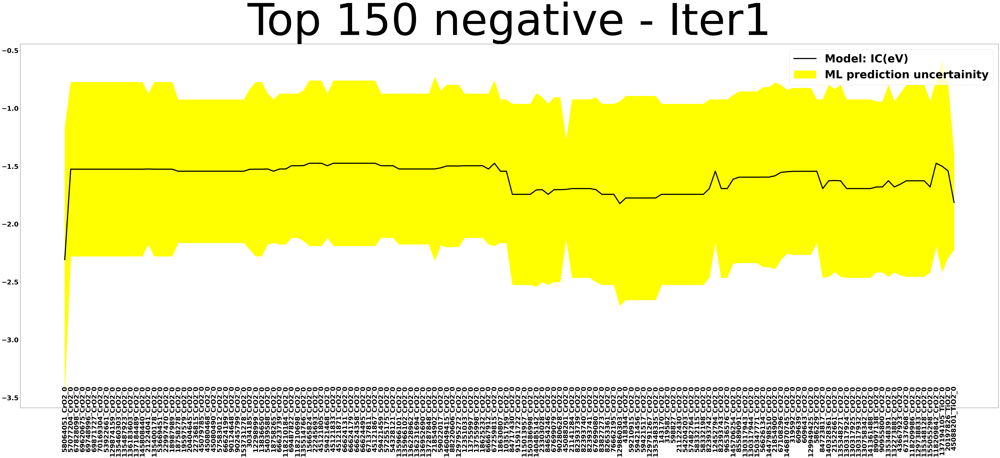

In [23]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-100)
plt.plot(THN.System[:150], THN.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THN.System[:150], THN.Mean[:150]-np.sqrt(THN.Variance[:150]), THN.Mean[:150]+np.sqrt(THN.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 negative - Iter1", fontsize = 200)
plt.show()

#f.savefig("Results_Code_1/THN_plot", dpi = 300, transparent = False, facecolor = 'white')

## 2) Top N uncertain - from Bootstrap

In [24]:
THU = ExploreSet.nlargest(150, ['Variance']).sort_values(by=['Name'])
THU_combos = THU[['CID', 'SMILES', 'Name']]
#THU_combos.to_csv('Results_Code_1/Top_150_uncertain_combos', index=False, sep=' ')
THU_combos

,CID,SMILES,Name
161381,129860303,C1=CSC2=NP=NN21,CrO2
14150,609639,C1=NC2=C(S1)N=C(N=C2Cl)Cl,CrO2
14171,609643,C1=C2C(=NC(=N1)Cl)SC(=N2)Cl,CrO2
162725,129949425,C1=C2C(=C(N=N1)Cl)SC(=N2)Cl,CrO2
96953,66221755,C1=C(N2C(=N1)SC(=N2)Br)Cl,CrO2
...,...,...,...
165455,130317932,C1=C2C(=C(C=N1)Br)SN=N2,CrO2
166148,130758342,C1=CN=C2C(=N1)N=C(S2)Br,CrO2
188786,141361488,C1=CN=C(C2=NSN=C21)Br,CrO2
31139,12298999,C1=NNC(=O)C2=C1N=NS2,CrO2


In [25]:
THU_molecules = THU[['CID','SMILES']].drop_duplicates()
#THU_molecules.to_csv('Results_Code_1/Top_150_uncertain_mols', index=False, sep=' ')
THU_molecules

,CID,SMILES
161381,129860303,C1=CSC2=NP=NN21
14150,609639,C1=NC2=C(S1)N=C(N=C2Cl)Cl
14171,609643,C1=C2C(=NC(=N1)Cl)SC(=N2)Cl
162725,129949425,C1=C2C(=C(N=N1)Cl)SC(=N2)Cl
96953,66221755,C1=C(N2C(=N1)SC(=N2)Br)Cl
...,...,...
165455,130317932,C1=C2C(=C(C=N1)Br)SN=N2
166148,130758342,C1=CN=C2C(=N1)N=C(S2)Br
188786,141361488,C1=CN=C(C2=NSN=C21)Br
31139,12298999,C1=NNC(=O)C2=C1N=NS2


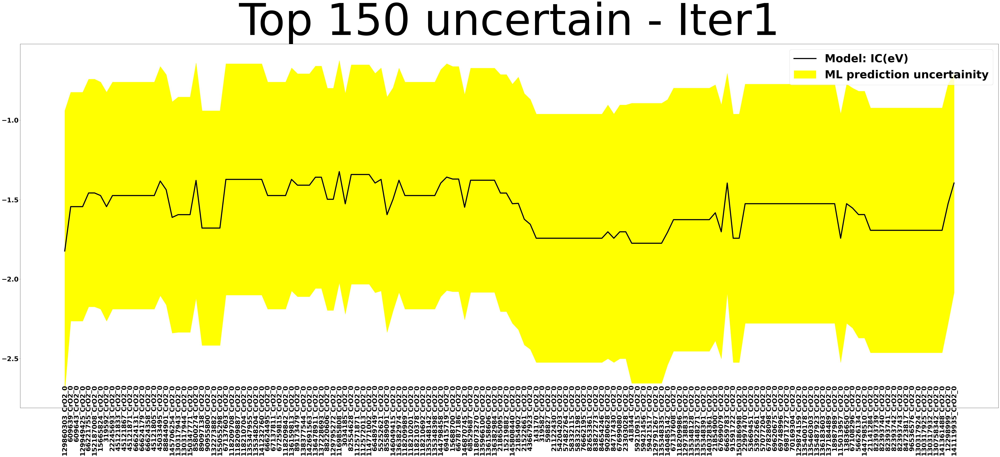

In [26]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 30))
ax.tick_params(axis="x",direction="in", pad=-105)
plt.plot(THU.System[:150], THU.Mean[:150], color = "black", label="Model: IC(eV)", linewidth=5)
plt.fill_between(THU.System[:150], THU.Mean[:150]-np.sqrt(THU.Variance[:150]), THU.Mean[:150]+np.sqrt(THU.Variance[:150]), color = "yellow",label="ML prediction uncertainity")

plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.plot([-3, 3], [-3, 3], 'k--')
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
plt.title("Top 150 uncertain - Iter1", fontsize = 200)
plt.show()

#f.savefig("Results_Code_1/THU_plot", dpi = 300, transparent = False, facecolor = 'white')

## Top N Negative: DFT vs Predicition

In [27]:
IC_3 = pd.read_csv('Results_Code_1/IC_THN_1.txt', delimiter =',')
Gas_3 = pd.read_csv('Results_Code_1/Gas_THN_1.txt', delimiter =',')
IC3 = IC_calculator.IC_calculator(IC_3, Gas_3, Bilayer)
IC3 = IC3.merge(ExploitSet, on=["System"], how = "left")
IC3['Error'] = IC3['Mean'] - IC3['IC_ENERGY']
IC3 = IC3[['System', 'IC_ENERGY', 'Variance', 'Mean', 'Error']].sort_values(by = "Error").dropna()
IC3

,System,IC_ENERGY,Variance,Mean,Error
131,82393740_CrO2_0,-0.153787,0.592650,-1.693170,-1.539383
137,84654246_CrO2_0,-0.272337,0.610501,-1.742987,-1.470650
103,59421456_CrO2_0,-0.314461,0.775951,-1.774568,-1.460107
123,67828098_CrO2_0,-0.112048,0.566015,-1.525718,-1.413670
134,82393743_CrO2_0,-0.327793,0.592650,-1.693170,-1.365377
...,...,...,...,...,...
81,45088201_CrO2_0,-2.065835,0.180318,-1.700590,0.365245
61,20197826_TiO2_0,-2.166214,0.561257,-1.540336,0.625878
97,58064051_CrO2_0,-3.177679,1.293748,-2.307108,0.870571
37,137194105_TiO2_0,-8.085629,0.833847,-1.500254,6.585375


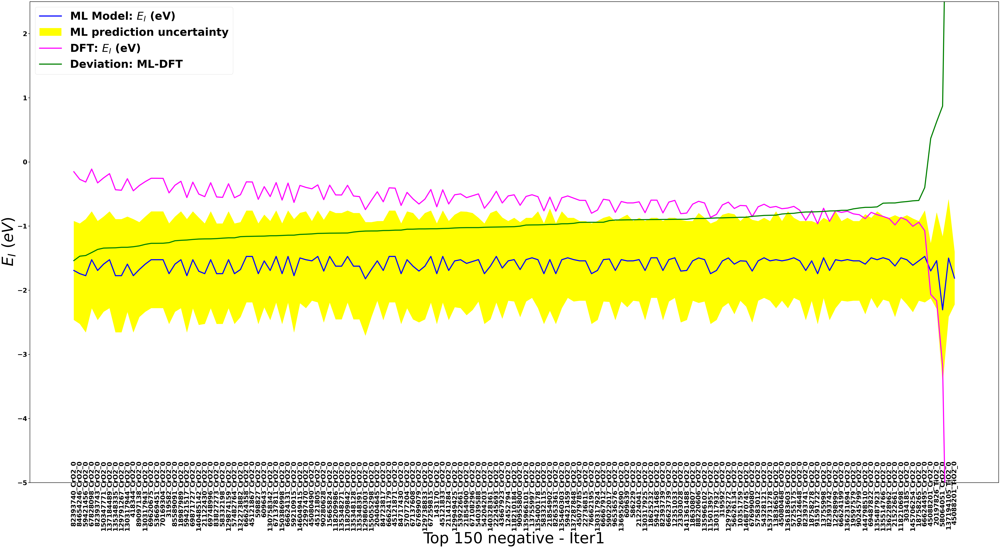

In [50]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 40))
ax.tick_params(axis="x",direction="in", pad=-100)
#label_mlr = "$R^2$ = %.2f" % r2_mean

# Increase axis font size
ax.tick_params(axis='both', labelsize=30)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)

plt.plot(IC3.System[:150], IC3.Mean[:150], color = "blue",label="ML Model: $E_I$ (eV)",linewidth=5)
plt.fill_between(IC3.System[:150], IC3.Mean[:150]-np.sqrt(IC3.Variance[:150]), IC3.Mean[:150]+np.sqrt(IC3.Variance[:150]), color = "yellow", label="ML prediction uncertainty")
plt.plot(IC3.System[:150], IC3.IC_ENERGY[:150], color = "magenta", label="DFT: $E_I$ (eV)", linewidth=5)
plt.plot(IC3.System[:150], IC3.Error[:150], color = "green", label="Deviation: ML-DFT",linewidth=5)
plt.ylabel(r"$E_{I}$ ($eV$)", fontsize = 70)
plt.xlabel("Top 150 negative - Iter1", fontsize = 70)
plt.legend(fontsize=50)
#plt.xlim([-3, 3])
plt.ylim([-5, 2.5])
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
#plt.title("Top 150 negative - Iter1", fontsize = 30)
plt.show()

 
#f.savefig("Results_Code_1/THN_with_DFT_plot", dpi = 300, transparent = False, facecolor = 'white')

In [29]:
IC3.describe()

,IC_ENERGY,Variance,Mean,Error
count,149.000000,149.000000,149.000000,149.000000
mean,-0.740059,0.539825,-1.599383,-0.859324
std,1.039060,0.131139,0.114411,1.021611
min,-10.087148,0.168115,-2.307108,-1.539383
25%,-0.751384,0.423433,-1.693170,-1.142686
50%,-0.598112,0.566015,-1.543310,-1.010751
75%,-0.466177,0.610501,-1.523982,-0.867742
max,-0.112048,1.293748,-1.474500,8.274801


## Top N Uncertain: DFT vs Prediction

In [30]:
IC_4 = pd.read_csv('Results_Code_1/IC_THU_1.txt', delimiter =',')
Gas_4 = pd.read_csv('Results_Code_1/Gas_THU_1.txt', delimiter =',')
IC4 = IC_calculator.IC_calculator(IC_4, Gas_4, Bilayer)
IC4 = IC4.merge(ExploitSet, on=["System"], how = "left")
#IC4['Error'] = IC4['IC_ENERGY'] - IC4['Mean']
IC4['Error'] = IC4['Mean'] - IC4['IC_ENERGY']
IC4 = IC4[['System', 'IC_ENERGY', 'Variance', 'Mean', 'Error']].sort_values(by = "Error").dropna()
IC4

,System,IC_ENERGY,Variance,Mean,Error
77,21865095_CrO2_0,0.222032,0.555872,-1.458820,-1.680852
67,15219882_CrO2_0,0.184807,0.555872,-1.458820,-1.643627
128,82393740_CrO2_0,-0.171035,0.592650,-1.693170,-1.522135
100,59421456_CrO2_0,-0.307312,0.775951,-1.774568,-1.467256
135,84654246_CrO2_0,-0.278155,0.610501,-1.742987,-1.464832
...,...,...,...,...,...
56,142691563_CrO2_0,-0.901972,0.491648,-1.409235,-0.507263
50,138377544_CrO2_0,-0.910973,0.491648,-1.409235,-0.498262
143,89173479_CrO2_0,-0.917547,0.491648,-1.409235,-0.491688
110,66624495_CrO2_0,-1.077508,0.509938,-1.474500,-0.396992


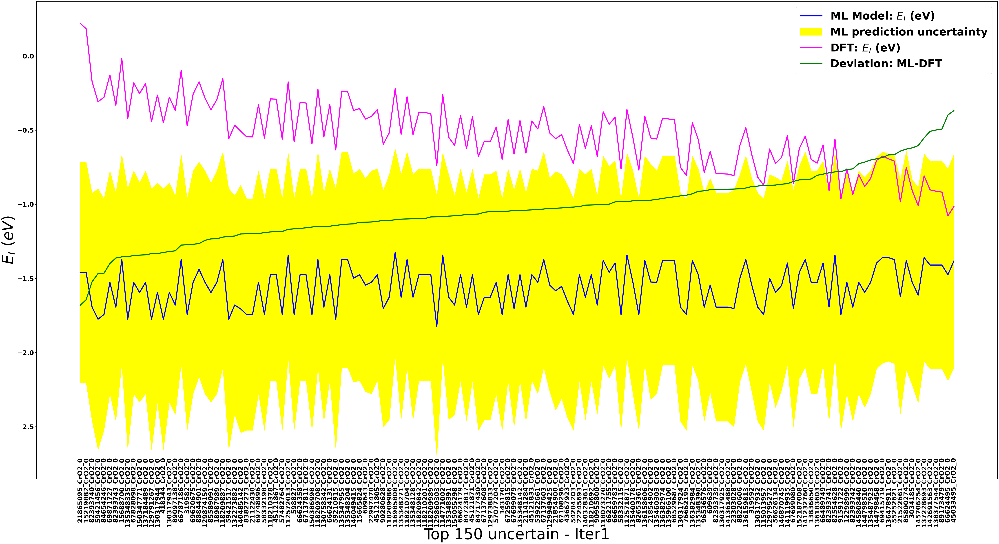

In [49]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 30}

mpl.rc('font', **font)

f, ax = plt.subplots(figsize=(80, 40))
ax.tick_params(axis="x",direction="in", pad=-100)

# Increase axis font size
ax.tick_params(axis='both', labelsize=30)

# Increase axis linewidth
ax.spines['top'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)

# Increase tick mark thickness and length
ax.tick_params(which='both', width=2, length=8)
#label_mlr = "$R^2$ = %.2f" % r2_mean

plt.plot(IC4.System[:150], IC4.Mean[:150], color = "blue",label="ML Model: $E_I$ (eV)",linewidth=5)
plt.fill_between(IC4.System[:150], IC4.Mean[:150]-np.sqrt(IC4.Variance[:150]), IC4.Mean[:150]+np.sqrt(IC4.Variance[:150]), color = "yellow", label="ML prediction uncertainty")
plt.plot(IC4.System[:150], IC4.IC_ENERGY[:150], color = "magenta", label="DFT: $E_I$ (eV)", linewidth=5)
plt.plot(IC4.System[:150], IC4.Error[:150], color = "green", label="Deviation: ML-DFT",linewidth=5)
plt.ylabel(r"$E_{I}$ ($eV$)", fontsize = 70)
plt.xlabel("Top 150 uncertain - Iter1", fontsize = 70)
plt.legend(fontsize=50)
#plt.xlim([-3, 3])
#plt.ylim([-3, 3])
#plt.yticks(rotation = 45) 
plt.xticks(rotation = 90) 
#plt.title("Top 150 uncertain - Iter1", fontsize = 200)
plt.show()
 
#f.savefig("Results_Code_1/THU_with_DFT_plot", dpi = 300, transparent = False, facecolor = 'white')

In [32]:
IC4.describe()

,IC_ENERGY,Variance,Mean,Error
count,148.000000,148.000000,148.000000,148.000000
mean,-0.526397,0.565390,-1.552573,-1.026176
std,0.236784,0.072597,0.136511,0.231915
min,-1.077508,0.475659,-1.823256,-1.680852
25%,-0.693405,0.509938,-1.693170,-1.162626
50%,-0.537331,0.551897,-1.525718,-1.040435
75%,-0.364629,0.610501,-1.458670,-0.896165
max,0.222032,0.780025,-1.323934,-0.367782


In [33]:
#THN.to_csv('THN_1iter.txt', index=False)

In [34]:
#ExploitSet.to_csv('ExploitSet_1iter.txt', index=False)